In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
import matplotlib.font_manager
from matplotlib import rcParams, cm
import scipy.stats as ss
import h5py
import glob
import seaborn as sns
import time
import os
import itertools
import timeit
import networkx as nx
import scipy.io
import random
from itertools import repeat
import numpy as np
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf
#import plotly.graph_objects as go 

#For ROI Maps
from scipy.io import loadmat
from skimage import measure
from scipy import ndimage
from scipy import signal
#For Fitting Baselines
from scipy.optimize import curve_fit
from sklearn.cluster import KMeans
import pywt # wavelet package
from scipy.signal import butter, lfilter, hilbert, cwt, morlet2, decimate, spectrogram, find_peaks
from matplotlib import rcParams, cm
plt.rcParams['svg.fonttype']='none'
matplotlib.rcParams['pdf.fonttype'] = 42
#plt.rcParams['pdf.fonttype']='none'
#from yellowbrick.cluster import KElbowVisualizer

## Load traces 

In [2]:
def makeFilenames(mouse_numbers, mouse_days):
    #Input lists of mouse numbers, days, and sessions to permute to give out directories and dictionary for filename
    directories = []
    filenames = {}
    for m_num in mouse_numbers:
        for m_day in mouse_days:
            mouse_dir = '{}/{}/{}_10Hz_AudioVisual/motion_corrected/'.format(m_num, m_day,m_num)
            directories.append(mouse_dir)
                #filenames[mouse_dir] = 'trace_kyleFinal_BinaryVideo.hdf5'
            filenames[mouse_dir] = 'processed_trace_final.h5'
    return directories, filenames

In [3]:
def makeFilenames_2(mouse_numbers, mouse_days):
    #Input lists of mouse numbers, days, and sessions to permute to give out directories and dictionary for filename
    directories = []
    filenames = {}
    for m_num in mouse_numbers:
        for m_day in mouse_days:
            mouse_dir = '{}/{}/10Hz/{}_10Hz_AudioVisual/motion_corrected/'.format(m_num, m_day,m_num)
            directories.append(mouse_dir)
                #filenames[mouse_dir] = 'trace_kyleFinal_BinaryVideo.hdf5'
            filenames[mouse_dir] = 'processed_trace_final.h5'
    return directories, filenames

In [4]:
def combineFilenames(base, dirs, fnDict):
    #Combine Filenames into list for multiple directories with a common base.  fnDict is a dictionary of the filename for each directory
    outFiles = []
    for d in dirs:
        outFiles.append(os.path.join(base+d+fnDict[d]))
    return outFiles

In [5]:
Base = "U:/eng_research_handata/eng_research_handata2/Sudi_Sridhar/"
Mice, Days = ([608448,608451,608452], ['01062020'])
Folders, Filenames = makeFilenames(Mice, Days)
Files1 = combineFilenames(Base, Folders, Filenames)
#Combine All Filenames into one List
Mice, Days = ([608450,611311,602101], ['03092020'])
Folders, Filenames = makeFilenames(Mice, Days)
Files2 = combineFilenames(Base, Folders, Filenames)
Mice, Days = ([608448], ['01172020'])
Folders, Filenames = makeFilenames(Mice, Days)
Files3 = combineFilenames(Base, Folders, Filenames)
Mice, Days = ([608451,608452,611111,602101,612535], ['07082020'])
Folders, Filenames = makeFilenames(Mice, Days)
Files4 = combineFilenames(Base, Folders, Filenames)
Mice, Days = ([615883], ['02052021','03122021'])
Folders, Filenames = makeFilenames_2(Mice, Days)
Files5 = combineFilenames(Base, Folders, Filenames)
Files= Files1+Files2+Files3+Files4+Files5

In [6]:
cd "U:/eng_research_handata/eng_research_handata2/Sudi_Sridhar/"

U:\eng_research_handata\eng_research_handata2\Sudi_Sridhar


In [7]:
f=h5py.File(Files[0], 'r')
f.keys()
f2=Files[0]
f2.split('/')[4]+'_'+f2.split('/')[5]

'608448_01062020'

In [8]:
def loadFiles(allFiles, fieldName,multiIndex):
    firstf = Files[0]
    firstdir = firstf.split('/')[4]+'_'+firstf.split('/')[5]
    f = h5py.File(firstf, 'r')
    if multiIndex: #Adjust indexing for first DataFrame if using a multi-index
        first_array = np.array(f[fieldName]).T
        index_iterables = [[firstdir], range(first_array.shape[1])]
        index = pd.MultiIndex.from_product(index_iterables, names=['mouse','cell_num'])
        df = pd.DataFrame(data=first_array, columns=index)
    else:
        df = pd.DataFrame(data=np.array(f[fieldName]).T, columns=[firstdir])
    df.index.name='Time'    

    df_size = df.shape[0] #Determine Size of DataFrame
    for f in Files[1:]: #Loop through remaining files and add to DataFrame
        fdir = f.split('/')[4]+'_'+f.split('/')[5] #Current Filename/Dir
        f = h5py.File(f, 'r')
        if multiIndex: #Iteratively add multiIndexed DataFrames
            data_arr = np.array(f[fieldName]).T
            index_iterables = [[fdir], range(data_arr.shape[1])]
            index = pd.MultiIndex.from_product(index_iterables, names=['mouse', 'cell_num'])
            df = df.join(pd.DataFrame(data=data_arr, columns=index))
    drop_index = df.index[df.isna().any(axis='columns')]
    df = df.drop(drop_index)
    df.drop(df.tail(1200).index,inplace = True)
    return df

In [9]:
processed_traces_df=loadFiles(Files, 'trace',True)
onset_binary_traces_df=loadFiles(Files, 'onset_binary_trace',True)
binary_traces_df=loadFiles(Files, 'binary_trace',True)

## Load Stim onsets and offsets 

In [10]:
def makeFilenames(mouse_numbers, mouse_days):
    #Input lists of mouse numbers, days, and sessions to permute to give out directories and dictionary for filename
    directories = []
    filenames = {}
    for m_num in mouse_numbers:
        for m_day in mouse_days:
            mouse_dir = '{}/{}/{}_10Hz_AudioVisual/motion_corrected/'.format(m_num, m_day,m_num)
            directories.append(mouse_dir)
                #filenames[mouse_dir] = 'trace_kyleFinal_BinaryVideo.hdf5'
            filenames[mouse_dir] = 'LFP_ts.h5'
    return directories, filenames
def makeFilenames_2(mouse_numbers, mouse_days):
    #Input lists of mouse numbers, days, and sessions to permute to give out directories and dictionary for filename
    directories = []
    filenames = {}
    for m_num in mouse_numbers:
        for m_day in mouse_days:
            mouse_dir = '{}/{}/10Hz/{}_10Hz_AudioVisual/motion_corrected/'.format(m_num, m_day,m_num)
            directories.append(mouse_dir)
                #filenames[mouse_dir] = 'trace_kyleFinal_BinaryVideo.hdf5'
            filenames[mouse_dir] = 'LFP_ts.h5'
    return directories, filenames
def combineFilenames(base, dirs, fnDict):
    #Combine Filenames into list for multiple directories with a common base.  fnDict is a dictionary of the filename for each directory
    outFiles = []
    for d in dirs:
        outFiles.append(os.path.join(base+d+fnDict[d]))
    return outFiles

Base = "U:/eng_research_handata/eng_research_handata2/Sudi_Sridhar/"
Mice, Days = ([608451,608452], ['01062020'])
Folders, Filenames = makeFilenames(Mice, Days)
Files1 = combineFilenames(Base, Folders, Filenames)
#Combine All Filenames into one List
Mice, Days = ([608450,611311,602101], ['03092020'])
Folders, Filenames = makeFilenames(Mice, Days)
Files2 = combineFilenames(Base, Folders, Filenames)
Mice, Days = ([608448], ['01172020'])
Folders, Filenames = makeFilenames(Mice, Days)
Files3 = combineFilenames(Base, Folders, Filenames)
Mice, Days = ([608451,608452,611111,602101,612535], ['07082020'])
Folders, Filenames = makeFilenames(Mice, Days)
Files4 = combineFilenames(Base, Folders, Filenames)
Mice, Days = ([615883], ['02052021','03122021'])
Folders, Filenames = makeFilenames_2(Mice, Days)
Files5 = combineFilenames(Base, Folders, Filenames)
LFP_Files= Files1+Files2+Files3+Files4+Files5

In [11]:
def load_onset_offset_2(files,fieldName):
    firstf = Files[0]
    
    firstdir = firstf.split('/')[4]+'_'+firstf.split('/')[5]
    f = h5py.File(firstf, 'r')
    data=np.array(f[fieldName])-1
    data=np.reshape(data,(1,5))
    df = pd.DataFrame(data)
    df.index=[firstdir]
   
    for f in files[0:]: #Loop through remaining files and add to DataFrame
        fdir = f.split('/')[4]+'_'+f.split('/')[5] #Current Filename/Dir
        f = h5py.File(f, 'r')
        data=np.array(f[fieldName])-1
        data=np.reshape(data,(1,5))
        df1 = pd.DataFrame(data)
        df1.index=[fdir]
        df = pd.concat([df,df1])
    df=df.astype(int)
    return df

In [12]:
stim_onsets_df=load_onset_offset_2(LFP_Files,'Stim_onset')
stim_offsets_df=load_onset_offset_2(LFP_Files,'Stim_offset')
stim_time=stim_offsets_df-stim_onsets_df+1
Total_frames_stim = pd.DataFrame(stim_time.sum(axis=1))

In [13]:
stim_onsets_df

,0,1,2,3,4
608448_01062020,7211,14414,21614,28812,36011
608451_01062020,7212,14414,21619,28817,36011
608452_01062020,7208,14417,21617,28815,36014
608450_03092020,7215,14413,21613,28811,36015
611311_03092020,7214,14416,21618,28814,36014
602101_03092020,7214,14416,21612,28806,36012
608448_01172020,7217,14417,21617,28817,36020
608451_07082020,7215,14409,21613,28811,36011
608452_07082020,7211,14407,21611,28807,36007
611111_07082020,7212,14416,21616,28812,36006


## Load motion

In [14]:
def makeFilenames_motion(mouse_numbers, mouse_days):
    #Input lists of mouse numbers, days, and sessions to permute to give out directories and dictionary for filename
    directories = []
    filenames = {}
    for m_num in mouse_numbers:
        for m_day in mouse_days:
            mouse_dir = '{}/{}/{}_10Hz_AudioVisual/motion_corrected/'.format(m_num, m_day,m_num)
            directories.append(mouse_dir)
                #filenames[mouse_dir] = 'trace_kyleFinal_BinaryVideo.hdf5'
            filenames[mouse_dir] = 'processed_motion.h5'
    return directories, filenames

def makeFilenames_motion_2(mouse_numbers, mouse_days):
    #Input lists of mouse numbers, days, and sessions to permute to give out directories and dictionary for filename
    directories = []
    filenames = {}
    for m_num in mouse_numbers:
        for m_day in mouse_days:
            mouse_dir = '{}/{}/10Hz/{}_10Hz_AudioVisual/motion_corrected/'.format(m_num, m_day,m_num)
            directories.append(mouse_dir)
                #filenames[mouse_dir] = 'trace_kyleFinal_BinaryVideo.hdf5'
            filenames[mouse_dir] = 'processed_motion.h5'
    return directories, filenames

Base = "U:/eng_research_handata/eng_research_handata2/Sudi_Sridhar/"
Mice, Days = ([608448,608451,608452], ['01062020'])
Folders, Filenames = makeFilenames_motion(Mice, Days)
Files1 = combineFilenames(Base, Folders, Filenames)
#Combine All Filenames into one List
Mice, Days = ([608450,611311,602101], ['03092020'])
Folders, Filenames = makeFilenames_motion(Mice, Days)
Files2 = combineFilenames(Base, Folders, Filenames)
Mice, Days = ([608448], ['01172020'])
Folders, Filenames = makeFilenames_motion(Mice, Days)
Files3 = combineFilenames(Base, Folders, Filenames)
Mice, Days = ([608451,608452,611111,602101,612535], ['07082020'])
Folders, Filenames = makeFilenames_motion(Mice, Days)
Files4 = combineFilenames(Base, Folders, Filenames)
Mice, Days = ([615883], ['02052021','03122021'])
Folders, Filenames = makeFilenames_motion_2(Mice, Days)
Files5 = combineFilenames(Base, Folders, Filenames)
motion_Files= Files1+Files2+Files3+Files4+Files5

In [15]:
def load_motion(Files,fieldName):
    firstf = Files[0]
    firstdir = firstf.split('/')[4]+'_'+firstf.split('/')[5]
    f = h5py.File(firstf, 'r')
    data=np.array(f[fieldName])
    df = pd.DataFrame(data)
    df.index=[firstdir]
   
    for f in Files[1:]: #Loop through remaining files and add to DataFrame
        fdir = f.split('/')[4]+'_'+f.split('/')[5] #Current Filename/Dir
        f = h5py.File(f, 'r')
        data=np.array(f[fieldName])
        df1 = pd.DataFrame(data)
        df1.index=[fdir]
        df = pd.concat([df,df1])
        #drop last minute
        df = df.iloc[: , :-1200]
    return df

In [16]:
def load_motion2(Files,fieldName):
    firstf = Files[0]
    firstdir = firstf.split('/')[4]+'_'+firstf.split('/')[5]
    f = h5py.File(firstf, 'r')
    data=np.array(f[fieldName])
    df = pd.DataFrame(data)
    df.index=[firstdir]
   
    for f in Files[1:]: #Loop through remaining files and add to DataFrame
        fdir = f.split('/')[4]+'_'+f.split('/')[5] #Current Filename/Dir
        f = h5py.File(f, 'r')
        data=np.array(f[fieldName])
        df1 = pd.DataFrame(data)
        df1.index=[fdir]
        df = pd.concat([df,df1])
        #drop last minute
        #df = df.iloc[: , :-1200]
    return df

In [17]:
firstf = motion_Files[0]
f = h5py.File(firstf, 'r')
print(f.keys())
print(np.array(f['low_speed_threshold']))
f.close()

<KeysViewHDF5 ['aceleration_period', 'deceleration_period', 'high_speed_threshold', 'low_speed_threshold', 'motion_onset_with', 'motion_onset_without', 'moving_ends', 'moving_period', 'moving_starts', 'raw_motion', 'raw_speed_trace', 'speed_trace', 'stationary_ends', 'stationary_period', 'stationary_starts', 'timestamp']>
[[0.5330226]]


In [18]:
raw_motion_df=load_motion(motion_Files,'raw_speed_trace')
motion_df=load_motion(motion_Files,'speed_trace')
moving_period_df=load_motion(motion_Files,'moving_period')
stationary_period_df=load_motion(motion_Files,'stationary_period')
acceleration_period_df=load_motion(motion_Files,'aceleration_period')
motion_onsets_df=load_motion(motion_Files,'motion_onset_with')
motion_onsets_df_without=load_motion(motion_Files,'motion_onset_without')
raw_motion_df2=load_motion(motion_Files,'raw_motion')

In [19]:
low_speed_thresholds= load_motion2(motion_Files,'low_speed_threshold')
low_speed_thresholds

,0
608448_01062020,0.533023
608451_01062020,0.578173
608452_01062020,0.918942
608450_03092020,0.493677
611311_03092020,0.503051
602101_03092020,0.486372
608448_01172020,0.969444
608451_07082020,0.324537
608452_07082020,0.760384
611111_07082020,0.673344


In [20]:
# Find a good way to store stim onsets and offsets 
def load_thresholds(Files,fieldName):
    firstf = Files[0]
    firstdir = firstf.split('/')[4]+'_'+firstf.split('/')[5]
    f = h5py.File(firstf, 'r')
    data=np.array(f[fieldName])
    df = pd.DataFrame(data.T)
    df.index=[firstdir]
   
    for f in Files[1:]: #Loop through remaining files and add to DataFrame
        fdir = f.split('/')[4]+'_'+f.split('/')[5] #Current Filename/Dir
        f = h5py.File(f, 'r')
        data=np.array(f[fieldName])
        df1 = pd.DataFrame(data.T)
        df1.index=[fdir]
        df = pd.concat([df,df1])
    #df=df.astype(int)
    return df

In [21]:
low_speed_threshold_df=load_thresholds(motion_Files,'low_speed_threshold')
high_speed_threshold_df=load_thresholds(motion_Files,'high_speed_threshold')

In [22]:
low_speed_threshold_10Hz=np.squeeze(low_speed_threshold_df.to_numpy())
low_speed_threshold_145Hz=np.array([[0.54324324],
       [0.52249267],
       [0.72372522],
       [1.15126287],
       [2.5       ],
       [1.64634748],
       [0.50649809],
       [0.4148294 ],
       [0.53608174],
       [0.74022727],
       [0.53480567],
       [0.53280882],
       [1.04295764],
       [1.13623491]])
low_speed_threshold_145Hz=np.delete(low_speed_threshold_145Hz,[0,10])
low_speed_threshold=np.concatenate((low_speed_threshold_10Hz,low_speed_threshold_145Hz))
np.min(low_speed_threshold),np.max(low_speed_threshold)

(0.3245373063884007, 2.5)

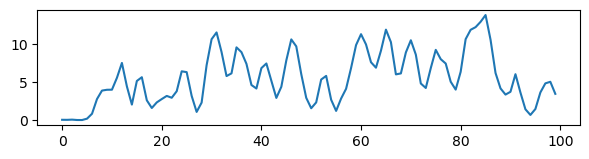

In [23]:
sess_list=[]
for mouse, cell_df in binary_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)
len(sess_list)
sess_name=sess_list[4]
stim_on_inds=stim_onsets_df.loc[sess_name,:]
stim_off_inds=stim_offsets_df.loc[sess_name,:]
processed_motion=raw_motion_df.loc[sess_name,:]
motion=np.array(processed_motion)
f, ax1 = plt.subplots(1, 1,figsize=(7,1.5))
ax1.plot(motion[stim_on_inds[1]:stim_on_inds[1]+100])
#plt.savefig('delta_speed.svg',bbox_inches='tight',png=1200)

## Architecture of speed bouts 

### One session

In [24]:
def get_stim_frames_index(sess_no):
    stim_on_inds=stim_onsets_df.loc[sess_no,:]
    stim_off_inds=stim_offsets_df.loc[sess_no,:]
    stim_indices=np.arange(stim_on_inds[0],stim_off_inds[0]+1,1)
    for i in np.arange(1,5,1):
        b=np.arange(stim_on_inds[i],stim_off_inds[i]+1,1)
        stim_indices=np.concatenate((stim_indices,b))
    return stim_indices

In [25]:
# Exclude the min after stim
def get_baseline_frames_index(sess_no):
    stim_on_inds=stim_onsets_df.loc[sess_no,:]
    stim_off_inds=stim_offsets_df.loc[sess_no,:]

    baseline_indices=np.arange(0,stim_on_inds[0])
    for i in np.arange(0,4,1):
        b=np.arange(stim_off_inds[i]+1200,stim_on_inds[i+1])
        baseline_indices=np.concatenate((baseline_indices,b))
    b= np.arange(stim_off_inds[4]+1200,42000,1)
    baseline_indices=np.concatenate((baseline_indices,b))
    return baseline_indices

In [26]:
def remove_nan_motion_frames(sess_name):
    motion=np.array(motion_df.loc[sess_name,:])
    motion=np.squeeze(motion)
    nan_motion_frames=np.argwhere(np.isnan(motion))
    baseline_indices=get_baseline_frames_index(sess_name)
    c=np.intersect1d(baseline_indices,nan_motion_frames)
    common_indices=np.setdiff1d(baseline_indices,c)
    return common_indices

In [120]:
sess_name='608452_01062020'
motion=np.array(motion_df.loc[sess_name,:])
motion=np.squeeze(motion)
nan_motion_frames=np.argwhere(np.isnan(motion))
baseline_indices=get_baseline_frames_index(sess_name)
c=np.intersect1d(baseline_indices,nan_motion_frames)
bs_indices=np.setdiff1d(baseline_indices,c)
stim_indices=get_stim_frames_index(sess_name)
a=moving_period_df.loc[sess_name]
moving_frames= np.where(a==1)[0]
high_speed_index = np.intersect1d(bs_indices,moving_frames)
speed_bs=motion[high_speed_index]
print(np.mean(speed_bs),np.std(speed_bs),np.median(speed_bs), np.min(speed_bs),np.max(speed_bs))
speed_all=motion[moving_frames]
print(np.mean(speed_all),np.std(speed_all),np.median(speed_all),np.min(speed_all),np.max(speed_all))

17.05110694691236 8.272300610167852 18.353809929827342 1.1336683630556386 38.62578919927123
16.54425571989717 7.686519045086575 17.423932543358227 1.1336683630556386 38.62578919927123


<Axes: ylabel='Count'>

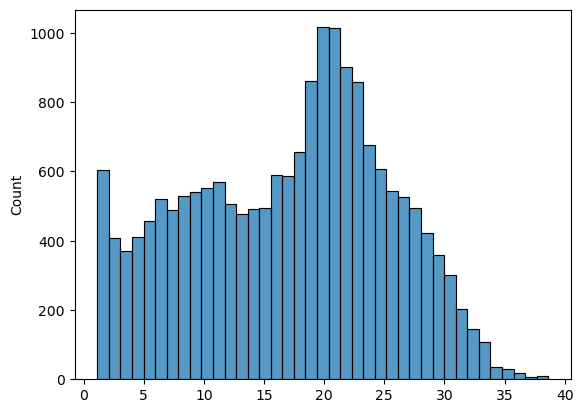

In [29]:
sns.histplot(speed_bs)

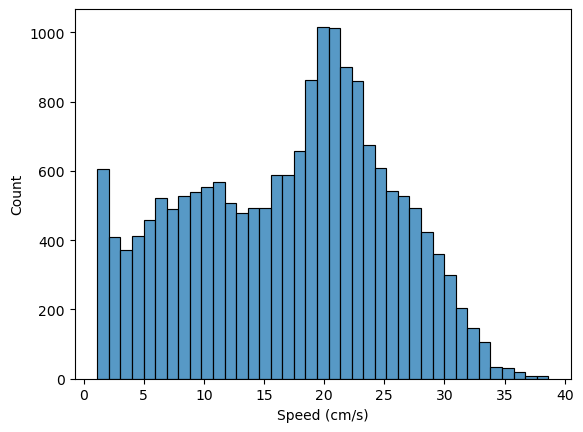

In [30]:
sns.histplot(speed_bs)
plt.xlabel('Speed (cm/s)')
plt.savefig('Speed_distribution_one_session.svg')

### Across all sessions 

In [31]:
## Take mean across a session and then mean across sessions 

In [32]:
## Take mean across a session and then mean across sessions 
mean_speed_bs=np.zeros(len(sess_list))
mean_speed_stim=np.zeros(len(sess_list))
mean_speed_all=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    sess_name=sess_list[i]
    motion=np.array(motion_df.loc[sess_name,:])
    motion=np.squeeze(motion)
    nan_motion_frames=np.argwhere(np.isnan(motion))
    baseline_indices=get_baseline_frames_index(sess_name)
    c=np.intersect1d(baseline_indices,nan_motion_frames)
    bs_indices=np.setdiff1d(baseline_indices,c)
    stim_indices=get_stim_frames_index(sess_name)
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index = np.intersect1d(bs_indices,moving_frames)
    high_speed_index_stim = np.intersect1d(stim_indices,moving_frames)
    speed_bs=motion[high_speed_index]
    speed_stim=motion[high_speed_index]
    mean_speed_bs[i]=np.nanmean(speed_bs)
    mean_speed_stim[i]=np.nanmean(speed_stim)
    #print(np.nanmean(speed_bs),np.nanstd(speed_bs),np.nanmedian(speed_bs), np.nanmin(speed_bs),np.nanmax(speed_bs))
    speed_all=motion[moving_frames]
    mean_speed_all[i]=np.nanmean(speed_all)
    #print(np.nanmean(speed_all),np.nanstd(speed_all),np.nanmedian(speed_all),np.nanmin(speed_all),np.nanmax(speed_all))

In [33]:
print(np.mean(mean_speed_bs),np.std(mean_speed_bs))
print(np.mean(mean_speed_all),np.std(mean_speed_all))

13.840925666261336 6.666417563866692
13.967769976099975 6.269864227049661


In [34]:
## Concatenate across sessions to calculate measures 
mean_speed_bs=np.zeros(len(sess_list))
mean_speed_stim=np.zeros(len(sess_list))
mean_speed_all=np.zeros(len(sess_list))
speed_bs=[]
speed_all=[]
for i in np.arange(0,len(sess_list),1):
    sess_name=sess_list[i]
    motion=np.array(motion_df.loc[sess_name,:])
    motion=np.squeeze(motion)
    nan_motion_frames=np.argwhere(np.isnan(motion))
    baseline_indices=get_baseline_frames_index(sess_name)
    c=np.intersect1d(baseline_indices,nan_motion_frames)
    bs_indices=np.setdiff1d(baseline_indices,c)
    stim_indices=get_stim_frames_index(sess_name)
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index = np.intersect1d(bs_indices,moving_frames)
    z1=motion[high_speed_index]
    speed_bs=np.concatenate((speed_bs,z1))
    z2=motion[moving_frames]
    speed_all=np.concatenate((speed_all,z2))

In [35]:
print(np.nanmean(speed_bs),np.nanstd(speed_bs),np.nanmedian(speed_bs), np.nanmin(speed_bs),np.nanmax(speed_bs))

15.667632208617572 10.329630239528418 14.187428678320837 0.48152970131480677 58.63335990867748


In [36]:
print(np.nanmean(speed_all),np.nanstd(speed_all),np.nanmedian(speed_all),np.nanmin(speed_all),np.nanmax(speed_all))

15.399129508993992 10.023060367508776 13.904210743934094 0.4442074326852838 61.25087287475943


C:\Users\sudiksha\AppData\Local\Temp\ipykernel_20012\4112320541.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(speed_bs)


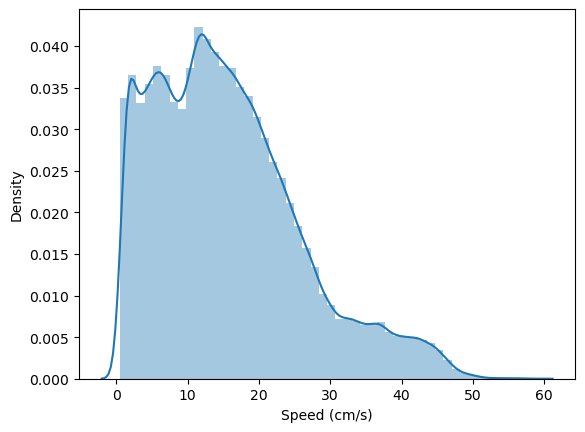

In [38]:
sns.distplot(speed_bs)
plt.xlabel('Speed (cm/s)')
plt.savefig('Speed_distribution.svg')

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


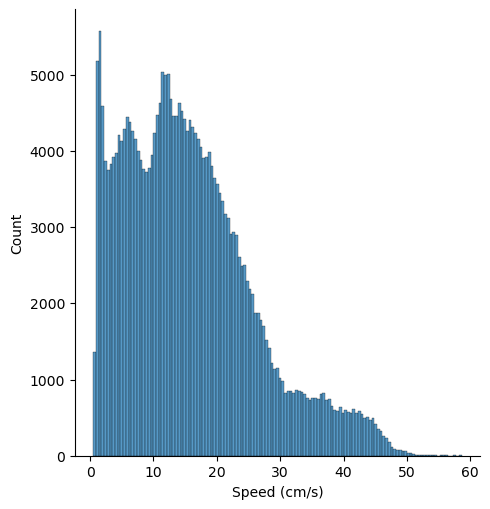

In [39]:
sns.displot(speed_bs)
plt.xlabel('Speed (cm/s)')
plt.savefig('Speed_distribution2.svg')

In [40]:
## Concatenate across sessions to calculate measures in stim
mean_speed_bs=np.zeros(len(sess_list))
mean_speed_stim=np.zeros(len(sess_list))
mean_speed_all=np.zeros(len(sess_list))
speed_bs=[]
speed_all=[]
for i in np.arange(0,len(sess_list),1):
    sess_name=sess_list[i]
    motion=np.array(motion_df.loc[sess_name,:])
    motion=np.squeeze(motion)
    nan_motion_frames=np.argwhere(np.isnan(motion))
    stim_indices=get_stim_frames_index(sess_name)
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index = np.intersect1d(stim_indices,moving_frames)
    z1=motion[high_speed_index]
    speed_bs=np.concatenate((speed_bs,z1))
    z2=motion[moving_frames]
    speed_all=np.concatenate((speed_all,z2))

In [41]:
print(np.nanmean(speed_bs),np.nanstd(speed_bs),np.nanmedian(speed_bs), np.nanmin(speed_bs),np.nanmax(speed_bs))

14.641399301950358 8.491358966857524 13.516131979334514 0.5437529574973231 54.983750783234214


## Bout durations

In [40]:
data = [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0]
diffs=np.diff(data)
starts = np.argwhere(diffs == 1)
stops = np.argwhere(diffs == -1)
starts=starts+1
stops=stops+1
duration=np.zeros(np.size(starts))
for i in np.arange(0,np.size(starts),1):
    duration[i] = stops[i]-starts[i]
duration

array([1., 2., 4., 6.])

In [41]:
sess_name='608450_03092020'
a=moving_period_df.loc[sess_name]
# Find islands of ones - duration 
indices=np.arange(0,42000,1)
motion=np.array(motion_df.loc[sess_name,:])
motion=np.squeeze(motion)
nan_motion_frames=np.argwhere(np.isnan(motion))
baseline_indices=get_baseline_frames_index(sess_name)
indices=np.setdiff1d(indices,nan_motion_frames)
#moving_frames= np.where(a==1)[0]
a=a[indices]
a=list(a)
diffs=np.diff(a)
starts = np.argwhere(diffs == 1)
stops = np.argwhere(diffs == -1)
starts=starts+1
stops=stops+1
duration=np.zeros(np.size(starts))
stops=np.squeeze(stops)
if np.size(stops)<np.size(starts):
    stops= np.append(stops,indices[-1])

if np.size(starts)<np.size(stops):
    starts= np.append(starts,0)
    
for i in np.arange(0,np.size(starts),1):
    duration[i] = stops[i]-starts[i]
duration

array([  77.,  191.,   69.,   58.,   97.,   62.,   76.,   47.,   90.,
         91.,   41.,  122.,  182.,  286.,  116.,   56.,   81.,   54.,
         43.,   63.,   69.,   41.,  567.,  640.,  126.,   54.,   56.,
        153.,   51.,   73.,   43.,   81.,   75.,   57.,  418.,   42.,
         69.,   91.,  117.,  425.,  217.,  517.,  509.,  184.,   89.,
         79.,   90.,  132.,   41.,   47.,  161.,   76.,  173.,   54.,
         60.,   49.,  101.,  118.,   85.,   50.,  199.,   96.,   64.,
         74.,   67.,   63.,  186.,   62.,   84.,   73.,   83.,  139.,
         53.,  197.,  220.,   94.,   76.,  274.,   50.,   54.,  117.,
         83.,   42.,  135.,   43.,  285.,   52.,   71.,   55.,  212.,
         73.,   72.,   53.,   95.,  464.,  134.,  251.,  160.,  166.,
         75.,  542.,   61.,   98.,  223.,  205., 1244.,  118.,  119.,
        239.,   45.,  144.,   46.,  312.,   79.,   59.,  165.])

In [44]:
def get_duration_bouts(a):
    a=list(a)
    diffs=np.diff(a)
    indices=np.arange(0,np.size(a),1)
    starts = np.argwhere(diffs == 1)
    stops = np.argwhere(diffs == -1)
    starts=starts+1
    stops=stops+1
    stops=np.squeeze(stops)


    if np.size(starts)==0 and np.size(np.argwhere(np.array(a)==1))==0:
        #print('yes1')
        duration_bouts=0
        
    elif np.size(starts)==0 and np.size(np.argwhere(np.array(a)==0))==0:
        #print('yes2')
        duration_bouts=len(indices)
    
    elif np.size(starts)==1 and np.size(stops)==1 and stops>starts:
        #print('yes3')
        duration_bouts = stops-starts
    
    elif np.size(starts)==1 and np.size(stops)==1 and stops<starts:
        #print('yes4')
        starts= np.append(0,starts)
        stops= np.append(stops,indices[-1])
        duration_bouts=np.zeros(np.size(starts))
        for i in np.arange(0,np.size(starts),1):
            duration_bouts[i] = stops[i]-starts[i]
            
        
    elif np.size(stops)<np.size(starts):
        #print('yes5')
        stops= np.append(stops,indices[-1])
        duration_bouts=np.zeros(np.size(starts))
        for i in np.arange(0,np.size(starts),1):
            duration_bouts[i] = stops[i]-starts[i]
            
    elif np.size(starts)<np.size(stops):
        #print('yes6')
        starts= np.append(0,starts)
        duration_bouts=np.zeros(np.size(starts))
        if np.size(starts)==1:
            duration_bouts = stops-starts
        else:
            for i in np.arange(0,np.size(starts),1):
                duration_bouts[i] = stops[i]-starts[i]
            
    elif np.size(starts)>1 and stops[0]<starts[0]:
        #print('yes7')
        starts= np.append(0,starts)
        stops= np.append(stops,indices[-1])
        duration_bouts=np.zeros(np.size(starts))
        for i in np.arange(0,np.size(starts),1):
            duration_bouts[i] = stops[i]-starts[i]
            

    else:
        #print('yes8')
        duration_bouts=np.zeros(np.size(starts))
        for i in np.arange(0,np.size(starts),1):
            duration_bouts[i] = stops[i]-starts[i]
    
    idx=np.argwhere(duration_bouts<40)
    duration_bouts=np.delete(duration_bouts,idx)

    return duration_bouts/20

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


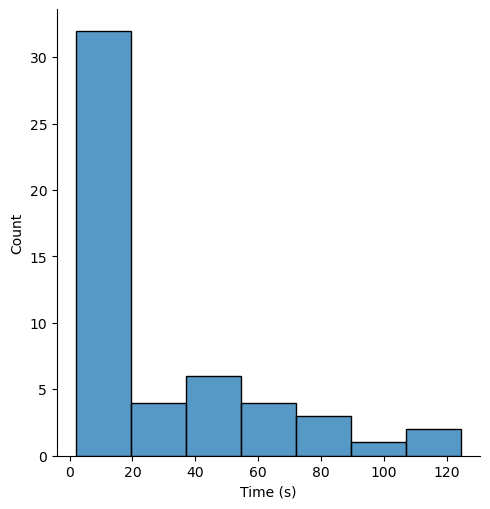

In [45]:
sess_name='608452_01062020'
a=moving_period_df.loc[sess_name]
# Find islands of ones - duration 
indices=np.arange(0,42000,1)
motion=np.array(motion_df.loc[sess_name,:])
motion=np.squeeze(motion)
nan_motion_frames=np.argwhere(np.isnan(motion))
indices=np.setdiff1d(indices,nan_motion_frames)
#moving_frames= np.where(a==1)[0]
a=a[indices]
sns.displot(get_duration_bouts(a))
plt.xlabel('Time (s)')
plt.savefig('locomotion_bout_durations_all_periods.svg',dpi=1200)

In [46]:
np.min(get_duration_bouts(a))

2.1

### Bout durations in stimulation

In [47]:
def get_bout_durations_stim(sess_name):
    a=moving_period_df.loc[sess_name]
    stim_on_inds=stim_onsets_df.loc[sess_name,:]
    stim_off_inds=stim_offsets_df.loc[sess_name,:]
    stim_indices=np.arange(stim_on_inds[0],stim_off_inds[0]+1,1)
    stim=a[stim_indices]
    bout_durations=get_duration_bouts(stim)
    if np.size(bout_durations)==1:
        bout_durations=bout_durations
    else:
        bout_durations=bout_durations.reshape(np.size(bout_durations),1)
    #print(bout_durations)
    for i in np.arange(1,5,1):
        #print(i)
        stim_indices=np.arange(stim_on_inds[i],stim_off_inds[i]+1,1)
        stim=a[stim_indices]
        b=get_duration_bouts(stim)
        #print(b)
        if np.size(b)==1 and b==0:
            bout_durations=bout_durations
        elif np.size(b)==1 and b>0:
            bout_durations=np.append(bout_durations,b)
            bout_durations=bout_durations.reshape(np.size(bout_durations),1)
        elif np.size(bout_durations)==1:
            bout_durations=np.append(bout_durations,b)
            bout_durations=bout_durations.reshape(np.size(bout_durations),1)
        else:
            b=b.reshape(np.size(b),1)
            bout_durations=np.concatenate((bout_durations,b))
            bout_durations=bout_durations.reshape(np.size(bout_durations),1)
    
    return bout_durations

In [48]:
get_bout_durations_stim('608452_01062020')

array([[ 2.25],
       [50.15],
       [59.95],
       [59.85],
       [32.3 ],
       [26.35],
       [60.05]])

In [216]:
get_bout_durations_stim('608450_03092020')

array([[28.35],
       [30.2 ],
       [10.85],
       [25.85],
       [19.4 ],
       [ 3.15],
       [ 3.15],
       [ 9.3 ],
       [ 3.1 ],
       [ 4.2 ],
       [ 3.65],
       [ 2.15],
       [14.25],
       [ 2.6 ],
       [ 3.55],
       [ 2.75],
       [ 3.75],
       [27.1 ],
       [ 3.05],
       [ 4.9 ],
       [ 3.75]])

In [217]:
sess_name='608452_01062020'
a=moving_period_df.loc[sess_name]
stim_indices=get_stim_frames_index(sess_name)
stim=a[stim_indices]
get_duration_bouts(stim)

array([  2.25, 202.3 ,  86.4 ])

In [218]:
sess_name=sess_list[2]
print(sess_name)
a=moving_period_df.loc[sess_name]
stim_on_inds=stim_onsets_df.loc[sess_name,:]
stim_off_inds=stim_offsets_df.loc[sess_name,:]
stim_indices=np.arange(stim_on_inds[0],stim_off_inds[0]+1,1)
stim=a[stim_indices]
bout_durations=get_duration_bouts(stim)
if np.size(bout_durations)==1:
        bout_durations=bout_durations
else:
    bout_durations=bout_durations.reshape(np.size(bout_durations),1)
print(bout_durations)
for i in np.arange(1,5,1):
    print(i)
    stim_indices=np.arange(stim_on_inds[i],stim_off_inds[i]+1,1)
    stim=a[stim_indices]
    b=get_duration_bouts(stim)
    #print(b)
    if np.size(b)==1 and b==0:
        bout_durations=bout_durations
        
    elif np.size(b)==1 and b>0:
        bout_durations=np.append(bout_durations,b)
        bout_durations=bout_durations.reshape(np.size(bout_durations),1)
    elif np.size(bout_durations)==1:
        bout_durations=np.append(bout_durations,b)
        bout_durations=bout_durations.reshape(np.size(bout_durations),1)
    else:
        b=b.reshape(np.size(b),1)
        bout_durations=np.concatenate((bout_durations,b))
        bout_durations=bout_durations.reshape(np.size(bout_durations),1)
    print(bout_durations)

608448_01062020
[56.3]
1
[[56.3 ]
 [27.75]
 [22.15]
 [ 4.4 ]]
2
[[56.3 ]
 [27.75]
 [22.15]
 [ 4.4 ]
 [53.85]]
3
[[56.3 ]
 [27.75]
 [22.15]
 [ 4.4 ]
 [53.85]
 [27.4 ]
 [31.7 ]]
4
[[56.3 ]
 [27.75]
 [22.15]
 [ 4.4 ]
 [53.85]
 [27.4 ]
 [31.7 ]]


In [219]:
stim_indices=np.arange(stim_on_inds[4],stim_off_inds[4]+1,1)
stim=a[stim_indices]
a=list(stim)
diffs=np.diff(a)
indices=np.arange(0,np.size(a),1)
starts = np.argwhere(diffs == 1)
stops = np.argwhere(diffs == -1)
starts=starts+1
stops=stops+1
stops=np.squeeze(stops)
print(starts,stops)

if np.size(starts)==0 and np.size(np.argwhere(np.array(a)==1))==0:
    print('yes1')
    duration_bouts=0
        
elif np.size(starts)==0 and np.size(np.argwhere(np.array(a)==0))==0:
    print('yes2')
    duration_bouts=len(indices)
    
    
elif np.size(starts)==1 and  np.size(stops)==1 and stops>starts:
    duration_bouts = stops-starts
elif np.size(starts)==1 and np.size(stops)==1 and stops<starts:
    starts= np.append(0,starts)
    stops= np.append(stops,indices[-1])
    duration_bouts=np.zeros(np.size(starts))
    for i in np.arange(0,np.size(starts),1):
        duration_bouts[i] = stops[i]-starts[i]
        
elif np.size(stops)<np.size(starts):
    stops= np.append(stops,indices[-1])
    duration_bouts=np.zeros(np.size(starts))
    for i in np.arange(0,np.size(starts),1):
        duration_bouts[i] = stops[i]-starts[i]
            
elif np.size(starts)<np.size(stops):
    starts= np.append(0,starts)
    duration_bouts=np.zeros(np.size(starts))
    for i in np.arange(0,np.size(starts),1):
        duration_bouts[i] = stops[i]-starts[i]
    
elif stops[0]<starts[0]:
    starts= np.append(0,starts)
    stops= np.append(stops,indices[-1])
    duration_bouts=np.zeros(np.size(starts))
    for i in np.arange(0,np.size(starts),1):
        duration_bouts[i] = stops[i]-starts[i]
else:
    duration_bouts=np.zeros(np.size(starts))
    for i in np.arange(0,np.size(starts),1):
        duration_bouts[i] = stops[i]-starts[i]
duration_bouts

[] []
yes1


0

### Bout durations in baseline 

In [221]:
sess_name=sess_list[2]
print(sess_name)
a=moving_period_df.loc[sess_name]

stim_on_inds=stim_onsets_df.loc[sess_name,:]
stim_off_inds=stim_offsets_df.loc[sess_name,:]

baseline_indices=np.arange(0,stim_on_inds[0])
bs=a[baseline_indices]
bout_durations=get_duration_bouts(bs)

for i in np.arange(0,4,1):
    baseline_indices=np.arange(stim_off_inds[i]+1200,stim_on_inds[i+1])
    bs=a[baseline_indices]
    b=get_duration_bouts(bs)
    bout_durations=np.concatenate((bout_durations,b))

baseline_indices= np.arange(stim_off_inds[4]+1200,42000,1)
bs=a[baseline_indices]
b=get_duration_bouts(bs)
bout_durations=np.concatenate((bout_durations,b))
bout_durations

608448_01062020


array([ 32.5 ,  83.8 ,   3.2 ,  18.8 ,  50.65,  45.75,  60.55,  26.4 ,
        18.25,   8.15,  20.25,  60.45,  10.55,   4.8 ,  13.15,  11.7 ,
        35.2 ,   3.2 ,  45.75, 181.85,  45.45,   3.7 ,  47.25,   6.25,
        31.95,  21.9 ,   8.5 ,   2.15,   9.55,   4.5 ,  61.65,   6.55,
        32.05,   6.9 ,   4.8 ,   3.9 ,   5.1 , 146.75])

In [222]:
sess_name=sess_list[1]

a=moving_period_df.loc[sess_name]
stim_on_inds=stim_onsets_df.loc[sess_name,:]
stim_off_inds=stim_offsets_df.loc[sess_name,:]
stim_indices=np.arange(stim_on_inds[0],stim_off_inds[0]+1,1)
stim=a[stim_indices]
bout_durations=get_duration_bouts(stim)
bout_durations=bout_durations.reshape(np.size(bout_durations),1)
for i in np.arange(1,5,1):
    print(i)
    stim_indices=np.arange(stim_on_inds[i],stim_off_inds[i]+1,1)
    stim=a[stim_indices]
    b=get_duration_bouts(stim)
    if np.size(b)==1:
        bout_durations=bout_durations
    else:
        b=b.reshape(np.size(b),1)

        bout_durations=np.concatenate((bout_durations,b))
        bout_durations=bout_durations.reshape(np.size(bout_durations),1)


1
2
3
4


In [49]:
def get_bout_durations_baseline(sess_name):
    a=moving_period_df.loc[sess_name]
    motion=np.array(motion_df.loc[sess_name,:])
    motion=np.squeeze(motion)
    nan_motion_frames=np.argwhere(np.isnan(motion))
    motion_recording_start=nan_motion_frames[-1]
    stim_on_inds=stim_onsets_df.loc[sess_name,:]
    stim_off_inds=stim_offsets_df.loc[sess_name,:]

    baseline_indices=np.arange(motion_recording_start,stim_on_inds[0])
    bs=a[baseline_indices]
    bout_durations=get_duration_bouts(bs)
    bout_durations=bout_durations.reshape(np.size(bout_durations),1)
    for i in np.arange(0,4,1):
        baseline_indices=np.arange(stim_off_inds[i]+1200,stim_on_inds[i+1])
        bs=a[baseline_indices]
        b=get_duration_bouts(bs)
        if np.size(b)==1:
            bout_durations=bout_durations
        else:
            b=b.reshape(np.size(b),1)
            bout_durations=np.concatenate((bout_durations,b))
        bout_durations=bout_durations.reshape(np.size(bout_durations),1)

    baseline_indices= np.arange(stim_off_inds[4]+1200,42000,1)
    bs=a[baseline_indices]
    b=get_duration_bouts(bs)
    if np.size(b)==1:
        bout_durations=bout_durations
    else:
        b=b.reshape(np.size(b),1)
        bout_durations=np.concatenate((bout_durations,b))
    return bout_durations

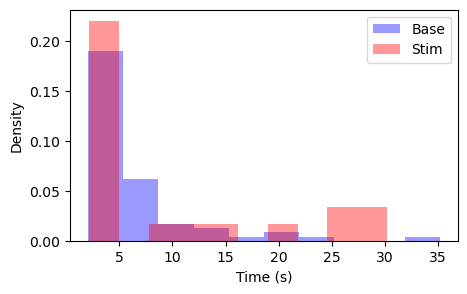

In [303]:
fig, ax = plt.subplots(1, 1,figsize=(5,3))
plt.hist(get_bout_durations_baseline('608450_03092020'),density=True,color='blue',alpha=0.4)
plt.hist(get_bout_durations_stim('608450_03092020'),density=True,color='red',alpha=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Density')
plt.legend({'Base','Stim'},fontsize=10,loc='upper right')
plt.savefig('locomotion_bout_durations_bs_vs_stim_periods.svg',bbox_inches='tight',dpi=1200)

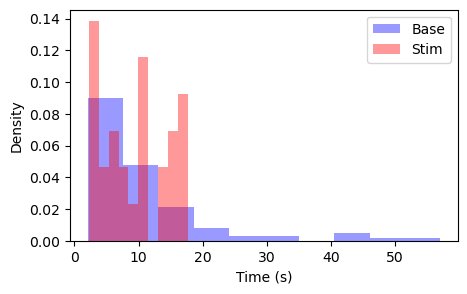

In [304]:
fig, ax = plt.subplots(1, 1,figsize=(5,3))
plt.hist(get_bout_durations_baseline('608452_07082020'),density=True,color='blue',alpha=0.4)
plt.hist(get_bout_durations_stim('608452_07082020'),density=True,color='red',alpha=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Density')
plt.legend({'Base','Stim'},fontsize=10,loc='upper right')
plt.savefig('locomotion_bout_durations_bs_vs_stim_periods2.svg',bbox_inches='tight',dpi=1200)

In [225]:
np.min(get_bout_durations_baseline('608450_03092020')),np.min(get_bout_durations_stim('608450_03092020'))

(2.05, 2.15)

In [227]:
i=1
baseline_indices=np.arange(stim_off_inds[i]+1200,stim_on_inds[i+1])
bs=a[baseline_indices]

a=list(bs)
diffs=np.diff(a)
indices=np.arange(0,np.size(a),1)
starts = np.argwhere(diffs == 1)
stops = np.argwhere(diffs == -1)
starts=starts+1
stops=stops+1
stops=np.squeeze(stops)

if np.size(starts)==0 and np.size(np.argwhere(np.array(a)==1))==0:
    print('yes1')
    duration_bouts=0
        
elif np.size(starts)==0 and np.size(np.argwhere(np.array(a)==0))==0:
    print('yes2')
    duration_bouts=len(indices)
    
elif np.size(starts)==1 and np.size(stops)==1 and stops>starts:
    print('yes3')
    duration_bouts = stops-starts
    
elif np.size(starts)==1 and np.size(stops)==1 and stops<starts:
    print('yes4')
    starts= np.append(0,starts)
    stops= np.append(stops,indices[-1])
    duration_bouts=np.zeros(np.size(starts))
    for i in np.arange(0,np.size(starts),1):
        duration_bouts[i] = stops[i]-starts[i]
            
        
elif np.size(stops)<np.size(starts):
    print('yes5')
    stops= np.append(stops,indices[-1])
    duration_bouts=np.zeros(np.size(starts))
    for i in np.arange(0,np.size(starts),1):
        duration_bouts[i] = stops[i]-starts[i]
            
elif np.size(starts)<np.size(stops):
    #print('yes6')
    starts= np.append(0,starts)
    duration_bouts=np.zeros(np.size(starts))
    if np.size(starts)==1:
        duration_bouts = stops-starts
    else:
        for i in np.arange(0,np.size(starts),1):
            duration_bouts[i] = stops[i]-starts[i]
            
elif np.size(starts)>1 and stops[0]<starts[0]:
    print('yes7')
    starts= np.append(0,starts)
    stops= np.append(stops,indices[-1])
    duration_bouts=np.zeros(np.size(starts))
    for i in np.arange(0,np.size(starts),1):
        duration_bouts[i] = stops[i]-starts[i]
            

else:
    print('yes8')
    duration_bouts=np.zeros(np.size(starts))
    for i in np.arange(0,np.size(starts),1):
        duration_bouts[i] = stops[i]-starts[i]
        
print(starts)
print(stops)
print(duration_bouts)


yes7
[   0  227  418  738  871  985 1041 1187 1755 2194 4026 4260 4567 4711
 4799]
[ 149  303  591  792  931 1034 1142 1305 1840 2244 4225 4356 4631 4785
 4802]
[149.  76. 173.  54.  60.  49. 101. 118.  85.  50. 199.  96.  64.  74.
   3.]


In [50]:
mean_bs=np.zeros((len(sess_list),1))
mean_stim=np.zeros((len(sess_list),1))
for i in np.arange(0,len(sess_list),1):
    #print(i)
    sess_name= sess_list[i]
    mean_bs[i]=np.median(get_bout_durations_baseline(sess_name))
    mean_stim[i]= np.median(get_bout_durations_stim(sess_name))
    #print(sess_name,mean_bs[i],mean_stim[i])

In [51]:
# Combine across sessionsto show the distributions maybe separately 

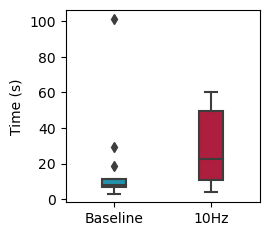

In [239]:
data={'Baseline': np.squeeze(mean_bs),'10Hz':np.squeeze(mean_stim)}
df=pd.DataFrame(data)
plt.figure(figsize=(2.5, 2.5))
my_pal = {"Baseline": "#0C9FC3", "10Hz": "#C50632"}
my_pal2 = {"Baseline": "k", "10Hz": "k"}
ax=sns.boxplot(data=df,palette=my_pal,width=0.25)
plt.ylabel('Time (s)')
plt.savefig('box_plot_locomotion_bout_durations_bs_vs_stim_median.svg',bbox_inches='tight',dpi=1200)

Text(0, 0.5, 'Bout duration stim (s)')

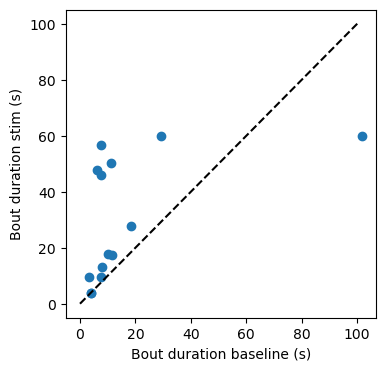

In [52]:
plt.figure(figsize=(4, 4))
plt.scatter(mean_bs,mean_stim)
plt.plot([0,100], [0,100],'k--')
plt.xlabel('Bout duration baseline (s)')
plt.ylabel('Bout duration stim (s)')
#plt.savefig('scatterplot_locomotion_bout_durations_bs_vs_stim_median.svg',bbox_inches='tight',dpi=1200)

In [53]:
ss.wilcoxon(mean_bs,mean_stim)

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


WilcoxonResult(statistic=array([13.]), pvalue=array([0.0231298]))

In [55]:
os.chdir( "C:/Users/sudiksha/Documents/Codes")
f1 = h5py.File('locomotion_median_bout_durations_145Hz.h5', "r")
mean_bs_145Hz = np.array(f1['bs'])
mean_stim_145Hz = np.array(f1['stim'])
f1.close()

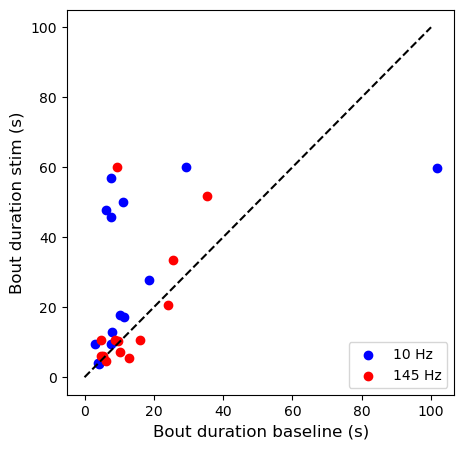

In [57]:
fig, ax = plt.subplots(1, 1,figsize=(5,5))
plt.scatter(mean_bs,mean_stim,color='b')
plt.scatter(mean_bs_145Hz,mean_stim_145Hz,color='r')
plt.plot([0,100], [0,100],'k--')
plt.xlabel('Bout duration baseline (s)',fontsize=12)
plt.ylabel('Bout duration stim (s)',fontsize=12)
plt.legend(["10 Hz", "145 Hz"], loc="lower right",fontsize=10)
plt.savefig('scatter_plot_bs_stim_median_bout_durations.svg',dpi=600)

In [307]:
np.mean(mean_bs),np.std(mean_bs),np.mean(mean_stim),np.std(mean_stim),np.median(mean_bs),np.median(mean_stim)

(22.16481449656488,
 23.327452287344453,
 27.463260682256987,
 15.821145021662065,
 15.34247852622061,
 24.34285714285714)

In [275]:
# Combine across sessions to show the distributions maybe separately 
bout_duration_bs=get_bout_durations_baseline(sess_list[0])
for i in np.arange(1,len(sess_list),1):
    #print(i)
    sess_name= sess_list[i]
    b=get_bout_durations_baseline(sess_name)
    bout_duration_bs=np.concatenate((bout_duration_bs,b))
    

In [276]:
bout_duration_bs=get_bout_durations_baseline(sess_list[13])
np.min(bout_duration_bs)

2.0

In [277]:
bout_duration_stim=get_bout_durations_stim(sess_list[0])
for i in np.arange(1,len(sess_list),1):
    #print(i)
    sess_name= sess_list[i]
    b=get_bout_durations_stim(sess_name)
    bout_duration_stim=np.concatenate((bout_duration_stim,b))

In [278]:
np.min(bout_duration_bs)

2.0

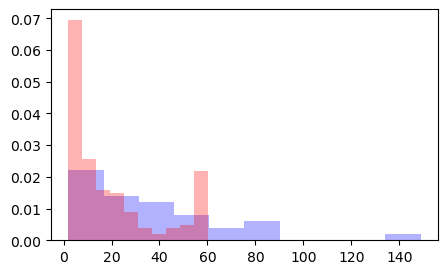

In [283]:
fig, ax = plt.subplots(1, 1,figsize=(5,3))
plt.hist(bout_duration_bs,bins=10,density=True,color='blue',alpha=0.3)
plt.hist(bout_duration_stim,bins=10,density=True,color='red',alpha=0.3)
plt.savefig('bs_stim_density_plot_all_bout_durations.svg',bbox_inches='tight',dpi=600)

In [265]:
i=0
bout_duration_bs=get_bout_durations_baseline(sess_list[0])
sess_id=np.ones(np.size(bout_duration_bs))*i
for i in np.arange(1,len(sess_list),1):
    #print(i)
    sess_name= sess_list[i]
    b=get_bout_durations_baseline(sess_name)
    z=np.ones(np.size(b))*i
    bout_duration_bs=np.concatenate((bout_duration_bs,b))
    sess_id=np.concatenate((sess_id,z))
stim_vect=np.zeros(np.size(bout_duration_bs))

i=0
bout_duration_stim=get_bout_durations_stim(sess_list[0])
sess_id2=np.ones(np.size(bout_duration_stim))*i
for i in np.arange(1,len(sess_list),1):
    #print(i)
    sess_name= sess_list[i]
    b=get_bout_durations_stim(sess_name)
    z=np.ones(np.size(b))*i
    bout_duration_stim=np.concatenate((bout_duration_stim,b))
    sess_id2=np.concatenate((sess_id2,z))
stim_vect2=np.ones(np.size(bout_duration_stim))


In [266]:
bout_duration_tot=np.concatenate((bout_duration_bs,bout_duration_stim))
stim_vect_tot=np.concatenate((stim_vect,stim_vect2))
sess_id_tot=np.concatenate((sess_id,sess_id2))
np.size(bout_duration_tot),np.size(sess_id_tot),np.size(stim_vect_tot)

(1003, 1003, 1003)

In [268]:
data = {
  "SessID": sess_id_tot,"stim":stim_vect_tot,"Duration":np.squeeze(bout_duration_tot)
}

#load data into a DataFrame object:
df = pd.DataFrame(data)

df 
from pathlib import Path  

filepath = Path( 'C:/Users/sudiksha/Documents/Codes/bout_durations_10Hz.csv')  

filepath.parent.mkdir(parents=True, exist_ok=True)  

df.to_csv(filepath)  

## Divide into baseline and stimulation frames 

In [38]:
def get_stim_frames_index(sess_no):
    stim_on_inds=stim_onsets_df.loc[sess_no,:]
    stim_off_inds=stim_offsets_df.loc[sess_no,:]
    stim_indices=np.arange(stim_on_inds[0],stim_off_inds[0]+1,1)
    for i in np.arange(1,5,1):
        b=np.arange(stim_on_inds[i],stim_off_inds[i]+1,1)
        stim_indices=np.concatenate((stim_indices,b))
    return stim_indices

In [118]:
# Exclude the min after stim
def get_baseline_frames_index(sess_no):
    stim_on_inds=stim_onsets_df.loc[sess_no,:]
    stim_off_inds=stim_offsets_df.loc[sess_no,:]

    baseline_indices=np.arange(0,stim_on_inds[0])
    for i in np.arange(0,4,1):
        b=np.arange(stim_off_inds[i]+1200,stim_on_inds[i+1])
        baseline_indices=np.concatenate((baseline_indices,b))
    b= np.arange(stim_off_inds[4]+1200,42000,1)
    baseline_indices=np.concatenate((baseline_indices,b))
    return baseline_indices

In [119]:
#Not excluding the min after stim
def get_baseline_frames_index_all(sess_no):
    stim_on_inds=stim_onsets_df.loc[sess_no,:]
    stim_off_inds=stim_offsets_df.loc[sess_no,:]

    baseline_indices=np.arange(0,stim_on_inds[0])
    for i in np.arange(0,4,1):
        b=np.arange(stim_off_inds[i]+1,stim_on_inds[i+1])
        baseline_indices=np.concatenate((baseline_indices,b))
    b= np.arange(stim_off_inds[4]+1,42000,1)
    baseline_indices=np.concatenate((baseline_indices,b))
    return baseline_indices

In [41]:
def remove_nan_motion_frames(sess_name):
    motion=np.array(motion_df.loc[sess_name,:])
    motion=np.squeeze(motion)
    nan_motion_frames=np.argwhere(np.isnan(motion))
    baseline_indices=get_baseline_frames_index(sess_name)
    c=np.intersect1d(baseline_indices,nan_motion_frames)
    common_indices=np.setdiff1d(baseline_indices,c)
    return common_indices

## Figure 1 - motion figures 

In [30]:
def get_start_end(file,fieldname):
    f = h5py.File(file, 'r')
    a=np.array(f[fieldname]).T
    a=a-1
    f.close()
    return a

In [29]:
def plot_low_high_speed_periods(sess_name,start_index,period):
    for i in np.arange(0,len(motion_Files)):
        file=motion_Files[i]
        sess_name1 = file.split('/')[4]+'_'+file.split('/')[5]
        if sess_name1 == sess_name:
            sel_file =motion_Files[i]
    hisp_Start = np.squeeze(get_start_end(sel_file,'moving_starts'))
    hisp_End = np.squeeze(get_start_end(sel_file,'moving_ends'))
    lowsp_Start = np.squeeze(get_start_end(sel_file,'stationary_starts'))
    lowsp_End = np.squeeze(get_start_end(sel_file,'stationary_ends'))
    # Shade low speed and high speed regions 
    motion=motion_df.loc[sess_name]
    plt.figure(figsize=(12,1))
    plt.plot(motion.loc[start_index:start_index+period],color='#13311B')
    for i in np.arange(0,len(lowsp_Start)):
        if lowsp_Start[i]<period+start_index:
            plt.axvspan(lowsp_Start[i],lowsp_End[i],ymin=0,ymax=35,color='#BEE1F0',alpha=0.4)
    for i in np.arange(0,len(hisp_Start)):
        if hisp_Start[i]<period+start_index:
            plt.axvspan(hisp_Start[i],hisp_End[i],ymin=0,ymax=35,color='#4D98DB',alpha=0.5)
    plt.xlim([start_index,start_index+period])
    lt=np.array(low_speed_threshold_df.loc[sess_name])
    ut=np.array(high_speed_threshold_df.loc[sess_name])
    a=np.array(motion_onsets_df.loc[sess_name,:])
    motion_onsets= np.where(a==1)[0]
    for i in np.arange(0,motion_onsets.shape[0],1):
        if motion_onsets[i]>start_index and motion_onsets[i]<start_index+period:
            plt.scatter(motion_onsets[i],motion[motion_onsets[i]],s=25,marker="o",color='red')
    
    plt.ylabel('Velocity (cm/s)',fontsize=16)
    plt.xlabel('Time(in mins)',fontsize=16)
    #plt.legend(['speed','low speed region','high speed region','motion onset'])
    plt.xticks(np.arange(start_index,start_index+period+2,600),np.arange(0,int(period/1200)+0.5,0.5),fontsize=14)
    plt.yticks(np.arange(0,12,10))

In [30]:
sess_list=[]
for mouse, cell_df in binary_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)
len(sess_list)

14

In [306]:
os.chdir( "C:/Users/sudiksha/Documents/Codes")

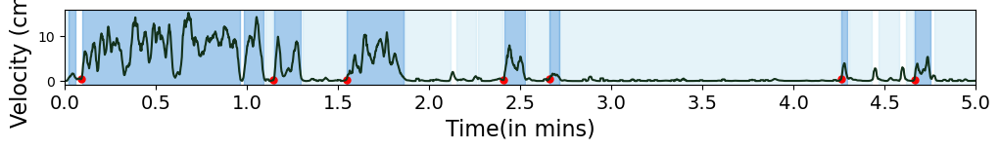

In [33]:
sess_name= sess_list[0]
plot_low_high_speed_periods(sess_name,7200,6000)
plt.savefig('motion_hi_low_periods_'+sess_name+'_7200_start_6000frames_stretched2.png',dpi=1200,bbox_inches='tight')

In [131]:
os.chdir( "C:/Users/sudiksha/Documents/Codes/")

In [34]:
def subplot_boxplot(field1,field2,sig_bar,space,label_yaxis):
    f, (ax1, ax2) = plt.subplots(1, 2,figsize=(5, 2.5), sharey=True)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f = h5py.File('percent_time_motion_data.h5','r')
    Moving_stim=np.array(f[field1])[0,:]
    Moving_bs=np.array(f[field1])[1,:]
    data={'Baseline': Moving_bs,'Stim': Moving_stim}
    df=pd.DataFrame(data)
    my_pal = {"Baseline": "#0C9FC3", "Stim": "#C50632"}
    sns.boxplot(data=df, ax=ax1,palette=my_pal,width=0.25)
    x=[np.zeros(Moving_bs.shape[0]),np.ones(Moving_bs.shape[0])]
    y=[df['Baseline'],df['Stim']]
    #ax1.scatter(x,y,color='k',alpha=0.3)
    #ax1.plot(x,y)
    a=df['Baseline']
    b=df['Stim']
    print(ss.wilcoxon(a,b))
    y_max=max(max(a),max(b))
    y_min=min(min(a),min(b))
    # Add significance bar ,bbox tight
    
    if ss.wilcoxon(a,b)[1]<0.05:
        ax1.plot([0,1],[y_max+sig_bar,y_max+sig_bar], 'k')
        if ss.wilcoxon(a,b)[1]>0.01:
            ax1.text(0.5,y_max+sig_bar, '*', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(a,b)[1]>0.001:
            ax1.text(0.5,y_max+sig_bar, '* *', horizontalalignment='center', fontsize=14)
        else:
            ax1.text(0.5,y_max+sig_bar, '* * *', horizontalalignment='center', fontsize=14)
    ax1.set_ylim([y_min-space[0],y_max+space[1]])
    
    Moving_stim=np.array(f[field2])[0,:]
    Moving_bs=np.array(f[field2])[1,:]
    f.close()
    data={'Baseline': Moving_bs,'Stim': Moving_stim}
    df1=pd.DataFrame(data)
    sns.boxplot(data=df1, ax=ax2,palette=my_pal,width=0.25)
    ax1.set_ylabel(label_yaxis,fontsize=14)
    ax1.set_title('10 Hz',fontsize=14)
    ax2.set_title('145 Hz',fontsize=14)
    ax1.set_xticklabels(['Baseline','Stim'],fontsize=12)
    ax2.set_xticklabels(['Baseline','Stim'],fontsize=12)

    a=df1['Baseline']
    b=df1['Stim']
    print(ss.wilcoxon(a,b))
    y_max=max(max(a),max(b))
    y_min=min(min(a),min(b))
    # Add significance bar ,bbox tight
    
    if ss.wilcoxon(a,b)[1]<0.05:
        ax2.plot([0,1],[y_max+sig_bar,y_max+sig_bar], 'k')
        if ss.wilcoxon(a,b)[1]>0.01:
            ax2.text(0.5,y_max+sig_bar, '*', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(a,b)[1]<0.01:
            ax2.text(0.5,y_max+sig_bar, '* *', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(a,b)[1]<0.001:
            ax2.text(0.5,y_max+sig_bar, '* * *', horizontalalignment='center', fontsize=14)
    
    ax2.set_ylim([y_min-space[0],y_max+space[1]])

In [31]:
def subplot_violinplot(field1,field2,sig_bar,space,label_yaxis):
    f, (ax1, ax2) = plt.subplots(1, 2,figsize=(5, 2.5), sharey=True)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f = h5py.File('percent_time_motion_data.h5','r')
    Moving_stim=np.array(f[field1])[0,:]
    Moving_bs=np.array(f[field1])[1,:]
    data={'Baseline': Moving_bs,'Stim': Moving_stim}
    df=pd.DataFrame(data)
    my_pal = {"Baseline": "#0C9FC3", "Stim": "#C50632"}
    sns.violinplot(data=df, ax=ax1,palette=my_pal,width=0.25)
    x=[np.zeros(Moving_bs.shape[0]),np.ones(Moving_bs.shape[0])]
    y=[df['Baseline'],df['Stim']]
    #ax1.scatter(x,y,color='k',alpha=0.3)
    #ax1.plot(x,y)
    a=df['Baseline']
    b=df['Stim']
    print(ss.wilcoxon(a,b))
    y_max=max(max(a),max(b))
    y_min=min(min(a),min(b))
    # Add significance bar ,bbox tight
    
    if ss.wilcoxon(a,b)[1]<0.05:
        ax1.plot([0,1],[y_max+sig_bar,y_max+sig_bar], 'k')
        if ss.wilcoxon(a,b)[1]>0.01:
            ax1.text(0.5,y_max+sig_bar, '*', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(a,b)[1]>0.001:
            ax1.text(0.5,y_max+sig_bar, '* *', horizontalalignment='center', fontsize=14)
        else:
            ax1.text(0.5,y_max+sig_bar, '* * *', horizontalalignment='center', fontsize=14)
    ax1.set_ylim([y_min-space[0],y_max+space[1]])
    
    Moving_stim=np.array(f[field2])[0,:]
    Moving_bs=np.array(f[field2])[1,:]
    f.close()
    data={'Baseline': Moving_bs,'Stim': Moving_stim}
    df1=pd.DataFrame(data)
    sns.violinplot(data=df1, ax=ax2,palette=my_pal,width=0.25)
    ax1.set_ylabel(label_yaxis,fontsize=14)
    ax1.set_title('10 Hz',fontsize=14)
    ax2.set_title('145 Hz',fontsize=14)
    ax1.set_xticklabels(['Baseline','Stim'],fontsize=12)
    ax2.set_xticklabels(['Baseline','Stim'],fontsize=12)

    a=df1['Baseline']
    b=df1['Stim']
    print(ss.wilcoxon(a,b))
    y_max=max(max(a),max(b))
    y_min=min(min(a),min(b))
    # Add significance bar ,bbox tight
    
    if ss.wilcoxon(a,b)[1]<0.05:
        ax2.plot([0,1],[y_max+sig_bar,y_max+sig_bar], 'k')
        if ss.wilcoxon(a,b)[1]>0.01:
            ax2.text(0.5,y_max+sig_bar, '*', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(a,b)[1]<0.01:
            ax2.text(0.5,y_max+sig_bar, '* *', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(a,b)[1]<0.001:
            ax2.text(0.5,y_max+sig_bar, '* * *', horizontalalignment='center', fontsize=14)
    
    ax2.set_ylim([y_min-space[0],y_max+space[1]])

In [32]:
def subplot_boxplot2(field1,field2,sig_bar,space,label_yaxis):
    f, (ax1, ax2) = plt.subplots(1, 2,figsize=(5, 2.5), sharey=True)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f = h5py.File('percent_time_motion_data2.h5','r')
    Moving_stim=np.array(f[field1])[0,:]
    Moving_bs=np.array(f[field1])[1,:]
    data={'Baseline': Moving_bs,'Stim': Moving_stim}
    df=pd.DataFrame(data)
    my_pal = {"Baseline": "#0C9FC3", "Stim": "#C50632"}
    sns.boxplot(data=df, ax=ax1,palette=my_pal,width=0.25)
    x=[np.zeros(Moving_bs.shape[0]),np.ones(Moving_bs.shape[0])]
    y=[df['Baseline'],df['Stim']]
    #ax1.scatter(x,y,color='k',alpha=0.3)
    #ax1.plot(x,y)
    a=df['Baseline']
    b=df['Stim']
    print(ss.wilcoxon(a,b))
    y_max=max(max(a),max(b))
    y_min=min(min(a),min(b))
    # Add significance bar ,bbox tight
    
    if ss.wilcoxon(a,b)[1]<0.05:
        ax1.plot([0,1],[y_max+sig_bar,y_max+sig_bar], 'k')
        if ss.wilcoxon(a,b)[1]>0.01:
            ax1.text(0.5,y_max+sig_bar, '*', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(a,b)[1]>0.001:
            ax1.text(0.5,y_max+sig_bar, '* *', horizontalalignment='center', fontsize=14)
        else:
            ax1.text(0.5,y_max+sig_bar, '* * *', horizontalalignment='center', fontsize=14)
    ax1.set_ylim([y_min-space[0],y_max+space[1]])
    
    Moving_stim=np.array(f[field2])[0,:]
    Moving_bs=np.array(f[field2])[1,:]
    f.close()
    data={'Baseline': Moving_bs,'Stim': Moving_stim}
    df1=pd.DataFrame(data)
    sns.boxplot(data=df1, ax=ax2,palette=my_pal,width=0.25)
    ax1.set_ylabel(label_yaxis,fontsize=14)
    ax1.set_title('10 Hz',fontsize=14)
    ax2.set_title('145 Hz',fontsize=14)
    ax1.set_xticklabels(['Baseline','Stim'],fontsize=12)
    ax2.set_xticklabels(['Baseline','Stim'],fontsize=12)

    a=df1['Baseline']
    b=df1['Stim']
    print(ss.wilcoxon(a,b))
    y_max=max(max(a),max(b))
    y_min=min(min(a),min(b))
    # Add significance bar ,bbox tight
    
    if ss.wilcoxon(a,b)[1]<0.05:
        ax2.plot([0,1],[y_max+sig_bar,y_max+sig_bar], 'k')
        if ss.wilcoxon(a,b)[1]>0.01:
            ax2.text(0.5,y_max+sig_bar, '*', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(a,b)[1]<0.01:
            ax2.text(0.5,y_max+sig_bar, '* *', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(a,b)[1]<0.001:
            ax2.text(0.5,y_max+sig_bar, '* * *', horizontalalignment='center', fontsize=14)
    
    ax2.set_ylim([y_min-space[0],y_max+space[1]])

In [33]:
def subplot_violinplot2(field1,field2,sig_bar,space,label_yaxis):
    f, (ax1, ax2) = plt.subplots(1, 2,figsize=(5, 2.5), sharey=True)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f = h5py.File('percent_time_motion_data2.h5','r')
    Moving_stim=np.array(f[field1])[0,:]
    Moving_bs=np.array(f[field1])[1,:]
    data={'Baseline': Moving_bs,'Stim': Moving_stim}
    df=pd.DataFrame(data)
    my_pal = {"Baseline": "#0C9FC3", "Stim": "#C50632"}
    sns.violinplot(data=df, ax=ax1,palette=my_pal,width=0.25)
    x=[np.zeros(Moving_bs.shape[0]),np.ones(Moving_bs.shape[0])]
    y=[df['Baseline'],df['Stim']]
    #ax1.scatter(x,y,color='k',alpha=0.3)
    #ax1.plot(x,y)
    a=df['Baseline']
    b=df['Stim']
    print(ss.wilcoxon(a,b))
    y_max=max(max(a),max(b))
    y_min=min(min(a),min(b))
    # Add significance bar ,bbox tight
    
    if ss.wilcoxon(a,b)[1]<0.05:
        ax1.plot([0,1],[y_max+sig_bar,y_max+sig_bar], 'k')
        if ss.wilcoxon(a,b)[1]>0.01:
            ax1.text(0.5,y_max+sig_bar, '*', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(a,b)[1]>0.001:
            ax1.text(0.5,y_max+sig_bar, '* *', horizontalalignment='center', fontsize=14)
        else:
            ax1.text(0.5,y_max+sig_bar, '* * *', horizontalalignment='center', fontsize=14)
    ax1.set_ylim([y_min-space[0],y_max+space[1]])
    
    Moving_stim=np.array(f[field2])[0,:]
    Moving_bs=np.array(f[field2])[1,:]
    f.close()
    data={'Baseline': Moving_bs,'Stim': Moving_stim}
    df1=pd.DataFrame(data)
    sns.violinplot(data=df1, ax=ax2,palette=my_pal,width=0.25)
    ax1.set_ylabel(label_yaxis,fontsize=14)
    ax1.set_title('10 Hz',fontsize=14)
    ax2.set_title('145 Hz',fontsize=14)
    ax1.set_xticklabels(['Baseline','Stim'],fontsize=12)
    ax2.set_xticklabels(['Baseline','Stim'],fontsize=12)

    a=df1['Baseline']
    b=df1['Stim']
    print(ss.wilcoxon(a,b))
    y_max=max(max(a),max(b))
    y_min=min(min(a),min(b))
    # Add significance bar ,bbox tight
    
    if ss.wilcoxon(a,b)[1]<0.05:
        ax2.plot([0,1],[y_max+sig_bar,y_max+sig_bar], 'k')
        if ss.wilcoxon(a,b)[1]>0.01:
            ax2.text(0.5,y_max+sig_bar, '*', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(a,b)[1]<0.01:
            ax2.text(0.5,y_max+sig_bar, '* *', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(a,b)[1]<0.001:
            ax2.text(0.5,y_max+sig_bar, '* * *', horizontalalignment='center', fontsize=14)
    
    ax2.set_ylim([y_min-space[0],y_max+space[1]])

In [329]:
os.chdir( "C:/Users/sudiksha/Documents/Codes/")
f = h5py.File('percent_time_motion_data.h5','r')
field1='Motion_onsets_10Hz_with'
field2='Motion_onsets_145Hz_with'
Moving_stim=np.array(f[field1])[0,:]
Moving_bs=np.array(f[field1])[1,:]
data={'Baseline': Moving_bs,'Stim': Moving_stim}
df=pd.DataFrame(data)
a=df['Baseline']
b=df['Stim']
print(ss.wilcoxon(a,b))
Moving_stim2=np.array(f[field2])[0,:]
Moving_bs2=np.array(f[field2])[1,:]
data={'Baseline': Moving_bs2,'Stim': Moving_stim2}
df=pd.DataFrame(data)
c=df['Baseline']
d=df['Stim']
print(ss.wilcoxon(c,d))
diff_10= b-a
diff_145=d-c
print(ss.mannwhitneyu(diff_10,diff_145))
print(ss.ttest_ind(diff_10,diff_145))

WilcoxonResult(statistic=38.0, pvalue=0.004063238686145598)
WilcoxonResult(statistic=63.0, pvalue=0.54766845703125)
MannwhitneyuResult(statistic=92.0, pvalue=0.004831741178680336)
TtestResult(statistic=-2.8618203922484655, pvalue=0.006813858747270507, df=38.0)


C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


In [59]:
os.chdir( "C:/Users/sudiksha/Documents/Codes/")
f = h5py.File('percent_time_motion_data.h5','r')
field1='Moving_10Hz'
field2='Moving_145Hz'
Moving_stim=np.array(f[field1])[0,:]
Moving_bs=np.array(f[field1])[1,:]
data={'Baseline': Moving_bs,'Stim': Moving_stim}
df=pd.DataFrame(data)
a=df['Baseline']
b=df['Stim']
print(ss.wilcoxon(a,b))
Moving_stim2=np.array(f[field2])[0,:]
Moving_bs2=np.array(f[field2])[1,:]
data={'Baseline': Moving_bs2,'Stim': Moving_stim2}
df=pd.DataFrame(data)
c=df['Baseline']
d=df['Stim']
print(ss.wilcoxon(c,d))
diff_10= b-a
diff_145=d-c
print(ss.mannwhitneyu(diff_10,diff_145))
print(ss.ttest_ind(diff_10,diff_145))

WilcoxonResult(statistic=33.0, pvalue=0.0007376670837402344)
WilcoxonResult(statistic=28.0, pvalue=0.0201568603515625)
MannwhitneyuResult(statistic=222.0, pvalue=0.476867041817969)
TtestResult(statistic=0.8392774301929615, pvalue=0.4065627606134087, df=38.0)


In [60]:
np.mean(Moving_bs),np.std(Moving_bs),np.mean(Moving_bs2),np.std(Moving_bs2)

(69.58925967648734, 22.34250428251225, 65.67188087566927, 24.401154059539355)

In [61]:
np.mean(np.concatenate((Moving_bs,Moving_bs2))),np.std(np.concatenate((Moving_bs,Moving_bs2)))

(67.92437368613966, 23.320267807477897)

In [62]:
np.min(Moving_bs),np.max(Moving_bs),np.min(Moving_bs2),np.max(Moving_bs2)

(10.996231197678684, 99.16983396679336, 21.871838111298484, 98.01966994499082)

In [63]:
np.mean(Moving_stim),np.std(Moving_stim),np.mean(Moving_stim2),np.std(Moving_stim2)

(82.15055748963734, 16.452565051845056, 74.08580210922585, 21.316169650216985)

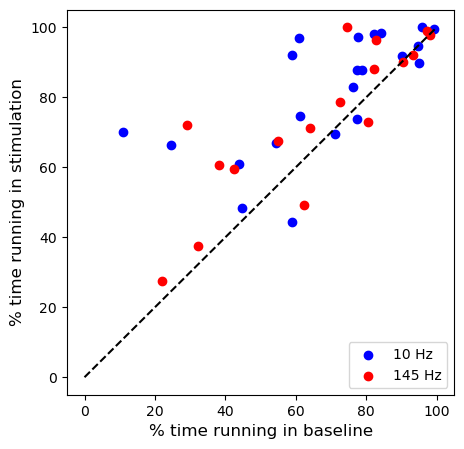

In [64]:
fig, ax = plt.subplots(1, 1,figsize=(5,5))
plt.scatter(Moving_bs,Moving_stim,color='b')
plt.scatter(Moving_bs2,Moving_stim2,color='r')
plt.plot([0,100], [0,100],'k--')
plt.xlabel('% time running in baseline',fontsize=12)
plt.ylabel('% time running in stimulation',fontsize=12)
plt.legend(["10 Hz", "145 Hz"], loc="lower right",fontsize=10)
plt.savefig('scatter_plot_baseline_stim.svg',dpi=1200)

In [66]:
print(ss.mannwhitneyu(Moving_bs,Moving_bs2))
print(ss.ttest_ind(Moving_bs,Moving_bs2))

MannwhitneyuResult(statistic=210.0, pvalue=0.7016938838201836)
TtestResult(statistic=0.5136707051237404, pvalue=0.6104563127947702, df=38.0)


In [67]:
print(ss.mannwhitneyu(Moving_stim,Moving_stim2))
print(ss.ttest_ind(Moving_stim,Moving_stim2))

MannwhitneyuResult(statistic=232.5, pvalue=0.3179528533019669)
TtestResult(statistic=1.3159836449371045, pvalue=0.1960633944330734, df=38.0)


Text(0, 0.5, 'Frequency of onsets')

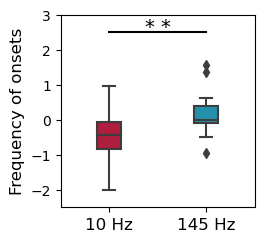

In [40]:
f, ax = plt.subplots(1,1,figsize=(2.5, 2.5), sharey=True)
my_pal = {"#0C9FC3", "#C50632"}
sns.boxplot(data=[diff_10,diff_145],palette=my_pal,width=0.25,ax=ax)
ax.set_xticklabels(['10 Hz','145 Hz'],fontsize=12)
ax.plot([0,1],[2.5,2.5], 'k')
ax.text(0.5,2.5, '* *', horizontalalignment='center', fontsize=14)
ax.set_ylim([-2.5,3])
ax.set_ylabel('Frequency of onsets',fontsize=12)
#plt.savefig('onsets_boxplot_10Hz_vs_145Hz.svg',dpi=1200,bbox_inches='tight')

In [262]:
f=h5py.File('Onset_supp_fig.h5',"w")
dset1 = f.create_dataset('10Hz', data=diff_10)
dset1 = f.create_dataset('145Hz', data=diff_145)
f.close()

In [43]:
os.chdir( "C:/Users/sudiksha/Documents/Codes/")
f = h5py.File('percent_time_motion_data.h5','r')
field1='Motion_onsets_10Hz_with'
field2='Motion_onsets_145Hz_with'
Moving_stim=np.array(f[field1])[0,:]
Moving_bs=np.array(f[field1])[1,:]
data={'Baseline': Moving_bs,'Stim': Moving_stim}
df=pd.DataFrame(data)
a=df['Baseline']
b=df['Stim']
print(ss.wilcoxon(a,b))
print(a.shape)

WilcoxonResult(statistic=38.0, pvalue=0.004063238686145598)
(23,)


(-1.834198150535211, 7.031599449885536)

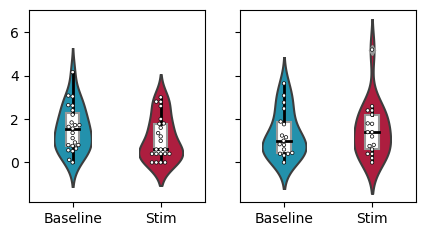

In [44]:
os.chdir( "C:/Users/sudiksha/Documents/Codes/")
f = h5py.File('percent_time_motion_data.h5','r')
field1='Motion_onsets_10Hz_with'
field2='Motion_onsets_145Hz_with'
Moving_stim=np.array(f[field1])[0,:]
Moving_bs=np.array(f[field1])[1,:]
data={'Baseline': Moving_bs,'Stim': Moving_stim}
df=pd.DataFrame(data)
my_pal = {"Baseline": "#0C9FC3", "Stim": "#C50632"}
fig, [ax1,ax2] = plt.subplots(1, 2,figsize=(5, 2.5), sharey=True)
ax=sns.violinplot(data=df,ax=ax1,palette=my_pal,dodge=False,alpha=0.2,width=0.5,showextrema=False,inner=None)
for violin in ax.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    # width/2
    violin.set_clip_path(plt.Rectangle((x0, y0), width , height, transform=ax.transData))
    violin.set_alpha(1)
sns.swarmplot(data=df,ax=ax1,palette=['w','w'],alpha=1,edgecolor=['k','k'],linewidth=0.5, s=2.5)

# You can remove the outliers by setting showfliers=False and remove whiskers by showcaps=False.
#https://stackoverflow.com/questions/43434020/black-and-white-boxplots-in-seaborn
ax=sns.boxplot(data=df,ax=ax1,color='w',width=0.15,showcaps=False,boxprops={'zorder': 2})
for i,box in enumerate(ax.artists):
    box.set_edgecolor('k')
for l in ax.lines:
    l.set_color('k')
    l.set_linewidth(2)
old_len_collections = len(ax.collections)


Moving_stim=np.array(f[field2])[0,:]
Moving_bs=np.array(f[field2])[1,:]
data={'Baseline': Moving_bs,'Stim': Moving_stim}
df=pd.DataFrame(data)
my_pal = {"Baseline": "#0C9FC3", "Stim": "#C50632"}
ax=sns.violinplot(data=df,ax=ax2,palette=my_pal,dodge=False,alpha=0.2,width=0.5,showextrema=False,inner=None)
#scale="width"
xlim = ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox = violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    # width/2
    violin.set_clip_path(plt.Rectangle((x0, y0), width , height, transform=ax.transData))
    violin.set_alpha(1)
sns.swarmplot(data=df,ax=ax2,palette=['w','w'],alpha=1,edgecolor=['k','k'],linewidth=0.5, s=2.5)

ax=sns.boxplot(data=df,ax=ax2,color='w',width=0.15,showcaps=False,boxprops={'zorder': 2})
for i,box in enumerate(ax.artists):
    box.set_edgecolor('k')
for l in ax.lines:
    l.set_color('k')
    l.set_linewidth(2)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
#plt.savefig('onsets_boxplot_10Hz_vs_145Hz_violin_box.svg',dpi=1200,bbox='tight')

WilcoxonResult(statistic=33.0, pvalue=0.0007376670837402344)
WilcoxonResult(statistic=28.0, pvalue=0.0201568603515625)


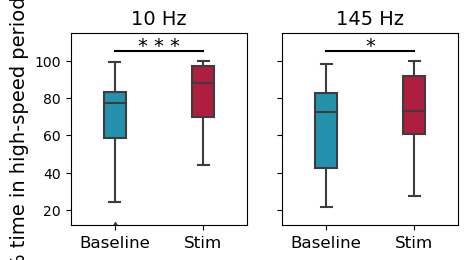

In [45]:
subplot_boxplot('Moving_10Hz','Moving_145Hz',5,[10,15],'% time in high-speed periods')
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_1/')
#plt.savefig('high_speed_periods_boxplot_all_sess2.svg',dpi=1200,bbox='tight')

WilcoxonResult(statistic=38.0, pvalue=0.004063238686145598)
WilcoxonResult(statistic=63.0, pvalue=0.54766845703125)


C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


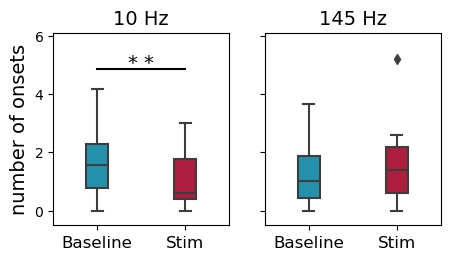

In [46]:
subplot_boxplot('Motion_onsets_10Hz_with','Motion_onsets_145Hz_with',0.7,[0.5,0.9],'number of onsets')
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_1/')
#plt.savefig('onsets_boxplot_all_sess.svg',dpi=1200,bbox='tight')

WilcoxonResult(statistic=82.0, pvalue=0.09175300598144531)
WilcoxonResult(statistic=69.0, pvalue=0.7466583251953125)


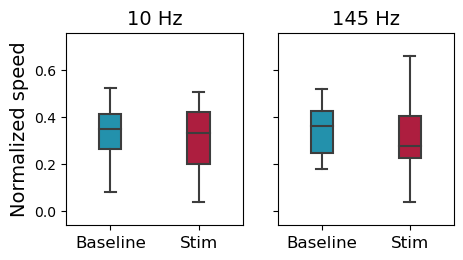

In [49]:
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Trace_analysis/Final_codes/')
subplot_boxplot2('normalized_speed_10Hz_max','normalized_speed_145Hz_max',0.1,[0.1,0.1],'Normalized speed')
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_1/')
#plt.savefig('normalized_speed_boxplot_all_sess_moving.svg',dpi=1200,bbox='tight')

WilcoxonResult(statistic=82.0, pvalue=0.09175300598144531)
WilcoxonResult(statistic=69.0, pvalue=0.7466583251953125)


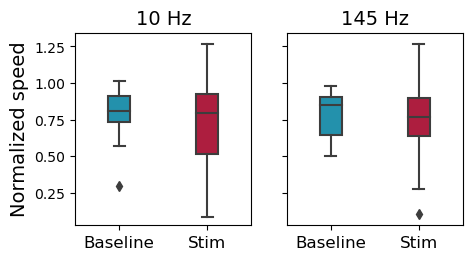

In [50]:
subplot_boxplot2('normalized_speed_10Hz_mean','normalized_speed_145Hz_mean',0.03,[0.08,0.08],'Normalized speed')
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_1/')
#plt.savefig('normalized_speed_boxplot_all_sess_mean_moving.svg',dpi=1200,bbox='tight')

## Figure 3 - Ca response to motion

### Compare Gcamp7 and somaGCamp7 event rates 

#### From Gcamp7 vs somaGCamp7 notebook 

In [115]:
f1 = h5py.File("Event_rate_10Hz_per_min_final.h5", 'r')
print(f1.keys())
sess_name ='608451_01062020'
print(np.array(f1[sess_name+'_onset']))
print(len(np.array(f1['GCamp_version'])))
f1.close()

<KeysViewHDF5 ['602101_03092020_bin', '602101_03092020_onset', '602101_07082020_bin', '602101_07082020_onset', '608448_01062020_bin', '608448_01062020_onset', '608448_01172020_bin', '608448_01172020_onset', '608450_03092020_bin', '608450_03092020_onset', '608451_01062020_bin', '608451_01062020_onset', '608451_07082020_bin', '608451_07082020_onset', '608452_01062020_bin', '608452_01062020_onset', '608452_07082020_bin', '608452_07082020_onset', '611111_07082020_bin', '611111_07082020_onset', '611311_03092020_bin', '611311_03092020_onset', '612535_07082020_bin', '612535_07082020_onset', '615883_02052021_bin', '615883_02052021_onset', '615883_03122021_bin', '615883_03122021_onset', 'GCamp_version']>
2.2682175523068486
14


In [315]:
# Label 1- GCamp7
# Label 2- soma GCamp7
f = h5py.File("Event_rate_10Hz_per_min_final.h5", 'r')
labels=np.array(f['GCamp_version'])
idx=(np.squeeze(np.argwhere(labels==1)))
idx2=(np.squeeze(np.argwhere(labels==2)))
l=list(f.keys())
event_rate=[]
for i in np.arange(1,len(l),2):
    event_rate.append(np.array(f[l[i]]))
event_rate=np.array(event_rate)
GCamp7_arr_10Hz=event_rate[idx]
soma_GCamp7_arr_10Hz=event_rate[idx2]
f.close()

In [316]:
f = h5py.File("Event_rate_145Hz_per_min_final.h5", 'r')
labels=np.array(f['GCamp_version'])
idx=(np.squeeze(np.argwhere(labels==1)))
idx2=(np.squeeze(np.argwhere(labels==2)))
l=list(f.keys())
event_rate=[]
for i in np.arange(1,len(l),2):
    if l[i].find('602101_03112020') != -1 or l[i].find('611311_03112020') != -1:
        event_rate.append(np.NaN)
    else:
        event_rate.append(np.array(f[l[i]]))
event_rate=np.array(event_rate)
GCamp7_arr_145Hz=event_rate[idx]
soma_GCamp7_arr_145Hz=event_rate[idx2]
f.close()

In [317]:
soma_GCamp7_arr_145Hz = [x for x in soma_GCamp7_arr_145Hz if np.isnan(x) == False]

In [318]:
GCamp=np.concatenate((GCamp7_arr_10Hz,GCamp7_arr_145Hz))
soma_GCamp=np.concatenate((soma_GCamp7_arr_10Hz,soma_GCamp7_arr_145Hz))

In [319]:
len(GCamp7_arr_10Hz),len(soma_GCamp7_arr_10Hz),len(GCamp7_arr_145Hz),len(soma_GCamp7_arr_145Hz)

(8, 6, 7, 5)

Text(0, 0.5, 'Event rate ( per min)')

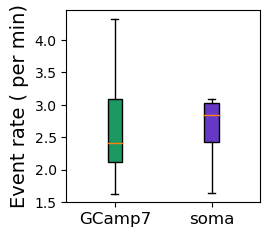

In [320]:
x=[GCamp,soma_GCamp]
fig, ax = plt.subplots(1, 1, figsize=(2.5,2.5))
box=plt.boxplot(x,labels=['GCamp7','soma'],patch_artist=True)
plt.xticks([1,2],labels=['GCamp7','soma'],fontsize=12)
colors = [ '#1C9963', '#6539C6']
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)
plt.ylabel('Event rate ( per min)',fontsize=14)
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_2/')
#plt.savefig('Event_rate_gcamp7_soma_onset_bin_per_min.svg',dpi=1200,bbox_inches='tight')

In [323]:
f=h5py.File('gcamp_soma_supp_figs_final.h5',"w")
dset1 = f.create_dataset('gcamp_bin', data=GCamp_bin)
dset1 = f.create_dataset('soma_bin', data=soma_GCamp_bin)
dset1 = f.create_dataset('gcamp', data=GCamp)
dset1 = f.create_dataset('soma', data=soma_GCamp)
dset1 = f.create_dataset('gcamp_corr', data=GCamp_corr)
dset1 = f.create_dataset('soma_corr', data=soma_GCamp_corr)
f.close()

In [290]:
len(soma_GCamp),len(GCamp),len(soma_GCamp_bin),len(GCamp_bin)

(11, 15, 11, 15)

In [271]:
np.mean(GCamp),np.mean(soma_GCamp),np.std(GCamp),np.std(soma_GCamp)

(2.66521103847853, 2.613784613431314, 0.7879727529627388, 0.5114728674617653)

In [272]:
print(np.mean(np.concatenate((GCamp,soma_GCamp))))
print(np.std(np.concatenate((GCamp,soma_GCamp))))
print(np.size(GCamp),np.size(soma_GCamp))

2.643453704804708
0.6852273304745543
15 11


In [273]:
ss.ranksums(GCamp,soma_GCamp)

RanksumsResult(statistic=-0.3892494720807615, pvalue=0.6970916100059634)

In [274]:
ss.ttest_ind(GCamp,soma_GCamp),ss.kruskal(GCamp,soma_GCamp),ss.mannwhitneyu(GCamp,soma_GCamp)

(TtestResult(statistic=0.1817710197111768, pvalue=0.85728894150438, df=24.0),
 KruskalResult(statistic=0.15151515151515582, pvalue=0.6970916100059593),
 MannwhitneyuResult(statistic=75.0, pvalue=0.7163811613729257))

In [275]:
# Welch's test for unequal sample sizes and for unequal variance...
ss.ttest_ind(GCamp,soma_GCamp,equal_var = False)

TtestResult(statistic=0.19366866576084185, pvalue=0.8480790098340403, df=23.79596039146508)

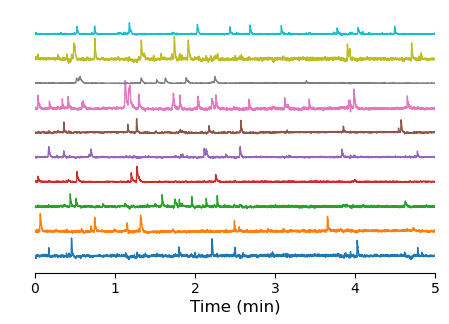

In [102]:
sel_roi_inds = np.array([291, 297, 299, 246, 106, 88, 36, 6, 263, 176])
#sel_roi_inds= [165,235, 210, 220, 360, 131, 363, 370] 
#sel_roi_inds =  np.array([165,235, 210, 220, 360, 131, 363, 370])
#Font Details
label_size=12
tick_size=10
title_size=9
#Get Data and Make Plot
fig, all_ax = plt.subplots(figsize=(5, 3.5), nrows=1, ncols=2)  #(1.8,1)
selTraces = processed_traces_df['608451_01062020']
#selTraces = processed_traces_df['608450_03092020']
selNcells = selTraces.loc[:,sel_roi_inds].shape[1]
offset_array = np.tile(range(selNcells), (selTraces.shape[0],1))
stagger_selTraces = selTraces.loc[:,sel_roi_inds] + 22*offset_array
ax=all_ax[1]
ax = stagger_selTraces.plot(ax=ax, linewidth=1, legend=False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
#ax.set_ylabel('Normalized\nFluorescence', labelpad=5, fontsize=label_size)
ax.set_yticks([])
ax.set_xlim([6000, 12000])
ax.set_xticks(range(6000, 12001, 1200))
ax.set_xticklabels(range(0,6,1), fontsize=tick_size)
ax.set_xlabel('Time (min)', fontsize=label_size, labelpad=2)
ax.set_position([0.1, 0.1, 0.8, 0.75])
yScale = ax.get_ylim()
#Scalebar Axes
ax_scale = all_ax[0]
ax_scale.set_position([0.05, 0.1, 0.025, 0.75])
ax_scale.set_ylim(yScale)
ax_scale.set_xticks([])
ax_scale.set_yticks([])
ax_scale.spines['top'].set_visible(False)
ax_scale.spines['bottom'].set_visible(False)
ax_scale.spines['right'].set_visible(False)
ax_scale.spines['left'].set_visible(False)
#ax_scale.plot([0,0],[70, 80], 'k')
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_2/')
plt.savefig('TraceInset2.svg', bbox_inches='tight')

In [337]:
#Make blocks such that 1 min before stim, ~ 1 min during and ~ 3 minutes after 
def trace_trial_blocks_sort(processed_traces,tot_block_time,stim_on_inds):
    processed_traces=processed_traces.T
    #Block Params & Initialization
    #tot_block_time =6000 #6000 timepoints is about 5 minutes
    before_stim_time = 1200 #1 min
    after_stim_time = tot_block_time - before_stim_time - 1 #Time after sound.  Subtract 1 as index between before sound and after sound is included as "spot"
    sound_ind = before_stim_time #Zero indexed, index of sound being on is equal to the before sound time

    #Pull out Blocks
    trace_exp_block = np.zeros((stim_on_inds.shape[0], processed_traces.shape[0],tot_block_time))

    for idx, spot in enumerate(stim_on_inds):
        trace_exp_block[idx,:,:] = processed_traces.loc[:,int(spot)-before_stim_time:int(spot)+after_stim_time].values
    trial_avg_block = trace_exp_block.mean(axis=0)

    ## Sorting 
    window_means = trial_avg_block[:,1200:2400].mean(axis=1)
    window_inds = np.argsort(window_means)
    sorted_trace_exp_block = np.zeros((stim_on_inds.shape[0],processed_traces.shape[0], tot_block_time))
    for idx, spot in enumerate(stim_on_inds):
        a=trace_exp_block[idx,:,:]
        sorted_trace_exp_block[idx,:,:]=a[window_inds,:]
    return trace_exp_block,trial_avg_block,window_inds,sorted_trace_exp_block

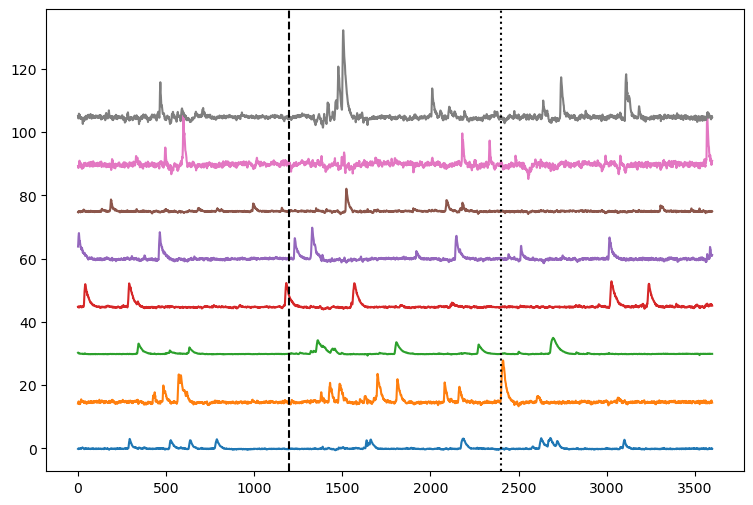

In [27]:
processed_traces= processed_traces_df['608451_01062020']
stim_on_inds=stim_onsets_df.loc['608451_01062020',:]
tot_block_time=6000
trace_exp_block,trial_avg_block,window_inds,sorted_trace_exp_block=trace_trial_blocks_sort(processed_traces,tot_block_time,stim_on_inds)

label_size=7
tick_size=6
title_size=9
#Plot Pick Params
stim_time_inds=np.array(stim_time.loc['608451_01062020',:])
#Make Plot4
fig, all_ax = plt.subplots(figsize=(9, 6), nrows=1, ncols=1) #(2.5, 3)
#Get Selected Data
pick_block = trace_exp_block[0,:,0:3600]


#Loop Through and do top plot
pick_cells = [165,235, 210, 220, 360, 131, 363, 370] #Trial 17: [2, 3, 4, 24, 26, 30, 32, 42, 122]
#print(np.argwhere(pick_map.values == 1)[6])
bl = 0
ax1=all_ax
for cl in pick_cells:
    ax1.plot(pick_block[cl]+bl)
    bl+=15
ax1.axvline(x=1200, linestyle='--', color='k')
ax1.axvline(x=1200+stim_time_inds[0], linestyle=':', color='k')
#plt.savefig('traces.png')
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_2/')
#plt.savefig('TraceInset2_stim.svg', bbox_inches='tight')

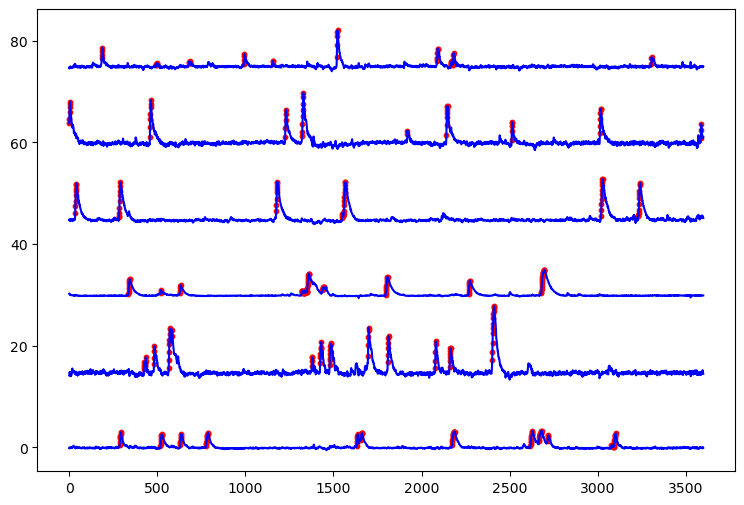

In [343]:
processed_traces= processed_traces_df['608451_01062020']
binary_traces=binary_traces_df['608451_01062020']
stim_on_inds=stim_onsets_df.loc['608451_01062020',:]
tot_block_time=6000
trace_exp_block,trial_avg_block,window_inds,sorted_trace_exp_block=trace_trial_blocks_sort(processed_traces,tot_block_time,stim_on_inds)
trace_bin_block,trial_avg_block,window_inds,sorted_trace_exp_block=trace_trial_blocks_sort(binary_traces,tot_block_time,stim_on_inds)

label_size=7
tick_size=6
title_size=9
#Plot Pick Params
stim_time_inds=np.array(stim_time.loc['608452_01062020',:])
#Make Plot4
fig, all_ax = plt.subplots(figsize=(9, 6), nrows=1, ncols=1) #(2.5, 3)
#Get Selected Data
pick_block = trace_exp_block[0,:,0:3600]
pick_bin_block = trace_bin_block[0,:,0:3600]


#Loop Through and do top plot
pick_cells = [165,235, 210, 220, 360, 131] #Trial 17: [2, 3, 4, 24, 26, 30, 32, 42, 122]
#print(np.argwhere(pick_map.values == 1)[6])
bl = 0
ax1=all_ax
for cl in pick_cells:
    ax1.plot(pick_block[cl]+bl,color='b')
    idx=np.argwhere(pick_bin_block[cl]==1)
    ax1.scatter(idx,pick_block[cl,idx]+bl,color='r',marker='.',s=40)
    bl+=15
#ax1.axvline(x=1200, linestyle='--', color='k')
#ax1.axvline(x=1200+stim_time_inds[0], linestyle=':', color='k')
plt.savefig('traces2.svg',bbox_inches='tight',dpi=1000)


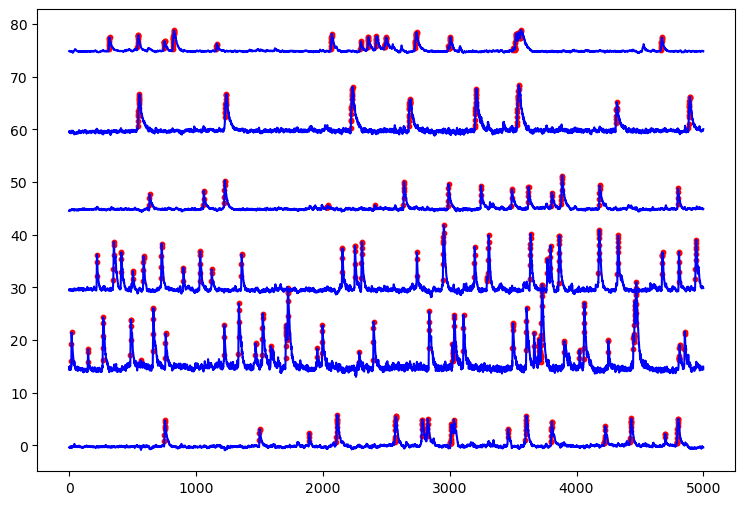

In [371]:
processed_traces= processed_traces_df['608452_01062020']
binary_traces=binary_traces_df['608452_01062020']
stim_on_inds=stim_onsets_df.loc['608452_01062020',:]
tot_block_time=6000
trace_exp_block,trial_avg_block,window_inds,sorted_trace_exp_block=trace_trial_blocks_sort(processed_traces,tot_block_time,stim_on_inds)
trace_bin_block,trial_avg_block,window_inds,sorted_trace_exp_block=trace_trial_blocks_sort(binary_traces,tot_block_time,stim_on_inds)

label_size=7
tick_size=6
title_size=9
#Plot Pick Params
stim_time_inds=np.array(stim_time.loc['608452_01062020',:])
#Make Plot4
fig, all_ax = plt.subplots(figsize=(9, 6), nrows=1, ncols=1) #(2.5, 3)
#Get Selected Data
pick_block = trace_exp_block[0,:,1000:7200]
pick_bin_block = trace_bin_block[0,:,1000:7200]


#Loop Through and do top plot
pick_cells = [69,50, 25, 122, 137, 73] #Trial 17: [2, 3, 4, 24, 26, 30, 32, 42, 122]
#print(np.argwhere(pick_map.values == 1)[6])
bl = 0
ax1=all_ax
for cl in pick_cells:
    ax1.plot(pick_block[cl]+bl,color='b')
    idx=np.argwhere(pick_bin_block[cl]==1)
    ax1.scatter(idx,pick_block[cl,idx]+bl,color='r',marker='.',s=40)
    bl+=15
#ax1.axvline(x=1200, linestyle='--', color='k')
#ax1.axvline(x=1200+stim_time_inds[0], linestyle=':', color='k')
plt.savefig('traces4.svg',bbox_inches='tight',dpi=1000)


In [470]:
np.size(neuron_trace)

42000

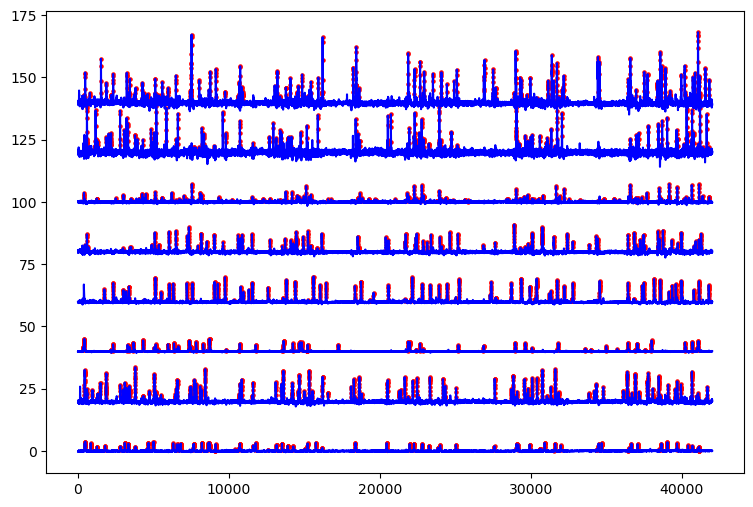

In [54]:
processed_traces= processed_traces_df['608451_01062020']
binary_traces=binary_traces_df['608451_01062020']
stim_on_inds=stim_onsets_df.loc['608451_01062020',:]

label_size=7
tick_size=6
title_size=9
#Plot Pick Params
stim_time_inds=np.array(stim_time.loc['608451_01062020',:])
#Make Plot4
fig, all_ax = plt.subplots(figsize=(9, 6), nrows=1, ncols=1) #(2.5, 3)
#Get Selected Data
pick_block = np.array(processed_traces).T
pick_bin_block = np.array(binary_traces).T


#Loop Through and do top plot
pick_cells = [165,235, 210, 220, 360, 131, 363, 370] #Trial 17: [2, 3, 4, 24, 26, 30, 32, 42, 122]
#print(np.argwhere(pick_map.values == 1)[6])
bl = 0
ax1=all_ax
for cl in pick_cells:
    ax1.plot(pick_block[cl,:]+bl,color='b')
    idx=np.argwhere(pick_bin_block[cl,:]==1)
    ax1.scatter(idx,pick_block[cl,idx]+bl,color='r',marker='.',s=20)
    bl+=20
#plt.savefig('traces2.svg',bbox_inches='tight',dpi=1000)


## Identify motion responsive neurons 

In [78]:
def n_frames_low_high_speed(sess_name,condition):
    if condition==1:
        motion=np.array(motion_df.loc[sess_name,:])
        motion=np.squeeze(motion)
        nan_motion_frames=np.argwhere(np.isnan(motion))
        baseline_indices=get_baseline_frames_index(sess_name)
        c=np.intersect1d(baseline_indices,nan_motion_frames)
        common_indices=np.setdiff1d(baseline_indices,c)
    else:
        common_indices=get_stim_frames_index(sess_name)
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index = np.intersect1d(common_indices,moving_frames)
    n_frames_high_speed= len(high_speed_index)
    a=stationary_period_df.loc[sess_name]
    stationary_frames= np.where(a==1)[0]
    low_speed_index = np.intersect1d(common_indices,stationary_frames)
    n_frames_low_speed= len(low_speed_index)
    return n_frames_high_speed,n_frames_low_speed
def get_low_hi_frames(sess_name,common_indices):
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index = np.intersect1d(common_indices,moving_frames)
    n_frames_high_speed= len(high_speed_index)
    a=stationary_period_df.loc[sess_name]
    stationary_frames= np.where(a==1)[0]
    low_speed_index = np.intersect1d(common_indices,stationary_frames)
    return high_speed_index,low_speed_index
def get_low_hi_periods(sess_name,common_indices):
    low_speed_df=stationary_period_df.loc[sess_name,common_indices]
    high_speed_df=moving_period_df.loc[sess_name,common_indices]
    return low_speed_df,high_speed_df
def get_diff(traces,high_speed_index,low_speed_index):
    high_speed_spike_rate=np.sum(traces.loc[:,high_speed_index],axis=1)/len(high_speed_index)
    low_speed_spike_rate=np.sum(traces.loc[:,low_speed_index],axis=1)/len(low_speed_index)
    diff=high_speed_spike_rate-low_speed_spike_rate
    return diff

In [79]:
def responsive_neurons_sustained_periods(sess_name):
    common_indices=remove_nan_motion_frames(sess_name)
    high_speed_index,low_speed_index= get_low_hi_frames(sess_name,common_indices)
    n_frames_low_speed= len(low_speed_index)

    if n_frames_low_speed>0:
        
        traces= binary_traces_df[sess_name].T
        Ncells = traces.shape[0]
        diff=get_diff(traces,high_speed_index,low_speed_index)
        shuffled_diff=np.zeros((Ncells,1000))
        low_speed_df,high_speed_df=get_low_hi_periods(sess_name,common_indices)
        np.random.seed(6)
        rand_shifts=np.random.randint(1,round(0.5*low_speed_df.shape[0]),size=1000)
        np.random.seed(2)
        rand_shifts_2=np.random.randint(1,round(0.5*high_speed_df.shape[0]),size=1000)
        
        for n in np.arange(0,1000,1):
        # Shuffle- randomly pick same number of low speed and high speed frames by circular shift 
            shifted_low_speed_df=np.roll(low_speed_df,rand_shifts[n])
            shifted_high_speed_df=np.roll(high_speed_df,rand_shifts_2[n])
            shuffled_low_speed_index=np.where(shifted_low_speed_df==1)[0]
            shuffled_high_speed_index=np.where(shifted_high_speed_df==1)[0]
            shuffled_diff[:,n]=get_diff(traces,shuffled_high_speed_index,shuffled_low_speed_index)
    threshold=[]
    for i in np.arange(0,Ncells,1):
        threshold.append(np.percentile(shuffled_diff[i,:],97.5))
    responsive_cells = np.array(np.where(diff>threshold))
    percent_responsive_cells= np.array(np.where(diff>threshold)).shape[1]/Ncells*100
    n_resp_cells=np.array(np.where(diff>threshold)).shape[1]
    return responsive_cells,percent_responsive_cells,n_resp_cells

In [80]:
def responsive_neurons_sustained_periods_dec(sess_name):
    common_indices=remove_nan_motion_frames(sess_name)
    high_speed_index,low_speed_index= get_low_hi_frames(sess_name,common_indices)
    n_frames_low_speed= len(low_speed_index)

    if n_frames_low_speed>0:
        
        traces= binary_traces_df[sess_name].T
        Ncells = traces.shape[0]
        diff=get_diff(traces,high_speed_index,low_speed_index)
        shuffled_diff=np.zeros((Ncells,1000))
        low_speed_df,high_speed_df=get_low_hi_periods(sess_name,common_indices)
        np.random.seed(6)
        rand_shifts=np.random.randint(1,round(0.5*low_speed_df.shape[0]),size=1000)
        np.random.seed(2)
        rand_shifts_2=np.random.randint(1,round(0.5*high_speed_df.shape[0]),size=1000)
        
        for n in np.arange(0,1000,1):
        # Shuffle- randomly pick same number of low speed and high speed frames by circular shift 
            shifted_low_speed_df=np.roll(low_speed_df,rand_shifts[n])
            shifted_high_speed_df=np.roll(high_speed_df,rand_shifts_2[n])
            shuffled_low_speed_index=np.where(shifted_low_speed_df==1)[0]
            shuffled_high_speed_index=np.where(shifted_high_speed_df==1)[0]
            shuffled_diff[:,n]=get_diff(traces,shuffled_high_speed_index,shuffled_low_speed_index)
    threshold=[]
    for i in np.arange(0,Ncells,1):
        threshold.append(np.percentile(shuffled_diff[i,:],2.5))
    responsive_cells = np.array(np.where(diff<threshold))
    percent_responsive_cells= np.array(np.where(diff<threshold)).shape[1]/Ncells*100
    n_resp_cells=np.array(np.where(diff<threshold)).shape[1]
    return responsive_cells,percent_responsive_cells,n_resp_cells

In [86]:
def responsive_neurons_sustained_periods_events(sess_name):
    os.chdir( "C:/Users/sudiksha/Documents/Codes")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    f.close()
    common_indices=remove_nan_motion_frames(sess_name)
    high_speed_index,low_speed_index= get_low_hi_frames(sess_name,common_indices)
    traces= onset_binary_traces_df[sess_name].T
    Ncells = traces.shape[0]
    high_speed_spike_rate=np.sum(traces.loc[resp_cells,high_speed_index],axis=1)/len(high_speed_index)*20
    low_speed_spike_rate=np.sum(traces.loc[resp_cells,low_speed_index],axis=1)/len(low_speed_index)*20
    return low_speed_spike_rate,high_speed_spike_rate

In [82]:
def responsive_neurons_sustained_periods_activity(sess_name):
    os.chdir( "C:/Users/sudiksha/Documents/Codes")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    f.close()
    common_indices=remove_nan_motion_frames(sess_name)
    high_speed_index,low_speed_index= get_low_hi_frames(sess_name,common_indices)
    traces= binary_traces_df[sess_name].T
    Ncells = traces.shape[0]
    high_speed_spike_rate=np.sum(traces.loc[resp_cells,high_speed_index],axis=1)/len(high_speed_index)*20
    low_speed_spike_rate=np.sum(traces.loc[resp_cells,low_speed_index],axis=1)/len(low_speed_index)*20
    return low_speed_spike_rate,high_speed_spike_rate

In [27]:
sess_list=[]
for mouse, cell_df in binary_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)

percent_responsive_sustained =np.zeros(len(sess_list))
n_resp_cells=np.zeros(len(sess_list))
f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"w")
for i in np.arange(0,len(sess_list),1):
    sess_name=sess_list[i]
    resp_cells,percent_responsive_sustained[i],n_resp_cells[i]=responsive_neurons_sustained_periods(sess_name)
    dset1 = f.create_dataset(sess_list[i], data=resp_cells)
f.close()
print(percent_responsive_sustained)

[49.11242604 88.05970149 65.90163934 76.98630137 47.53787879 87.72378517
 88.53211009 70.44198895 55.33333333 75.77639752 76.25899281 19.7080292
 64.61538462 86.53846154]


In [317]:
responsive_neurons_sustained_periods_dec(sess_list[4])

(array([[  1,   2,  27,  38,  42,  57, 106, 116, 118, 143, 153, 174, 231,
         276, 291, 292, 335, 354, 474]]),
 3.5984848484848486,
 19)

In [37]:
sess_list=[]
for mouse, cell_df in binary_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)

percent_responsive_sustained_dec =np.zeros(len(sess_list))
n_resp_cells_dec=np.zeros(len(sess_list))
#f=h5py.File('Motion_resp_cells_sustained_10Hz_final_dec.h5',"w")
for i in np.arange(0,len(sess_list),1):
    #print(i)
    sess_name=sess_list[i]
    resp_cells_dec,percent_responsive_sustained_dec[i],n_resp_cells_dec[i]=responsive_neurons_sustained_periods_dec(sess_name)
    #dset1 = f.create_dataset(sess_list[i], data=resp_cells_dec)
#f.close()

In [63]:
print(percent_responsive_sustained_dec),print(n_resp_cells_dec)

[1.18343195 0.         4.59016393 4.93150685 3.59848485 1.27877238
 1.37614679 6.90607735 6.         1.86335404 1.43884892 5.10948905
 2.30769231 0.        ]
[ 2.  0. 14. 18. 19.  5.  3. 25. 18.  3.  2.  7.  3.  0.]


(None, None)

In [35]:
n_high_speed_frames =[]
n_low_speed_frames =[]
for i in np.arange(0,len(sess_list),1):
    n_high_speed_frames.append(n_frames_low_high_speed(sess_list[i],1)[0])
    n_low_speed_frames.append(n_frames_low_high_speed(sess_list[i],1)[1])

In [36]:
Ncells=[]
for i in np.arange(0,len(sess_list),1):
    traces= binary_traces_df[sess_list[i]].T
    Ncells.append(traces.shape[0])

In [ ]:
f=h5py.File('Motion_resp_cells_sustained_10Hz_final_dec.h5',"r")


In [ ]:
#Make dataframe and use sns.boxplt,later add session names 
data={'Session':sess_list,'Low speed':n_low_speed_frames,'High speed':n_high_speed_frames,'percent_responsive':percent_responsive_sustained,'ratio':np.array(n_high_speed_frames)/np.array(n_low_speed_frames),'N_resp_cells':n_resp_cells,'Ncells':Ncells}
sustained_df=pd.DataFrame(data)

In [31]:
sustained_df=sustained_df[(sustained_df.ratio <10)]
sustained_df

,Session,Low speed,High speed,percent_responsive,ratio,N_resp_cells,Ncells
0,602101_03092020,23506,3610,49.112426,0.153578,83.0,169
1,602101_07082020,9265,13737,88.059701,1.482677,59.0,67
2,608448_01062020,5264,23457,65.901639,4.456117,201.0,305
3,608448_01172020,11289,16867,76.986301,1.494109,281.0,365
4,608450_03092020,15337,9027,47.537879,0.588577,251.0,528
5,608451_01062020,9304,17973,87.723785,1.931750,343.0,391
6,608451_07082020,5930,21414,88.532110,3.611130,193.0,218
7,608452_01062020,9885,18386,70.441989,1.859990,255.0,362
8,608452_07082020,2580,23897,55.333333,9.262403,166.0,300
9,611111_07082020,10264,17761,75.776398,1.730417,122.0,161


In [32]:
sustained_df['Ncells'].sum(),sustained_df['N_resp_cells'].sum(),sustained_df['N_resp_cells'].sum()/sustained_df['Ncells'].sum()

(3187, 2189.0, 0.6868528396611233)

In [438]:
# Combine 10 Hz and 145 Hz sessions - 24
print((2189+2100),(3187+2909),(2189+2100)/(3187+2909))

4289 6096 0.7035761154855643


In [33]:
sustained_df.describe()

,Low speed,High speed,percent_responsive,ratio,N_resp_cells,Ncells
count,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000
mean,8824.230769,18456.461538,71.755262,3.457544,168.384615,245.153846
std,5750.069321,6549.261289,14.550137,2.763017,94.348237,142.324070
min,2580.000000,3610.000000,47.537879,0.153578,45.000000,52.000000
25%,4195.000000,16867.000000,64.615385,1.494109,84.000000,139.000000
50%,9265.000000,18386.000000,75.776398,1.931750,166.000000,218.000000
75%,10264.000000,23457.000000,86.538462,5.625394,251.000000,362.000000
max,23506.000000,25705.000000,88.532110,9.262403,343.000000,528.000000


In [854]:
#Make dataframe and use sns.boxplt,later add session names 
data={'Session':sess_list,'Low speed':n_low_speed_frames,'High speed':n_high_speed_frames,'percent_responsive':percent_responsive_sustained_dec,'ratio':np.array(n_high_speed_frames)/np.array(n_low_speed_frames),'N_resp_cells':n_resp_cells_dec,'Ncells':Ncells}
sustained_df=pd.DataFrame(data)
sustained_df=sustained_df[(sustained_df.ratio <10)]
#corr_df=corr_df.drop([10])
sustained_df

,Session,Low speed,High speed,percent_responsive,ratio,N_resp_cells,Ncells
0,602101_03092020,23506,3610,1.183432,0.153578,2.0,169
1,602101_07082020,9265,13737,0.000000,1.482677,0.0,67
2,608448_01062020,5264,23457,4.590164,4.456117,14.0,305
3,608448_01172020,11289,16867,4.931507,1.494109,18.0,365
4,608450_03092020,15337,9027,3.598485,0.588577,19.0,528
5,608451_01062020,9304,17973,1.278772,1.931750,5.0,391
6,608451_07082020,5930,21414,1.376147,3.611130,3.0,218
7,608452_01062020,9885,18386,6.906077,1.859990,25.0,362
8,608452_07082020,2580,23897,6.000000,9.262403,18.0,300
9,611111_07082020,10264,17761,1.863354,1.730417,3.0,161


In [856]:
sustained_df['Ncells'].sum(),sustained_df['N_resp_cells'].sum(),sustained_df['N_resp_cells'].sum()/sustained_df['Ncells'].sum()

(3187, 112.0, 0.03514276749294007)

In [859]:
# Combine 10 Hz and 145 Hz sessions - 24
print((112+111),(3187+2909),(112+111)/(3187+2909)*100)

223 6096 3.6581364829396326


In [87]:
low_speed_spike_rate,high_speed_spike_rate=responsive_neurons_sustained_periods_events(sess_list[0])
for i in np.arange(1,len(sess_list),1):
    if i==11:
        continue
    else:
        a,b=responsive_neurons_sustained_periods_events(sess_list[i])
        low_speed_spike_rate=np.concatenate((low_speed_spike_rate,a))
        high_speed_spike_rate=np.concatenate((high_speed_spike_rate,b))
print(low_speed_spike_rate.shape)   
print(np.mean(low_speed_spike_rate),np.std(low_speed_spike_rate),np.mean(high_speed_spike_rate),np.std(high_speed_spike_rate))

(2189,)
0.009879080182004804 0.013562079176798598 0.07072089469684884 0.04063138105504226


In [88]:
np.min(high_speed_spike_rate),np.max(high_speed_spike_rate)

(0.0011857473172466946, 0.3047091412742382)

In [89]:
f1 = h5py.File('high_speed_mov_resp_spike_rate_145Hz2.h5', "r")
high_speed_spike_rate2=np.array(f1['spike_rate'])
f1.close()

In [90]:
high_speed_spike_rate_tot=np.concatenate((high_speed_spike_rate,high_speed_spike_rate2))
print(np.min(high_speed_spike_rate_tot),np.max(high_speed_spike_rate_tot),np.mean(high_speed_spike_rate_tot),np.std(high_speed_spike_rate_tot))

0.0011857473172466946 0.31102302180210395 0.07281747142102117 0.040419354298644274


In [185]:
high_speed_spike_rate_tot.shape

(4325,)

In [83]:
low_speed_spike_rate,high_speed_spike_rate=responsive_neurons_sustained_periods_activity(sess_list[0])
for i in np.arange(1,len(sess_list),1):
    if i==11:
        continue
    else:
        a,b=responsive_neurons_sustained_periods_activity(sess_list[i])
        low_speed_spike_rate=np.concatenate((low_speed_spike_rate,a))
        high_speed_spike_rate=np.concatenate((high_speed_spike_rate,b))
print(low_speed_spike_rate.shape)   
print(np.mean(low_speed_spike_rate),np.std(low_speed_spike_rate),np.mean(high_speed_spike_rate),np.std(high_speed_spike_rate))

(2189,)
0.048555898352202434 0.06967077202413716 0.4310677091273225 0.23788325497019064


In [84]:
f1 = h5py.File('high_speed_mov_resp_activity_rate_145Hz2.h5', "r")
high_speed_spike_rate2=np.array(f1['activity_rate'])
f1.close()

In [85]:
high_speed_spike_rate_tot=np.concatenate((high_speed_spike_rate,high_speed_spike_rate2))
print(np.min(high_speed_spike_rate_tot),np.max(high_speed_spike_rate_tot),np.mean(high_speed_spike_rate_tot),np.std(high_speed_spike_rate_tot))

0.021142825349134815 1.745152354570637 0.4408203327016225 0.2373496736770683


In [155]:
#Make blocks such that 5 s min before motion and 5 s after and the onset frame - 201 frames 
def make_Ca_motion_trial_blocks(traces_df,sess_name,tot_block_time,condition,flag):
    if flag==1:
        a=np.array(motion_onsets_df.loc[sess_name,:])
    else:
        a=np.array(motion_onsets_df_without.loc[sess_name,:])
    if condition==1:
        motion_onsets= np.where(a==1)[0]
    elif condition==2:
        motion_onset_frames= np.where(a==1)[0]
        # modify this based on whether you want to exclude a min after stim or not
        baseline_frames=get_baseline_frames_index(sess_name)
        motion_onsets=baseline_frames[np.isin(baseline_frames,motion_onset_frames)]
    elif condition==3:
        motion_onset_frames= np.where(a==1)[0]
        stim_frames=get_stim_frames_index(sess_name)
        motion_onsets=stim_frames[np.isin(stim_frames,motion_onset_frames)]
        
    print(motion_onsets.shape)
    pre_window= int((tot_block_time-1)/2)
    post_window = tot_block_time - pre_window 
    
    processed_motion_traces=motion_df.loc[sess_name,:]
    motion_exp_block = np.zeros((motion_onsets.shape[0],tot_block_time))

    for idx, spot in enumerate(motion_onsets):
        if spot-pre_window>0 and spot+post_window-1<42000:
            motion_exp_block[idx,:] = np.squeeze(processed_motion_traces[(spot)-pre_window:(spot)+post_window])
        else:
            continue
    
    processed_traces= traces_df[sess_name]
    processed_traces =processed_traces.T
    os.chdir("C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    motion_resp_cells=np.squeeze(np.array(f[sess_name]))
    trace_exp_block = np.zeros((motion_onsets.shape[0], motion_resp_cells.shape[0],tot_block_time))
    f.close()
    for idx, spot in enumerate(motion_onsets):
        if spot-pre_window>0 and spot+post_window-1<42000:
            trace_exp_block[idx,:,:] = processed_traces.loc[motion_resp_cells,spot-pre_window:spot+post_window-1].values
        else:
            continue
    # Can also return motion_onsets
    return motion_exp_block, trace_exp_block

In [156]:
#Make blocks such that 5 s min before motion and 5 s after and the onset frame - 201 frames 
def make_Ca_motion_trial_blocks_one_neuron(traces_df,sess_name,tot_block_time,condition,flag,neuron_number):
    if flag==1:
        a=np.array(motion_onsets_df.loc[sess_name,:])
    else:
        a=np.array(motion_onsets_df_without.loc[sess_name,:])
    if condition==1:
        motion_onsets= np.where(a==1)[0]
    elif condition==2:
        motion_onset_frames= np.where(a==1)[0]
        # modify this based on whether you want to exclude a min after stim or not
        baseline_frames=get_baseline_frames_index(sess_name)
        motion_onsets=baseline_frames[np.isin(baseline_frames,motion_onset_frames)]
    elif condition==3:
        motion_onset_frames= np.where(a==1)[0]
        stim_frames=get_stim_frames_index(sess_name)
        motion_onsets=stim_frames[np.isin(stim_frames,motion_onset_frames)]
        
    print(motion_onsets.shape)
    pre_window= int((tot_block_time-1)/2)
    post_window = tot_block_time - pre_window 
    
    processed_motion_traces=motion_df.loc[sess_name,:]
    motion_exp_block = np.zeros((motion_onsets.shape[0],tot_block_time))

    for idx, spot in enumerate(motion_onsets):
        if spot-pre_window>0 and spot+post_window-1<42000:
            motion_exp_block[idx,:] = np.squeeze(processed_motion_traces[(spot)-pre_window:(spot)+post_window])
        else:
            continue
    
    processed_traces= traces_df[sess_name]
    processed_traces =processed_traces.T
    os.chdir("C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    motion_resp_cells=np.squeeze(np.array(f[sess_name]))
    trace_exp_block = np.zeros((motion_onsets.shape[0],1,tot_block_time))
    f.close()
    for idx, spot in enumerate(motion_onsets):
        if spot-pre_window>0 and spot+post_window-1<42000:
            trace_exp_block[idx,:,:] = processed_traces.loc[neuron_number,spot-pre_window:spot+post_window-1].values
        else:
            continue
    # Can also return motion_onsets
    return motion_exp_block, trace_exp_block

(77,)


Text(0.5, 0, 'Time (in s)')

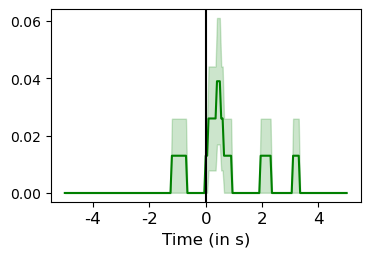

In [217]:
sess_name='608450_03092020'
traces_df=binary_traces_df
tot_block_time=201
condition=2
flag=1
neuron_number=280

fig, ax4 = plt.subplots(1, 1,figsize=(4,2.5))
motion_onset_block,trace_motion_onset_block=make_Ca_motion_trial_blocks_one_neuron(traces_df,sess_name,tot_block_time,condition,flag,neuron_number)
trace_motion_onset_block=np.squeeze(trace_motion_onset_block)
avg_across_onsets= trace_motion_onset_block.mean(axis=0)

ax4.plot(avg_across_onsets,color='green',label='Ca response')
ax4.axvline(x=100,color='k')
l_std=np.std(trace_motion_onset_block,axis=0)/np.sqrt(trace_motion_onset_block.shape[0])
ax4.fill_between(np.arange(0,201,1), avg_across_onsets-l_std, avg_across_onsets+l_std,color='green',alpha=0.2)
ax4.set_xticks(np.arange(20, 201, 40))
ax4.set_xticklabels(np.arange(-4,5, 2).astype(int),fontsize=12)
#ax2.set_ylabel('Mean Ca \nresponse',fontsize=12)
ax4.set_xlabel('Time (in s)',fontsize=12)
#plt.savefig(sess_name+'_pop_motion_onsets_same plot_one_neuron_280.svg',dpi=1200,bbox_inches='tight',pad_inches=0.01)


(77,)


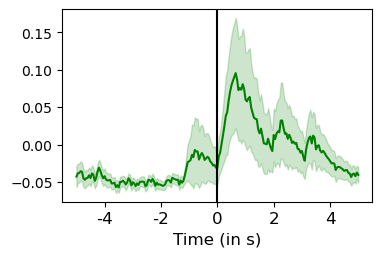

In [218]:
### sess_name='608450_03092020'
traces_df=processed_traces_df
tot_block_time=201
condition=2
flag=1
neuron_number=280

fig, ax4 = plt.subplots(1, 1,figsize=(4,2.5))
motion_onset_block,trace_motion_onset_block=make_Ca_motion_trial_blocks_one_neuron(traces_df,sess_name,tot_block_time,condition,flag,neuron_number)
trace_motion_onset_block=np.squeeze(trace_motion_onset_block)
avg_across_onsets= trace_motion_onset_block.mean(axis=0)

ax4.plot(avg_across_onsets,color='green',label='Ca response')
ax4.axvline(x=100,color='k')
l_std=np.std(trace_motion_onset_block,axis=0)/np.sqrt(trace_motion_onset_block.shape[0])
ax4.fill_between(np.arange(0,201,1), avg_across_onsets-l_std, avg_across_onsets+l_std,color='green',alpha=0.2)
ax4.set_xticks(np.arange(20, 201, 40))
ax4.set_xticklabels(np.arange(-4,5, 2).astype(int),fontsize=12)
#ax2.set_ylabel('Mean Ca \nresponse',fontsize=12)
ax4.set_xlabel('Time (in s)',fontsize=12)
plt.savefig(sess_name+'_pop_motion_onsets_same plot_one_neuron_280_df_f.svg',dpi=1200,bbox_inches='tight',pad_inches=0.01)


(23,)


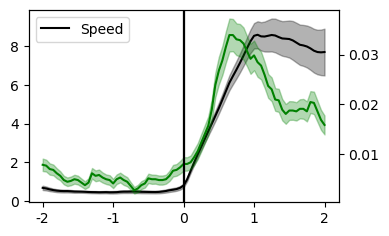

In [71]:
sess_name='608452_01062020'
traces_df=binary_traces_df
tot_block_time=81
condition=2
flag=1
fig, ax2 = plt.subplots(1, 1,figsize=(4,2.5))
motion_onset_block,trace_motion_onset_block=make_Ca_motion_trial_blocks(traces_df,sess_name,tot_block_time,condition,flag)
ax2.plot(motion_onset_block.mean(axis=0),color='k',label='Speed')
l_std=np.std(motion_onset_block,axis=0)/np.sqrt(motion_onset_block.shape[0])
ax2.fill_between(np.arange(0,81,1),motion_onset_block.mean(axis=0) -l_std, motion_onset_block.mean(axis=0)+l_std,color='k',alpha=0.3)
ax2.axvline(x=40,color='k')
#ax2.set_ylabel('Mean speed\n(cm/s)',fontsize=12)
ax2.axvline(x=40,color='k')

avg_across_onsets= trace_motion_onset_block.mean(axis=0)
avg_across_cells= avg_across_onsets.mean(axis=0)
ax4 = ax2.twinx()  # instantiate a second axes that shares the same x-axis
ax4.plot(avg_across_cells,color='green',label='Ca response')
ax4.axvline(x=40,color='k')
l_std=np.std(avg_across_onsets,axis=0)/np.sqrt(avg_across_onsets.shape[0])
ax4.fill_between(np.arange(0,81,1), avg_across_cells-l_std, avg_across_cells+l_std,color='green',alpha=0.3)
ax4.set_xticks(np.arange(0, 81, 20))
ax4.set_xticklabels(np.arange(-2,3, 1).astype(int),fontsize=12)
#ax2.set_ylabel('Mean Ca \nresponse',fontsize=12)
ax4.set_xlabel('Time (in s)',fontsize=12)
ax2.legend()
plt.savefig(sess_name+'_pop_motion_onsets_same plot.svg',dpi=1200,bbox_inches='tight',pad_inches=0.01)

In [72]:
def window_wise_firing_rate_plot(sess_name):
    firing_rate=[]
    for i in np.arange(0,43200,1200):
        a=onset_binary_traces_df[sess_name].loc[i:i+1200,:]
        firing_rate.append(np.mean(a.sum()))
    plt.figure()
    plt.scatter(np.arange(0,36,1),firing_rate)
    plt.ylabel('Event rate(/min)')
    plt.xlabel('Window idx')
    #return firing_rate

In [73]:
def window_wise_firing_rate_plot2(sess_name):
    firing_rate=[]
    mean_motion=[]
    motion=motion_df.loc[sess_name]
    for i in np.arange(0,43200,1200):
        a=onset_binary_traces_df[sess_name].loc[i:i+1200,:]
        m=motion.loc[i:i+1200]
        firing_rate.append(np.mean(a.sum()))
        mean_motion.append(np.mean(m))
    fig,(ax1,ax2)=plt.subplots(2,1,sharex=True)
    ax1.scatter(np.arange(0,36,1),firing_rate)
    ax2.scatter(np.arange(0,36,1),mean_motion)
    ax1.set_ylabel('Event rate(/min)')
    ax2.set_ylabel('Speed (cms/s)')
    plt.xlabel('Window idx')
    #return firing_rate

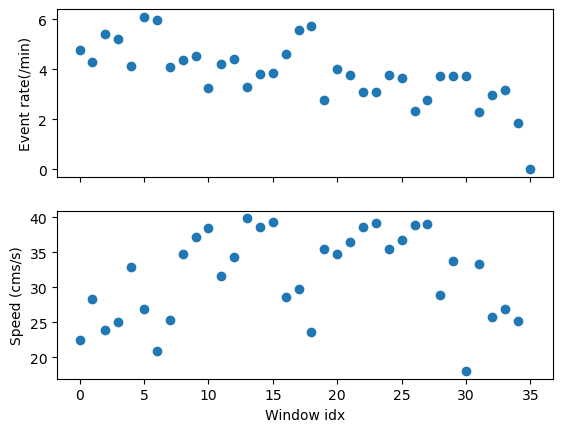

In [74]:
window_wise_firing_rate_plot2(sess_list[11])

### Cross correlation 

In [29]:
os.chdir( "C:/Users/sudiksha/Documents/Codes/")

In [76]:
from scipy import signal

#https://stackoverflow.com/questions/41492882/find-time-shift-of-two-signals-using-cross-correlation
def lag_finder(y1, y2, sr):
    n = len(y1)

    corr = signal.correlate(y2, y1, mode='same') / np.sqrt(signal.correlate(y1, y1, mode='same')[int(n/2)] * signal.correlate(y2, y2, mode='same')[int(n/2)])
    # Why changing delay_arr afffects all analysis ?
    delay_arr = np.linspace(-0.5*n/sr, 0.5*n/sr, n)
    delay = delay_arr[np.argmax(corr)]
    print('y2 is ' + str(delay) + ' behind y1')

    plt.figure()
    plt.plot(delay_arr, corr)
    plt.title('Lag: ' + str(np.round(delay, 3)*1000) + ' ms',fontsize=14)
    plt.xlabel('Lag (s)',fontsize=14)
    plt.ylabel('Correlation coeff',fontsize=14)
    #plt.show()
    return delay,max(corr)

In [77]:
from scipy import signal

#https://stackoverflow.com/questions/41492882/find-time-shift-of-two-signals-using-cross-correlation
def lag_finder2(y1, y2, sr):
    n = len(y1)

    corr = signal.correlate(y2, y1, mode='same') / np.sqrt(signal.correlate(y1, y1, mode='same')[int(n/2)] * signal.correlate(y2, y2, mode='same')[int(n/2)])
    # Why changing delay_arr afffects all analysis ?
    delay_arr = np.linspace(-0.5*n/sr, 0.5*n/sr, n)
    delay = delay_arr[np.argmax(corr)]
    
    return delay,max(corr),delay_arr,corr

In [78]:
def get_lag_motion_responsive_sum(sess_name):
    #responsive_cells=get_motion_responsive_cells(sess_name,40)[0]
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    responsive_cells=np.squeeze(np.array(f[sess_name]))
    f.close()
    frames=get_baseline_frames_index(sess_name) 
    processed_motion_traces=raw_motion_df.loc[sess_name,:]
    processed_traces= binary_traces_df[sess_name]
    sum_traces= processed_traces.loc[:,responsive_cells].sum(axis=1)   
    common_index=remove_nan_motion_frames(sess_name)
    return lag_finder(sum_traces[common_index],processed_motion_traces[common_index], 20)

In [79]:
def get_lag_motion_responsive_sum_stim(sess_name):
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    responsive_cells=np.squeeze(np.array(f[sess_name]))
    f.close()
    frames=get_stim_frames_index(sess_name) 
    processed_motion_traces=raw_motion_df.loc[sess_name,:]
    processed_traces= binary_traces_df[sess_name]
    sum_traces= processed_traces.loc[:,responsive_cells].sum(axis=1)   
    #common_index=remove_nan_motion_frames(sess_name)
    return lag_finder(sum_traces[frames],processed_motion_traces[frames], 20)

In [80]:
sess_list=[]
for mouse, cell_df in processed_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)

602101_03092020
y2 is 0.0 behind y1
602101_07082020
y2 is 0.05000167280024925 behind y1
608448_01062020
y2 is 0.0 behind y1
608448_01172020
y2 is 0.05000167436878655 behind y1
608450_03092020
y2 is 0.0 behind y1
608451_01062020
y2 is 0.07500251046019457 behind y1
608451_07082020
y2 is 0.10000334515291343 behind y1
608452_01062020
y2 is 0.07500251130079505 behind y1
608452_07082020
y2 is 0.0 behind y1
611111_07082020
y2 is 0.42501422118118626 behind y1
611311_03092020
y2 is 0.12500419167702148 behind y1
612535_07082020
y2 is 42.40142015005358 behind y1
615883_02052021
y2 is 0.0 behind y1
615883_03122021
y2 is -1.2000402252614322 behind y1


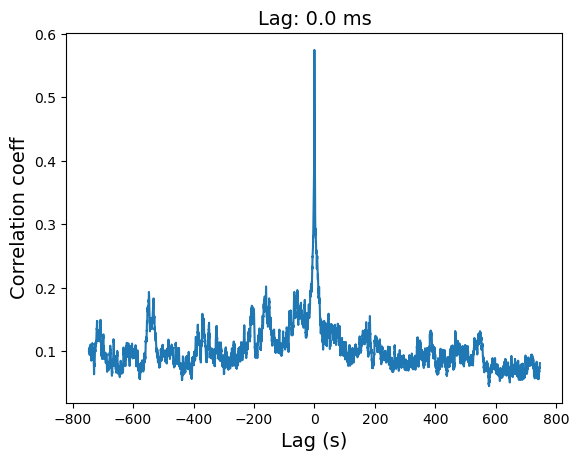

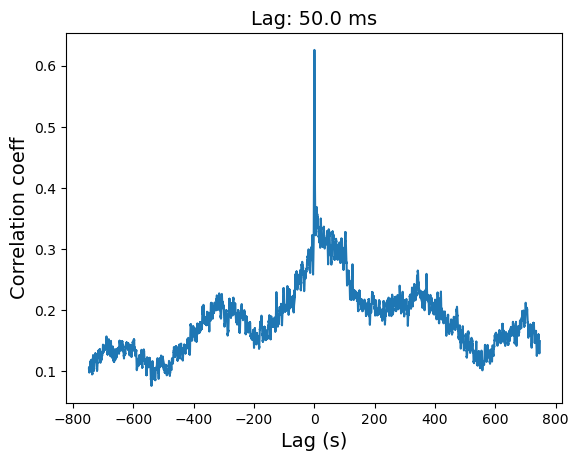

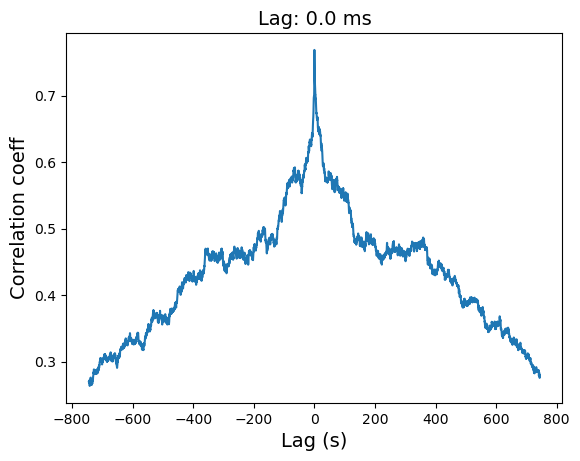

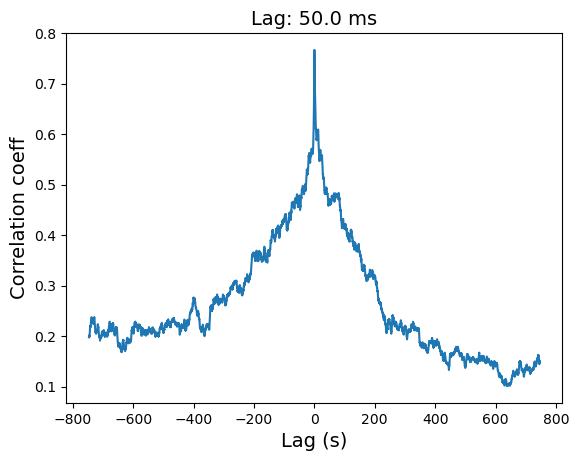

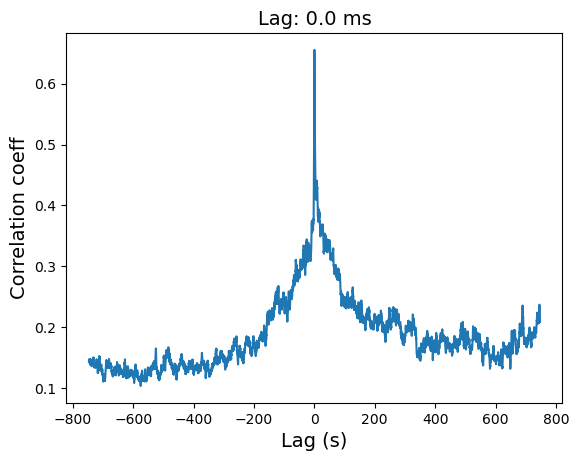

...

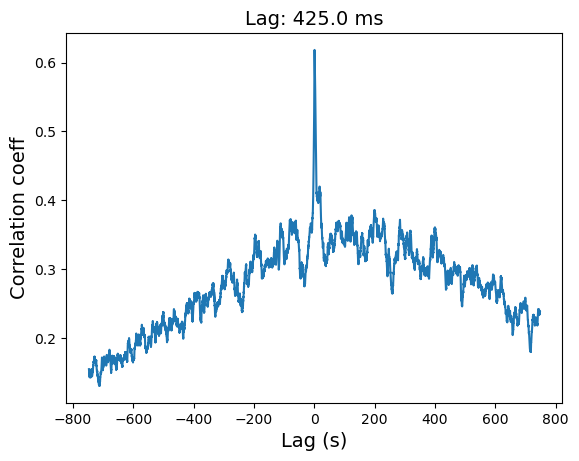

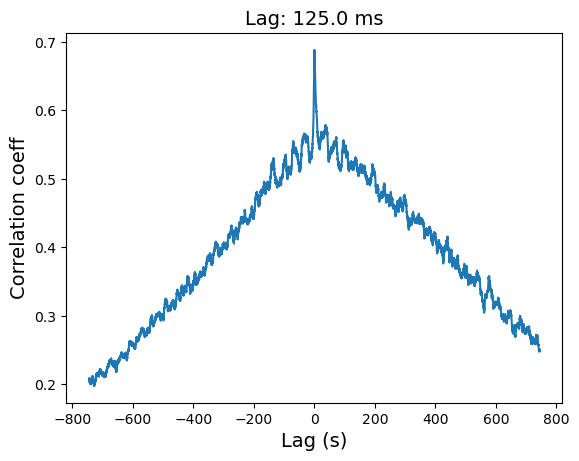

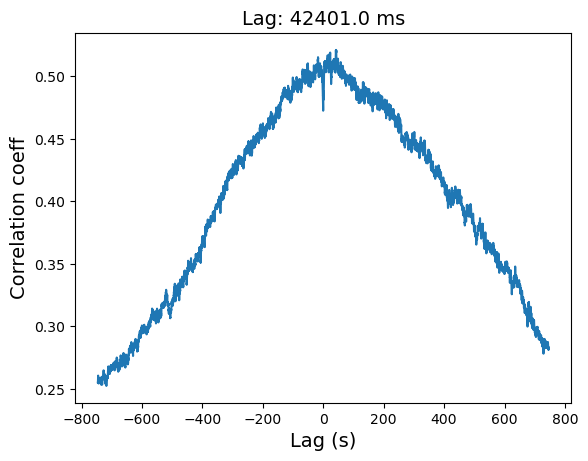

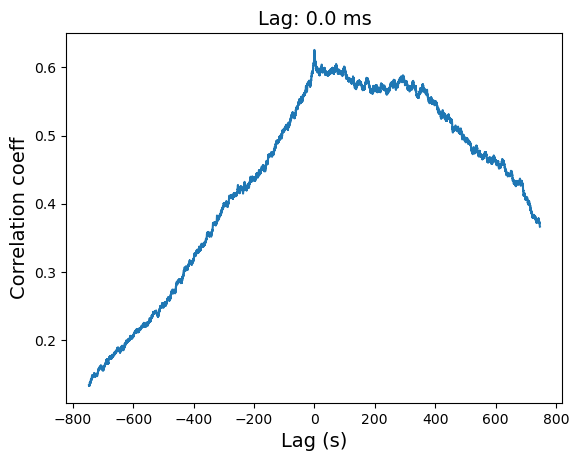

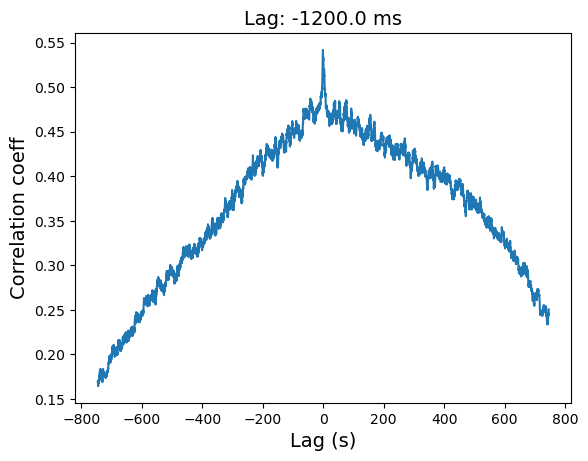

In [81]:
sess_list=[]
for mouse, cell_df in processed_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)
lag_arr=np.zeros(len(sess_list))
max_corr=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    sess_name=sess_list[i]
    print(sess_name)
    lag_arr[i],max_corr[i]=get_lag_motion_responsive_sum(sess_name)

In [82]:
idx=lag_arr>=0
idx2=lag_arr<1
#idx2=lag_arr<=0.5
i=idx*idx2
lag_clean_arr=lag_arr[i]
print(np.mean(lag_clean_arr),np.std(lag_clean_arr))

0.07500251057842888 0.11365531739551511


y2 is 0.07500251130079505 behind y1


(0.6, 0.8)

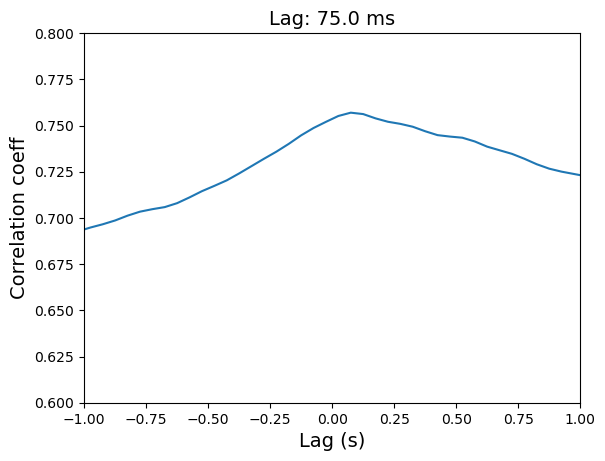

In [83]:
sess_name='608452_01062020'
get_lag_motion_responsive_sum(sess_name)
plt.xlim([-1,1])
plt.ylim([0.6,0.8])
#x_coord =0.275 # x value you want to highlight
#y_coord = 0.725# y value you want to highlight

#x_highlighting = [-2, x_coord, x_coord]
#y_highlighting = [y_coord, y_coord, 0]

#plt.plot(x_highlighting, y_highlighting,linestyle='--')
#plt.xticks(np.arange(-5,5,1),labels =np.arange(-5000,5200,1000))
#plt.ylim([0.5,0.8])
#plt.savefig('cross_corr'+sess_name+'_baseline_Eric.svg',dpi=1200,bbox_inches='tight')

y2 is 0.2250374313757959 behind y1
y2 is 0.10001668891854365 behind y1
y2 is 0.050008316699944544 behind y1
y2 is 0.05000833611202893 behind y1
y2 is 0.0 behind y1
y2 is 3.9756628314157183 behind y1
y2 is 0.12502082986168261 behind y1
y2 is 0.025004168751053157 behind y1
y2 is 0.02500415489447505 behind y1
y2 is 0.07501248543366046 behind y1
y2 is -0.2500417083750506 behind y1
y2 is -36.406066666666675 behind y1
y2 is -0.0500083808246643 behind y1
y2 is -1.5502579893475286 behind y1


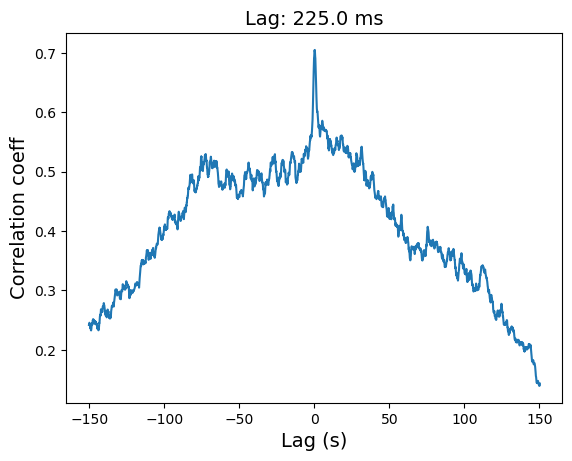

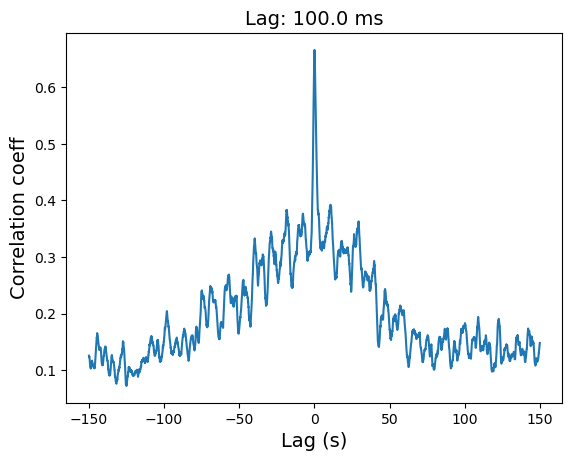

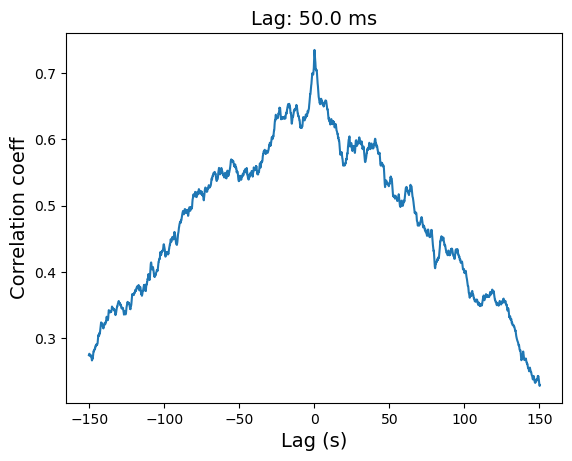

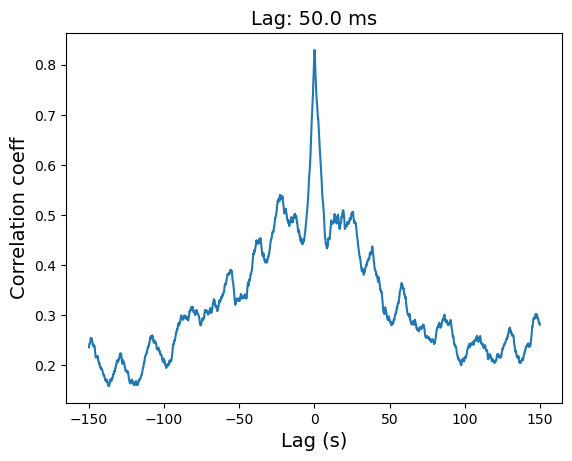

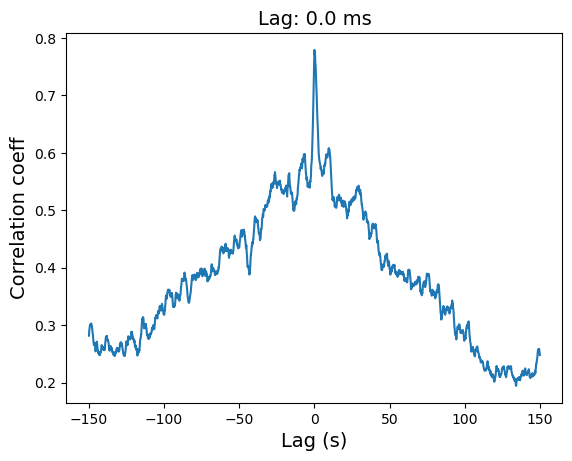

...

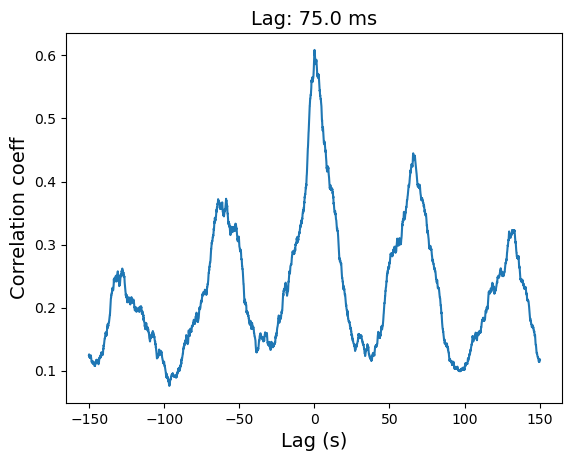

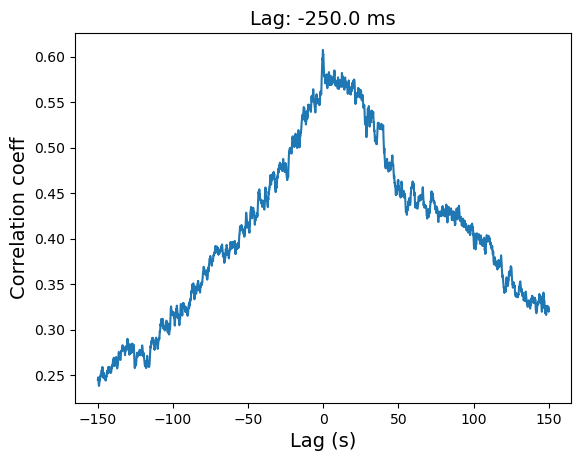

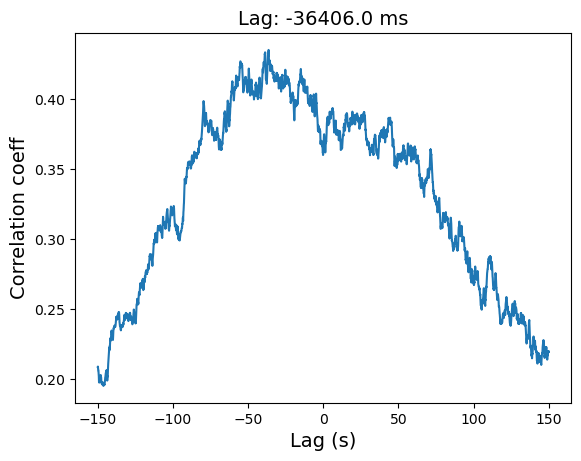

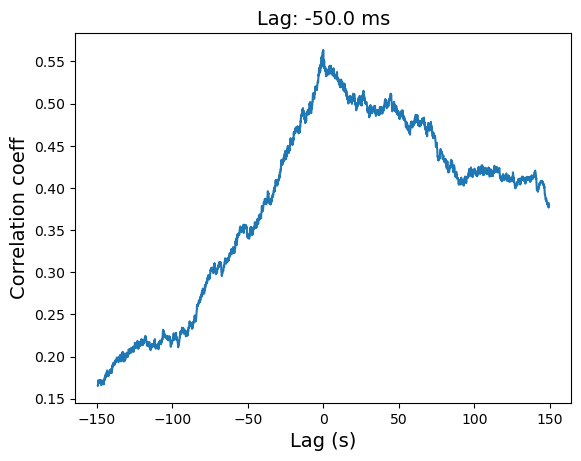

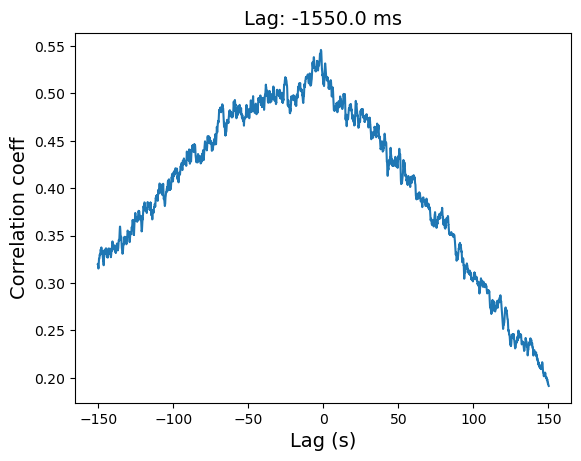

In [86]:
lag_arr_stim=np.zeros(len(sess_list))
max_corr_stim=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    sess_name=sess_list[i]
    #print(sess_name)
    lag_arr_stim[i],max_corr_stim[i]=get_lag_motion_responsive_sum_stim(sess_name)

In [87]:
def plot_lag_profile_aligned_to_peak(sess_name,condition):
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    responsive_cells=np.squeeze(np.array(f[sess_name]))
    f.close()
    frames=get_baseline_frames_index(sess_name) 
    processed_motion_traces=raw_motion_df.loc[sess_name,:]
    processed_traces= binary_traces_df[sess_name]
    sum_traces= processed_traces.loc[:,responsive_cells].sum(axis=1) 
    if condition ==1:
        common_index=remove_nan_motion_frames(sess_name)
    else:
        common_index=get_stim_frames_index(sess_name) 
    delay,max_corr,delay_arr,corr=lag_finder2(sum_traces[common_index],processed_motion_traces[common_index], 20)
    index=np.argmax(corr)
    plot_delay=delay_arr[index-40:index+41]
    plot_corr=corr[index-40:index+41]

    return plot_delay,plot_corr

(14, 81)
(12, 81)


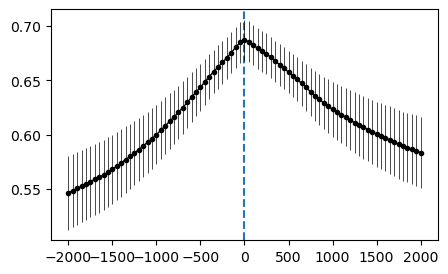

In [88]:
delay_sess=np.zeros((len(sess_list),81))
corr_sess=np.zeros((len(sess_list),81))
for i in np.arange(0,len(sess_list),1):
    #print(i)
    plot_delay,plot_corr=plot_lag_profile_aligned_to_peak(sess_list[i],1)
    delay_sess[i,:]=plot_delay
    corr_sess[i,:]=plot_corr
# Remove certain sessions ]
print(delay_sess.shape)
idx=lag_arr>=0
idx2=lag_arr<1
clean_sess_list=idx*idx2
remove_idx=np.argwhere(clean_sess_list==False)
delay_sess=np.delete(delay_sess,remove_idx,axis=0)
corr_sess=np.delete(corr_sess,remove_idx,axis=0)
print(delay_sess.shape)
# Plot mean with standard deviation 
mean_delay=np.mean(delay_sess,axis=0)
mean_corr=np.mean(corr_sess,axis=0)
# Add figure..
fig, ax = plt.subplots(figsize=(5, 3), nrows=1, ncols=1)
ax.plot((mean_delay-mean_delay[40])*1000,mean_corr,color='k',linewidth=1.0)
l_std=np.std(corr_sess,axis=0)/np.sqrt(corr_sess.shape[0])
# Vertical line at peak
ax.axvline(x=0,linestyle='--')
#ax.fill_between((mean_delay-mean_delay[40])*1000, mean_corr-l_std, mean_corr+l_std,color='blue',alpha=0.3)
#Instead use  error bar 
plt.errorbar((mean_delay-mean_delay[40])*1000, mean_corr, yerr = l_std, fmt ='.',color='k',linewidth=0.5)
#ax.set_xticklabels(np.arange(-5,6,1))
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_2/')
plt.savefig('cross_corr_lag_10Hz_bs_error_bar.svg',dpi=1200,bbox_inches='tight')

In [96]:
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Trace_analysis/Final_codes/')
os.chdir( "C:/Users/sudiksha/Documents/Codes/")
f=h5py.File('Cross_corr_bs_145Hz.h5',"r")
delay_sess_145Hz=np.array(f['delay'])
corr_sess_145Hz=np.array(f['corr'])
f.close()

In [97]:
delay_sess_tot=np.concatenate((delay_sess,delay_sess_145Hz),axis=0)
corr_sess_tot=np.concatenate((corr_sess,corr_sess_145Hz),axis=0)

In [98]:
delay_sess_tot.shape

(23, 81)

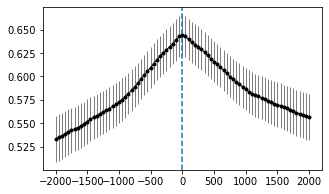

In [533]:
# Plot mean with standard deviation 
mean_delay=np.mean(delay_sess_tot,axis=0)
mean_corr=np.mean(corr_sess_tot,axis=0)
# Add figure..
fig, ax = plt.subplots(figsize=(5, 3), nrows=1, ncols=1)
ax.plot((mean_delay-mean_delay[40])*1000,mean_corr,color='k',linewidth=1.0)
l_std=np.std(corr_sess_tot,axis=0)/np.sqrt(corr_sess_tot.shape[0])
# Vertical line at peak
ax.axvline(x=0,linestyle='--')
#ax.fill_between((mean_delay-mean_delay[40])*1000, mean_corr-l_std, mean_corr+l_std,color='blue',alpha=0.3)
#Instead use  error bar 
plt.errorbar((mean_delay-mean_delay[40])*1000, mean_corr, yerr = l_std, fmt ='.',color='k',linewidth=0.5)
#ax.set_xticklabels(np.arange(-5,6,1))
os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_2/')
plt.savefig('cross_corr_lag_all_sess_bs_error_bar.svg',dpi=1200,bbox_inches='tight')

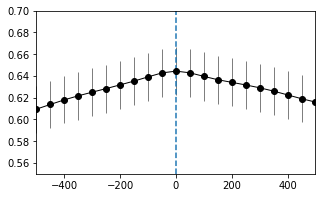

In [534]:
# Plot mean with standard deviation 
mean_delay=np.mean(delay_sess_tot,axis=0)
mean_corr=np.mean(corr_sess_tot,axis=0)
# Add figure..
fig, ax = plt.subplots(figsize=(5, 3), nrows=1, ncols=1)
ax.plot((mean_delay-mean_delay[40])*1000,mean_corr,color='k',linewidth=1.0)
l_std=np.std(corr_sess_tot,axis=0)/np.sqrt(corr_sess_tot.shape[0])
# Vertical line at peak
ax.axvline(x=0,linestyle='--')
#ax.fill_between((mean_delay-mean_delay[40])*1000, mean_corr-l_std, mean_corr+l_std,color='blue',alpha=0.3)
#Instead use  error bar 
plt.errorbar((mean_delay-mean_delay[40])*1000, mean_corr, yerr = l_std, fmt ='o',color='k',linewidth=0.5)
ax.set_xlim([-500,500])
ax.set_ylim([0.55,0.7])
#ax.set_xticklabels(np.arange(-5,6,1))
os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_2/')
plt.savefig('cross_corr_lag_all_sess_bs_error_bar_zoom.svg',dpi=1200,bbox_inches='tight')

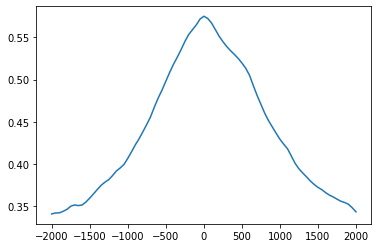

In [476]:
delay_sess=delay_sess_tot[0]
corr_sess=corr_sess_tot[0]
plt.plot((delay_sess-delay_sess[40])*1000,corr_sess)

(14, 81)
(12, 81)


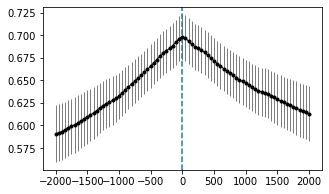

In [477]:
delay_sess=np.zeros((len(sess_list),81))
corr_sess=np.zeros((len(sess_list),81))
for i in np.arange(0,len(sess_list),1):
    #print(i)
    plot_delay,plot_corr=plot_lag_profile_aligned_to_peak(sess_list[i],2)
    delay_sess[i,:]=plot_delay
    corr_sess[i,:]=plot_corr
# Remove certain sessions ]
print(delay_sess.shape)
idx=lag_arr>=0
idx2=lag_arr<1
clean_sess_list=idx*idx2
remove_idx=np.argwhere(clean_sess_list==False)
delay_sess=np.delete(delay_sess,remove_idx,axis=0)
corr_sess=np.delete(corr_sess,remove_idx,axis=0)
print(delay_sess.shape)
# Plot mean with standard deviation 
mean_delay=np.mean(delay_sess,axis=0)
mean_corr=np.mean(corr_sess,axis=0)
# Add figure..
fig, ax = plt.subplots(figsize=(5, 3), nrows=1, ncols=1)
ax.plot((mean_delay-mean_delay[40])*1000,mean_corr,color='k',linewidth=1.0)
l_std=np.std(corr_sess,axis=0)/np.sqrt(corr_sess.shape[0])
# Vertical line at peak
ax.axvline(x=0,linestyle='--')
#ax.fill_between((mean_delay-mean_delay[40])*1000, mean_corr-l_std, mean_corr+l_std,color='blue',alpha=0.3)
#Instead use  error bar 
plt.errorbar((mean_delay-mean_delay[40])*1000, mean_corr, yerr = l_std, fmt ='.',color='k',linewidth=0.5)
#ax.set_xticklabels(np.arange(-5,6,1))
os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_2/')
plt.savefig('cross_corr_lag_10Hz_stim_error_bar.svg',dpi=1200,bbox_inches='tight')

## Quantification in baseline 

In [100]:
idx=lag_arr>=0
idx2=lag_arr<1
clean_sess_list=idx*idx2
remove_idx=np.argwhere(clean_sess_list==False)
lag_arr_10Hz=np.delete(lag_arr,remove_idx,axis=0)
max_corr_10Hz=np.delete(max_corr,remove_idx,axis=0)
os.chdir( "C:/Users/sudiksha/Documents/Codes/")
f=h5py.File('lag_corr_bs_145Hz.h5',"r")
lag_arr_145Hz=np.array(f['lag'])
max_corr_145Hz=np.array(f['corr'])
f.close()
lag_arr=np.concatenate((lag_arr_10Hz,lag_arr_145Hz))
lag_arr=lag_arr*1000
max_corr=np.concatenate((max_corr_10Hz,max_corr_145Hz))
print(np.mean(lag_arr),np.std(lag_arr), np.mean(max_corr),np.std(max_corr),len(lag_arr))

131.52614646328502 157.98462112689572 0.6603350282760632 0.11043885227257301 23


In [101]:
min(lag_arr),max(lag_arr)

(0.0, 525.0176512120106)

In [102]:
np.std(lag_arr)/np.sqrt((lag_arr).shape[0])

32.94207070430362

In [85]:
lag_arr_145Hz.shape

(11,)

## Quantification in baseline vs. stim 

In [100]:
idx=lag_arr>=0
idx2=lag_arr<1
i=idx*idx2
idx=lag_arr_stim>0
idx2=lag_arr_stim<1
i2=idx*idx2
idx_final=i*i2
idx_final

array([ True,  True,  True,  True, False, False,  True,  True,  True,
        True, False, False, False, False])

In [101]:
lag_arr_10Hz_stim=lag_arr_stim[idx_final]*1000
np.mean(lag_arr_10Hz_stim),np.std(lag_arr_10Hz_stim)/np.sqrt(lag_arr_10Hz_stim.shape[0])

(84.38905150589804, 22.07312066495429)

In [102]:
lag_arr_10Hz=lag_arr[idx_final]*1000
np.mean(lag_arr_10Hz),np.std(lag_arr_10Hz)/np.sqrt(lag_arr_10Hz.shape[0])

(87.50292810049132, 46.772282333977635)

In [103]:
lag_arr_10Hz=lag_arr[idx_final]*1000
lag_arr_10Hz_stim=lag_arr_stim[idx_final]*1000
max_corr_10Hz=max_corr[idx_final]
max_corr_10Hz_stim=max_corr_stim[idx_final]
os.chdir( "C:/Users/sudiksha/Documents/Codes/")
f=h5py.File('lag_corr_bs_stim_145Hz.h5',"r")
lag_arr_145Hz=np.array(f['lag'])
max_corr_145Hz=np.array(f['corr'])
lag_arr_145Hz_stim=np.array(f['lag_stim'])
max_corr_145Hz_stim=np.array(f['corr_stim'])

lag_arr=np.concatenate((lag_arr_10Hz,lag_arr_145Hz))
lag_arr_stim=np.concatenate((lag_arr_10Hz_stim,lag_arr_145Hz_stim))
max_corr=np.concatenate((max_corr_10Hz,max_corr_145Hz))
max_corr_stim=np.concatenate((max_corr_10Hz_stim,max_corr_145Hz_stim))

In [104]:
np.sqrt(lag_arr.shape[0])

4.0

In [105]:
np.median(lag_arr)

75.00251197387797

In [106]:
np.mean(lag_arr),np.std(lag_arr)/np.sqrt(lag_arr.shape[0]), np.mean(max_corr),np.std(max_corr)/np.sqrt(lag_arr.shape[0]),len(lag_arr)

(156.25523550988163,
 42.131002489492175,
 0.6845965697759016,
 0.02122270674021124,
 16)

In [107]:
np.mean(lag_arr_145Hz),np.std(lag_arr_145Hz)/np.sqrt(lag_arr_145Hz.shape[0])

(225.00754291927194, 61.07961316855436)

In [45]:
np.mean(lag_arr_stim),np.std(lag_arr_stim),np.mean(max_corr_stim),np.std(max_corr_stim),len(lag_arr_stim)

(126.58359629967997,
 122.96253446678385,
 0.6911529827312906,
 0.0871974014447586,
 16)

In [171]:
np.mean(lag_arr_145Hz_stim),np.std(lag_arr_145Hz_stim),np.mean(max_corr_145Hz_stim),np.std(max_corr_145Hz_stim),len(lag_arr_145Hz_stim)

(168.7781410934619,
 150.93385735865897,
 0.6742884649913579,
 0.08911850738983058,
 8)

In [172]:
np.mean(lag_arr_10Hz_stim),np.std(lag_arr_10Hz_stim),np.mean(max_corr_10Hz_stim),np.std(max_corr_10Hz_stim),len(lag_arr_10Hz_stim)

(84.38905150589804,
 62.43221321655237,
 0.7080175004712232,
 0.0818281208439036,
 8)

In [173]:
lag_arr_145Hz_stim.shape

(8,)

In [99]:
delay_sess=np.zeros((len(sess_list),81))
corr_sess=np.zeros((len(sess_list),81))
for i in np.arange(0,len(sess_list),1):
    #print(i)
    plot_delay,plot_corr=plot_lag_profile_aligned_to_peak(sess_list[i],1)
    delay_sess[i,:]=plot_delay
    corr_sess[i,:]=plot_corr
# Remove certain sessions ]
print(delay_sess.shape)
idx=lag_arr>=0
idx2=lag_arr<1
i=idx*idx2
idx=lag_arr_stim>0
idx2=lag_arr_stim<1
i2=idx*idx2
idx_final=i*i2
remove_idx=np.argwhere(idx_final==False)
delay_sess=np.delete(delay_sess,remove_idx,axis=0)
corr_sess=np.delete(corr_sess,remove_idx,axis=0)

os.chdir( "C:/Users/sudiksha/Documents/Codes/")
f=h5py.File('Cross_corr_bs_145Hz_2.h5',"r")
delay_sess_145Hz=np.array(f['delay'])
corr_sess_145Hz=np.array(f['corr'])
f.close()
delay_sess_tot=np.concatenate((delay_sess,delay_sess_145Hz),axis=0)
corr_sess_tot=np.concatenate((corr_sess,corr_sess_145Hz),axis=0)

(14, 81)


In [510]:
delay_sess_tot.shape

(16, 81)

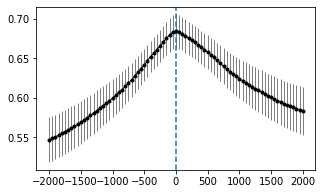

In [511]:
# Plot mean with standard deviation 
mean_delay=np.mean(delay_sess_tot,axis=0)
mean_corr=np.mean(corr_sess_tot,axis=0)
# Add figure..
fig, ax = plt.subplots(figsize=(5, 3), nrows=1, ncols=1)
ax.plot((mean_delay-mean_delay[40])*1000,mean_corr,color='k',linewidth=1.0)
l_std=np.std(corr_sess_tot,axis=0)/np.sqrt(corr_sess_tot.shape[0])
# Vertical line at peak
ax.axvline(x=0,linestyle='--')
#ax.fill_between((mean_delay-mean_delay[40])*1000, mean_corr-l_std, mean_corr+l_std,color='blue',alpha=0.3)
#Instead use  error bar 
plt.errorbar((mean_delay-mean_delay[40])*1000, mean_corr, yerr = l_std, fmt ='.',color='k',linewidth=0.5)
#ax.set_xticklabels(np.arange(-5,6,1))
os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_2/')
plt.savefig('cross_corr_lag_all_sess_bs_error_bar_2.svg',dpi=1200,bbox_inches='tight')

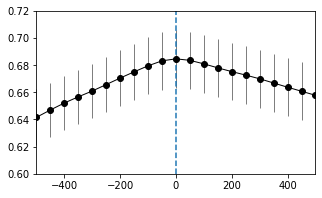

In [516]:
# Plot mean with standard deviation 
mean_delay=np.mean(delay_sess_tot,axis=0)
mean_corr=np.mean(corr_sess_tot,axis=0)
# Add figure..
fig, ax = plt.subplots(figsize=(5, 3), nrows=1, ncols=1)
ax.plot((mean_delay-mean_delay[40])*1000,mean_corr,color='k',linewidth=1.0)
l_std=np.std(corr_sess_tot,axis=0)/np.sqrt(corr_sess_tot.shape[0])
# Vertical line at peak
ax.axvline(x=0,linestyle='--')
#ax.fill_between((mean_delay-mean_delay[40])*1000, mean_corr-l_std, mean_corr+l_std,color='blue',alpha=0.3)
#Instead use  error bar 
plt.errorbar((mean_delay-mean_delay[40])*1000, mean_corr, yerr = l_std, fmt ='o',color='k',linewidth=0.5)
ax.set_xlim([-500,500])
ax.set_ylim([0.6,0.72])
#ax.set_xticklabels(np.arange(-5,6,1))
os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_2/')
plt.savefig('cross_corr_lag_all_sess_bs_error_bar_zoom_2.svg',dpi=1200,bbox_inches='tight')

In [90]:
z=np.invert(idx_final)
np.array(sess_list)[z]

array(['608450_03092020', '608451_01062020', '611311_03092020',
       '612535_07082020', '615883_02052021', '615883_03122021'],
      dtype='<U15')

WilcoxonResult(statistic=12.0, pvalue=0.4609375)


[Text(0, 0, 'Baseline'), Text(1, 0, 'Stim')]

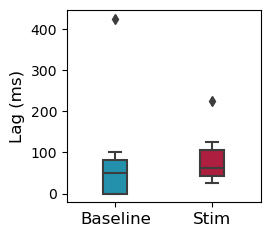

In [180]:
data={'Baseline': lag_arr[idx_final]*1000,'Stim':lag_arr_stim[idx_final]*1000}
df=pd.DataFrame(data)
plt.figure(figsize=(2.5, 2.5))
my_pal = {"Baseline": "#0C9FC3", "Stim": "#C50632"}
my_pal2 = {"Baseline": "k", "Stim": "k"}
ax=sns.boxplot(data=df,palette=my_pal,width=0.25)
#sns.swarmplot(data=df,palette=my_pal2,alpha=0.7,ax=ax)
x=[np.zeros(lag_arr[idx_final].shape[0]),np.ones(lag_arr[idx_final].shape[0])]
y=[df['Baseline'],df['Stim']]
#ax.scatter(x,y,color='k',alpha=0.3)
#ax.plot(x,y,color='k',alpha=0.3)
print(ss.wilcoxon(df['Baseline'],df['Stim']))
#ax.set_title('Lag comparison',fontsize=12)
ax.set_ylabel('Lag (ms)',fontsize=12)
ax.set_xticklabels(labels=ax.get_xticklabels(), fontsize=12)
#plt.savefig('Lag_comparison_10Hz.svg',dpi=1200,bbox_inches='tight')

WilcoxonResult(statistic=13.0, pvalue=0.546875)


[Text(0, 0, 'Baseline'), Text(1, 0, 'Stim')]

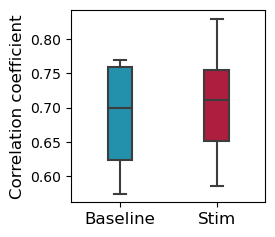

In [181]:
## Compare correlation 
data={'Baseline': max_corr[idx_final],'Stim':max_corr_stim[idx_final]}
df=pd.DataFrame(data)
plt.figure(figsize=(2.5, 2.5))
my_pal = {"Baseline": "#0C9FC3", "Stim": "#C50632"}
#ax=sns.boxplot(data=df,palette=my_pal)
ax=sns.boxplot(data=df,palette=my_pal,width=0.25)
#sns.swarmplot(data=df,palette=my_pal2,alpha=0.7)
x=[np.zeros(max_corr[idx_final].shape[0]),np.ones(max_corr[idx_final].shape[0])]
y=[df['Baseline'],df['Stim']]
#ax.scatter(x,y,color='k',alpha=0.3)
print(ss.wilcoxon(df['Baseline'],df['Stim']))
#ax.set_title(' Corr comparison')
ax.set_ylabel('Correlation coefficient',fontsize=12)
ax.set_xticklabels(labels=ax.get_xticklabels(), fontsize=12)
#plt.savefig('Corr_Lag_comparison_10Hz.svg',dpi=1200,bbox_inches='tight')

In [ ]:
lag_bs=lag_arr[idx_final]*1000
lag_stim=lag_arr_stim[idx_final]*1000
corr_bs=max_corr[idx_final]
corr_stim=max_corr_stim[idx_final]
f=h5py.File('Cross_corr_violin_with_box_10Hz.h5',"w")
dset1 = f.create_dataset('lag_bs', data=lag_bs)
dset1 = f.create_dataset('lag_stim', data=lag_stim)
dset1 = f.create_dataset('corr_bs', data=corr_bs)
dset1 = f.create_dataset('corr_stim', data=corr_stim)
f.close()

## Figure 5,6 - Ca response to stimulation


### Event rate comparison baseline vs stim -different locomotion states

In [356]:
def get_firing_rate(file,traces_df,field,condition):
    f = h5py.File(file, 'r')
    a=np.array(f[field]).T
    select_frames= np.where(a==1)[0]
    sess_name =  file.split('/')[6]+'_'+file.split('/')[7]
    if condition ==1:
        indices=remove_nan_motion_frames(sess_name)
    else:
        indices=get_stim_frames_index(sess_name)
    select_indices = np.intersect1d(indices,select_frames)
    binary_traces= traces_df[sess_name].T
    Ncells = binary_traces.shape[0]
    out= np.zeros((Ncells,1))
    #3. Find corresponding 1's in either binary_traces or onset_binary to calculate % event rate
    temp_df=(binary_traces.loc[:,select_indices]) 
    for cell in np.arange(0,Ncells,1):
        out[cell]=out[cell]+np.array(np.sum(temp_df.loc[cell,:]==1))
    tot_frames=select_indices.shape[0]
    if tot_frames==0:
        p=0
    else:
        p=out/tot_frames*20
    
    
    return p,np.mean(p)

In [328]:
def get_firing_rate_motion_resp(file,traces_df,field,condition):
    f = h5py.File(file, 'r')
    a=np.array(f[field]).T
    select_frames= np.where(a==1)[0]
    sess_name =  file.split('/')[4]+'_'+file.split('/')[5]
    if condition ==1:
        indices=remove_nan_motion_frames(sess_name)
    else:
        indices=get_stim_frames_index(sess_name)
    select_indices = np.intersect1d(indices,select_frames)
    binary_traces= traces_df[sess_name].T
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    Ncells = resp_cells.shape[0]
    out= np.zeros((Ncells,1))
    #3. Find corresponding 1's in either binary_traces or onset_binary to calculate % event rate
    temp_df=(binary_traces.loc[resp_cells,select_indices]) 
    for cell in np.arange(0,Ncells,1):
        out[cell]=out[cell]+np.array(np.sum(temp_df.loc[resp_cells[cell],:]==1))
    tot_frames=select_indices.shape[0]
    if tot_frames==0:
        p=0
    else:
        p=out/tot_frames*20
    
    
    return p,np.mean(p)

## Mixed effects models 

In [109]:
mouse_id=[]
for i in np.arange(0,len(sess_list),1):
    mouse_id.append(int(sess_list[i].split("_")[0]))
mouse_id

[602101,
 602101,
 608448,
 608448,
 608450,
 608451,
 608451,
 608452,
 608452,
 611111,
 611311,
 612535,
 615883,
 615883]

In [110]:
def get_firing_rate_motion_resp(sess_name,traces_df,field,condition):
    if field== 'mov':
        a=moving_period_df.loc[sess_name]
        select_frames= np.where(a==1)[0]
    else:
        a=stationary_period_df.loc[sess_name]
        select_frames= np.where(a==1)[0]
        
    if condition ==1:
        indices=remove_nan_motion_frames(sess_name)
    else:
        indices=get_stim_frames_index(sess_name)
    select_indices = np.intersect1d(indices,select_frames)
    binary_traces= traces_df[sess_name].T
    
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    Ncells = resp_cells.shape[0]
    out= np.zeros((Ncells,1))
    #3. Find corresponding 1's in either binary_traces or onset_binary to calculate % event rate
    temp_df=(binary_traces.loc[resp_cells,select_indices]) 
    for cell in np.arange(0,Ncells,1):
        out[cell]=out[cell]+np.array(np.sum(temp_df.loc[resp_cells[cell],:]==1))
    tot_frames=select_indices.shape[0]
    if tot_frames==0:
        p=0
    else:
        p=out/tot_frames*20
    
    
    return p,np.mean(p)
    #return p,np.mean(p),out,tot_frames

In [309]:
def get_firing_rate_motion_resp2(sess_name,traces_df,field,condition):
    if field== 'mov':
        a=moving_period_df.loc[sess_name]
        select_frames= np.where(a==1)[0]
    else:
        a=stationary_period_df.loc[sess_name]
        select_frames= np.where(a==1)[0]
        
    if condition ==1:
        indices=remove_nan_motion_frames(sess_name)
    else:
        indices=get_stim_frames_index(sess_name)
    select_indices = np.intersect1d(indices,select_frames)
    binary_traces= traces_df[sess_name].T
    
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    Ncells = resp_cells.shape[0]
    out= np.zeros((Ncells,1))
    #3. Find corresponding 1's in either binary_traces or onset_binary to calculate % event rate
    temp_df=(binary_traces.loc[resp_cells,select_indices]) 
    for cell in np.arange(0,Ncells,1):
        out[cell]=out[cell]+np.array(np.sum(temp_df.loc[resp_cells[cell],:]==1))
    tot_frames=select_indices.shape[0]
    if tot_frames==0:
        p=0
    else:
        p=out/tot_frames*20
    
    
    #return p,np.mean(p)
    return p,np.mean(p),out,tot_frames

In [310]:
def get_firing_rate2(sess_name,traces_df,field,condition):
    if field== 'mov':
        a=moving_period_df.loc[sess_name]
        select_frames= np.where(a==1)[0]
    else:
        a=stationary_period_df.loc[sess_name]
        select_frames= np.where(a==1)[0]
        
    if condition ==1:
        indices=remove_nan_motion_frames(sess_name)
    else:
        indices=get_stim_frames_index(sess_name)
    select_indices = np.intersect1d(indices,select_frames)
    binary_traces= traces_df[sess_name].T
    
    Ncells = binary_traces.shape[0]
    out= np.zeros((Ncells,1))
    #3. Find corresponding 1's in either binary_traces or onset_binary to calculate % event rate
    temp_df=(binary_traces.loc[:,select_indices]) 
    for cell in np.arange(0,Ncells,1):
        out[cell]=out[cell]+np.array(np.sum(temp_df.loc[cell,:]==1))
    tot_frames=select_indices.shape[0]
    if tot_frames==0:
        p=0
    else:
        p=out/tot_frames*20
    
    
    #return p,np.mean(p)
    return p,np.mean(p),out,tot_frames

In [115]:
_,_,counts_low_bs,t=get_firing_rate_motion_resp2(sess_list[0],binary_traces_df,'stn',1)
duration=np.ones((len(counts_low_bs),1))*t
mouse_id=[]
mouse_id.append(list(repeat(int(sess_list[0].split("_")[0]),len(counts_low_bs))))
for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        out=out
        tot_frames=tot_frames
    else:
        _,_,out,t=get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'stn',1)
        counts_low_bs=np.concatenate((counts_low_bs,out))
        tot_frames=np.ones((len(out),1))*t
        duration=np.concatenate((duration,tot_frames))
        mouse_id.append(list(repeat(int(sess_list[i].split("_")[0]),len(out))))
mouse_id = [element for nestedlist in mouse_id for element in nestedlist]
stim_vect=np.zeros((len(counts_low_bs)))
mov_vect=np.zeros((len(counts_low_bs)))
print(len(mouse_id),len(counts_low_bs),len(duration),len(stim_vect),len(mov_vect))

2189 2189 2189 2189 2189


In [116]:
_,_,counts_hi_bs,t=get_firing_rate_motion_resp2(sess_list[0],binary_traces_df,'mov',1)
duration2=np.ones((len(counts_hi_bs),1))*t
mouse_id2=[]
mouse_id2.append(list(repeat(int(sess_list[0].split("_")[0]),len(counts_hi_bs))))
for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        out=out
        tot_frames=tot_frames
    else:
        _,_,out,t=get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'mov',1)
        counts_hi_bs=np.concatenate((counts_hi_bs,out))
        tot_frames=np.ones((len(out),1))*t
        duration2=np.concatenate((duration2,tot_frames))
        mouse_id2.append(list(repeat(int(sess_list[i].split("_")[0]),len(out))))
mouse_id2 = [element for nestedlist in mouse_id2 for element in nestedlist]
stim_vect2=np.zeros((len(counts_hi_bs)))
mov_vect2=np.ones((len(counts_hi_bs)))
print(len(mouse_id2),len(counts_hi_bs),len(duration2),len(stim_vect2),len(mov_vect2))

2189 2189 2189 2189 2189


In [117]:
_,_,counts_low_stim,t=get_firing_rate_motion_resp2(sess_list[0],binary_traces_df,'stn',1)
duration3=np.ones((len(counts_low_stim),1))*t
mouse_id3=[]
mouse_id3.append(list(repeat(int(sess_list[0].split("_")[0]),len(counts_low_stim))))
for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        out=out
        tot_frames=tot_frames
    else:
        _,_,out,t=get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'stn',1)
        counts_low_stim=np.concatenate((counts_low_stim,out))
        tot_frames=np.ones((len(out),1))*t
        duration3=np.concatenate((duration3,tot_frames))
        mouse_id3.append(list(repeat(int(sess_list[i].split("_")[0]),len(out))))
mouse_id3 = [element for nestedlist in mouse_id3 for element in nestedlist]
stim_vect3=np.ones((len(counts_low_stim)))
mov_vect3=np.zeros((len(counts_low_stim)))
print(len(mouse_id3),len(counts_low_stim),len(duration3),len(stim_vect3),len(mov_vect3))

2189 2189 2189 2189 2189


In [118]:
_,_,counts_hi_stim,t=get_firing_rate_motion_resp2(sess_list[0],binary_traces_df,'mov',2)
duration4=np.ones((len(counts_hi_stim),1))*t
mouse_id4=[]
mouse_id4.append(list(repeat(int(sess_list[0].split("_")[0]),len(counts_hi_stim))))
for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        out=out
        tot_frames=tot_frames
    else:
        _,_,out,t=get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'mov',2)
        counts_hi_stim=np.concatenate((counts_hi_stim,out))
        tot_frames=np.ones((len(out),1))*t
        duration4=np.concatenate((duration4,tot_frames))
        mouse_id4.append(list(repeat(int(sess_list[i].split("_")[0]),len(out))))
mouse_id4 = [element for nestedlist in mouse_id4 for element in nestedlist]
stim_vect4=np.ones((len(counts_hi_stim)))
mov_vect4=np.ones((len(counts_hi_stim)))
print(len(mouse_id4),len(counts_hi_stim),len(duration4),len(stim_vect4),len(mov_vect4))

2189 2189 2189 2189 2189


In [119]:
mouse_id_tot=np.concatenate((mouse_id,mouse_id2,mouse_id3,mouse_id4))
stim_vect_tot=np.concatenate((stim_vect,stim_vect2,stim_vect3,stim_vect4))
mov_vect_tot=np.concatenate((mov_vect,mov_vect2,mov_vect3,mov_vect4))
duration_tot=np.concatenate((duration,duration2,duration3,duration4))
duration_tot=np.squeeze(duration_tot)
counts_tot=np.concatenate((counts_low_bs,counts_hi_bs,counts_low_stim,counts_hi_stim))
counts_tot=np.squeeze(counts_tot)

In [120]:
data = {
  "Mouse ID": mouse_id_tot,"Motion":mov_vect_tot,
  "stim":stim_vect_tot,"Duration":duration_tot,"Counts":counts_tot
}

#load data into a DataFrame object:
df = pd.DataFrame(data)

df 

,Mouse ID,Motion,stim,Duration,Counts
0,602101,0.0,0.0,23506.0,13.0
1,602101,0.0,0.0,23506.0,0.0
2,602101,0.0,0.0,23506.0,0.0
3,602101,0.0,0.0,23506.0,122.0
4,602101,0.0,0.0,23506.0,41.0
...,...,...,...,...,...
8751,615883,1.0,1.0,5902.0,77.0
8752,615883,1.0,1.0,5902.0,142.0
8753,615883,1.0,1.0,5902.0,116.0
8754,615883,1.0,1.0,5902.0,230.0


In [121]:
from pathlib import Path  

filepath = Path( 'C:/Users/sudiksha/Documents/Codes/mixed_lm_counts_10Hz.csv')  

filepath.parent.mkdir(parents=True, exist_ok=True)  

df.to_csv(filepath)  

### Sess id for mixed effect 

In [321]:
_,_,counts_low_bs,t=get_firing_rate_motion_resp2(sess_list[0],binary_traces_df,'stn',1)
duration=np.ones((len(counts_low_bs),1))*t
i=0
sess_id=np.ones(np.size(counts_low_bs))*i
for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        out=out
        tot_frames=tot_frames
    else:
        _,_,out,t=get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'stn',1)
        z=np.ones(len(out))*i
        sess_id=np.concatenate((sess_id,z))
        counts_low_bs=np.concatenate((counts_low_bs,out))
        tot_frames=np.ones((len(out),1))*t
        duration=np.concatenate((duration,tot_frames))
stim_vect=np.zeros((len(counts_low_bs)))
mov_vect=np.zeros((len(counts_low_bs)))
print(len(sess_id),len(counts_low_bs),len(duration),len(stim_vect),len(mov_vect))

2189 2189 2189 2189 2189


In [322]:
_,_,counts_hi_bs,t=get_firing_rate_motion_resp2(sess_list[0],binary_traces_df,'mov',1)
duration2=np.ones((len(counts_hi_bs),1))*t
i=0
sess_id2=np.ones(np.size(counts_hi_bs))*i
for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        out=out
        tot_frames=tot_frames
    else:
        _,_,out,t=get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'mov',1)
        counts_hi_bs=np.concatenate((counts_hi_bs,out))
        z=np.ones(len(out))*i
        sess_id2=np.concatenate((sess_id2,z))
        tot_frames=np.ones((len(out),1))*t
        duration2=np.concatenate((duration2,tot_frames))
        
stim_vect2=np.zeros((len(counts_hi_bs)))
mov_vect2=np.ones((len(counts_hi_bs)))
print(len(sess_id2),len(counts_hi_bs),len(duration2),len(stim_vect2),len(mov_vect2))

2189 2189 2189 2189 2189


In [323]:
_,_,counts_low_stim,t=get_firing_rate_motion_resp2(sess_list[0],binary_traces_df,'stn',1)
duration3=np.ones((len(counts_low_stim),1))*t
i=0
sess_id3=np.ones(np.size(counts_low_stim))*i
for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        out=out
        tot_frames=tot_frames
    else:
        _,_,out,t=get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'stn',1)
        counts_low_stim=np.concatenate((counts_low_stim,out))
        tot_frames=np.ones((len(out),1))*t
        duration3=np.concatenate((duration3,tot_frames))
        z=np.ones(len(out))*i
        sess_id3=np.concatenate((sess_id3,z))
        
stim_vect3=np.ones((len(counts_low_stim)))
mov_vect3=np.zeros((len(counts_low_stim)))
print(len(sess_id3),len(counts_low_stim),len(duration3),len(stim_vect3),len(mov_vect3))

2189 2189 2189 2189 2189


In [324]:
_,_,counts_hi_stim,t=get_firing_rate_motion_resp2(sess_list[0],binary_traces_df,'mov',2)
duration4=np.ones((len(counts_hi_stim),1))*t
i=0
sess_id4=np.ones(np.size(counts_hi_stim))*i

for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        out=out
        tot_frames=tot_frames
    else:
        _,_,out,t=get_firing_rate_motion_resp2(sess_list[i],binary_traces_df,'mov',2)
        counts_hi_stim=np.concatenate((counts_hi_stim,out))
        tot_frames=np.ones((len(out),1))*t
        duration4=np.concatenate((duration4,tot_frames))
        z=np.ones(len(out))*i
        sess_id4=np.concatenate((sess_id4,z))
        
stim_vect4=np.ones((len(counts_hi_stim)))
mov_vect4=np.ones((len(counts_hi_stim)))
print(len(sess_id4),len(counts_hi_stim),len(duration4),len(stim_vect4),len(mov_vect4))

2189 2189 2189 2189 2189


In [325]:
sess_id_tot=np.concatenate((sess_id,sess_id2,sess_id3,sess_id4))
stim_vect_tot=np.concatenate((stim_vect,stim_vect2,stim_vect3,stim_vect4))
mov_vect_tot=np.concatenate((mov_vect,mov_vect2,mov_vect3,mov_vect4))
duration_tot=np.concatenate((duration,duration2,duration3,duration4))
duration_tot=np.squeeze(duration_tot)
counts_tot=np.concatenate((counts_low_bs,counts_hi_bs,counts_low_stim,counts_hi_stim))
counts_tot=np.squeeze(counts_tot)

In [326]:
data = {
  "SessID": sess_id_tot,"Motion":mov_vect_tot,
  "stim":stim_vect_tot,"Duration":duration_tot,"Counts":counts_tot
}

#load data into a DataFrame object:
df = pd.DataFrame(data)

df 

,SessID,Motion,stim,Duration,Counts
0,0.0,0.0,0.0,23506.0,13.0
1,0.0,0.0,0.0,23506.0,0.0
2,0.0,0.0,0.0,23506.0,0.0
3,0.0,0.0,0.0,23506.0,122.0
4,0.0,0.0,0.0,23506.0,41.0
...,...,...,...,...,...
8751,13.0,1.0,1.0,5902.0,77.0
8752,13.0,1.0,1.0,5902.0,142.0
8753,13.0,1.0,1.0,5902.0,116.0
8754,13.0,1.0,1.0,5902.0,230.0


In [327]:
from pathlib import Path  

filepath = Path( 'C:/Users/sudiksha/Documents/Codes/mixed_lm_counts_10Hz_sess.csv')  

filepath.parent.mkdir(parents=True, exist_ok=True)  

df.to_csv(filepath)  

In [ ]:
i=0
bout_duration_stim=get_bout_durations_stim(sess_list[0])
sess_id2=np.ones(np.size(bout_duration_stim))*i
for i in np.arange(1,len(sess_list),1):
    #print(i)
    sess_name= sess_list[i]
    b=get_bout_durations_stim(sess_name)
    z=np.ones(np.size(b))*i
    bout_duration_stim=np.concatenate((bout_duration_stim,b))
    sess_id2=np.concatenate((sess_id2,z))
stim_vect2=np.ones(np.size(bout_duration_stim))


In [122]:
p_hi_stim=get_firing_rate_motion_resp(sess_list[0],binary_traces_df,'mov',2)[0]
mouse_id=[]
mouse_id.append(list(repeat(int(sess_list[0].split("_")[0]),len(p_hi_stim))))
for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate_motion_resp(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate_motion_resp(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        p_hi_stim=p_hi_stim
    else:
        a=get_firing_rate_motion_resp(sess_list[i],binary_traces_df,'mov',2)[0]
        p_hi_stim=np.concatenate((p_hi_stim,a))
        mouse_id.append(list(repeat(int(sess_list[i].split("_")[0]),len(a))))
mouse_id = [element for nestedlist in mouse_id for element in nestedlist]
stim_vect=np.ones((len(p_hi_stim)))
mov_vect=np.ones((len(p_hi_stim)))
print(len(mouse_id),len(p_hi_stim),len(stim_vect))

2189 2189 2189


In [123]:
p_hi_bs=get_firing_rate_motion_resp(sess_list[0],binary_traces_df,'mov',1)[0]
mouse_id2=[]
mouse_id2.append(list(repeat(int(sess_list[0].split("_")[0]),len(p_hi_bs))))
for i in np.arange(1,len(motion_Files),1):
    if type(get_firing_rate_motion_resp(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate_motion_resp(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        p_hi_bs=p_hi_bs
    else:
        a=get_firing_rate_motion_resp(sess_list[i],binary_traces_df,'mov',1)[0]
        p_hi_bs=np.concatenate((p_hi_bs,a))
        mouse_id2.append(list(repeat(int(sess_list[i].split("_")[0]),len(a))))
mouse_id2 = [element for nestedlist in mouse_id2 for element in nestedlist]
stim_vect2=np.zeros((len(p_hi_bs)))
mov_vect2=np.ones((len(p_hi_stim)))
print(len(mouse_id2),len(p_hi_bs),len(stim_vect2))

2189 2189 2189


In [124]:
mouse_id_tot=np.concatenate((mouse_id,mouse_id2))
stim_vect_tot=np.concatenate((stim_vect,stim_vect2))
mov_vect_tot=np.concatenate((mov_vect,mov_vect2))
p_firing_tot=np.concatenate((p_hi_stim,p_hi_bs))
p_firing_tot=np.squeeze(p_firing_tot)

In [125]:
len(mouse_id_tot),len(stim_vect_tot),len(p_firing_tot),len(mov_vect_tot)

(4378, 4378, 4378, 4378)

In [126]:
data = {
  "Mouse ID": mouse_id_tot,
  "stim":stim_vect_tot,"Event":p_firing_tot
}

#load data into a DataFrame object:
df = pd.DataFrame(data)

df 

,Mouse ID,stim,Event
0,602101,1.0,0.861176
1,602101,1.0,1.120000
2,602101,1.0,0.635294
3,602101,1.0,0.381176
4,602101,1.0,0.527059
...,...,...,...
4373,615883,0.0,0.415528
4374,615883,0.0,0.282109
4375,615883,0.0,0.429191
4376,615883,0.0,0.527246


In [130]:
p_low_stim=get_firing_rate_motion_resp(sess_list[0],binary_traces_df,'stn',2)[0]
mouse_id3=[]
mouse_id3.append(list(repeat(int(sess_list[0].split("_")[0]),len(p_low_stim))))
for i in np.arange(1,len(sess_list),1):
    #print(i)
    if type(get_firing_rate_motion_resp(sess_list[i],binary_traces_df,'stn',2)[0])== int or type(get_firing_rate_motion_resp(sess_list[i],binary_traces_df,'moving_period',2)[0])== int:
        p_low_stim=p_low_stim
    else:
        a=get_firing_rate_motion_resp(sess_list[i],binary_traces_df,'stn',2)[0]
        p_low_stim=np.concatenate((p_low_stim,a))
        mouse_id3.append(list(repeat(int(sess_list[i].split("_")[0]),len(a))))
mouse_id3 = [element for nestedlist in mouse_id3 for element in nestedlist]
stim_vect3=np.ones((len(p_low_stim)))
mov_vect3=np.zeros((len(p_low_stim)))
print(len(mouse_id3),len(p_low_stim),len(stim_vect3))

2189 2189 2189


In [131]:
p_low_bs=get_firing_rate_motion_resp(sess_list[0],binary_traces_df,'stn',1)[0]
mouse_id4=[]
mouse_id4.append(list(repeat(int(sess_list[0].split("_")[0]),len(p_low_bs))))
for i in np.arange(1,len(sess_list),1):
    #print(i)
    if type(get_firing_rate_motion_resp(sess_list[i],binary_traces_df,'stn',2)[0])== int or type(get_firing_rate_motion_resp(sess_list[i],binary_traces_df,'mov',2)[0])== int:
        p_low_bs=p_low_bs
    else:
        a=get_firing_rate_motion_resp(sess_list[i],binary_traces_df,'stn',1)[0]
        p_low_bs=np.concatenate((p_low_bs,a))
        mouse_id4.append(list(repeat(int(sess_list[i].split("_")[0]),len(a))))
mouse_id4 = [element for nestedlist in mouse_id4 for element in nestedlist]
stim_vect4=np.zeros((len(p_low_bs)))
mov_vect4=np.zeros((len(p_low_bs)))
print(len(mouse_id4),len(p_low_bs),len(stim_vect4))

2189 2189 2189


In [132]:
mouse_id_tot=np.concatenate((mouse_id3,mouse_id3))
stim_vect_tot=np.concatenate((stim_vect3,stim_vect4))
mov_vect_tot=np.concatenate((mov_vect3,mov_vect4))
p_firing_tot=np.concatenate((p_low_stim,p_low_bs))
p_firing_tot=np.squeeze(p_firing_tot)

In [133]:
mouse_id_tot=np.concatenate((mouse_id2,mouse_id4))
stim_vect_tot=np.concatenate((stim_vect2,stim_vect4))
mov_vect_tot=np.concatenate((mov_vect2,mov_vect4))
p_firing_tot=np.concatenate((p_hi_bs,p_low_bs))
p_firing_tot=np.squeeze(p_firing_tot)

In [134]:
mouse_id_tot=np.concatenate((mouse_id4,mouse_id3,mouse_id2,mouse_id))
stim_vect_tot=np.concatenate((stim_vect4,stim_vect3,stim_vect2,stim_vect))
mov_vect_tot=np.concatenate((mov_vect4,mov_vect3,mov_vect2,mov_vect))
p_firing_tot=np.concatenate((p_low_bs,p_low_stim,p_hi_bs,p_hi_stim))
p_firing_tot=np.squeeze(p_firing_tot)

In [135]:
data = {
  "Mouse ID": mouse_id_tot,"Motion":mov_vect_tot,
  "stim":stim_vect_tot,"Event":p_firing_tot
}

#load data into a DataFrame object:
df = pd.DataFrame(data)

df 

,Mouse ID,Motion,stim,Event
0,602101,0.0,0.0,0.011061
1,602101,0.0,0.0,0.000000
2,602101,0.0,0.0,0.000000
3,602101,0.0,0.0,0.103803
4,602101,0.0,0.0,0.034885
...,...,...,...,...
8751,615883,1.0,1.0,0.260928
8752,615883,1.0,1.0,0.481193
8753,615883,1.0,1.0,0.393087
8754,615883,1.0,1.0,0.779397


In [136]:
model = smf.mixedlm("Event~C(stim)+ C(Motion)+C(stim):C(Motion)", df, groups="Mouse ID").fit()
model.summary()

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


<class 'statsmodels.iolib.summary2.Summary'>
"""
                  Mixed Linear Model Regression Results
==========================================================================
Model:                  MixedLM       Dependent Variable:       Event     
No. Observations:       8756          Method:                   REML      
No. Groups:             8             Scale:                    0.0883    
Min. group size:        424           Log-Likelihood:           -1826.1172
Max. group size:        2144          Converged:                Yes       
Mean group size:        1094.5                                            
--------------------------------------------------------------------------
                                Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------------
Intercept                        0.045    0.028  1.628 0.103 -0.009  0.099
C(stim)[T.1.0]                   0.049    0.009  5.470 0.000  0.032  0.067
C(Motion)[T.1.0]                 0.383    0.009 42.593 0.000  0.365  0.400
C(stim)[T.1.0]:C(Motion)[T.1.0] -0.053    0.013 -4.173 0.000 -0.078 -0.028
Mouse ID Var                     0.006    0.011                           
==========================================================================

"""

In [137]:
from pathlib import Path  

filepath = Path( '/home/hanlabadmins/Codes_git/Stimulation-Project/Trace_analysis/Final_codes/mixed_lm_event_rate_10Hz.csv')  

filepath.parent.mkdir(parents=True, exist_ok=True)  

df.to_csv(filepath)  

In [138]:
mouse_id_tot=np.concatenate((mouse_id3,mouse_id4))
stim_vect_tot=np.concatenate((stim_vect3,stim_vect4))
mov_vect_tot=np.concatenate((mov_vect3,mov_vect4))
p_firing_tot=np.concatenate((p_low_stim,p_low_bs))
p_firing_tot=np.squeeze(p_firing_tot)

In [139]:
data = {
  "Mouse ID": mouse_id_tot,
  "stim":stim_vect_tot,"Event":p_firing_tot
}

#load data into a DataFrame object:
df = pd.DataFrame(data)

df 

,Mouse ID,stim,Event
0,602101,1.0,0.091324
1,602101,1.0,0.319635
2,602101,1.0,0.000000
3,602101,1.0,0.121766
4,602101,1.0,0.060883
...,...,...,...
4373,615883,0.0,0.000000
4374,615883,0.0,0.123957
4375,615883,0.0,0.138260
4376,615883,0.0,0.000000


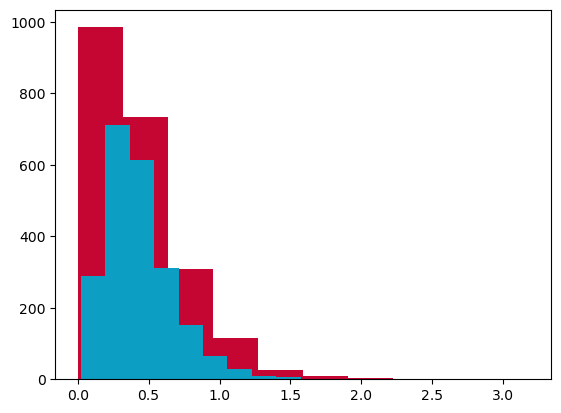

In [140]:
plt.hist(p_hi_stim,color='#C50632')
plt.hist(p_hi_bs,color="#0C9FC3")

plt.savefig('high_speed_bs_vs_stim_event_rate_10Hz.png',dpi=1200,bbox_inches='tight')

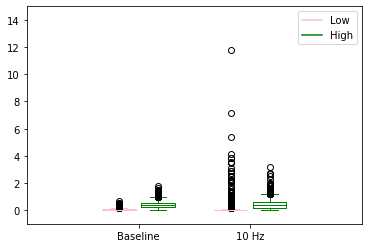

In [95]:
low_speed=[p_low_bs.flatten(),p_low_stim.flatten()]
hi_speed=[p_hi_bs.flatten(),p_hi_stim.flatten()]
ticks = ['Baseline', '10 Hz']
low_speed_plot = plt.boxplot(low_speed,
                               positions=np.array(np.arange(len(low_speed)))*2.0-0.35,widths=0.6)
hi_speed_plot = plt.boxplot(hi_speed,
                               positions=np.array(
    np.arange(len(hi_speed)))*2.0+0.35,
                               widths=0.6)

def define_box_properties(plot_name, color_code, label):
    for k, v in plot_name.items():
        plt.setp(plot_name.get(k), color=color_code)
         
    # use plot function to draw a small line to name the legend.
    plt.plot([], c=color_code, label=label)
    plt.legend()
 
 
# setting colors for each groups
define_box_properties(low_speed_plot, 'pink', 'Low')
define_box_properties(hi_speed_plot, 'green', 'High')
 
# set the x label values
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks)
 
# set the limit for x axis
plt.xlim(-2, len(ticks)*2)
plt.ylim([-1,15])
plt.savefig('boxplot_hi_low_bs_vs_stim.svg',dpi=1200,bbox_inches='tight')

In [141]:
a=np.log(p_low_bs)
b=np.log(p_low_stim)
c=np.log(p_hi_stim)
d=np.log(p_hi_bs)
idx=np.squeeze(np.where(np.isfinite(a)==0))
idx2=np.squeeze(np.where(np.isfinite(b)==0))
idx3=np.squeeze(np.where(np.isfinite(c)==0))
idx_final=np.union1d(idx,idx2)
idx_final=np.union1d(idx_final,idx3)

C:\Users\sudiksha\AppData\Local\Temp\ipykernel_23568\932770327.py:1: RuntimeWarning: divide by zero encountered in log
  a=np.log(p_low_bs)
C:\Users\sudiksha\AppData\Local\Temp\ipykernel_23568\932770327.py:2: RuntimeWarning: divide by zero encountered in log
  b=np.log(p_low_stim)
C:\Users\sudiksha\AppData\Local\Temp\ipykernel_23568\932770327.py:3: RuntimeWarning: divide by zero encountered in log
  c=np.log(p_hi_stim)


C:\Users\sudiksha\AppData\Local\Temp\ipykernel_23568\1339498793.py:1: RuntimeWarning: divide by zero encountered in log
  p_low_bs2=np.log(p_low_bs)
C:\Users\sudiksha\AppData\Local\Temp\ipykernel_23568\1339498793.py:2: RuntimeWarning: divide by zero encountered in log
  p_low_stim2=np.log(p_low_stim)
C:\Users\sudiksha\AppData\Local\Temp\ipykernel_23568\1339498793.py:3: RuntimeWarning: divide by zero encountered in log
  p_hi_stim2=np.log(p_hi_stim)


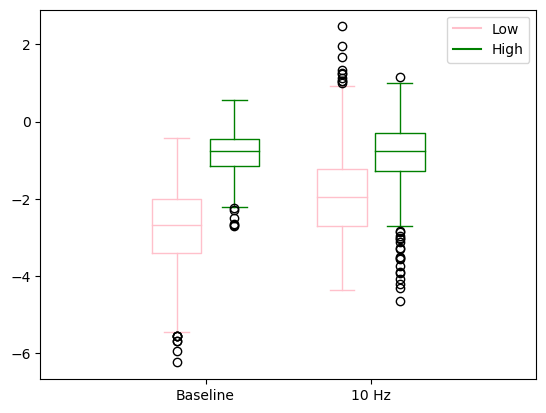

In [142]:
p_low_bs2=np.log(p_low_bs)
p_low_stim2=np.log(p_low_stim)
p_hi_stim2=np.log(p_hi_stim)
p_hi_bs2=np.log(p_hi_bs)
p_low_bs2=np.delete(p_low_bs2,idx_final)
p_low_stim2=np.delete(p_low_stim2,idx_final)
p_hi_bs2=np.delete(p_hi_bs2,idx_final)
p_hi_stim2=np.delete(p_hi_stim2,idx_final)
low_speed=[p_low_bs2.flatten(),p_low_stim2.flatten()]
hi_speed=[p_hi_bs2.flatten(),p_hi_stim2.flatten()]
ticks = ['Baseline', '10 Hz']
low_speed_plot = plt.boxplot(low_speed,
                               positions=np.array(np.arange(len(low_speed)))*2.0-0.35,widths=0.6)
hi_speed_plot = plt.boxplot(hi_speed,
                               positions=np.array(
    np.arange(len(hi_speed)))*2.0+0.35,
                               widths=0.6)

def define_box_properties(plot_name, color_code, label):
    for k, v in plot_name.items():
        plt.setp(plot_name.get(k), color=color_code)
         
    # use plot function to draw a small line to name the legend.
    plt.plot([], c=color_code, label=label)
    plt.legend()
 
 
# setting colors for each groups
# setting colors for each groups
define_box_properties(low_speed_plot, 'pink', 'Low')
define_box_properties(hi_speed_plot, 'green', 'High')
 
# set the x label values
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks)
 
# set the limit for x axis
plt.xlim(-2, len(ticks)*2)
#plt.ylim([-1,15])
plt.savefig('boxplot_hi_low_bs_vs_stim_log.svg',dpi=1200,bbox_inches='tight')

/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log
  """Entry point for launching an IPython kernel.
/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  
/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


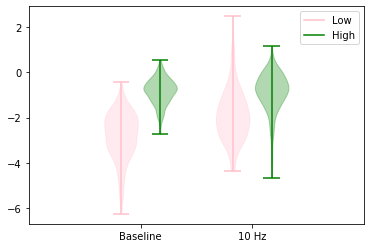

In [40]:
p_low_bs2=np.log(p_low_bs)
p_low_stim2=np.log(p_low_stim)
p_hi_stim2=np.log(p_hi_stim)
p_hi_bs2=np.log(p_hi_bs)
p_low_bs2=np.delete(p_low_bs2,idx_final)
p_low_stim2=np.delete(p_low_stim2,idx_final)
p_hi_bs2=np.delete(p_hi_bs2,idx_final)
p_hi_stim2=np.delete(p_hi_stim2,idx_final)
low_speed=[p_low_bs2.flatten(),p_low_stim2.flatten()]
hi_speed=[p_hi_bs2.flatten(),p_hi_stim2.flatten()]
ticks = ['Baseline', '10 Hz']
low_speed_plot = plt.violinplot(low_speed,
                               positions=np.array(np.arange(len(low_speed)))*2.0-0.35,widths=0.6)
hi_speed_plot = plt.violinplot(hi_speed,
                               positions=np.array(
    np.arange(len(hi_speed)))*2.0+0.35,
                               widths=0.6)

def define_box_properties(plot_name, color_code, label):
    for k, v in plot_name.items():
        plt.setp(plot_name.get(k), color=color_code)
         
    # use plot function to draw a small line to name the legend.
    plt.plot([], c=color_code, label=label)
    plt.legend()
 
 
# setting colors for each groups
# setting colors for each groups
define_box_properties(low_speed_plot, 'pink', 'Low')
define_box_properties(hi_speed_plot, 'green', 'High')
 
# set the x label values
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks)
 
# set the limit for x axis
plt.xlim(-2, len(ticks)*2)
#plt.ylim([-1,15])
plt.savefig('violinplot_hi_low_bs_vs_stim_log.svg',dpi=1200,bbox_inches='tight')

In [1345]:
np.median(p_hi_bs),np.median(p_hi_stim)

(0.3885308676566732, 0.3524229074889868)

In [35]:
pip install joypy

Note: you may need to restart the kernel to use updated packages.


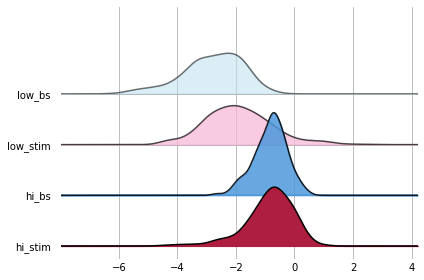

In [63]:
data={'low_bs': np.squeeze(p_low_bs2),'low_stim':np.squeeze(p_low_stim2),'hi_bs': np.squeeze(p_hi_bs2),'hi_stim':np.squeeze(p_hi_stim2)}
event_rate_df=pd.DataFrame(data)
import joypy
colors = ["#BEE1F0",'#F7B6D7','#4D98DB','#AE1E40']
fig, ax = joypy.joyplot(event_rate_df,grid=True,color=colors,fade=True)
plt.savefig('10Hz_ridge_line_plot.svg',dpi=1200,bbox_inches='tight')

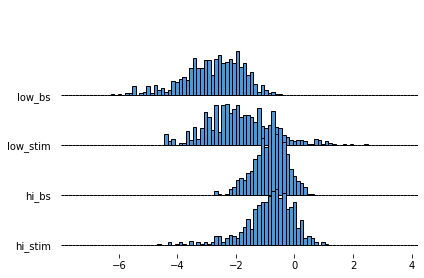

In [64]:
data={'low_bs': np.squeeze(p_low_bs2),'low_stim':np.squeeze(p_low_stim2),'hi_bs': np.squeeze(p_hi_bs2),'hi_stim':np.squeeze(p_hi_stim2)}
event_rate_df=pd.DataFrame(data)
import joypy
colors = '#4D98DB'
fig, ax = joypy.joyplot(event_rate_df,hist=True,bins=100,color=colors)
plt.savefig('10Hz_ridge_line_plot_hist.svg',dpi=1200,bbox_inches='tight')

In [347]:
bs=np.log(p_hi_bs)
stim=np.log(p_hi_stim)
os.chdir( "C:/Users/sudiksha/Documents/Codes/")
f=h5py.File('Hi_bs_stim_activity_rate_supp_figs2.h5',"w")
dset1 = f.create_dataset('bs', data=bs)
dset1 = f.create_dataset('stim', data=stim)

C:\Users\sudiksha\AppData\Local\Temp\ipykernel_8580\3724228554.py:2: RuntimeWarning: divide by zero encountered in log
  stim=np.log(p_hi_stim)


Ttest_relResult(statistic=-16.10955627720305, pvalue=1.240461500385704e-48)
WilcoxonResult(statistic=29663.0, pvalue=1.3172245747748086e-43)


/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log
  """Entry point for launching an IPython kernel.


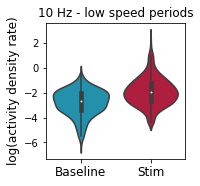

In [94]:
data={'Baseline': np.squeeze(np.log(p_low_bs)),'Stim':np.squeeze(np.log(p_low_stim))}
event_rate_df=pd.DataFrame(data)
idx=np.squeeze(np.where(np.isfinite(event_rate_df['Stim'])==0))
idx2=np.squeeze(np.where(np.isfinite(event_rate_df['Baseline'])==0))
idx=np.union1d(idx,idx2)
event_rate_df=event_rate_df.drop(idx,axis=0)
plt.figure(figsize=(2.5, 2.5))
my_pal = {"Baseline": "#0C9FC3", "Stim": "#C50632"}
ax=sns.violinplot(data=event_rate_df,palette=my_pal)
ax.set_xticklabels(['Baseline','Stim'],fontsize=12)
ax.set_ylabel('log(activity density rate)',fontsize=12)
ax.set_title('10 Hz - low speed periods',fontsize=12)
print(ss.ttest_rel(event_rate_df['Baseline'],event_rate_df['Stim']))
print(ss.wilcoxon(event_rate_df['Baseline'],event_rate_df['Stim']))
#ax.plot([0,1],[2.0,2.0], 'k')
#ax.text(0.5,2.0, '***', horizontalalignment='center', fontsize=14)
#ax.set_ylim([-6.5,3.5])
plt.savefig('boxplot_low_bs_vs_stim_10Hz.svg',dpi=1200,bbox_inches='tight')

In [143]:
_,_,counts_low_bs,t=get_firing_rate2(sess_list[0],binary_traces_df,'stn',1)
duration=np.ones((len(counts_low_bs),1))*t
mouse_id=[]
mouse_id.append(list(repeat(int(sess_list[0].split("_")[0]),len(counts_low_bs))))
for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate2(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate2(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        out=out
        tot_frames=tot_frames
    else:
        _,_,out,t=get_firing_rate2(sess_list[i],binary_traces_df,'stn',1)
        counts_low_bs=np.concatenate((counts_low_bs,out))
        tot_frames=np.ones((len(out),1))*t
        duration=np.concatenate((duration,tot_frames))
        mouse_id.append(list(repeat(int(sess_list[i].split("_")[0]),len(out))))
mouse_id = [element for nestedlist in mouse_id for element in nestedlist]
stim_vect=np.zeros((len(counts_low_bs)))
mov_vect=np.zeros((len(counts_low_bs)))
print(len(mouse_id),len(counts_low_bs),len(duration),len(stim_vect),len(mov_vect))

3187 3187 3187 3187 3187


In [144]:
_,_,counts_hi_bs,t=get_firing_rate2(sess_list[0],binary_traces_df,'mov',1)
duration2=np.ones((len(counts_hi_bs),1))*t
mouse_id2=[]
mouse_id2.append(list(repeat(int(sess_list[0].split("_")[0]),len(counts_hi_bs))))
for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate2(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate2(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        out=out
        tot_frames=tot_frames
    else:
        _,_,out,t=get_firing_rate2(sess_list[i],binary_traces_df,'mov',1)
        counts_hi_bs=np.concatenate((counts_hi_bs,out))
        tot_frames=np.ones((len(out),1))*t
        duration2=np.concatenate((duration2,tot_frames))
        mouse_id2.append(list(repeat(int(sess_list[i].split("_")[0]),len(out))))
mouse_id2 = [element for nestedlist in mouse_id2 for element in nestedlist]
stim_vect2=np.zeros((len(counts_hi_bs)))
mov_vect2=np.ones((len(counts_hi_bs)))
print(len(mouse_id2),len(counts_hi_bs),len(duration2),len(stim_vect2),len(mov_vect2))

3187 3187 3187 3187 3187


In [145]:
_,_,counts_low_stim,t=get_firing_rate2(sess_list[0],binary_traces_df,'stn',1)
duration3=np.ones((len(counts_low_stim),1))*t
mouse_id3=[]
mouse_id3.append(list(repeat(int(sess_list[0].split("_")[0]),len(counts_low_stim))))
for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate2(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate2(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        out=out
        tot_frames=tot_frames
    else:
        _,_,out,t=get_firing_rate2(sess_list[i],binary_traces_df,'stn',1)
        counts_low_stim=np.concatenate((counts_low_stim,out))
        tot_frames=np.ones((len(out),1))*t
        duration3=np.concatenate((duration3,tot_frames))
        mouse_id3.append(list(repeat(int(sess_list[i].split("_")[0]),len(out))))
mouse_id3 = [element for nestedlist in mouse_id3 for element in nestedlist]
stim_vect3=np.ones((len(counts_low_stim)))
mov_vect3=np.zeros((len(counts_low_stim)))
print(len(mouse_id3),len(counts_low_stim),len(duration3),len(stim_vect3),len(mov_vect3))

3187 3187 3187 3187 3187


In [146]:
_,_,counts_hi_stim,t=get_firing_rate2(sess_list[0],binary_traces_df,'mov',2)
duration4=np.ones((len(counts_hi_stim),1))*t
mouse_id4=[]
mouse_id4.append(list(repeat(int(sess_list[0].split("_")[0]),len(counts_hi_stim))))
for i in np.arange(1,len(sess_list),1):
    if type(get_firing_rate2(sess_list[i],binary_traces_df,'mov',2)[0])== int or type(get_firing_rate2(sess_list[i],binary_traces_df,'stn',2)[0])== int:
        out=out
        tot_frames=tot_frames
    else:
        _,_,out,t=get_firing_rate2(sess_list[i],binary_traces_df,'mov',2)
        counts_hi_stim=np.concatenate((counts_hi_stim,out))
        tot_frames=np.ones((len(out),1))*t
        duration4=np.concatenate((duration4,tot_frames))
        mouse_id4.append(list(repeat(int(sess_list[i].split("_")[0]),len(out))))
mouse_id4 = [element for nestedlist in mouse_id4 for element in nestedlist]
stim_vect4=np.ones((len(counts_hi_stim)))
mov_vect4=np.ones((len(counts_hi_stim)))
print(len(mouse_id4),len(counts_hi_stim),len(duration4),len(stim_vect4),len(mov_vect4))

3187 3187 3187 3187 3187


In [147]:
mouse_id_tot=np.concatenate((mouse_id,mouse_id2,mouse_id3,mouse_id4))
stim_vect_tot=np.concatenate((stim_vect,stim_vect2,stim_vect3,stim_vect4))
mov_vect_tot=np.concatenate((mov_vect,mov_vect2,mov_vect3,mov_vect4))
duration_tot=np.concatenate((duration,duration2,duration3,duration4))
duration_tot=np.squeeze(duration_tot)
counts_tot=np.concatenate((counts_low_bs,counts_hi_bs,counts_low_stim,counts_hi_stim))
counts_tot=np.squeeze(counts_tot)

In [148]:
data = {
  "Mouse ID": mouse_id_tot,"Motion":mov_vect_tot,
  "stim":stim_vect_tot,"Duration":duration_tot,"Counts":counts_tot
}

#load data into a DataFrame object:
df = pd.DataFrame(data)

df 

,Mouse ID,Motion,stim,Duration,Counts
0,602101,0.0,0.0,23506.0,0.0
1,602101,0.0,0.0,23506.0,13.0
2,602101,0.0,0.0,23506.0,120.0
3,602101,0.0,0.0,23506.0,268.0
4,602101,0.0,0.0,23506.0,115.0
...,...,...,...,...,...
12743,615883,1.0,1.0,5902.0,77.0
12744,615883,1.0,1.0,5902.0,142.0
12745,615883,1.0,1.0,5902.0,116.0
12746,615883,1.0,1.0,5902.0,230.0


In [149]:
from pathlib import Path  

filepath = Path( 'C:/Users/sudiksha/Documents/Codes/mixed_lm_counts_10Hz_all_neurons.csv')  

filepath.parent.mkdir(parents=True, exist_ok=True)  

df.to_csv(filepath)  

### Transient and sustained population maps 

In [150]:
def Z_score_transient_stim_trace(sess_name,win_size,traces_df):
    stim_frames=get_stim_frames_index(sess_name)
    stim_onsets=np.array(stim_onsets_df.loc[sess_name,:])
    N_onsets=stim_onsets.shape[0]

    # Load binary traces 
    processed_traces= traces_df[sess_name]
    processed_traces =processed_traces.T
    Ncells= processed_traces.shape[0]

    actual_metric=[]      

    trace_exp_block = np.zeros((N_onsets, processed_traces.shape[0],2*win_size))
    trace_norm_block = np.zeros((N_onsets, processed_traces.shape[0],2*win_size))

    for idx, spot in enumerate(stim_onsets):
        trace_exp_block[idx,:,:] = processed_traces.loc[:,spot-win_size:spot+win_size-1].values

    for cell in range(0,Ncells,1):
        temp_df=trace_exp_block[:,cell,:]
        for i in np.arange(0,N_onsets,1):
            trace_norm_block[i,cell,:]=temp_df[i,:]-np.mean(temp_df[i,0:win_size])
            
    pre=[]
    post=[]
    resp_cell=[]
    for cell in range(0,Ncells,1):
        temp_df=np.mean(trace_norm_block[:,cell,:],axis=0)
        pre.append(np.mean(temp_df[0:win_size]))
        post.append(np.mean(temp_df[win_size:]))
        a=np.squeeze(np.mean(temp_df[0:win_size]))
        b=np.squeeze(np.mean(temp_df[win_size:]))
        #if ss.wilcoxon(a,b)[0]<0.05:
        #    resp_cell.append(cell)

          
    mean_across_onsets= np.nanmean(trace_exp_block,axis=0)
    mean_across_cells= np.nanmean(mean_across_onsets,axis=0)
    
    mean_across_onsets=np.nanmean(trace_norm_block,axis=1)
    return mean_across_cells,mean_across_onsets

In [151]:
def Z_score_transient_stim_trace_offset(sess_name,win_size,traces_df):
    stim_frames=get_stim_frames_index(sess_name)
    stim_offsets=np.array(stim_offsets_df.loc[sess_name,:])
    N_offsets=stim_offsets.shape[0]

    # Load binary traces 
    processed_traces= traces_df[sess_name]
    processed_traces =processed_traces.T
    Ncells= processed_traces.shape[0]

    actual_metric=[]      

    trace_exp_block = np.zeros((N_offsets, processed_traces.shape[0],2*win_size))
    trace_norm_block = np.zeros((N_offsets, processed_traces.shape[0],2*win_size))

    for idx, spot in enumerate(stim_offsets):
        trace_exp_block[idx,:,:] = processed_traces.loc[:,spot-win_size:spot+win_size-1].values

    for cell in range(0,Ncells,1):
        temp_df=trace_exp_block[:,cell,:]
        for i in np.arange(0,N_offsets,1):
            trace_norm_block[i,cell,:]=temp_df[i,:]-np.mean(temp_df[i,0:win_size])
            
    pre=[]
    post=[]
    resp_cell=[]
    for cell in range(0,Ncells,1):
        temp_df=np.mean(trace_norm_block[:,cell,:],axis=0)
        pre.append(np.mean(temp_df[0:win_size]))
        post.append(np.mean(temp_df[win_size:]))
        a=np.squeeze(np.mean(temp_df[0:win_size]))
        b=np.squeeze(np.mean(temp_df[win_size:]))
        #if ss.wilcoxon(a,b)[0]<0.05:
        #    resp_cell.append(cell)

          
    mean_across_offsets= np.nanmean(trace_exp_block,axis=0)
    mean_across_cells= np.nanmean(mean_across_offsets,axis=0)
    
    mean_across_offsets=np.nanmean(trace_norm_block,axis=1)
    return mean_across_cells,mean_across_offsets

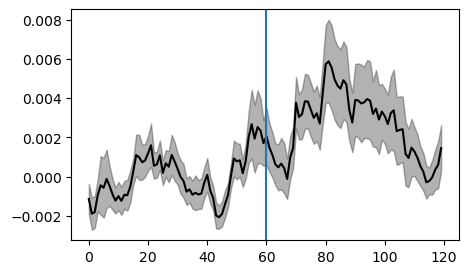

In [152]:
win_size=60
mean_across_sess=np.zeros((5*len(sess_list),2*win_size))
for i in np.arange(0,len(sess_list),1):
    _,mean=Z_score_transient_stim_trace_offset(sess_list[i],win_size,binary_traces_df)
    mean_across_sess[i:i+5,:]=mean
mean=np.mean(mean_across_sess,axis=0)
fig, ax = plt.subplots(figsize=(5, 3))
ax.plot(np.mean(mean_across_sess,axis=0),color='k')
ax.axvline(x=win_size)
std=np.nanstd(mean_across_sess,axis=0)/np.sqrt(mean_across_sess.shape[0])
ax.fill_between(np.arange(0,2*win_size,1), mean-std, mean+std,color='k',alpha=0.3)
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_3/')
#plt.savefig('Transient_Resp_10Hz_trial_wise.svg',bbox_inches='tight',dpi=1200)

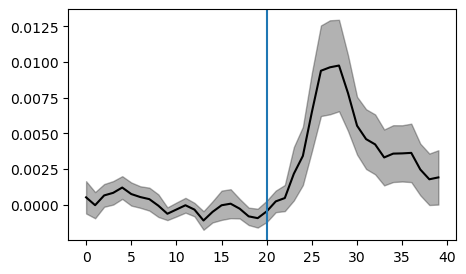

In [153]:
win_size=20
mean_across_sess=np.zeros((5*len(sess_list),2*win_size))
for i in np.arange(0,len(sess_list),1):
    _,mean=Z_score_transient_stim_trace(sess_list[i],win_size,binary_traces_df)
    mean_across_sess[i:i+5,:]=mean
mean=np.mean(mean_across_sess,axis=0)
fig, ax = plt.subplots(figsize=(5, 3))
ax.plot(np.mean(mean_across_sess,axis=0),color='k')
ax.axvline(x=win_size)
std=np.nanstd(mean_across_sess,axis=0)/np.sqrt(mean_across_sess.shape[0])
ax.fill_between(np.arange(0,2*win_size,1), mean-std, mean+std,color='k',alpha=0.3)
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_3/')
#plt.savefig('Transient_Resp_10Hz_trial_wise.svg',bbox_inches='tight',dpi=1200)

## Transient response at onset 

In [159]:
def Z_score_transient_stim2(sess_name,win_size,traces_df):
    stim_frames=get_stim_frames_index(sess_name)
    stim_onsets=np.array(stim_onsets_df.loc[sess_name,:])
    N_onsets=stim_onsets.shape[0]

    # Load binary traces 
    processed_traces= traces_df[sess_name]
    processed_traces =processed_traces.T
    Ncells= processed_traces.shape[0]

    actual_metric=[]      

    trace_exp_block = np.zeros((N_onsets, processed_traces.shape[0],2*win_size))
    trace_norm_block = np.zeros((N_onsets, processed_traces.shape[0],2*win_size))

    for idx, spot in enumerate(stim_onsets):
        trace_exp_block[idx,:,:] = processed_traces.loc[:,spot-win_size:spot+win_size-1].values

    for cell in range(0,Ncells,1):
        temp_df=trace_exp_block[:,cell,:]
        for i in np.arange(0,N_onsets,1):
            trace_norm_block[i,cell,:]=temp_df[i,:]        
    pre=[]
    post=[]
    for cell in range(0,Ncells,1):
        temp_df=np.mean(trace_norm_block[:,cell,:],axis=0)
        pre.append(np.mean(temp_df[0:win_size]))
        post.append(np.mean(temp_df[win_size:]))
    pre_mean=np.nanmean(pre)
    post_mean=np.nanmean(post)
    return pre_mean,post_mean

In [160]:
def Z_score_transient_stim_offset2(sess_name,win_size,traces_df):
    stim_frames=get_stim_frames_index(sess_name)
    stim_offsets=np.array(stim_offsets_df.loc[sess_name,:])
    N_offsets=stim_offsets.shape[0]

    # Load binary traces 
    processed_traces= traces_df[sess_name]
    processed_traces =processed_traces.T
    Ncells= processed_traces.shape[0]

    actual_metric=[]      

    trace_exp_block = np.zeros((N_offsets, processed_traces.shape[0],2*win_size))
    trace_norm_block = np.zeros((N_offsets, processed_traces.shape[0],2*win_size))

    for idx, spot in enumerate(stim_offsets):
        trace_exp_block[idx,:,:] = processed_traces.loc[:,spot-win_size:spot+win_size-1].values

    for cell in range(0,Ncells,1):
        temp_df=trace_exp_block[:,cell,:]
        for i in np.arange(0,N_offsets,1):
            trace_norm_block[i,cell,:]=temp_df[i,:]        
    pre=[]
    post=[]
    for cell in range(0,Ncells,1):
        temp_df=np.mean(trace_norm_block[:,cell,:],axis=0)
        pre.append(np.mean(temp_df[0:win_size]))
        post.append(np.mean(temp_df[win_size:]))
    pre_mean=np.nanmean(pre)
    post_mean=np.nanmean(post)
    return pre_mean,post_mean

TtestResult(statistic=-3.3430537519708117, pvalue=0.005290907913336133, df=13)
WilcoxonResult(statistic=8.0, pvalue=0.0030517578125)


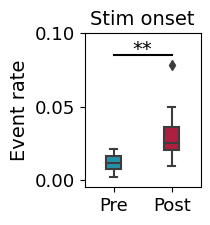

In [167]:
pre_norm=[]
transient_norm=[]
for i in np.arange(0,len(Files),1):
    pre,post=Z_score_transient_stim2(sess_list[i],20,binary_traces_df)
    pre_norm.append(np.nanmean(pre))
    transient_norm.append(np.nanmean(post))
print(ss.ttest_rel(pre_norm,transient_norm))
print(ss.wilcoxon(pre_norm,transient_norm))
data={'Pre':pre_norm,'Post':transient_norm}
df=pd.DataFrame(data)
my_pal=['#C50632']
plt.figure(figsize=(1.5,2.0))
my_pal = {"Pre": "#0C9FC3", "Post": "#C50632"}
ax=sns.boxplot(data=df,palette=my_pal,width=0.25)
ax.set_ylabel('Event rate',fontsize=14)
x=[np.zeros(len(pre_norm)),np.ones(len(pre_norm))]
y=[df['Pre'],df['Post']]
#ax.scatter(x,y,color='k',alpha=0.3)
#ax.plot(x,y,color='k',alpha=0.3)
ax.set_xticklabels(['Pre','Post'],fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=13)
ax.plot([0,1],[0.085,0.085], 'k')
ax.text(0.5,0.085, '**', horizontalalignment='center', fontsize=14)
ax.set_ylim([-0.005,0.1])
ax.set_title('Stim onset',fontsize=14)

#sns.scatterplot(data=df)
ax.grid(False)
plt.savefig('Transient_resp_10Hz_session_wise_box.svg',dpi=1200,bbox_inches='tight')

TtestResult(statistic=-4.702932717843381, pvalue=0.00041302472434912035, df=13)
WilcoxonResult(statistic=4.0, pvalue=0.0008544921875)


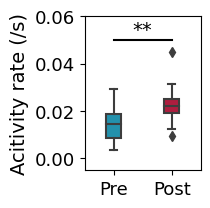

In [168]:
pre_norm=[]
transient_norm=[]
for i in np.arange(0,len(Files),1):
    pre,post=Z_score_transient_stim_offset2(sess_list[i],20,binary_traces_df)
    pre_norm.append(np.nanmean(pre))
    transient_norm.append(np.nanmean(post))
print(ss.ttest_rel(pre_norm,transient_norm))
print(ss.wilcoxon(pre_norm,transient_norm))
data={'Pre':pre_norm,'Post':transient_norm}
df=pd.DataFrame(data)
my_pal=['#C50632']
plt.figure(figsize=(1.5,2.0))
my_pal = {"Pre": "#0C9FC3", "Post": "#C50632"}
ax=sns.boxplot(data=df,palette=my_pal,width=0.25)
ax.set_ylabel('Acitivity rate (/s)',fontsize=14)
x=[np.zeros(len(pre_norm)),np.ones(len(pre_norm))]
y=[df['Pre'],df['Post']]
#ax.scatter(x,y,color='k',alpha=0.3)
#ax.plot(x,y,color='k',alpha=0.3)
ax.set_xticklabels(['Pre','Post'],fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=13)
ax.plot([0,1],[0.05,0.05], 'k')
ax.text(0.5,0.052, '**', horizontalalignment='center', fontsize=14)
ax.set_ylim([-0.005,0.06])
#ax.set_title('Transient Response',fontsize=14)
#sns.scatterplot(data=df)
ax.grid(False)
plt.savefig('Transient_resp_10Hz_session_wise_box_offset.svg',dpi=1200,bbox_inches='tight')

TtestResult(statistic=-1.3405874441723304, pvalue=0.20301194041668755, df=13)
WilcoxonResult(statistic=42.0, pvalue=0.5416259765625)


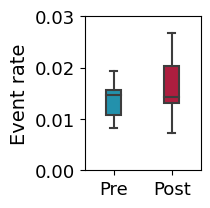

In [164]:
pre_norm=[]
transient_norm=[]
for i in np.arange(0,len(Files),1):
    pre,post=Z_score_transient_stim2(sess_list[i],1200,binary_traces_df)
    pre_norm.append(np.nanmean(pre))
    transient_norm.append(np.nanmean(post))
print(ss.ttest_rel(pre_norm,transient_norm))
print(ss.wilcoxon(pre_norm,transient_norm))
data={'Pre':pre_norm,'Post':transient_norm}
df=pd.DataFrame(data)
my_pal=['#C50632']
plt.figure(figsize=(1.5,2.0))
my_pal = {"Pre": "#0C9FC3", "Post": "#C50632"}
ax=sns.boxplot(data=df,palette=my_pal,width=0.25)
ax.set_ylabel('Event rate',fontsize=14)
x=[np.zeros(len(pre_norm)),np.ones(len(pre_norm))]
y=[df['Pre'],df['Post']]
#ax.scatter(x,y,color='k',alpha=0.3)
#ax.plot(x,y,color='k',alpha=0.3)
ax.set_xticklabels(['Pre','Post'],fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=13)
ax.set_ylim([0,0.03])
#sns.scatterplot(data=df)
ax.grid(False)
plt.savefig('Sustained_resp_10Hz_session_wise_box.svg',dpi=1200,bbox_inches='tight')

In [147]:
## Store above in .h5 file to plot violin plots in MATLAB 
pre_norm=[]
transient_norm=[]
for i in np.arange(0,len(Files),1):
    pre,post=Z_score_transient_stim2(sess_list[i],20,binary_traces_df)
    pre_norm.append(np.nanmean(pre))
    transient_norm.append(np.nanmean(post))
    
pre_norm2=[]
transient_norm2=[]
for i in np.arange(0,len(Files),1):
    pre,post=Z_score_transient_stim_offset2(sess_list[i],20,binary_traces_df)
    pre_norm2.append(np.nanmean(pre))
    transient_norm2.append(np.nanmean(post))

pre_norm3=[]
transient_norm3=[]
for i in np.arange(0,len(Files),1):
    pre,post=Z_score_transient_stim2(sess_list[i],1200,binary_traces_df)
    pre_norm3.append(np.nanmean(pre))
    transient_norm3.append(np.nanmean(post))

f=h5py.File('Stim_Resp_10Hz_violin_box_plots.h5',"w")
dset1 = f.create_dataset('pre_onset', data=pre_norm)
dset1 = f.create_dataset('post_onset', data=transient_norm)
dset1 = f.create_dataset('pre_offset', data=pre_norm2)
dset1 = f.create_dataset('post_offset', data=transient_norm2)
dset1 = f.create_dataset('pre_sus', data=pre_norm3)
dset1 = f.create_dataset('post_sus', data=transient_norm3)
f.close()

In [31]:
def population_transient_stim(sess_name,win_size,traces_df):
    stim_frames=get_stim_frames_index(sess_name)
    stim_onsets=np.array(stim_onsets_df.loc[sess_name,:])
    N_onsets=stim_onsets.shape[0]

    # Load binary traces 
    processed_traces= traces_df[sess_name]
    processed_traces =processed_traces.T
    Ncells= processed_traces.shape[0]

    actual_metric=[]      

    trace_exp_block = np.zeros((N_onsets, processed_traces.shape[0],2*win_size))
    trace_norm_block = np.zeros((N_onsets, processed_traces.shape[0],2*win_size))

    for idx, spot in enumerate(stim_onsets):
        trace_exp_block[idx,:,:] = processed_traces.loc[:,spot-win_size:spot+win_size-1].values

    for cell in range(0,Ncells,1):
        temp_df=trace_exp_block[:,cell,:]
        for i in np.arange(0,N_onsets,1):
            trace_norm_block[i,cell,:]=temp_df[i,:]-np.mean(temp_df[i,0:win_size])
        

    stim_blocks=np.mean(trace_norm_block,axis=0)
    #sort_inds1=np.argsort(np.mean(stim_blocks[:,win_size:2*win_size],axis=1))
    #ax=sns.heatmap(stim_blocks[sort_inds1,:],vmax=-1,vmin=4)
    #sorting
    #ax.axvline(x=win_size,color='w')
    return stim_blocks 

In [32]:
def population_transient_stim_movement(sess_name,win_size):
    
    stim_frames=get_stim_frames_index(sess_name)
    stim_onsets=np.array(stim_onsets_df.loc[sess_name,:])
    N_onsets=stim_onsets.shape[0]

    traces_df=motion_df

    processed_traces= traces_df.loc[sess_name]
    processed_traces =processed_traces.T

    actual_metric=[]      
   

    trace_exp_block = np.zeros((N_onsets, 3*win_size))

    for idx, spot in enumerate(stim_onsets):
        trace_exp_block[idx,:] = processed_traces.loc[spot-win_size:spot+2*win_size-1].values
    stim_blocks=np.mean(trace_exp_block,axis=0)
    return stim_blocks 

In [33]:
def population_transient_stim_movement2(sess_name,win_size):
    
    stim_frames=get_stim_frames_index(sess_name)
    stim_onsets=np.array(stim_onsets_df.loc[sess_name,:])
    N_onsets=stim_onsets.shape[0]

    traces_df=motion_df

    processed_traces= traces_df.loc[sess_name]
    processed_traces =processed_traces.T

    actual_metric=[]      
   

    trace_exp_block = np.zeros((N_onsets, 3*win_size))

    for idx, spot in enumerate(stim_onsets):
        trace_exp_block[idx,:] = processed_traces.loc[spot-win_size:spot+2*win_size-1].values
    stim_blocks=np.mean(trace_exp_block,axis=0)
    return trace_exp_block 

In [34]:
def population_transient_stim_Ca(sess_name,win_size):
    
    stim_frames=get_stim_frames_index(sess_name)
    stim_onsets=np.array(stim_onsets_df.loc[sess_name,:])
    N_onsets=stim_onsets.shape[0]

    traces_df=binary_traces_df

    processed_traces= traces_df.loc[:,sess_name]
    processed_traces =processed_traces.T

    actual_metric=[]      
   

    trace_exp_block = np.zeros((N_onsets, 3*win_size))

    for idx, spot in enumerate(stim_onsets):
        block = processed_traces.loc[:,spot-win_size:spot+2*win_size-1].values
        trace_exp_block[idx,:] = np.mean(block,axis=0)
    return trace_exp_block 

In [35]:
def population_transient_stim_offset(sess_name,win_size,traces_df):
    stim_frames=get_stim_frames_index(sess_name)
    stim_offsets=np.array(stim_offsets_df.loc[sess_name,:])
    N_offsets=stim_offsets.shape[0]

    # Load binary traces 
    processed_traces= traces_df[sess_name]
    processed_traces =processed_traces.T
    Ncells= processed_traces.shape[0]

    actual_metric=[]      

    trace_exp_block = np.zeros((N_offsets, processed_traces.shape[0],2*win_size))
    trace_norm_block = np.zeros((N_offsets, processed_traces.shape[0],2*win_size))

    for idx, spot in enumerate(stim_offsets):
        trace_exp_block[idx,:,:] = processed_traces.loc[:,spot-win_size:spot+win_size-1].values

    for cell in range(0,Ncells,1):
        temp_df=trace_exp_block[:,cell,:]
        for i in np.arange(0,N_offsets,1):
            trace_norm_block[i,cell,:]=temp_df[i,:]-np.mean(temp_df[i,0:win_size])
        

    stim_blocks=np.mean(trace_norm_block,axis=0)
    #sort_inds1=np.argsort(np.mean(stim_blocks[:,win_size:2*win_size],axis=1))
    #ax=sns.heatmap(stim_blocks[sort_inds1,:],vmax=-1,vmin=4)
    #sorting
    #ax.axvline(x=win_size,color='w')
    return stim_blocks 

In [36]:
def population_transient_stim_pre_post(sess_name,win_size,traces_df):
    stim_frames=get_stim_frames_index(sess_name)
    stim_onsets=np.array(stim_onsets_df.loc[sess_name,:])
    N_onsets=stim_onsets.shape[0]

    # Load binary traces 
    processed_traces= traces_df[sess_name]
    processed_traces =processed_traces.T
    Ncells= processed_traces.shape[0]

    actual_metric=[]      

    trace_exp_block = np.zeros((N_onsets, processed_traces.shape[0],3*win_size))
    trace_norm_block = np.zeros((N_onsets, processed_traces.shape[0],3*win_size))

    for idx, spot in enumerate(stim_onsets):
        trace_exp_block[idx,:,:] = processed_traces.loc[:,spot-win_size:spot+2*win_size-1].values

    for cell in range(0,Ncells,1):
        temp_df=trace_exp_block[:,cell,:]
        for i in np.arange(0,N_onsets,1):
            trace_norm_block[i,cell,:]=temp_df[i,:]-np.mean(temp_df[i,0:win_size])
        

    stim_blocks=np.mean(trace_norm_block,axis=0)
    #sort_inds1=np.argsort(np.mean(stim_blocks[:,win_size:2*win_size],axis=1))
    #ax=sns.heatmap(stim_blocks[sort_inds1,:],vmax=-1,vmin=4)
    #sorting
    #ax.axvline(x=win_size,color='w')
    return stim_blocks 

In [98]:
def population_transient_resp_stim_pre_post(sess_name,win_size,traces_df):
    stim_frames=get_stim_frames_index(sess_name)
    stim_onsets=np.array(stim_onsets_df.loc[sess_name,:])
    N_onsets=stim_onsets.shape[0]

    # Load binary traces 
    processed_traces= traces_df[sess_name]
    processed_traces =processed_traces.T
    _,active_cells,_=get_stim_responsive_cells(sess_name,processed_traces_df,win_size)
    processed_traces =processed_traces.loc[np.squeeze(active_cells),:]
    Ncells= processed_traces.shape[0]

    actual_metric=[]      

    trace_exp_block = np.zeros((N_onsets, processed_traces.shape[0],3*win_size))
    trace_norm_block = np.zeros((N_onsets, processed_traces.shape[0],3*win_size))

    for idx, spot in enumerate(stim_onsets):
        trace_exp_block[idx,:,:] = processed_traces.loc[:,spot-win_size:spot+2*win_size-1].values

    for cell in range(0,Ncells,1):
        temp_df=trace_exp_block[:,cell,:]
        for i in np.arange(0,N_onsets,1):
            trace_norm_block[i,cell,:]=temp_df[i,:]-np.mean(temp_df[i,0:win_size])
        

    stim_blocks=np.mean(trace_norm_block,axis=0)
    #sort_inds1=np.argsort(np.mean(stim_blocks[:,win_size:2*win_size],axis=1))
    #ax=sns.heatmap(stim_blocks[sort_inds1,:],vmax=-1,vmin=4)
    #sorting
    #ax.axvline(x=win_size,color='w')
    return stim_blocks 

In [92]:
os.chdir( "C:/Users/sudiksha/Documents/Codes/")

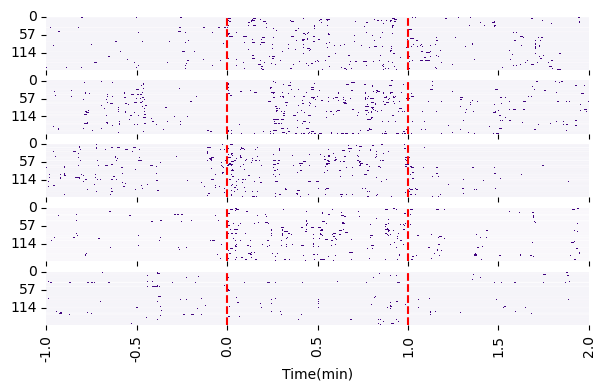

In [100]:
#sess_name='608450_03092020'
sess_name='602101_03092020'
stim_frames=get_stim_frames_index(sess_name)
stim_onsets=np.array(stim_onsets_df.loc[sess_name,:])
N_onsets=stim_onsets.shape[0]
traces_df=binary_traces_df

processed_traces= traces_df[sess_name]
processed_traces =processed_traces.T
Ncells= processed_traces.shape[0]

actual_metric=[]      
win_size=1200

trace_exp_block = np.zeros((N_onsets, processed_traces.shape[0],3*win_size))
trace_norm_block = np.zeros((N_onsets, processed_traces.shape[0],3*win_size))

for idx, spot in enumerate(stim_onsets):
    trace_exp_block[idx,:,:] = processed_traces.loc[:,spot-win_size:spot+2*win_size-1].values

for cell in range(0,Ncells,1):
    temp_df=trace_exp_block[:,cell,:]
    for i in np.arange(0,N_onsets,1):
        trace_norm_block[i,cell,:]=temp_df[i,:]-np.mean(temp_df[i,0:win_size])
        
trace_norm_block.shape
fig, ax = plt.subplots(5, 1,figsize=(7,4),sharex=True)
for i in np.arange(0,5,1):
    sns.heatmap(trace_norm_block[i,:,:],cmap='Purples',ax=ax[i],cbar= False)
    ax[i].axvline(x=win_size,color='r',linestyle='--')
    ax[i].axvline(x=2*win_size,color='r',linestyle='--')
    ax[i].set_xticks(np.arange(0,3700, 600))
    ax[i].set_xticklabels(np.arange(-1,2.5,0.5))
    #ax[i].set_ylabel('Cell number',fontsize=11)
    ax[i].set_xlabel('Time(min)')    
plt.savefig('602101_03092020_10Hz_trialwise_stim_heatmap_plots.png',bbox_inches='tight')

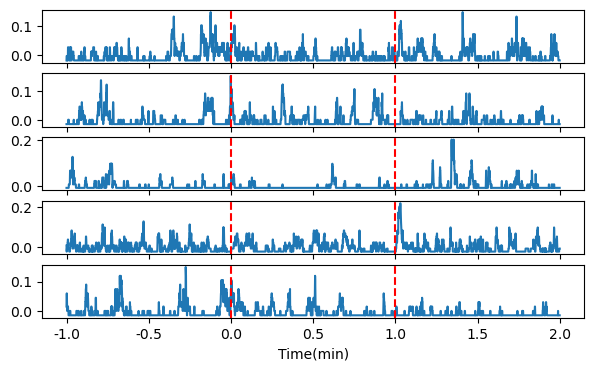

In [99]:
sess_name='602101_07082020'
stim_frames=get_stim_frames_index(sess_name)
stim_onsets=np.array(stim_onsets_df.loc[sess_name,:])
N_onsets=stim_onsets.shape[0]
traces_df=binary_traces_df

processed_traces= traces_df[sess_name]
processed_traces =processed_traces.T
Ncells= processed_traces.shape[0]

actual_metric=[]      
win_size=1200

trace_exp_block = np.zeros((N_onsets, processed_traces.shape[0],3*win_size))
trace_norm_block = np.zeros((N_onsets, processed_traces.shape[0],3*win_size))

for idx, spot in enumerate(stim_onsets):
    trace_exp_block[idx,:,:] = processed_traces.loc[:,spot-win_size:spot+2*win_size-1].values

for cell in range(0,Ncells,1):
    temp_df=trace_exp_block[:,cell,:]
    for i in np.arange(0,N_onsets,1):
        trace_norm_block[i,cell,:]=temp_df[i,:]-np.mean(temp_df[i,0:win_size])
        
trace_norm_block.shape
fig, ax = plt.subplots(5, 1,figsize=(7,4),sharex=True)
for i in np.arange(0,5,1):
    avg_trial=np.mean(trace_norm_block[i,:,:],axis=0)
    ax[i].plot(avg_trial)
    ax[i].axvline(x=win_size,color='r',linestyle='--')
    ax[i].axvline(x=2*win_size,color='r',linestyle='--')
    ax[i].set_xticks(np.arange(0,3700, 600))
    ax[i].set_xticklabels(np.arange(-1,2.5,0.5))
    #ax[i].set_ylabel('Cell number',fontsize=11)
    ax[i].set_xlabel('Time(min)')    
#plt.savefig('602101_03092020_10Hz_trialwise_stim_avg_plots.svg',bbox_inches='tight')

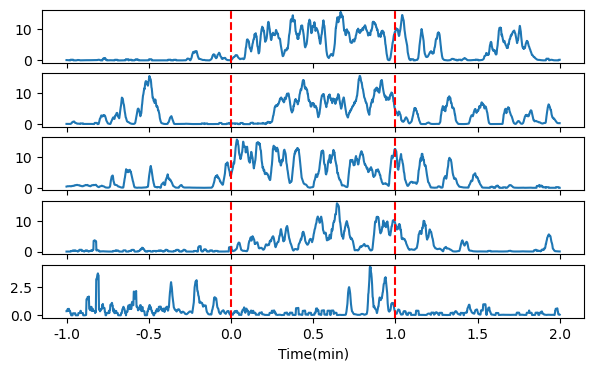

In [88]:
#sess_name='602101_07082020'
sess_name='602101_03092020'
stim_frames=get_stim_frames_index(sess_name)
stim_onsets=np.array(stim_onsets_df.loc[sess_name,:])
N_onsets=stim_onsets.shape[0]
traces_df=motion_df

processed_traces= traces_df.loc[sess_name]
processed_traces =processed_traces.T

actual_metric=[]      
win_size=1200

trace_exp_block = np.zeros((N_onsets, 3*win_size))
trace_norm_block = np.zeros((N_onsets, 3*win_size))

for idx, spot in enumerate(stim_onsets):
    trace_exp_block[idx,:] = processed_traces.loc[spot-win_size:spot+2*win_size-1].values


        
fig, ax = plt.subplots(5, 1,figsize=(7,4),sharex=True)
for i in np.arange(0,5,1):
    avg_trial=trace_exp_block[i,:]
    ax[i].plot(avg_trial)
    ax[i].axvline(x=win_size,color='r',linestyle='--')
    ax[i].axvline(x=2*win_size,color='r',linestyle='--')
    ax[i].set_xticks(np.arange(0,3700, 600))
    ax[i].set_xticklabels(np.arange(-1,2.5,0.5))
    #ax[i].set_ylabel('Cell number',fontsize=11)
    ax[i].set_xlabel('Time(min)')    
plt.savefig('602101_03092020_10Hz_trialwise_stim_avg_plots.svg',bbox_inches='tight')

In [ ]:
stim_frames=get_stim_frames_index(sess_name)
stim_onsets=np.array(stim_onsets_df.loc[sess_name,:])
N_onsets=stim_onsets.shape[0]

traces_df=motion_df

processed_traces= traces_df.loc[sess_name]
processed_traces =processed_traces.T

actual_metric=[]      
win_size=1200

trace_exp_block = np.zeros((N_onsets, 3*win_size))

for idx, spot in enumerate(stim_onsets):
    trace_exp_block[idx,:] = processed_traces.loc[spot-win_size:spot+2*win_size-1].values
stim_blocks=np.mean(trace_exp_block,axis=0)
    

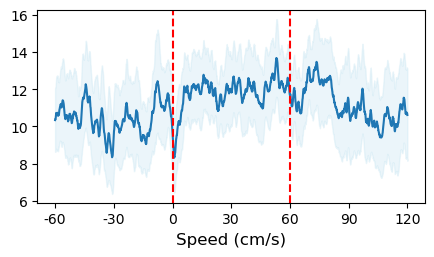

In [86]:
## Z score to the period before..
win_size=1200
sess_name=sess_list[0]
stim_blocks=population_transient_stim_movement(sess_name,win_size)
mean_across_sess=np.zeros((len(sess_list),3600))
mean_across_sess[0,:]=stim_blocks
for i in np.arange(1,len(sess_list),1):
    sess_name=sess_list[i]
    stim_blocks=population_transient_stim_movement(sess_name,win_size)
    mean_across_sess[i,:]=stim_blocks
fig, ax = plt.subplots(1, 1,figsize=(5,2.5))   
plt.plot(np.nanmean(mean_across_sess,axis=0))
ax.axvline(x=win_size,color='r',linestyle='--')
ax.axvline(x=2*win_size,color='r',linestyle='--')
mean=np.nanmean(mean_across_sess,axis=0)
std=np.nanstd(mean_across_sess,axis=0)/np.sqrt(mean_across_sess.shape[0])
ax.fill_between(np.arange(0,3600), mean-std, mean+std,color='#BEE1F0',alpha=0.3)
ax.set_xticks(np.arange(0, 3700, 600))
ax.set_xticklabels(np.arange(-60,125,30))
ax.set_xlabel('Time (in s)',fontsize=12)
ax.set_xlabel('Speed (cm/s)',fontsize=12)
plt.savefig('sustained_stim_movement_pre_post_10Hz.svg',dpi=1200,bbox_inches='tight')

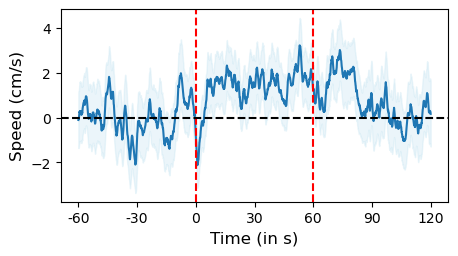

In [133]:
## Z score to the period before..
win_size=1200
sess_name=sess_list[0]
stim_blocks=population_transient_stim_movement2(sess_name,win_size)
for i in np.arange(1,len(sess_list),1):
    sess_name=sess_list[i]
    b=population_transient_stim_movement2(sess_name,win_size)
    stim_blocks=np.concatenate((stim_blocks,b))
fig, ax = plt.subplots(1, 1,figsize=(5,2.5))   
mean=np.nanmean(stim_blocks,axis=0)
plt.plot(mean-np.nanmean(mean[0:1200]))
ax.axvline(x=win_size,color='r',linestyle='--')
ax.axvline(x=2*win_size,color='r',linestyle='--')
ax.axhline(y=0,color='k',linestyle='--')
std=np.nanstd(stim_blocks,axis=0)/np.sqrt(stim_blocks.shape[0])
mean2=mean-np.nanmean(mean[0:1200])
ax.fill_between(np.arange(0,3600), mean2-std, mean2+std,color='#BEE1F0',alpha=0.3)
ax.set_xticks(np.arange(0, 3700, 600))
ax.set_xticklabels(np.arange(-60,125,30))
ax.set_xlabel('Time (in s)',fontsize=12)
ax.set_ylabel('Speed (cm/s)',fontsize=12)
plt.savefig('sustained_stim_movement_pre_post_10Hz_70trials_avg.svg',dpi=1200,bbox_inches='tight')

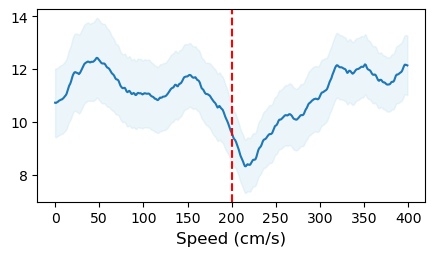

In [125]:
## Z score to the period before..
win_size=200
sess_name=sess_list[0]
stim_blocks=population_transient_stim_movement2(sess_name,win_size)
for i in np.arange(1,len(sess_list),1):
    sess_name=sess_list[i]
    b=population_transient_stim_movement2(sess_name,win_size)
    stim_blocks=np.concatenate((stim_blocks,b))
fig, ax = plt.subplots(1, 1,figsize=(5,2.5))   
plt.plot(np.nanmean(stim_blocks[:,0:2*win_size],axis=0))
ax.axvline(x=win_size,color='r',linestyle='--')
#ax.axvline(x=2*win_size,color='r',linestyle='--')
mean=np.nanmean(stim_blocks[:,0:2*win_size],axis=0)
std=np.nanstd(stim_blocks[:,0:2*win_size],axis=0)/np.sqrt(stim_blocks[:,0:2*win_size].shape[0])
ax.fill_between(np.arange(0,400), mean-std, mean+std,color='#BEE1F0',alpha=0.3)
#ax.set_xticks(np.arange(0, 3700, 600))
#ax.set_xticklabels(np.arange(-60,125,30))
ax.set_xlabel('Time (in s)',fontsize=12)
ax.set_xlabel('Speed (cm/s)',fontsize=12)
plt.savefig('sustained_stim_movement_pre_post_10Hz_70trials_avg_zoom.svg',dpi=1200,bbox_inches='tight')

Text(0.5, 0, 'Speed (cm/s)')

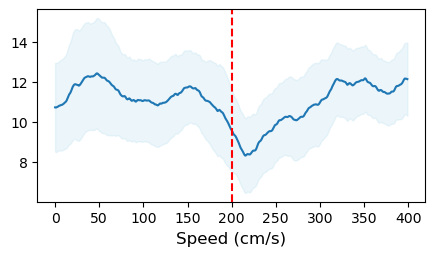

In [119]:
## Z score to the period before..
win_size=200
sess_name=sess_list[0]
stim_blocks=population_transient_stim_movement(sess_name,win_size)
mean_across_sess=np.zeros((len(sess_list),2*win_size))
mean_across_sess[0,:]=stim_blocks[0:2*win_size]
for i in np.arange(1,len(sess_list),1):
    sess_name=sess_list[i]
    stim_blocks=population_transient_stim_movement(sess_name,win_size)
    mean_across_sess[i,:]=stim_blocks[0:2*win_size]
fig, ax = plt.subplots(1, 1,figsize=(5,2.5))   
plt.plot(np.nanmean(mean_across_sess,axis=0))
ax.axvline(x=win_size,color='r',linestyle='--')
mean=np.nanmean(mean_across_sess,axis=0)
std=np.nanstd(mean_across_sess,axis=0)/np.sqrt(mean_across_sess.shape[0])
ax.fill_between(np.arange(0,2*win_size), mean-std, mean+std,color='#BEE1F0',alpha=0.3)
#ax.set_xticks(np.arange(0, 3700, 600))
#ax.set_xticklabels(np.arange(-60,125,30))
ax.set_xlabel('Time (in s)',fontsize=12)
ax.set_xlabel('Speed (cm/s)',fontsize=12)
#plt.savefig('sustained_stim_movement_pre_post_10Hz.svg',dpi=1200,bbox_inches='tight')

Text(0.5, 0, 'Speed (cm/s)')

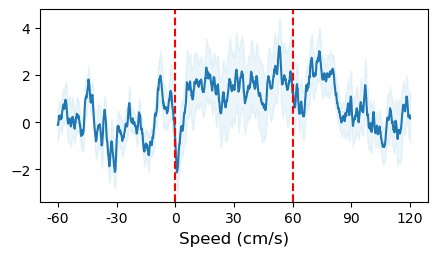

In [113]:
## Z score to the period before..
win_size=1200
sess_name=sess_list[0]
stim_blocks=population_transient_stim_movement(sess_name,win_size)
mean_across_sess=np.zeros((len(sess_list),3600))
mean_across_sess[0,:]=stim_blocks
for i in np.arange(1,len(sess_list),1):
    sess_name=sess_list[i]
    stim_blocks=population_transient_stim_movement(sess_name,win_size)
    mean_across_sess[i,:]=stim_blocks
    
pre_value=np.nanmean(mean_across_sess[:,0:1200],axis=1)
pre_value=np.reshape(pre_value,(mean_across_sess.shape[0],1))
normalized= mean_across_sess-pre_value

fig, ax = plt.subplots(1, 1,figsize=(5,2.5))   
plt.plot(np.nanmean(normalized,axis=0))
ax.axvline(x=win_size,color='r',linestyle='--')
ax.axvline(x=2*win_size,color='r',linestyle='--')
mean=np.nanmean(normalized,axis=0)
std=np.nanstd(normalized,axis=0)/np.sqrt(normalized.shape[0])
ax.fill_between(np.arange(0,3600), mean-std, mean+std,color='#BEE1F0',alpha=0.3)
ax.set_xticks(np.arange(0, 3700, 600))
ax.set_xticklabels(np.arange(-60,125,30))
ax.set_xlabel('Time (in s)',fontsize=12)
ax.set_xlabel('Speed (cm/s)',fontsize=12)
plt.savefig('sustained_stim_movement_pre_post_10Hz.svg',dpi=1200,bbox_inches='tight')

In [25]:
def avg_trial_wise_speed(win_size,trial_no):
    sess_name=sess_list[0]
    stim_blocks=population_transient_stim_movement2(sess_name,win_size)
    mean_across_sess_first_trial=np.zeros((len(sess_list),3*win_size))
    mean_across_sess_first_trial[0,:]=stim_blocks[trial_no,:]
    for i in np.arange(1,len(sess_list),1):
        sess_name=sess_list[i]
        stim_blocks=population_transient_stim_movement2(sess_name,win_size)
        mean_across_sess_first_trial[i,:]=stim_blocks[trial_no,:]
    return mean_across_sess_first_trial

In [82]:
def avg_trial_wise_speed_norm(win_size,trial_no):
    sess_name=sess_list[0]
    stim_blocks=population_transient_stim_movement2(sess_name,win_size)
    mean_across_sess_first_trial=np.zeros((len(sess_list),3*win_size))
    mean_across_sess_first_trial[0,:]=stim_blocks[trial_no,:]
    for i in np.arange(1,len(sess_list),1):
        sess_name=sess_list[i]
        stim_blocks=population_transient_stim_movement2(sess_name,win_size)
        mean_across_sess_first_trial[i,:]=stim_blocks[trial_no,:]-np.mean(stim_blocks[trial_no,0:win_size])
    return mean_across_sess_first_trial

In [26]:
def avg_trial_wise_Ca(win_size,trial_no):
    sess_name=sess_list[0]
    stim_blocks=population_transient_stim_Ca(sess_name,win_size)
    mean_across_sess_first_trial=np.zeros((len(sess_list),3*win_size))
    mean_across_sess_first_trial[0,:]=stim_blocks[trial_no,:]
    for i in np.arange(1,len(sess_list),1):
        sess_name=sess_list[i]
        stim_blocks=population_transient_stim_Ca(sess_name,win_size)
        mean_across_sess_first_trial[i,:]=stim_blocks[trial_no,:]
    return mean_across_sess_first_trial

In [83]:
def avg_trial_wise_Ca_norm(win_size,trial_no):
    sess_name=sess_list[0]
    stim_blocks=population_transient_stim_Ca(sess_name,win_size)
    mean_across_sess_first_trial=np.zeros((len(sess_list),3*win_size))
    mean_across_sess_first_trial[0,:]=stim_blocks[trial_no,:]
    for i in np.arange(1,len(sess_list),1):
        sess_name=sess_list[i]
        stim_blocks=population_transient_stim_Ca(sess_name,win_size)
        mean_across_sess_first_trial[i,:]=stim_blocks[trial_no,:]
        mean_across_sess_first_trial[i,:]=stim_blocks[trial_no,:]-np.mean(stim_blocks[trial_no,0:win_size])
    return mean_across_sess_first_trial

(3600,)


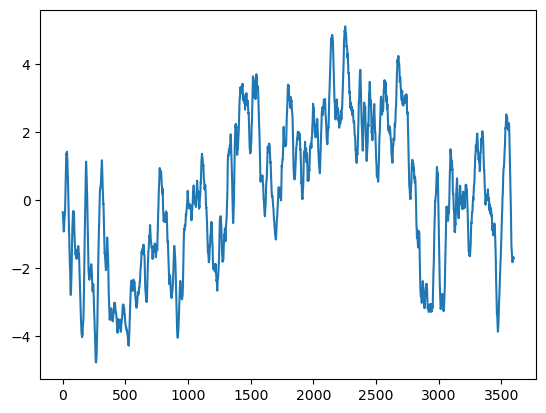

In [125]:
mean_across_sess_trial=avg_trial_wise_speed(1200,0)
mean_across_sess=np.nanmean(mean_across_sess_trial,axis=0)
print(mean_across_sess.shape)
plt.plot(mean_across_sess-np.mean(mean_across_sess[0:win_size]))

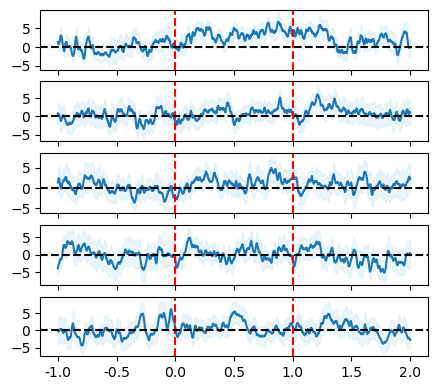

In [165]:
win_size=1200
fig, ax = plt.subplots(5, 1,figsize=(5,4.5),sharex=True)  
for i in np.arange(0,5,1):
    mean_across_sess_trial=avg_trial_wise_speed(1200,i)
    mean_across_sess=np.nanmean(mean_across_sess_trial,axis=0)
    ax[i].plot(mean_across_sess-np.mean(mean_across_sess[0:win_size]))
    ax[i].axvline(x=win_size,color='r',linestyle='--')
    ax[i].axvline(x=2*win_size,color='r',linestyle='--')
    ax[i].axhline(y=0,color='k',linestyle='--')
    #ax[i].set_ylim([0,20])
    mean=mean_across_sess-np.mean(mean_across_sess[0:win_size])
    std=np.nanstd(mean_across_sess_trial,axis=0)/np.sqrt(mean_across_sess_trial.shape[0])
    ax[i].fill_between(np.arange(0,3600), mean-std, mean+std,color='#BEE1F0',alpha=0.3)
ax[0].set_xticks(np.arange(0,3700, 600))
ax[0].set_xticklabels(np.arange(-1,2.5,0.5))
plt.savefig('sustained_stim_movement_pre_post_10Hz_trial_wise.svg',dpi=1200,bbox_inches='tight')

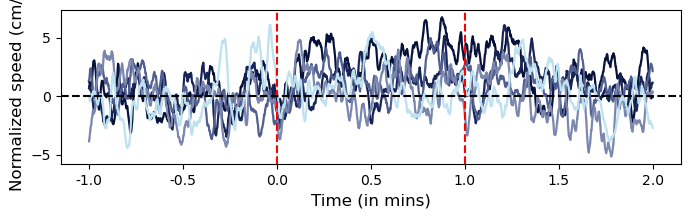

In [79]:
win_size=1200
fig, ax = plt.subplots(1, 1,figsize=(8,2),sharex=True)
color_arr=['#07123A', '#172556', '#505F90', '#7A86AD','#BEE1F0']
for i in np.arange(0,5,1):
    mean_across_sess_trial=avg_trial_wise_speed(1200,i)
    mean_across_sess=np.nanmean(mean_across_sess_trial,axis=0)
    ax.plot(mean_across_sess-np.mean(mean_across_sess[0:win_size]),color=color_arr[i])
    mean=mean_across_sess-np.mean(mean_across_sess[0:win_size])
    std=np.nanstd(mean_across_sess,axis=0)/np.sqrt(mean_across_sess.shape[0])
    ax.fill_between(np.arange(0,3600), mean-std, mean+std,color=color_arr[i],alpha=0.3)

ax.axvline(x=win_size,color='r',linestyle='--')
ax.axvline(x=2*win_size,color='r',linestyle='--')
ax.axhline(y=0,color='k',linestyle='--')
#ax.set_ylim([0,20])
ax.set_xticks(np.arange(0,3700, 600))
ax.set_xticklabels(np.arange(-1,2.5,0.5))
ax.set_ylabel('Normalized speed (cm/s)',fontsize=12)
ax.set_xlabel('Time (in mins)',fontsize=12)
plt.savefig('sustained_stim_movement_pre_post_10Hz_5trialS_1PLOT.svg',dpi=12)

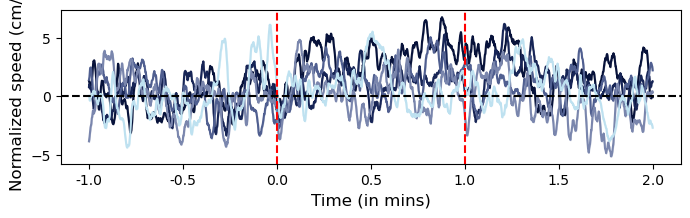

In [85]:
win_size=1200
fig, ax = plt.subplots(1, 1,figsize=(8,2),sharex=True)
color_arr=['#07123A', '#172556', '#505F90', '#7A86AD','#BEE1F0']
for i in np.arange(0,5,1):
    mean_across_sess_trial=avg_trial_wise_speed_norm(1200,i)
    mean_across_sess=np.nanmean(mean_across_sess_trial,axis=0)
    ax.plot(mean_across_sess,color=color_arr[i])
    std=np.nanstd(mean_across_sess,axis=0)/np.sqrt(mean_across_sess.shape[0])
    ax.fill_between(np.arange(0,3600), mean_across_sess-std, mean_across_sess+std,color=color_arr[i],alpha=0.3)

ax.axvline(x=win_size,color='r',linestyle='--')
ax.axvline(x=2*win_size,color='r',linestyle='--')
ax.axhline(y=0,color='k',linestyle='--')
#ax.set_ylim([0,20])
ax.set_xticks(np.arange(0,3700, 600))
ax.set_xticklabels(np.arange(-1,2.5,0.5))
ax.set_ylabel('Normalized speed (cm/s)',fontsize=12)
ax.set_xlabel('Time (in mins)',fontsize=12)
plt.savefig('sustained_stim_movement_pre_post_10Hz_5trialS_1PLOT2.svg',dpi=12)

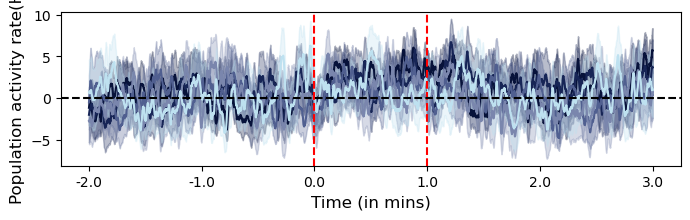

In [80]:
win_size=2400
fig, ax = plt.subplots(1, 1,figsize=(8,2),sharex=True)
color_arr=['#07123A', '#172556', '#505F90', '#7A86AD','#BEE1F0']
for i in np.arange(0,5,1):
    mean_across_sess_trial=avg_trial_wise_speed(2400,i)
    mean_across_sess=np.nanmean(mean_across_sess_trial,axis=0)
    ax.plot(mean_across_sess[0:6000]-np.mean(mean_across_sess[0:win_size]),color=color_arr[i])
    mean=mean_across_sess-np.mean(mean_across_sess[0:win_size])
    std=np.nanstd(mean_across_sess_trial,axis=0)/np.sqrt(mean_across_sess_trial.shape[0])
    ax.fill_between(np.arange(0,6000), mean[0:6000]-std[0:6000], mean[0:6000]+std[0:6000],color=color_arr[i],alpha=0.3)


ax.axvline(x=win_size,color='r',linestyle='--')
ax.axvline(x=win_size+1200,color='r',linestyle='--')
ax.axhline(y=0,color='k',linestyle='--')
ax.set_xticks(np.arange(0,6200, 1200))
ax.set_xticklabels(np.arange(-2,3.5,1))
ax.set_ylabel('Population activity rate(Hz)',fontsize=12)
ax.set_xlabel('Time (in mins)',fontsize=12)
plt.savefig('sustained_stim_Ca_pre_post_10Hz_5trialS_1PLOT_2mins.svg',dpi=12)

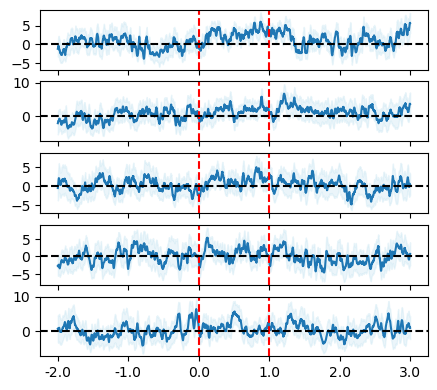

In [161]:
win_size=2400
fig, ax = plt.subplots(5, 1,figsize=(5,4.5),sharex=True)  
for i in np.arange(0,5,1):
    mean_across_sess_trial=avg_trial_wise_speed(2400,i)
    mean_across_sess=np.nanmean(mean_across_sess_trial,axis=0)
    ax[i].plot(mean_across_sess[0:6000]-np.mean(mean_across_sess[0:win_size]))
    ax[i].axvline(x=win_size,color='r',linestyle='--')
    ax[i].axvline(x=win_size+1200,color='r',linestyle='--')
    ax[i].axhline(y=0,color='k',linestyle='--')
    #ax[i].set_ylim([0,20])
    mean=mean_across_sess-np.mean(mean_across_sess[0:win_size])
    std=np.nanstd(mean_across_sess_trial,axis=0)/np.sqrt(mean_across_sess_trial.shape[0])
    ax[i].fill_between(np.arange(0,6000), mean[0:6000]-std[0:6000], mean[0:6000]+std[0:6000],color='#BEE1F0',alpha=0.3)
ax[4].set_xticks(np.arange(0,6200, 1200))
ax[4].set_xticklabels(np.arange(-2,3.5,1))
plt.savefig('sustained_stim_movement_pre_post_10Hz_trial_wise_2mins.svg',dpi=1200,bbox_inches='tight')

In [66]:
os.chdir( "C:/Users/sudiksha/Documents/Codes")

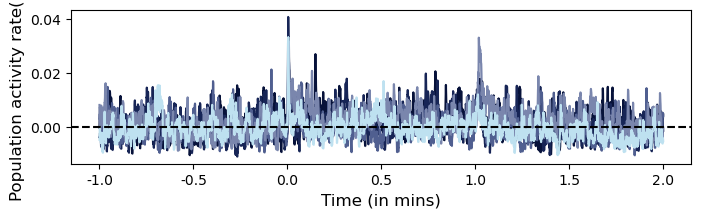

In [81]:
win_size=1200
fig, ax = plt.subplots(1, 1,figsize=(8,2),sharex=True)
color_arr=['#07123A', '#172556', '#505F90', '#7A86AD','#BEE1F0']
for i in np.arange(0,5,1):
    mean_across_sess_trial=avg_trial_wise_Ca(1200,i)
    mean_across_sess=np.nanmean(mean_across_sess_trial,axis=0)
    
    ax.plot(mean_across_sess-np.mean(mean_across_sess[0:win_size]),color=color_arr[i])
    mean=mean_across_sess-np.mean(mean_across_sess[0:win_size])
    std=np.nanstd(mean_across_sess,axis=0)/np.sqrt(mean_across_sess.shape[0])
    ax.fill_between(np.arange(0,3600), mean-std, mean+std,color=color_arr[i],alpha=0.3)


ax.axhline(y=0,color='k',linestyle='--')
#ax.set_ylim([0,20])
ax.set_xticks(np.arange(0,3700, 600))
ax.set_xticklabels(np.arange(-1,2.5,0.5))
ax.set_ylabel('Population activity rate(Hz)',fontsize=12)
ax.set_xlabel('Time (in mins)',fontsize=12)
plt.savefig('sustained_stim_Ca_pre_post_10Hz_5trialS_1PLOT.svg',dpi=12)

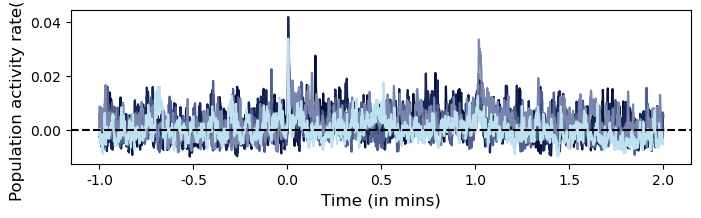

In [86]:
win_size=1200
fig, ax = plt.subplots(1, 1,figsize=(8,2),sharex=True)
color_arr=['#07123A', '#172556', '#505F90', '#7A86AD','#BEE1F0']
for i in np.arange(0,5,1):
    mean_across_sess_trial=avg_trial_wise_Ca_norm(1200,i)
    mean_across_sess=np.nanmean(mean_across_sess_trial,axis=0)
    
    ax.plot(mean_across_sess,color=color_arr[i])
    std=np.nanstd(mean_across_sess,axis=0)/np.sqrt(mean_across_sess.shape[0])
    ax.fill_between(np.arange(0,3600), mean_across_sess-std, mean_across_sess+std,color=color_arr[i],alpha=0.3)


ax.axhline(y=0,color='k',linestyle='--')
#ax.set_ylim([0,20])
ax.set_xticks(np.arange(0,3700, 600))
ax.set_xticklabels(np.arange(-1,2.5,0.5))
ax.set_ylabel('Population activity rate(Hz)',fontsize=12)
ax.set_xlabel('Time (in mins)',fontsize=12)
plt.savefig('sustained_stim_Ca_pre_post_10Hz_5trialS_1PLOT2.svg',dpi=12)

### Stat test for testing desensitization 

In [93]:
stim_value=np.zeros((14,5))
for i in np.arange(0,5,1):
    mean_across_sess_trial=avg_trial_wise_Ca_norm(1200,i)
    stim_value[:,i]=np.mean(mean_across_sess_trial[:,1200:2400],axis=1)

In [99]:
pip install joypy

  Obtaining dependency information for joypy from https://files.pythonhosted.org/packages/e9/8c/4d32c8935431eb10fd140faa4b13b6b8de222223a88fa9ad2a7711b7f1a9/joypy-0.2.6-py2.py3-none-any.whl.metadata
Note: you may need to restart the kernel to use updated packages.


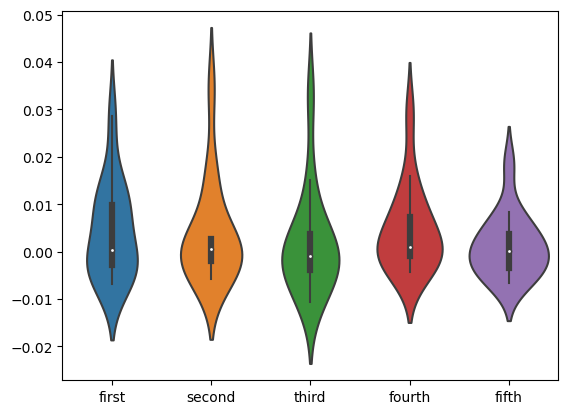

In [117]:

sns.violinplot(event_rate_df)
plt.savefig('10Hz_violin_trial_wise_Ca.svg',dpi=600,bbox_inches='tight')

In [94]:
ss.wilcoxon(stim_value[:,0],stim_value[:,4])

WilcoxonResult(statistic=39.0, pvalue=0.42626953125)

In [110]:
# Stat test

# Kruskal Wallis test
print(ss.kruskal(stim_value[:,0],stim_value[:,1],stim_value[:,2],stim_value[:,3],stim_value[:,4]))
print(ss.kruskal(stim_value[:,0],stim_value[:,4]))
data=[stim_value[:,0],stim_value[:,1],stim_value[:,2],stim_value[:,3],stim_value[:,4]]
import scikit_posthocs as sp
p_values = sp.posthoc_dunn(data, p_adjust='holm')
print(p_values)

KruskalResult(statistic=2.1219890773210466, pvalue=0.7133337420943537)
KruskalResult(statistic=0.41379310344827047, pvalue=0.5200505273047975)
     1    2    3    4    5
1  1.0  1.0  1.0  1.0  1.0
2  1.0  1.0  1.0  1.0  1.0
3  1.0  1.0  1.0  1.0  1.0
4  1.0  1.0  1.0  1.0  1.0
5  1.0  1.0  1.0  1.0  1.0


In [111]:
print(p_values <0.05)



       1      2      3      4      5
1  False  False  False  False  False
2  False  False  False  False  False
3  False  False  False  False  False
4  False  False  False  False  False
5  False  False  False  False  False


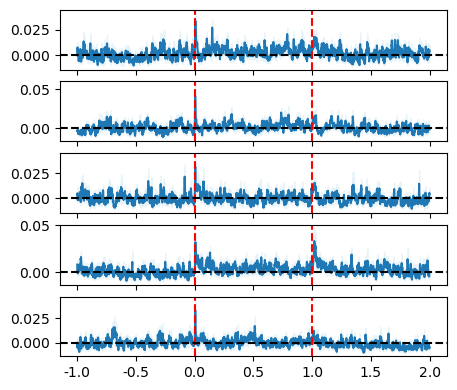

In [166]:
win_size=1200
fig, ax = plt.subplots(5, 1,figsize=(5,4.5),sharex=True)  
for i in np.arange(0,5,1):
    mean_across_sess_trial=avg_trial_wise_Ca(1200,i)
    mean_across_sess=np.nanmean(mean_across_sess_trial,axis=0)
    ax[i].plot(mean_across_sess-np.mean(mean_across_sess[0:win_size]))
    ax[i].axvline(x=win_size,color='r',linestyle='--')
    ax[i].axvline(x=2*win_size,color='r',linestyle='--')
    ax[i].axhline(y=0,color='k',linestyle='--')
    #ax[i].set_ylim([0,20])
    mean=mean_across_sess-np.mean(mean_across_sess[0:win_size])
    std=np.nanstd(mean_across_sess_trial,axis=0)/np.sqrt(mean_across_sess_trial.shape[0])
    ax[i].fill_between(np.arange(0,3600), mean-std, mean+std,color='#BEE1F0',alpha=0.3)
    ax[i].set_xticks(np.arange(0,3700, 600))
    ax[i].set_xticklabels(np.arange(-1,2.5,0.5))
plt.savefig('sustained_stim_Ca_pre_post_10Hz_trial_wise.svg',dpi=1200,bbox_inches='tight')

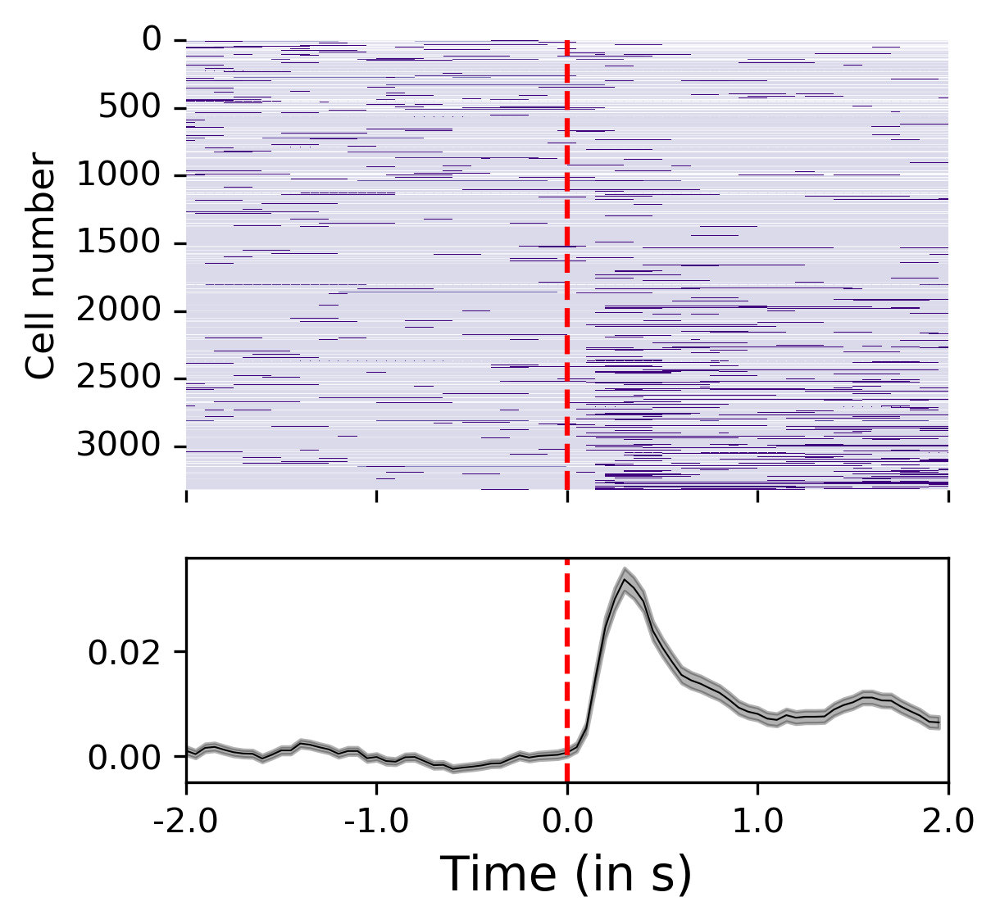

In [340]:
## Z score to the period before..
win_size=40
sess_name=sess_list[0]
stim_blocks=population_transient_stim(sess_name,win_size,binary_traces_df)
mean_across_sess=stim_blocks
for i in np.arange(1,len(sess_list),1):
    sess_name=sess_list[i]
    stim_blocks=population_transient_stim(sess_name,win_size,binary_traces_df)
    mean_across_sess=np.concatenate((mean_across_sess,stim_blocks),axis=0)
    
#sort_inds1=np.argsort(np.mean(mean_across_sess[:,win_size:2*win_size],axis=1))
coeff_matrix=mean_across_sess
post_onset=coeff_matrix[:,:]
pre_onset=coeff_matrix[:,0:win_size]
pre_value=np.nanmean(pre_onset,axis=1)
pre_value.shape
pre_value=np.reshape(pre_value,(coeff_matrix.shape[0],1))
    
normalized_stim_value=(post_onset-pre_value)
fig, ax = plt.subplots(2, 1,figsize=(4,4),sharex=True,gridspec_kw={'height_ratios':[2,1]},dpi=300)
sns.heatmap(normalized_stim_value[sort_inds,:],cmap='Purples',vmin=-0.05,vmax=0.15,ax=ax[0],cbar=False)
#sorting
ax[0].axvline(x=win_size,color='r',linestyle='--')
ax[0].set_xticks(range(0, 81, 20))
ax[0].set_xticklabels(np.arange(-2,2.5,1), fontsize=10)
#ax[0].set_xlabel('Time (in s)',fontsize=11)
ax[0].set_ylabel('Cell number',fontsize=11)
Ncells=coeff_matrix.shape[0]
ax[0].set_yticks(np.arange(0,Ncells,500))
ax[0].set_yticklabels(np.arange(0,Ncells,500))

mean=np.nanmean(normalized_stim_value,axis=0)
std=np.nanstd(normalized_stim_value,axis=0)/np.sqrt(normalized_stim_value.shape[0])

ax[1].plot(np.nanmean(normalized_stim_value,axis=0),color='k',linewidth=0.5)

ax[1].axvline(x=win_size,color='r',linestyle='--')
ax[1].fill_between(np.arange(0,80,1), mean-std, mean+std,color='k',alpha=0.3)

ax[1].set_xticks(range(0, 81, 20))
ax[1].set_xticklabels(np.arange(-2,2.5,1))
ax[1].set_xlabel('Time (in s)',fontsize=14)
#plt.savefig('sustained_stim_trace_2s_10Hz.svg',dpi=1200,bbox_inches='tight')

plt.savefig('Sustained_resp_10Hz_heatmap_zcore_2s.png',rasterize=True,bbox_inches='tight')

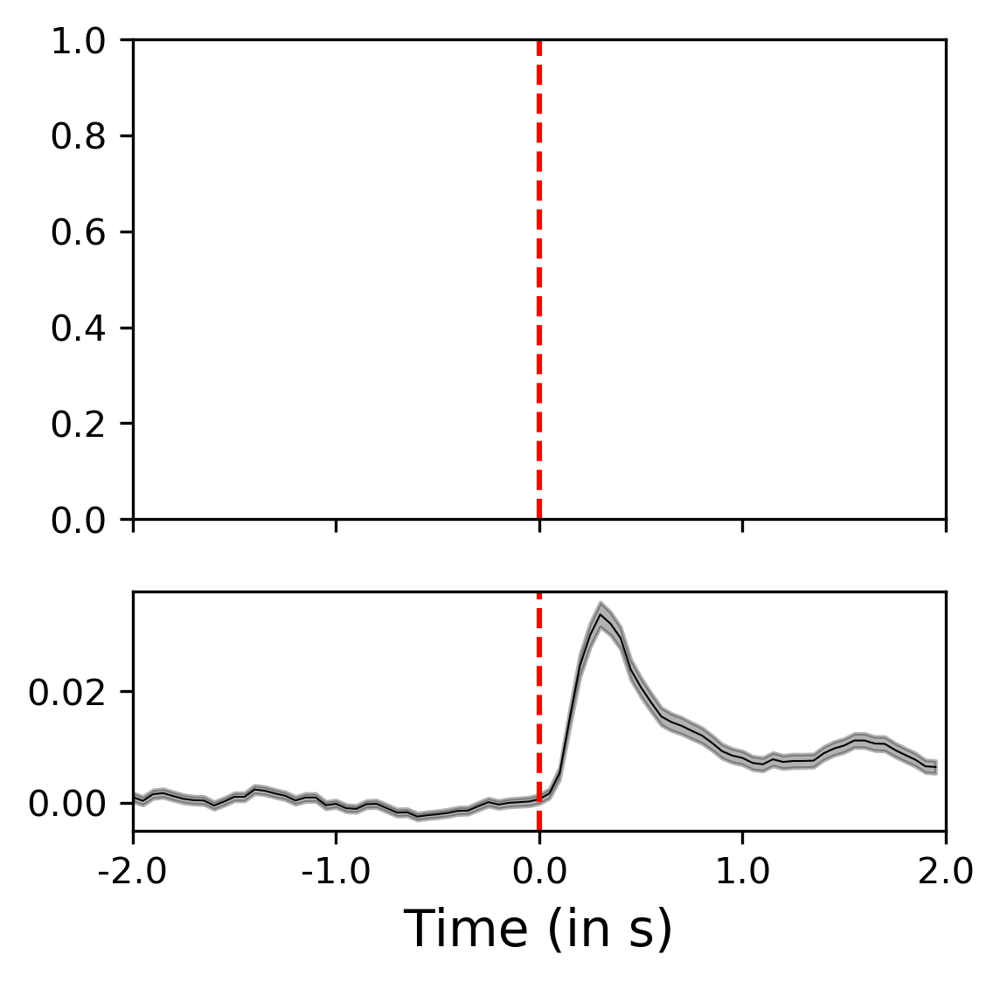

In [341]:
## Z score to the period before..
win_size=40
sess_name=sess_list[0]
stim_blocks=population_transient_stim(sess_name,win_size,binary_traces_df)
mean_across_sess=stim_blocks
for i in np.arange(1,len(sess_list),1):
    sess_name=sess_list[i]
    stim_blocks=population_transient_stim(sess_name,win_size,binary_traces_df)
    mean_across_sess=np.concatenate((mean_across_sess,stim_blocks),axis=0)
    
#sort_inds1=np.argsort(np.mean(mean_across_sess[:,win_size:2*win_size],axis=1))
coeff_matrix=mean_across_sess
post_onset=coeff_matrix[:,:]
pre_onset=coeff_matrix[:,0:win_size]
pre_value=np.nanmean(pre_onset,axis=1)
pre_value.shape
pre_value=np.reshape(pre_value,(coeff_matrix.shape[0],1))
    
normalized_stim_value=(post_onset-pre_value)
fig, ax = plt.subplots(2, 1,figsize=(4,4),sharex=True,gridspec_kw={'height_ratios':[2,1]},dpi=300)
#sns.heatmap(normalized_stim_value[sort_inds,:],cmap='Purples',vmin=-0.05,vmax=0.15,ax=ax[0],cbar=False)
#sorting
ax[0].axvline(x=win_size,color='r',linestyle='--')
ax[0].set_xticks(range(0, 81, 20))
ax[0].set_xticklabels(np.arange(-2,2.5,1), fontsize=10)
#ax[0].set_xlabel('Time (in s)',fontsize=11)
#ax[0].set_ylabel('Cell number',fontsize=11)

mean=np.nanmean(normalized_stim_value,axis=0)
std=np.nanstd(normalized_stim_value,axis=0)/np.sqrt(normalized_stim_value.shape[0])

ax[1].plot(np.nanmean(normalized_stim_value,axis=0),color='k',linewidth=0.5)

ax[1].axvline(x=win_size,color='r',linestyle='--')
ax[1].fill_between(np.arange(0,80,1), mean-std, mean+std,color='k',alpha=0.3)

ax[1].set_xticks(range(0, 81, 20))
ax[1].set_xticklabels(np.arange(-2,2.5,1))
ax[1].set_xlabel('Time (in s)',fontsize=14)
ax[1].set_xlim([0,80])
plt.savefig('sustained_stim_onset_2s_10Hz.svg',dpi=1200,rasterize=True,bbox_inches='tight')

#plt.savefig('Sustained_resp_10Hz_heatmap_zcore_2s.png',rasterize=True,bbox_inches='tight')

In [443]:
# Try in matlab 
f=h5py.File('Stim_1s_10Hz_heatmap.h5',"w")
dset1 = f.create_dataset('matrix', data=mean_across_sess)
dset1 = f.create_dataset('z_mean_matrix', data=normalized_stim_value)
dset1 = f.create_dataset('inds', data=sort_inds1)
f.close()

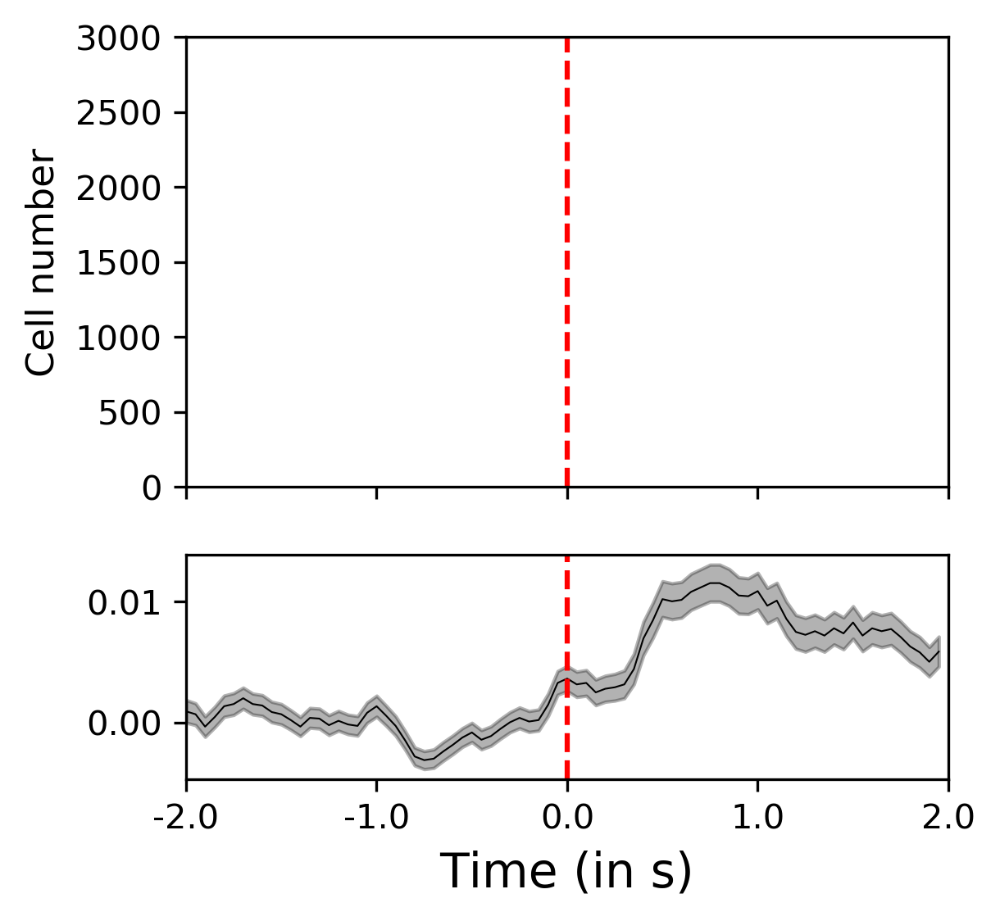

In [343]:
## Z score to the period before..
win_size=40
sess_name=sess_list[0]
stim_blocks=population_transient_stim_offset(sess_name,win_size,binary_traces_df)
mean_across_sess=stim_blocks
for i in np.arange(1,len(sess_list),1):
    sess_name=sess_list[i]
    stim_blocks=population_transient_stim_offset(sess_name,win_size,binary_traces_df)
    mean_across_sess=np.concatenate((mean_across_sess,stim_blocks),axis=0)
    
#sort_inds1=np.argsort(np.mean(mean_across_sess[:,win_size:2*win_size],axis=1))
coeff_matrix=mean_across_sess
post_onset=coeff_matrix[:,:]
pre_onset=coeff_matrix[:,0:win_size]
pre_value=np.nanmean(pre_onset,axis=1)
pre_value.shape
pre_value=np.reshape(pre_value,(coeff_matrix.shape[0],1))
    
normalized_stim_value=(post_onset-pre_value)
fig, ax = plt.subplots(2, 1,figsize=(4,4),sharex=True,gridspec_kw={'height_ratios':[2,1]},dpi=300)
#sns.heatmap(normalized_stim_value[sort_inds,:],cmap='Purples',vmin=-0.05,vmax=0.15,ax=ax[0],cbar=False)
#sorting
ax[0].axvline(x=win_size,color='r',linestyle='--')
ax[0].set_xticks(range(0, 81, 20))
ax[0].set_xticklabels(np.arange(-2,2.5,1), fontsize=10)
#ax[0].set_xlabel('Time (in s)',fontsize=11)
ax[0].set_ylabel('Cell number',fontsize=11)
Ncells=coeff_matrix.shape[0]
ax[0].set_yticks(np.arange(0,Ncells,500))
ax[0].set_yticklabels(np.arange(0,Ncells,500))

mean=np.nanmean(normalized_stim_value,axis=0)
std=np.nanstd(normalized_stim_value,axis=0)/np.sqrt(normalized_stim_value.shape[0])

ax[1].plot(np.nanmean(normalized_stim_value,axis=0),color='k',linewidth=0.5)

ax[1].axvline(x=win_size,color='r',linestyle='--')
ax[1].fill_between(np.arange(0,80,1), mean-std, mean+std,color='k',alpha=0.3)

ax[1].set_xticks(range(0, 81, 20))
ax[1].set_xticklabels(np.arange(-2,2.5,1))
ax[1].set_xlabel('Time (in s)',fontsize=14)
ax[1].set_xlim([0,80])
plt.savefig('sustained_stim_offset_2s_10Hz.svg',dpi=1200,bbox_inches='tight')

#plt.savefig('Sustained_resp_10Hz_heatmap_2s_offset.png',rasterize=True,bbox_inches='tight')

In [452]:
def add_colorbar_outside(im,ax):
    fig = ax.get_figure()
    bbox = ax.get_position() #bbox contains the [x0 (left), y0 (bottom), x1 (right), y1 (top)] of the axis.
    width = 0.01
    eps = 0.01 #margin between plot and colorbar
    # [left most position, bottom position, width, height] of color bar.
    cax = fig.add_axes([bbox.x1 + eps, bbox.y0, width, bbox.height])
    cbar = fig.colorbar(im, cax=cax)

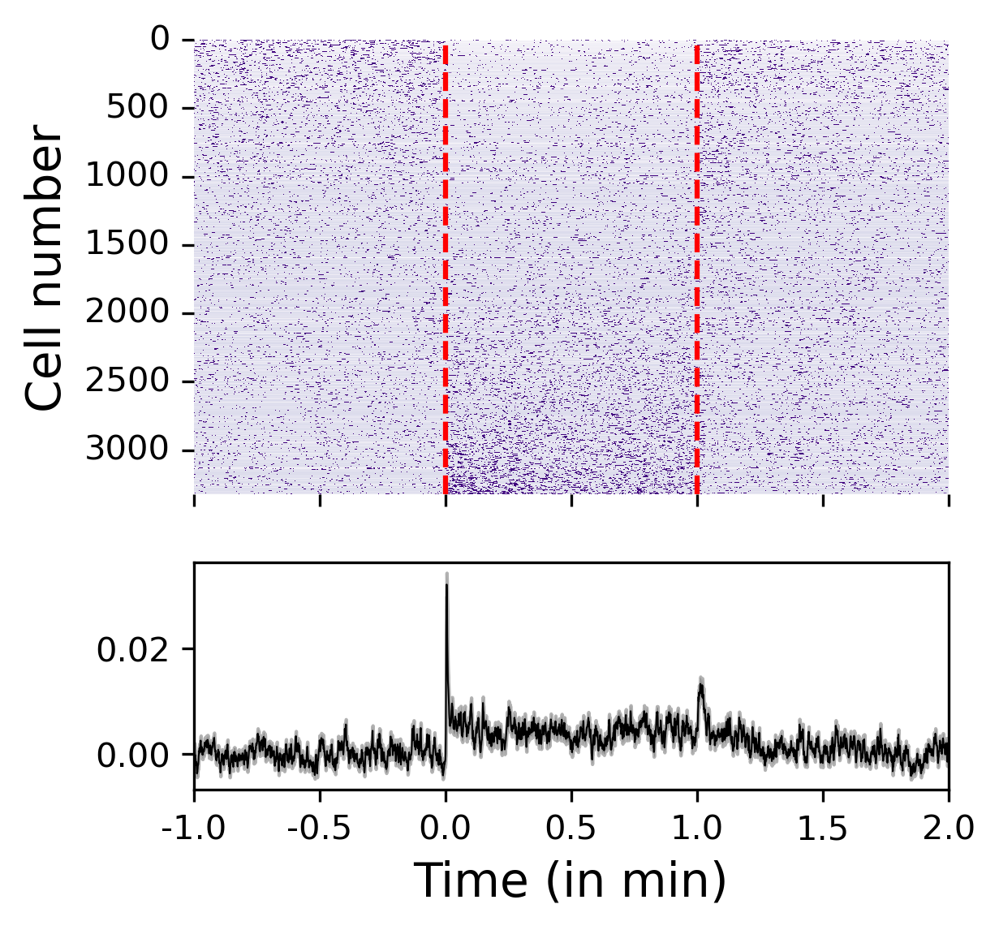

In [41]:
win_size=1200
sess_name=sess_list[0]
stim_blocks=population_transient_stim_pre_post(sess_name,win_size,binary_traces_df)
mean_across_sess=stim_blocks
for i in np.arange(1,len(sess_list),1):
    sess_name=sess_list[i]
    stim_blocks=population_transient_stim_pre_post(sess_name,win_size,binary_traces_df)
    mean_across_sess=np.concatenate((mean_across_sess,stim_blocks),axis=0)

coeff_matrix=mean_across_sess
post_onset=coeff_matrix[:,:]
pre_onset=coeff_matrix[:,0:win_size]
pre_value=np.nanmean(pre_onset,axis=1)
pre_value.shape
pre_value=np.reshape(pre_value,(coeff_matrix.shape[0],1))
    
normalized_stim_value=(post_onset-pre_value)

sort_inds1=np.argsort(np.mean(mean_across_sess[:,win_size:2*win_size],axis=1))
fig, ax = plt.subplots(2, 1,figsize=(4,4),sharex=True,gridspec_kw={'height_ratios':[2,1]},dpi=300)
im=sns.heatmap(mean_across_sess[sort_inds1,:],cmap='Purples',vmin=-0.05,vmax=0.15,ax=ax[0],cbar=False)
#sorting
ax[0].axvline(x=win_size,color='r',linestyle='--')
ax[0].axvline(x=2*win_size,color='r',linestyle='--')
ax[0].set_xticks(range(0, 3601, 600))
ax[0].set_xticklabels(np.arange(-1,2.5,0.5), fontsize=10)
#ax[0].set_xlabel('Time (in min)',fontsize=14)
ax[0].set_ylabel('Cell number',fontsize=14)
Ncells=coeff_matrix.shape[0]
ax[0].set_yticks(np.arange(0,Ncells,500))
ax[0].set_yticklabels(np.arange(0,Ncells,500))
# Add the colorbar outside...
mean=np.nanmean(mean_across_sess,axis=0)
std=np.nanstd(mean_across_sess,axis=0)/np.sqrt(mean_across_sess.shape[0])
ax[1].plot(np.nanmean(mean_across_sess,axis=0),color='k',linewidth=0.5)
#ax.axvline(x=win_size,color='k',linestyle='--')
ax[1].fill_between(np.arange(0,3600,1), mean-std, mean+std,color='k',alpha=0.3)
#ax[1].axvline(x=win_size,color='r',linestyle='--')
#ax[1].axvline(x=2*win_size,color='r',linestyle='--')
ax[1].set_xticks(range(0, 3601, 600))
ax[1].set_xticklabels(np.arange(-1,2.5,0.5))
ax[1].set_xlabel('Time (in min)',fontsize=14)
plt.savefig('Sustained_resp_10Hz_heatmap_post.png',bbox_inches='tight')

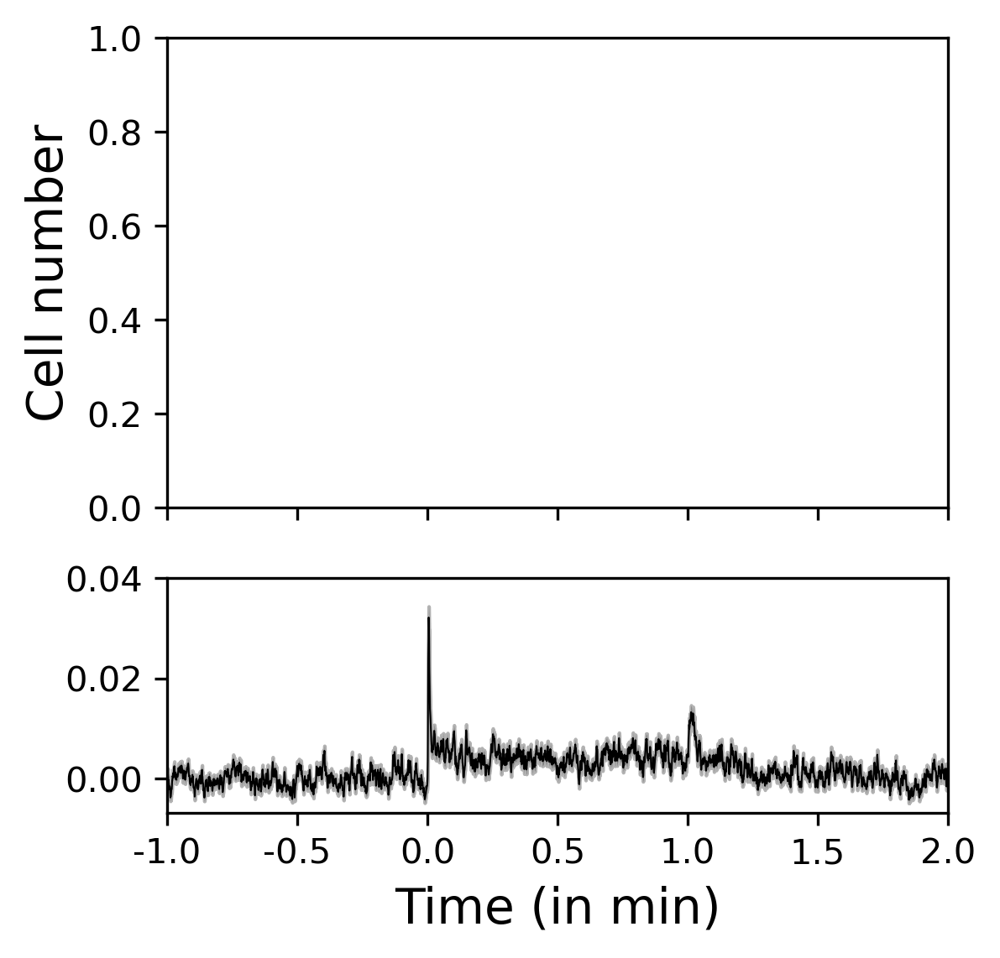

In [39]:
win_size=1200
sess_name=sess_list[0]
stim_blocks=population_transient_stim_pre_post(sess_name,win_size,binary_traces_df)
mean_across_sess=stim_blocks
for i in np.arange(1,len(sess_list),1):
    sess_name=sess_list[i]
    stim_blocks=population_transient_stim_pre_post(sess_name,win_size,binary_traces_df)
    mean_across_sess=np.concatenate((mean_across_sess,stim_blocks),axis=0)

coeff_matrix=mean_across_sess
post_onset=coeff_matrix[:,:]
pre_onset=coeff_matrix[:,0:win_size]
pre_value=np.nanmean(pre_onset,axis=1)
pre_value.shape
pre_value=np.reshape(pre_value,(coeff_matrix.shape[0],1))
    
normalized_stim_value=(post_onset-pre_value)

sort_inds1=np.argsort(np.mean(mean_across_sess[:,win_size:2*win_size],axis=1))
fig, ax = plt.subplots(2, 1,figsize=(4,4),sharex=True,gridspec_kw={'height_ratios':[2,1]},dpi=300)
#im=sns.heatmap(normalized_stim_value[sort_inds1,:],cmap='Purples',vmin=-0.05,vmax=0.15,ax=ax[0],cbar=False)
#ax[0].axvline(x=win_size,color='r',linestyle='--')
#ax[0].axvline(x=2*win_size,color='r',linestyle='--')
ax[0].set_xticks(range(0, 3601, 600))
ax[0].set_xticklabels(np.arange(-1,2.5,0.5), fontsize=10)
#ax[0].set_xlabel('Time (in min)',fontsize=14)
ax[0].set_ylabel('Cell number',fontsize=14)
# Add the colorbar outside...
mean=np.nanmean(normalized_stim_value,axis=0)
std=np.nanstd(normalized_stim_value,axis=0)/np.sqrt(normalized_stim_value.shape[0])
ax[1].plot(np.nanmean(normalized_stim_value,axis=0),color='k',linewidth=0.5)
#ax.axvline(x=win_size,color='k',linestyle='--')
ax[1].fill_between(np.arange(0,3600,1), mean-std, mean+std,color='k',alpha=0.3)
#ax[1].axvline(x=win_size,color='r',linestyle='--')
#ax[1].axvline(x=2*win_size,color='r',linestyle='--')
ax[1].set_xticks(range(0, 3601, 600))
ax[1].set_xticklabels(np.arange(-1,2.5,0.5))
ax[1].set_yticks(np.arange(0,0.06,0.02))
ax[1].set_xlabel('Time (in min)',fontsize=14)
ax[1].set_xlim([0,3601])
plt.savefig('Sustained_resp_10Hz_heatmap_post_zscore.svg',bbox_inches='tight')

## Fig 6- Identifying stimulation responsive neurons 

In [207]:
def resp_neurons_sustained_periods_stim_low_sp(sess_name):
    baseline_indices=remove_nan_motion_frames(sess_name)
    stim_indices=get_stim_frames_index(sess_name)
    a=stationary_period_df.loc[sess_name]
    low_sp_frames= np.where(a==1)[0]
    low_speed_index_stim = np.intersect1d(stim_indices,low_sp_frames)
    low_speed_index_bs = np.intersect1d(baseline_indices,low_sp_frames)
    n_frames_stim= len(low_speed_index_stim)
    n_frames_bs= len(low_speed_index_bs)

    if n_frames_stim>1200 and n_frames_bs>2*n_frames_stim:
        
        traces= binary_traces_df[sess_name].T
        Ncells = traces.shape[0]
        stim_spike_rate=np.sum(traces.loc[:,low_speed_index_stim],axis=1)/n_frames_stim*1200
        shuffled_spike_rate=np.zeros((Ncells,1000))
        for n in np.arange(0,1000,1):
            random.seed(n)
            # Shuffle- randomly pick same number of low speed and high speed frames 
            shuffled_index=np.array(random.sample(list(low_speed_index_bs),n_frames_stim))
            shuffled_spike_rate[:,n]=np.sum(traces.loc[:,shuffled_index],axis=1)/n_frames_stim*1200
            
            
        inc_threshold=[]
        dec_threshold=[]
        for i in np.arange(0,Ncells,1):
            inc_threshold.append(np.percentile(shuffled_spike_rate[i,:],97.5))
            dec_threshold.append(np.percentile(shuffled_spike_rate[i,:],2.5))
        inc_responsive_cells = np.array(np.where(stim_spike_rate>inc_threshold))
        inc_percent_responsive_cells= inc_responsive_cells.shape[1]/Ncells*100
        dec_responsive_cells = np.array(np.where(stim_spike_rate<dec_threshold))
        dec_percent_responsive_cells= dec_responsive_cells.shape[1]/Ncells*100
        n_inc_resp_cells=inc_responsive_cells.shape[1]
        n_dec_resp_cells=dec_responsive_cells.shape[1]
    else:
        inc_responsive_cells=np.NaN
        inc_percent_responsive_cells=np.NaN
        dec_responsive_cells=np.NaN
        dec_percent_responsive_cells=np.NaN
        n_inc_resp_cells=np.NaN
        n_dec_resp_cells=np.NaN
        Ncells=np.NaN
    return inc_responsive_cells,inc_percent_responsive_cells,dec_responsive_cells,dec_percent_responsive_cells,n_inc_resp_cells,n_dec_resp_cells,Ncells

In [208]:
def resp_neurons_sustained_periods_stim(sess_name):
    baseline_indices=remove_nan_motion_frames(sess_name)
    stim_indices=get_stim_frames_index(sess_name)
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index_stim = np.intersect1d(stim_indices,moving_frames)
    high_speed_index_bs = np.intersect1d(baseline_indices,moving_frames)
    n_frames_stim= len(high_speed_index_stim)
    n_frames_bs= len(high_speed_index_bs)

    if n_frames_stim>1200 and n_frames_bs>2*n_frames_stim:
        
        traces= binary_traces_df[sess_name].T
        Ncells = traces.shape[0]
        stim_spike_rate=np.sum(traces.loc[:,high_speed_index_stim],axis=1)/n_frames_stim*1200
        shuffled_spike_rate=np.zeros((Ncells,1000))
        for n in np.arange(0,1000,1):
            # Shuffle- randomly pick same number of low speed and high speed frames 
            random.seed(n)
            shuffled_index=np.array(random.sample(list(high_speed_index_bs),n_frames_stim))
            shuffled_spike_rate[:,n]=np.sum(traces.loc[:,shuffled_index],axis=1)/n_frames_stim*1200
            
            
        inc_threshold=[]
        dec_threshold=[]
        for i in np.arange(0,Ncells,1):
            inc_threshold.append(np.percentile(shuffled_spike_rate[i,:],97.5))
            dec_threshold.append(np.percentile(shuffled_spike_rate[i,:],2.5))
        inc_responsive_cells = np.array(np.where(stim_spike_rate>inc_threshold))
        inc_percent_responsive_cells= inc_responsive_cells.shape[1]/Ncells*100
        dec_responsive_cells = np.array(np.where(stim_spike_rate<dec_threshold))
        dec_percent_responsive_cells= dec_responsive_cells.shape[1]/Ncells*100
        n_inc_resp_cells=inc_responsive_cells.shape[1]
        n_dec_resp_cells=dec_responsive_cells.shape[1]
    else:
        inc_responsive_cells=np.NaN
        inc_percent_responsive_cells=np.NaN
        dec_responsive_cells=np.NaN
        dec_percent_responsive_cells=np.NaN
        n_dec_resp_cells=np.NaN
        n_inc_resp_cells=np.NaN
        Ncells=np.NaN
    return inc_responsive_cells,inc_percent_responsive_cells,dec_responsive_cells,dec_percent_responsive_cells,n_inc_resp_cells,n_dec_resp_cells,Ncells

In [209]:
sess_list=[]
for mouse, cell_df in processed_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)

In [210]:
os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Trace_analysis/Final_codes/')

In [211]:
f=h5py.File('Stim_resp_cells_sustained_10Hz_final.h5',"w")
for i in np.arange(0,len(sess_list),1):
    sess_name=sess_list[i]
    inc_resp_cells,_,dec_resp_cells,_,_,_,_=resp_neurons_sustained_periods_stim(sess_name)
    dset1 = f.create_dataset(sess_list[i]+'_inc_mov', data=inc_resp_cells)
    dset1 = f.create_dataset(sess_list[i]+'_dec_mov', data=dec_resp_cells)
    inc_resp_cells_low,_,dec_resp_cells_low,_,_,_,_=resp_neurons_sustained_periods_stim_low_sp(sess_name)
    dset1 = f.create_dataset(sess_list[i]+'_inc_stn', data=inc_resp_cells_low)
    dset1 = f.create_dataset(sess_list[i]+'_dec_stn', data=dec_resp_cells_low)
f.close()


In [80]:
def n_stim_resp_cells(sess_name,motion_state):
    f=h5py.File('Stim_resp_cells_sustained_10Hz_final.h5',"r")
    if motion_state==1:
        stim_resp_cells_inc=np.array(f[sess_name+'_inc_stn'])
        stim_resp_cells_dec=np.array(f[sess_name+'_dec_stn'])
    else:
        stim_resp_cells_inc=np.array(f[sess_name+'_inc_mov'])
        stim_resp_cells_dec=np.array(f[sess_name+'_dec_mov'])
    processed_traces= binary_traces_df[sess_name]
    processed_traces =processed_traces.T
    Ncells= processed_traces.shape[0]
    return np.size(stim_resp_cells_inc),np.size(stim_resp_cells_dec),Ncells

In [82]:
stim_resp_cells_inc=np.zeros(len(sess_list))
stim_resp_cells_dec=np.zeros(len(sess_list))
Ncells=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    stim_resp_cells_inc[i],stim_resp_cells_dec[i],Ncells[i]=n_stim_resp_cells(sess_list[i],1)

In [88]:
rm_idx=np.squeeze(np.argwhere(stim_resp_cells_inc==1))
sess_list2=np.delete(sess_list,rm_idx)
sess_list2

array(['602101_03092020', '602101_07082020', '608448_01062020',
       '608448_01172020', '608450_03092020', '608451_07082020',
       '611111_07082020'], dtype='<U15')

In [89]:
stim_resp_cells_inc=np.delete(stim_resp_cells_inc,rm_idx)
stim_resp_cells_dec=np.delete(stim_resp_cells_dec,rm_idx)
Ncells=np.delete(Ncells,rm_idx)

In [90]:
np.sum(stim_resp_cells_inc),np.sum(stim_resp_cells_dec),np.sum(Ncells)

(412.0, 360.0, 1813.0)

In [91]:
np.sum(stim_resp_cells_inc)/np.sum(Ncells)*100,np.sum(stim_resp_cells_dec)/np.sum(Ncells)*100,(np.sum(stim_resp_cells_inc)+np.sum(stim_resp_cells_dec))/np.sum(Ncells)*100

(22.72476558190844, 19.856591285162715, 42.58135686707115)

In [103]:
stim_resp_cells_inc=np.zeros(len(sess_list))
stim_resp_cells_dec=np.zeros(len(sess_list))
Ncells=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    stim_resp_cells_inc[i],stim_resp_cells_dec[i],Ncells[i]=n_stim_resp_cells(sess_list[i],2)

In [104]:
rm_idx2=np.squeeze(np.argwhere(stim_resp_cells_inc==1))
stim_resp_cells_inc=np.delete(stim_resp_cells_inc,rm_idx2)
stim_resp_cells_dec=np.delete(stim_resp_cells_dec,rm_idx2)
Ncells=np.delete(Ncells,rm_idx2)

In [105]:
np.sum(stim_resp_cells_inc),np.sum(stim_resp_cells_dec),np.sum(Ncells)

(1260.0, 1214.0, 3155.0)

In [106]:
np.sum(stim_resp_cells_inc)/np.sum(Ncells)*100,np.sum(stim_resp_cells_dec)/np.sum(Ncells)*100,(np.sum(stim_resp_cells_inc)+np.sum(stim_resp_cells_dec))/np.sum(Ncells)*100

(39.936608557844686, 38.478605388272584, 78.41521394611728)

In [117]:
stim_resp_cells_inc=np.zeros(len(sess_list))
stim_resp_cells_dec=np.zeros(len(sess_list))
Ncells=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    stim_resp_cells_inc[i],stim_resp_cells_dec[i],Ncells[i]=n_stim_resp_cells(sess_list[i],2)

In [118]:
rm_idx3=np.union1d(rm_idx,rm_idx2)
rm_idx3

array([ 0,  5,  7,  8, 10, 11, 12, 13])

In [119]:
stim_resp_cells_inc=np.delete(stim_resp_cells_inc,rm_idx3)
stim_resp_cells_dec=np.delete(stim_resp_cells_dec,rm_idx3)
Ncells=np.delete(Ncells,rm_idx3)

In [123]:
np.sum(stim_resp_cells_inc),np.sum(stim_resp_cells_dec),np.sum(Ncells)

(626.0, 642.0, 1644.0)

In [124]:
np.sum(stim_resp_cells_inc)/np.sum(Ncells)*100,np.sum(stim_resp_cells_dec)/np.sum(Ncells)*100,(np.sum(stim_resp_cells_inc)+np.sum(stim_resp_cells_dec))/np.sum(Ncells)*100

(38.077858880778585, 39.05109489051095, 77.12895377128953)

In [125]:
stim_resp_cells_inc=np.zeros(len(sess_list))
stim_resp_cells_dec=np.zeros(len(sess_list))
Ncells=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    stim_resp_cells_inc[i],stim_resp_cells_dec[i],Ncells[i]=n_stim_resp_cells(sess_list[i],1)

In [126]:
stim_resp_cells_inc=np.delete(stim_resp_cells_inc,rm_idx3)
stim_resp_cells_dec=np.delete(stim_resp_cells_dec,rm_idx3)
Ncells=np.delete(Ncells,rm_idx3)

In [127]:
np.sum(stim_resp_cells_inc),np.sum(stim_resp_cells_dec),np.sum(Ncells)

(333.0, 330.0, 1644.0)

In [128]:
np.sum(stim_resp_cells_inc)/np.sum(Ncells)*100,np.sum(stim_resp_cells_dec)/np.sum(Ncells)*100,(np.sum(stim_resp_cells_inc)+np.sum(stim_resp_cells_dec))/np.sum(Ncells)*100

(20.255474452554743, 20.072992700729927, 40.32846715328467)

### Quantifying numbers

## During rest

In [38]:
def get_overlap_motion_resp_sensory_resp(sess_name):
    baseline_indices=remove_nan_motion_frames(sess_name)
    stim_indices=get_stim_frames_index(sess_name)
    a=stationary_period_df.loc[sess_name]
    low_sp_frames= np.where(a==1)[0]
    low_speed_index_stim = np.intersect1d(stim_indices,low_sp_frames)
    low_speed_index_bs = np.intersect1d(baseline_indices,low_sp_frames)
    n_frames_stim= len(low_speed_index_stim)
    n_frames_bs= len(low_speed_index_bs)
    
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index_stim = np.intersect1d(stim_indices,moving_frames)
    high_speed_index_bs = np.intersect1d(baseline_indices,moving_frames)
    n_frames_stim2= len(high_speed_index_stim)
    n_frames_bs2= len(high_speed_index_bs)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    if (n_frames_stim>1200 and n_frames_bs>2*n_frames_stim) and (n_frames_stim2>1200 and n_frames_bs2>2*n_frames_stim2):
        f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
        motion_resp_cells=np.squeeze(np.array(f[sess_name]))
        N_motion_resp_cells=motion_resp_cells.shape[0]
        f.close()
        f=h5py.File('Stim_resp_cells_sustained_10Hz_final.h5',"r")
        stim_resp_cells_inc=np.array(f[sess_name+'_inc_stn'])
        stim_resp_cells_dec=np.array(f[sess_name+'_dec_stn'])
        f.close()
        processed_traces= binary_traces_df[sess_name]
        processed_traces =processed_traces.T
        Ncells= processed_traces.shape[0]
        
        common_resp_cells=np.intersect1d(stim_resp_cells_inc,motion_resp_cells)
        common_resp_cells2=np.intersect1d(stim_resp_cells_dec,motion_resp_cells)
        #Might be good to make sure no overlap between increased and decreased cells
        N_common_cells=common_resp_cells.shape[0]+common_resp_cells2.shape[0]
        inc_common_cells= common_resp_cells.shape[0]
        dec_common_cells=common_resp_cells2.shape[0]
        N_stim_resp_inc_cells=stim_resp_cells_inc.shape[1]
        N_stim_resp_dec_cells=stim_resp_cells_dec.shape[1]
    else:
        Ncells=np.NaN
        motion_resp_cells=np.NaN
        N_motion_resp_cells=np.NaN
        N_common_cells=np.NaN
        inc_common_cells=np.NaN
        dec_common_cells=np.NaN
        N_stim_resp_inc_cells=np.NaN
        N_stim_resp_dec_cells=np.NaN
    return motion_resp_cells,N_motion_resp_cells,N_common_cells,inc_common_cells,dec_common_cells,Ncells,N_stim_resp_inc_cells,N_stim_resp_dec_cells

In [39]:
def get_overlap_non_motion_resp_sensory_resp(sess_name):
    baseline_indices=remove_nan_motion_frames(sess_name)
    stim_indices=get_stim_frames_index(sess_name)
    a=stationary_period_df.loc[sess_name]
    low_sp_frames= np.where(a==1)[0]
    low_speed_index_stim = np.intersect1d(stim_indices,low_sp_frames)
    low_speed_index_bs = np.intersect1d(baseline_indices,low_sp_frames)
    n_frames_stim= len(low_speed_index_stim)
    n_frames_bs= len(low_speed_index_bs)
    
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index_stim = np.intersect1d(stim_indices,moving_frames)
    high_speed_index_bs = np.intersect1d(baseline_indices,moving_frames)
    n_frames_stim2= len(high_speed_index_stim)
    n_frames_bs2= len(high_speed_index_bs)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    if n_frames_stim>1200 and n_frames_bs>2*n_frames_stim and n_frames_stim2>1200 and n_frames_bs2>2*n_frames_stim2: 
        f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
        resp_cells=np.squeeze(np.array(f[sess_name]))
        f.close()
        Ncells=binary_traces_df.loc[:,sess_name].shape[1]
        Ncell_arr=np.arange(0,Ncells,1)
        non_motion_resp=np.setdiff1d(Ncell_arr,resp_cells)
        N_non_motion_resp_cells=non_motion_resp.shape[0]

        processed_traces= binary_traces_df[sess_name]
        processed_traces =processed_traces.T
        Ncells= processed_traces.shape[0]
        f=h5py.File('Stim_resp_cells_sustained_10Hz_final.h5',"r")
        stim_resp_cells_inc=np.array(f[sess_name+'_inc_stn'])
        stim_resp_cells_dec=np.array(f[sess_name+'_dec_stn'])
        f.close()
        
        common_resp_cells=np.intersect1d(stim_resp_cells_inc,non_motion_resp)
        common_resp_cells2=np.intersect1d(stim_resp_cells_dec,non_motion_resp)
        #Might be good to make sure no overlap between increased and decreased cells
        N_common_cells=common_resp_cells.shape[0]+common_resp_cells2.shape[0]
        inc_common_cells= common_resp_cells.shape[0]
        dec_common_cells=common_resp_cells2.shape[0]
        N_stim_resp_inc_cells=stim_resp_cells_inc.shape[1]
        N_stim_resp_dec_cells=stim_resp_cells_dec.shape[1]
    else:
        Ncells=np.NaN
        non_motion_resp=np.NaN
        N_non_motion_resp_cells=np.NaN
        N_common_cells=np.NaN
        inc_common_cells=np.NaN
        dec_common_cells=np.NaN
        N_stim_resp_inc_cells=np.NaN
        N_stim_resp_dec_cells=np.NaN
    return non_motion_resp,N_non_motion_resp_cells,N_common_cells,inc_common_cells,dec_common_cells,Ncells,N_stim_resp_inc_cells,N_stim_resp_dec_cells

In [40]:
N_common_cells=np.zeros(len(sess_list))
N_motion_resp_cells=np.zeros(len(sess_list))
N_cells=np.zeros(len(sess_list))
inc_common_cells=np.zeros(len(sess_list))
dec_common_cells=np.zeros(len(sess_list))
N_stim_resp_inc_cells=np.zeros(len(sess_list))
N_stim_resp_dec_cells=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    #print(i)
    _,N_motion_resp_cells[i],N_common_cells[i],inc_common_cells[i],dec_common_cells[i],N_cells[i],N_stim_resp_inc_cells[i],N_stim_resp_dec_cells[i]= get_overlap_motion_resp_sensory_resp(sess_list[i])
    

In [41]:
len(sess_list)-np.argwhere(np.isnan(N_cells)).shape[0]

6

In [42]:
a=np.array([1,2,3,4,6,9])
np.array(sess_list)[a]

array(['602101_07082020', '608448_01062020', '608448_01172020',
       '608450_03092020', '608451_07082020', '611111_07082020'],
      dtype='<U15')

In [43]:
np.nansum(N_cells),np.nansum(N_motion_resp_cells),np.nansum(N_common_cells),np.nansum(inc_common_cells),np.nansum(dec_common_cells),np.nansum(N_stim_resp_inc_cells),np.nansum(N_stim_resp_dec_cells)    

(1644.0, 1107.0, 374.0, 215.0, 159.0, 333.0, 330.0)

In [44]:
# All neurons 
percent_act_all_rest=np.round(np.nansum(N_stim_resp_inc_cells)/np.nansum(N_cells)*100,1)
percent_inb_all_rest=np.round(np.nansum(N_stim_resp_dec_cells)/np.nansum(N_cells)*100,1)
percent_sensory_all_rest=np.round((np.nansum(N_stim_resp_inc_cells)+np.nansum(N_stim_resp_dec_cells))/np.nansum(N_cells)*100,1)
print(percent_act_all_rest,percent_inb_all_rest,percent_sensory_all_rest)

20.3 20.1 40.3


In [45]:
# Motion encoders neurons 
percent_act_mr_rest=np.round(np.nansum(inc_common_cells)/np.nansum(N_motion_resp_cells)*100,1)
percent_inb_mr_rest=np.round(np.nansum(dec_common_cells)/np.nansum(N_motion_resp_cells)*100,1)
percent_none_mr_rest=np.round(100-percent_act_mr_rest-percent_inb_mr_rest,1)
print(percent_act_mr_rest,percent_inb_mr_rest,percent_none_mr_rest)

19.4 14.4 66.2


In [46]:
# Motion encoders neurons as a fraction of all neurons
percent_act_mr_rest_all=np.round(np.nansum(inc_common_cells)/np.nansum(N_cells)*100,1)
percent_inb_mr_rest_all=np.round(np.nansum(dec_common_cells)/np.nansum(N_cells)*100,1)
percent_mr_none_all_rest=np.round((np.nansum(N_motion_resp_cells)-np.nansum(N_common_cells))/np.nansum(N_cells)*100,1)
print(percent_act_mr_rest_all,percent_inb_mr_rest_all,percent_mr_none_all_rest)

13.1 9.7 44.6


In [47]:
N_common_cells=np.zeros(len(sess_list))
N_non_motion_resp_cells=np.zeros(len(sess_list))
N_cells=np.zeros(len(sess_list))
inc_common_cells=np.zeros(len(sess_list))
dec_common_cells=np.zeros(len(sess_list))
N_stim_resp_inc_cells=np.zeros(len(sess_list))
N_stim_resp_dec_cells=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    #print(i)
    _,N_non_motion_resp_cells[i],N_common_cells[i],inc_common_cells[i],dec_common_cells[i],N_cells[i],N_stim_resp_inc_cells[i],N_stim_resp_dec_cells[i]= get_overlap_non_motion_resp_sensory_resp(sess_list[i])
    

In [48]:
np.nansum(N_cells),np.nansum(N_non_motion_resp_cells),np.nansum(N_common_cells),np.nansum(inc_common_cells),np.nansum(dec_common_cells),np.nansum(N_stim_resp_inc_cells),np.nansum(N_stim_resp_dec_cells)
    

(1644.0, 537.0, 289.0, 118.0, 171.0, 333.0, 330.0)

In [49]:
537/1644

0.3266423357664234

In [50]:
# Non Motion encoders neurons 
percent_act_non_mr_rest=np.round(np.nansum(inc_common_cells)/np.nansum(N_non_motion_resp_cells)*100,1)
percent_inb_non_mr_rest=np.round(np.nansum(dec_common_cells)/np.nansum(N_non_motion_resp_cells)*100,1)
percent_none_non_mr_rest=np.round(100-percent_act_non_mr_rest-percent_inb_non_mr_rest,1)
print(percent_act_non_mr_rest,percent_inb_non_mr_rest,percent_none_non_mr_rest)

22.0 31.8 46.2


In [51]:
(np.nansum(N_non_motion_resp_cells)-np.nansum(N_common_cells))/np.nansum(N_cells)*100

15.085158150851582

In [52]:
# Non Motion encoders neurons as a fraction of all neurons 
percent_act_non_mr_rest_all=np.round(np.nansum(inc_common_cells)/np.nansum(N_cells)*100,1)
percent_inb_non_mr_rest_all=np.round(np.nansum(dec_common_cells)/np.nansum(N_cells)*100,1)
percent_non_mr_none_all_rest=np.round((np.nansum(N_non_motion_resp_cells)-np.nansum(N_common_cells))/np.nansum(N_cells)*100,1)
print(percent_act_non_mr_rest_all,percent_inb_non_mr_rest_all,percent_non_mr_none_all_rest)

7.2 10.4 15.1


## During movement 

In [53]:
def get_overlap_motion_resp_sensory_resp_during_motion(sess_name):
    baseline_indices=remove_nan_motion_frames(sess_name)
    stim_indices=get_stim_frames_index(sess_name)
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index_stim = np.intersect1d(stim_indices,moving_frames)
    high_speed_index_bs = np.intersect1d(baseline_indices,moving_frames)
    n_frames_stim= len(high_speed_index_stim)
    n_frames_bs= len(high_speed_index_bs)
    
    a=stationary_period_df.loc[sess_name]
    low_sp_frames= np.where(a==1)[0]
    low_speed_index_stim = np.intersect1d(stim_indices,low_sp_frames)
    low_speed_index_bs = np.intersect1d(baseline_indices,low_sp_frames)
    n_frames_stim2= len(low_speed_index_stim)
    n_frames_bs2= len(low_speed_index_bs)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    if n_frames_stim>1200 and n_frames_bs>2*n_frames_stim and n_frames_stim2>1200 and n_frames_bs2>2*n_frames_stim2:
        
        f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
        motion_resp_cells=np.squeeze(np.array(f[sess_name]))
        N_motion_resp_cells=motion_resp_cells.shape[0]
        f.close()
        processed_traces= binary_traces_df[sess_name]
        processed_traces =processed_traces.T
        Ncells= processed_traces.shape[0]
       
        f=h5py.File('Stim_resp_cells_sustained_10Hz_final.h5',"r")
        stim_resp_cells_inc=np.array(f[sess_name+'_inc_mov'])
        stim_resp_cells_dec=np.array(f[sess_name+'_dec_mov'])
        f.close()
        
        common_resp_cells=np.intersect1d(stim_resp_cells_inc,motion_resp_cells)
        common_resp_cells2=np.intersect1d(stim_resp_cells_dec,motion_resp_cells)
        #Might be good to make sure no overlap between increased and decreased cells
        N_common_cells=common_resp_cells.shape[0]+common_resp_cells2.shape[0]
        inc_common_cells= common_resp_cells.shape[0]
        dec_common_cells=common_resp_cells2.shape[0]
        N_stim_resp_inc_cells=stim_resp_cells_inc.shape[1]
        N_stim_resp_dec_cells=stim_resp_cells_dec.shape[1]
    else:
        Ncells=np.NaN
        motion_resp_cells=np.NaN
        N_motion_resp_cells=np.NaN
        N_common_cells=np.NaN
        inc_common_cells=np.NaN
        dec_common_cells=np.NaN
        N_stim_resp_inc_cells=np.NaN
        N_stim_resp_dec_cells=np.NaN
    return motion_resp_cells,N_motion_resp_cells,N_common_cells,inc_common_cells,dec_common_cells,Ncells,N_stim_resp_inc_cells,N_stim_resp_dec_cells

In [54]:
def get_overlap_motion_resp_sensory_resp_during_motion2(sess_name):
    baseline_indices=remove_nan_motion_frames(sess_name)
    stim_indices=get_stim_frames_index(sess_name)
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index_stim = np.intersect1d(stim_indices,moving_frames)
    high_speed_index_bs = np.intersect1d(baseline_indices,moving_frames)
    n_frames_stim= len(high_speed_index_stim)
    n_frames_bs= len(high_speed_index_bs)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    if n_frames_stim>1200 and n_frames_bs>2*n_frames_stim:
        
        f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
        motion_resp_cells=np.squeeze(np.array(f[sess_name]))
        N_motion_resp_cells=motion_resp_cells.shape[0]
        f.close()
        processed_traces= binary_traces_df[sess_name]
        processed_traces =processed_traces.T
        Ncells= processed_traces.shape[0]
       
        f=h5py.File('Stim_resp_cells_sustained_10Hz_final.h5',"r")
        stim_resp_cells_inc=np.array(f[sess_name+'_inc_mov'])
        stim_resp_cells_dec=np.array(f[sess_name+'_dec_mov'])
        f.close()
        
        common_resp_cells=np.intersect1d(stim_resp_cells_inc,motion_resp_cells)
        common_resp_cells2=np.intersect1d(stim_resp_cells_dec,motion_resp_cells)
        #Might be good to make sure no overlap between increased and decreased cells
        N_common_cells=common_resp_cells.shape[0]+common_resp_cells2.shape[0]
        inc_common_cells= common_resp_cells.shape[0]
        dec_common_cells=common_resp_cells2.shape[0]
        N_stim_resp_inc_cells=stim_resp_cells_inc.shape[1]
        N_stim_resp_dec_cells=stim_resp_cells_dec.shape[1]
    else:
        Ncells=np.NaN
        motion_resp_cells=np.NaN
        N_motion_resp_cells=np.NaN
        N_common_cells=np.NaN
        inc_common_cells=np.NaN
        dec_common_cells=np.NaN
        N_stim_resp_inc_cells=np.NaN
        N_stim_resp_dec_cells=np.NaN
    return motion_resp_cells,N_motion_resp_cells,N_common_cells,inc_common_cells,dec_common_cells,Ncells,N_stim_resp_inc_cells,N_stim_resp_dec_cells

In [55]:
def get_overlap_non_motion_resp_sensory_resp_during_motion(sess_name):
    baseline_indices=remove_nan_motion_frames(sess_name)
    stim_indices=get_stim_frames_index(sess_name)
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index_stim = np.intersect1d(stim_indices,moving_frames)
    high_speed_index_bs = np.intersect1d(baseline_indices,moving_frames)
    n_frames_stim= len(high_speed_index_stim)
    n_frames_bs= len(high_speed_index_bs)
    
    a=stationary_period_df.loc[sess_name]
    low_sp_frames= np.where(a==1)[0]
    low_speed_index_stim = np.intersect1d(stim_indices,low_sp_frames)
    low_speed_index_bs = np.intersect1d(baseline_indices,low_sp_frames)
    n_frames_stim2= len(low_speed_index_stim)
    n_frames_bs2= len(low_speed_index_bs)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    if n_frames_stim>1200 and n_frames_bs>2*n_frames_stim and n_frames_stim2>1200 and n_frames_bs2>2*n_frames_stim2: 
       
        f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
        resp_cells=np.squeeze(np.array(f[sess_name]))
        f.close()
        Ncells=binary_traces_df.loc[:,sess_name].shape[1]
        Ncell_arr=np.arange(0,Ncells,1)
        non_motion_resp=np.setdiff1d(Ncell_arr,resp_cells)
        N_non_motion_resp_cells=non_motion_resp.shape[0]

        processed_traces= binary_traces_df[sess_name]
        processed_traces =processed_traces.T
        Ncells= processed_traces.shape[0]
       
        f=h5py.File('Stim_resp_cells_sustained_10Hz_final.h5',"r")
        stim_resp_cells_inc=np.array(f[sess_name+'_inc_mov'])
        stim_resp_cells_dec=np.array(f[sess_name+'_dec_mov'])
        f.close()
        
        common_resp_cells=np.intersect1d(stim_resp_cells_inc,non_motion_resp)
        common_resp_cells2=np.intersect1d(stim_resp_cells_dec,non_motion_resp)
        #Might be good to make sure no overlap between increased and decreased cells
        N_common_cells=common_resp_cells.shape[0]+common_resp_cells2.shape[0]
        inc_common_cells= common_resp_cells.shape[0]
        dec_common_cells=common_resp_cells2.shape[0]
        N_stim_resp_inc_cells=stim_resp_cells_inc.shape[1]
        N_stim_resp_dec_cells=stim_resp_cells_dec.shape[1]
    else:
        Ncells=np.NaN
        non_motion_resp=np.NaN
        N_non_motion_resp_cells=np.NaN
        N_common_cells=np.NaN
        inc_common_cells=np.NaN
        dec_common_cells=np.NaN
        N_stim_resp_inc_cells=np.NaN
        N_stim_resp_dec_cells=np.NaN
    return non_motion_resp,N_non_motion_resp_cells,N_common_cells,inc_common_cells,dec_common_cells,Ncells,N_stim_resp_inc_cells,N_stim_resp_dec_cells

In [56]:
N_common_cells2=np.zeros(len(sess_list))
N_motion_resp_cells=np.zeros(len(sess_list))
N_stim_resp_inc_cells=np.zeros(len(sess_list))
N_stim_resp_dec_cells=np.zeros(len(sess_list))
N_cells=np.zeros(len(sess_list))
inc_common_cells=np.zeros(len(sess_list))
dec_common_cells=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    #print(i)
    _,N_motion_resp_cells[i],N_common_cells2[i],inc_common_cells[i],dec_common_cells[i],N_cells[i],N_stim_resp_inc_cells[i],N_stim_resp_dec_cells[i]= get_overlap_motion_resp_sensory_resp_during_motion(sess_list[i])
np.nansum(N_cells),np.nansum(N_motion_resp_cells),np.nansum(N_common_cells2),np.nansum(inc_common_cells),np.nansum(dec_common_cells),np.nansum(N_stim_resp_inc_cells),np.nansum(N_stim_resp_dec_cells)
    

(1644.0, 1107.0, 856.0, 336.0, 520.0, 626.0, 642.0)

In [57]:
N_stim_resp_inc_cells2=np.zeros(len(sess_list))
N_stim_resp_dec_cells2=np.zeros(len(sess_list))
N_cells2=np.zeros(len(sess_list))

for i in np.arange(0,len(sess_list),1):
    _,_,_,_,_,N_cells2[i],N_stim_resp_inc_cells2[i],N_stim_resp_dec_cells2[i]= get_overlap_motion_resp_sensory_resp_during_motion2(sess_list[i])
np.nansum(N_cells2),np.nansum(N_stim_resp_inc_cells2),np.nansum(N_stim_resp_dec_cells2)
    

(3155.0, 1260.0, 1214.0)

In [58]:
# All neurons 
percent_act_all_run=np.round(np.nansum(N_stim_resp_inc_cells2)/np.nansum(N_cells2)*100,1)
percent_inb_all_run=np.round(np.nansum(N_stim_resp_dec_cells2)/np.nansum(N_cells2)*100,1)
#percent_sensory_all_run=np.round((np.nansum(N_stim_resp_inc_cells)+np.nansum(N_stim_resp_dec_cells))/np.nansum(N_cells)*100,1)
print(percent_act_all_run,percent_inb_all_run)

39.9 38.5


In [59]:
# Motion encoders neurons 
percent_act_mr_run=np.round(np.nansum(inc_common_cells)/np.nansum(N_motion_resp_cells)*100,1)
percent_inb_mr_run=np.round(np.nansum(dec_common_cells)/np.nansum(N_motion_resp_cells)*100,1)
percent_none_mr_run=np.round(100-percent_act_mr_run-percent_inb_mr_run,1)
print(percent_act_mr_run,percent_inb_mr_run,percent_none_mr_run)

30.4 47.0 22.6


In [60]:
# Motion encoders neurons as a fraction of all neurons
percent_act_mr_run_all=np.round(np.nansum(inc_common_cells)/np.nansum(N_cells)*100,1)
percent_inb_mr_run_all=np.round(np.nansum(dec_common_cells)/np.nansum(N_cells)*100,1)
percent_mr_none_all_run=np.round((np.nansum(N_motion_resp_cells)-np.nansum(N_common_cells2))/np.nansum(N_cells)*100,1)
print(percent_act_mr_run_all,percent_inb_mr_run_all,percent_mr_none_all_run)

20.4 31.6 15.3


In [61]:
N_common_cells2=np.zeros(len(sess_list))
N_non_motion_resp_cells=np.zeros(len(sess_list))
N_stim_resp_inc_cells=np.zeros(len(sess_list))
N_stim_resp_dec_cells=np.zeros(len(sess_list))
N_cells=np.zeros(len(sess_list))
inc_common_cells=np.zeros(len(sess_list))
dec_common_cells=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    #print(i)
    _,N_non_motion_resp_cells[i],N_common_cells2[i],inc_common_cells[i],dec_common_cells[i],N_cells[i],N_stim_resp_inc_cells[i],N_stim_resp_dec_cells[i]= get_overlap_non_motion_resp_sensory_resp_during_motion(sess_list[i])
np.nansum(N_cells),np.nansum(N_non_motion_resp_cells),np.nansum(N_common_cells2),np.nansum(inc_common_cells),np.nansum(dec_common_cells),np.nansum(N_stim_resp_inc_cells),np.nansum(N_stim_resp_dec_cells)

(1644.0, 537.0, 412.0, 290.0, 122.0, 626.0, 642.0)

In [62]:
# Non Motion encoders neurons 
percent_act_non_mr_run=np.round(np.nansum(inc_common_cells)/np.nansum(N_non_motion_resp_cells)*100,1)
percent_inb_non_mr_run=np.round(np.nansum(dec_common_cells)/np.nansum(N_non_motion_resp_cells)*100,1)
percent_none_non_mr_run=np.round(100-percent_act_non_mr_run-percent_inb_non_mr_run,1)
print(percent_act_non_mr_run,percent_inb_non_mr_run,percent_none_non_mr_run)

54.0 22.7 23.3


In [63]:
# Non Motion encoders neurons as a fraction of all neurons 
percent_act_non_mr_run_all=np.round(np.nansum(inc_common_cells)/np.nansum(N_cells)*100,1)
percent_inb_non_mr_run_all=np.round(np.nansum(dec_common_cells)/np.nansum(N_cells)*100,1)
percent_non_mr_none_all_run=np.round((np.nansum(N_non_motion_resp_cells)-np.nansum(N_common_cells2))/np.nansum(N_cells)*100,1)
print(percent_act_non_mr_run_all,percent_inb_non_mr_run_all,percent_non_mr_none_all_run)

17.6 7.4 7.6


In [64]:
percent_act_mr_run_all,percent_inb_mr_run_all,percent_mr_none_all_run,percent_act_non_mr_run_all,percent_inb_non_mr_run_all,percent_non_mr_none_all_run

(20.4, 31.6, 15.3, 17.6, 7.4, 7.6)

In [65]:
100-(percent_act_mr_run_all+percent_inb_mr_run_all+percent_act_non_mr_run_all+percent_inb_non_mr_run_all)

23.0

In [66]:
percent_act_mr_run_all+percent_inb_mr_run_all+percent_mr_none_all_run+percent_act_non_mr_run_all+percent_inb_non_mr_run_all+percent_non_mr_none_all_run

99.9

In [67]:
percent_act_mr_rest_all+percent_inb_mr_rest_all+percent_mr_none_all_rest+percent_act_non_mr_rest_all+percent_inb_non_mr_rest_all+percent_non_mr_none_all_rest

100.10000000000001

(-1.1139603421759676, 1.1121661679837267, -1.113758928275329, 1.10065518706073)

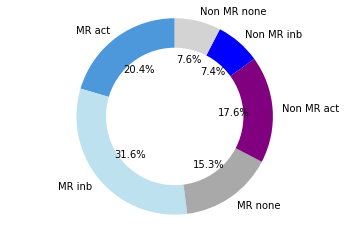

In [238]:
labels = ["MR act", "MR inb", "MR none", "Non MR act", "Non MR inb", "Non MR none"]
sizes = [percent_act_mr_run_all,percent_inb_mr_run_all,percent_mr_none_all_run,percent_act_non_mr_run_all,percent_inb_non_mr_run_all,percent_non_mr_none_all_run]#colors
colors = ["#4D98DB", "#BEE1F0","darkgrey", "purple", "blue", "lightgrey"]
 
fig1, ax1 = plt.subplots()
ax1.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90)#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
#plt.savefig('donut_chart_145Hz.svg',dpi=1200,bbox_inches='tight')

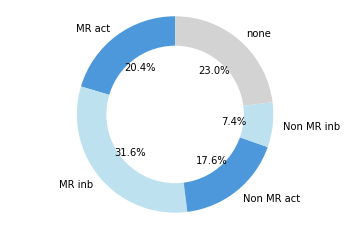

In [245]:
labels = ["MR act", "MR inb", "Non MR act", "Non MR inb", "none"]
percent_none_all_run=100-(percent_act_mr_run_all+percent_inb_mr_run_all+percent_act_non_mr_run_all+percent_inb_non_mr_run_all)
sizes = [percent_act_mr_run_all,percent_inb_mr_run_all,percent_act_non_mr_run_all,percent_inb_non_mr_run_all,percent_none_all_run]#colors
colors = ["#4D98DB", "#BEE1F0", "#4D98DB", "#BEE1F0", "lightgrey"]
 
fig1, ax1 = plt.subplots()
ax1.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90)#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.savefig('donut_chart_10Hz_run.svg',dpi=1200,bbox_inches='tight')

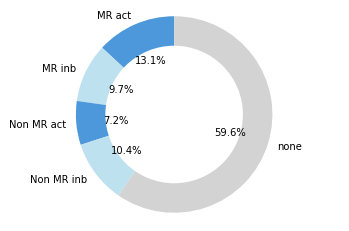

In [246]:
labels = ["MR act", "MR inb", "Non MR act", "Non MR inb", "none"]
percent_none_all_rest=100-(percent_act_mr_rest_all+percent_inb_mr_rest_all+percent_act_non_mr_rest_all+percent_inb_non_mr_rest_all)
sizes = [percent_act_mr_rest_all,percent_inb_mr_rest_all,percent_act_non_mr_rest_all,percent_inb_non_mr_rest_all,percent_none_all_rest]#colors
colors = ["#4D98DB", "#BEE1F0", "#4D98DB", "#BEE1F0", "lightgrey"]
 
fig1, ax1 = plt.subplots()
ax1.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90)#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.savefig('donut_chart_10Hz_rest.svg',dpi=1200,bbox_inches='tight')

In [102]:
def stacked_bar_plot(y1,y2,y3,ylabel1,title1):
    x = ['Rest','Run']
    fig, ax = plt.subplots(figsize= (1.5,2.0))
    x_pos=[0,0.08]
    plt.bar(x_pos, y1, color='#4D98DB',width=0.035)
    plt.bar(x_pos, y2, bottom=y1, color='#BEE1F0',width=0.035)
    plt.bar(x_pos, y3, bottom=y1+y2, color='grey',width=0.035)
    plt.xlabel("Locomotion state",fontsize=12)
    plt.ylabel(ylabel1,fontsize=12)
    plt.xticks([0,0.08],labels=['Rest','Run'],fontsize=12)
    plt.title(title1,fontsize=12)
    #plt.legend(["Activated", "Inhibited", "None"],loc=1,fontsize=10)
    plt.xlim([-0.05,0.13])

### All neurons

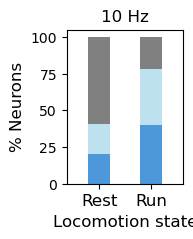

In [103]:
x = ['Rest','Run']
y1=np.array([percent_act_all_rest,percent_act_all_run])
y2=np.array([percent_inb_all_rest,percent_inb_all_run])
y3=np.array([np.round(100-percent_act_all_rest-percent_inb_all_rest,1),np.round(100-percent_act_all_run-percent_inb_all_run,1)])

fig, ax = plt.subplots(figsize= (1.5, 2.0))
x_pos=[0,0.08]
plt.bar(x_pos, y1, color='#4D98DB',width=0.035)
plt.bar(x_pos, y2, bottom=y1, color='#BEE1F0',width=0.035)
plt.bar(x_pos, y3, bottom=y1+y2, color='grey',width=0.035)
plt.xlabel("Locomotion state",fontsize=12)
plt.ylabel("% Neurons",fontsize=12)
plt.xticks([0,0.08],labels=['Rest','Run'],fontsize=12)
plt.title('10 Hz',fontsize=12)
#plt.legend(["Activated", "Inhibited", "None"],loc=1,fontsize=10)
plt.xlim([-0.05,0.13])
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_3')
plt.savefig('Stacked_bar_plot_10Hz_all_neurons.svg',dpi=1200,bbox_inches='tight')

In [104]:
print(y1,y2,y3)

[20.3 39.9] [20.1 38.5] [59.6 21.6]


### Motion resp neurons 

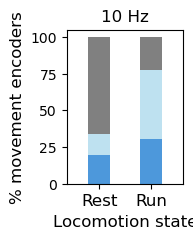

In [105]:
y1=np.array([percent_act_mr_rest,percent_act_mr_run])
y2=np.array([percent_inb_mr_rest,percent_inb_mr_run])
y3=np.array([percent_none_mr_rest,percent_none_mr_run])
stacked_bar_plot(y1,y2,y3,'% movement encoders','10 Hz')
plt.savefig('Stacked_bar_plot_10Hz_mr_neurons.svg',dpi=1200,bbox_inches='tight')

In [84]:
print(y1,y2,y3)

[19.4 30.4] [14.4 47. ] [66.2 22.6]


#### E/I ratio

In [123]:
EI_mr_rest=percent_act_mr_rest/percent_inb_mr_rest
EI_mr_run=percent_act_mr_run/percent_inb_mr_run
print(EI_mr_rest,EI_mr_run)

1.347222222222222 0.6468085106382978


In [125]:
EI_non_mr_rest=percent_act_non_mr_rest/percent_inb_non_mr_rest
EI_non_mr_run=percent_act_non_mr_run/percent_inb_non_mr_run
print(EI_non_mr_rest,EI_non_mr_run)

0.6918238993710691 2.378854625550661


[0.6918238993710691, 2.378854625550661, 1.347222222222222, 0.6468085106382978]


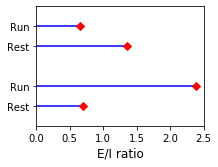

In [167]:
EI=[EI_non_mr_rest,EI_non_mr_run,EI_mr_rest,EI_mr_run]
print(EI)
x=[0,0.2,0.6,0.8]
fig, ax = plt.subplots(figsize= (3, 2.2))
plt.hlines(y=x, xmin=0, xmax=EI, color='blue')
# Dr is the marker style, can also use go.
plt.plot(EI,x, "Dr")
plt.yticks(x,labels=['Rest','Run','Rest','Run'])
plt.ylim([-0.2,1.0])
plt.xlabel('E/I ratio',fontsize=12)
plt.xlim([0,2.5])
plt.savefig('EI_ratio_10Hz.svg',dpi=1200,bbox_inches='tight')

/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.


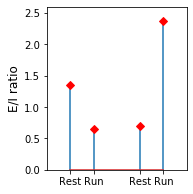

In [229]:
fig, ax = plt.subplots(figsize= ((2.5, 3)))
x=[0,0.2,0.6,0.8]
EI=[EI_mr_rest,EI_mr_run,EI_non_mr_rest,EI_non_mr_run]
plt.stem(x,EI,markerfmt="Dr")
plt.xticks(x,labels=['Rest','Run','Rest','Run'])
plt.xlim([-0.2,1])
plt.ylim([0,2.6])
plt.ylabel('E/I ratio',fontsize=12)
plt.xticks([0,0.2,0.6,0.8])
plt.savefig('EI_ratio_10Hz.svg',dpi=1200,bbox_inches='tight')

[0.6918238993710691, 2.378854625550661, 1.347222222222222, 0.6468085106382978]


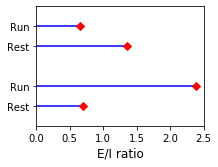

In [167]:
EI=[EI_non_mr_rest,EI_non_mr_run,EI_mr_rest,EI_mr_run]
print(EI)
x=[0,0.2,0.6,0.8]
fig, ax = plt.subplots(figsize= (3, 2.2))
plt.hlines(y=x, xmin=0, xmax=EI, color='blue')
# Dr is the marker style, can also use go.
plt.plot(EI,x, "Dr")
plt.yticks(x,labels=['Rest','Run','Rest','Run'])
plt.ylim([-0.2,1.0])
plt.xlabel('E/I ratio',fontsize=12)
plt.xlim([0,2.5])
plt.savefig('EI_ratio_10Hz.svg',dpi=1200,bbox_inches='tight')

In [155]:
def get_overlap_sensory_cells2(sess_name):
    
    
    baseline_indices=remove_nan_motion_frames(sess_name)
    stim_indices=get_stim_frames_index(sess_name)
    a=stationary_period_df.loc[sess_name]
    low_sp_frames= np.where(a==1)[0]
    low_speed_index_stim = np.intersect1d(stim_indices,low_sp_frames)
    low_speed_index_bs = np.intersect1d(baseline_indices,low_sp_frames)
    n_frames_stim= len(low_speed_index_stim)
    n_frames_bs= len(low_speed_index_bs)
    
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index_stim = np.intersect1d(stim_indices,moving_frames)
    high_speed_index_bs = np.intersect1d(baseline_indices,moving_frames)
    n_frames_stim2= len(high_speed_index_stim)
    n_frames_bs2= len(high_speed_index_bs)

    if (n_frames_stim>1200 and n_frames_bs>2*n_frames_stim) and (n_frames_stim2>1200 and n_frames_bs2>2*n_frames_stim2):
        os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Trace_analysis/Final_codes/')
        f=h5py.File('Stim_resp_cells_sustained_10Hz_final.h5',"r")
        stim_resp_cells_inc=np.squeeze(np.array(f[sess_name+'_inc_mov']))
        stim_resp_cells_dec=np.squeeze(np.array(f[sess_name+'_dec_mov']))
        stim_resp_cells_mov=np.concatenate((stim_resp_cells_inc,stim_resp_cells_dec))
        f.close()
        os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Trace_analysis/Final_codes/')
        f=h5py.File('Stim_resp_cells_sustained_10Hz_final.h5',"r")
        stim_resp_cells_inc=np.squeeze(np.array(f[sess_name+'_inc_stn']))
        stim_resp_cells_dec=np.squeeze(np.array(f[sess_name+'_dec_stn']))
        stim_resp_cells_stn=np.concatenate((stim_resp_cells_inc,stim_resp_cells_dec))
        f.close()
        processed_traces= binary_traces_df[sess_name]
        processed_traces =processed_traces.T
        Ncells= processed_traces.shape[0]
        n_common_resp_cells=np.array(np.intersect1d(stim_resp_cells_stn,stim_resp_cells_mov)).shape[0]
    else:
        Ncells=np.NaN
        n_common_resp_cells=np.NaN
   

    return Ncells,n_common_resp_cells


In [234]:
Ncells=np.zeros(len(sess_list))
n_sensory_common_resp_cells=np.zeros(len(sess_list))

for i in np.arange(0,len(sess_list),1):
    Ncells[i],n_sensory_common_resp_cells[i]= get_overlap_sensory_cells2(sess_list[i])
np.nansum(Ncells),np.nansum(n_sensory_common_resp_cells),np.nansum(n_sensory_common_resp_cells)/np.nansum(Ncells)

(1644.0, 513.0, 0.31204379562043794)

In [156]:
def get_overlap_sensorimotor(sess_name):
    
    
    baseline_indices=remove_nan_motion_frames(sess_name)
    stim_indices=get_stim_frames_index(sess_name)
    a=stationary_period_df.loc[sess_name]
    low_sp_frames= np.where(a==1)[0]
    low_speed_index_stim = np.intersect1d(stim_indices,low_sp_frames)
    low_speed_index_bs = np.intersect1d(baseline_indices,low_sp_frames)
    n_frames_stim= len(low_speed_index_stim)
    n_frames_bs= len(low_speed_index_bs)
    
    a=moving_period_df.loc[sess_name]
    moving_frames= np.where(a==1)[0]
    high_speed_index_stim = np.intersect1d(stim_indices,moving_frames)
    high_speed_index_bs = np.intersect1d(baseline_indices,moving_frames)
    n_frames_stim2= len(high_speed_index_stim)
    n_frames_bs2= len(high_speed_index_bs)

    if (n_frames_stim>1200 and n_frames_bs>2*n_frames_stim) and (n_frames_stim2>1200 and n_frames_bs2>2*n_frames_stim2):
        os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Trace_analysis/Final_codes/')
        f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
        motion_resp_cells=np.squeeze(np.array(f[sess_name]))
        f.close()
        f=h5py.File('Stim_resp_cells_sustained_10Hz_final.h5',"r")
        stim_resp_cells_inc=np.squeeze(np.array(f[sess_name+'_inc_mov']))
        stim_resp_cells_dec=np.squeeze(np.array(f[sess_name+'_dec_mov']))
        stim_resp_cells_mov=np.concatenate((stim_resp_cells_inc,stim_resp_cells_dec))
        f.close()
        f=h5py.File('Stim_resp_cells_sustained_10Hz_final.h5',"r")
        stim_resp_cells_inc=np.squeeze(np.array(f[sess_name+'_inc_stn']))
        stim_resp_cells_dec=np.squeeze(np.array(f[sess_name+'_dec_stn']))
        stim_resp_cells_stn=np.concatenate((stim_resp_cells_inc,stim_resp_cells_dec))
        f.close()
        processed_traces= binary_traces_df[sess_name]
        processed_traces =processed_traces.T
        Ncells= processed_traces.shape[0]
        common_sensory_resp_cells=np.array(np.intersect1d(stim_resp_cells_stn,stim_resp_cells_mov))
        n_common_sensorimotor=np.array(np.intersect1d(common_sensory_resp_cells, motion_resp_cells)).shape[0]
    else:
        Ncells=np.NaN
        n_common_sensorimotor=np.NaN
   

    return Ncells,n_common_sensorimotor


In [157]:
Ncells=np.zeros(len(sess_list))
n_sensorimotor=np.zeros(len(sess_list))

for i in np.arange(0,len(sess_list),1):
    Ncells[i],n_sensorimotor[i]= get_overlap_sensorimotor(sess_list[i])
print(np.nansum(Ncells),np.nansum(n_sensorimotor),np.nansum(n_sensorimotor)/np.nansum(Ncells)*100)

1644.0 299.0 18.18734793187348


In [237]:
# y1,y2,y3
np.round((np.nansum(N_common_cells2)-np.nansum(n_sensorimotor))/np.nansum(N_motion_resp_cells)*100,2),np.round((np.nansum(N_common_cells)-np.nansum(n_sensorimotor))/np.nansum(N_motion_resp_cells)*100,2),np.round(np.nansum(n_sensorimotor)/np.nansum(N_motion_resp_cells)*100,2)

(50.32, 6.78, 27.01)

In [238]:
# y4
np.round(100-(np.round((np.nansum(N_common_cells2)-np.nansum(n_sensorimotor))/np.nansum(N_motion_resp_cells)*100,2)+np.round((np.nansum(N_common_cells)-np.nansum(n_sensorimotor))/np.nansum(N_motion_resp_cells)*100,2)+np.round(np.nansum(n_sensorimotor)/np.nansum(N_motion_resp_cells)*100,2)),2)

15.89

In [240]:
# Sanity check
(np.nansum(N_motion_resp_cells)-np.nansum(n_sensorimotor)-(np.nansum(N_common_cells2)-np.nansum(n_sensorimotor))-(np.nansum(N_common_cells)-np.nansum(n_sensorimotor)))/np.nansum(N_motion_resp_cells)

0.15898825654923215

In [ ]:
 x = ['Rest','Run']
    fig, ax = plt.subplots(figsize= (1.5,2.0))
    x_pos=[0,0.08]
    plt.bar(x_pos, y1, color='#4D98DB',width=0.035)
    plt.bar(x_pos, y2, bottom=y1, color='#BEE1F0',width=0.035)
    plt.bar(x_pos, y3, bottom=y1+y2, color='grey',width=0.035)
    plt.xlabel("Locomotion state",fontsize=12)
    plt.ylabel(ylabel1,fontsize=12)
    plt.xticks([0,0.08],labels=['Rest','Run'],fontsize=12)
    plt.title(title1,fontsize=12)
    #plt.legend(["Activated", "Inhibited", "None"],loc=1,fontsize=10)
    plt.xlim([-0.05,0.13])

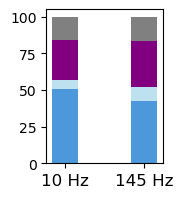

In [190]:
x = ['10 Hz','145 Hz']
y1=np.array([50.32,42.23])
y2=np.array([6.78,9.49])
y3=np.array([27.01,31.76])
y4=np.array([15.89,16.52])
fig, ax = plt.subplots(figsize= (1.5, 2.0))
x_pos=[0,0.06]
plt.bar(x_pos, y1, color='#4D98DB',width=0.02)
plt.bar(x_pos, y2, bottom=y1, color='#BEE1F0',width=0.02)
plt.bar(x_pos, y3, bottom=y1+y2, color='purple',width=0.02)
plt.bar(x_pos, y4, bottom=y1+y2+y3, color='grey',width=0.02)
#plt.xlabel("Stimulation frequency",fontsize=12)
#plt.ylabel("% motion responsive neurons",fontsize=12)
plt.xticks([0,0.06],labels=['10 Hz','145 Hz'],fontsize=12)
#plt.legend(["Sensory resp run", "Sensory resp rest", "Both", "None"],loc=1)
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_3')
plt.savefig('Stacked_bar_plot_6b.svg',dpi=1200,bbox_inches='tight')

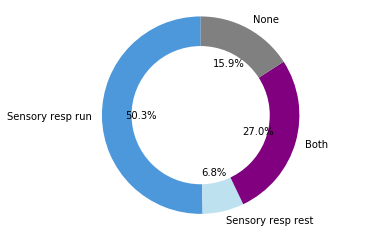

In [1056]:

labels = ["Sensory resp run", "Sensory resp rest", "Both", "None"]
sizes = [50.32, 6.78, 27.01, 15.89]#colors
colors = ["#4D98DB", "#BEE1F0", "purple", "grey"]
 
fig1, ax1 = plt.subplots()
ax1.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90)#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
#plt.tight_layout()
plt.savefig('donut_chart_10Hz.svg',dpi=1200,bbox_inches='tight')

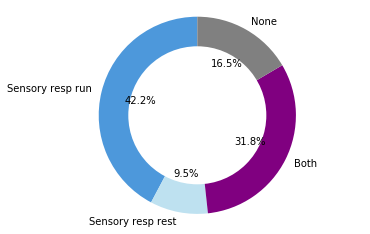

In [1058]:
labels = ["Sensory resp run", "Sensory resp rest", "Both", "None"]
sizes = [42.23, 9.49, 31.76, 16.52]#colors
colors = ["#4D98DB", "#BEE1F0", "purple", "grey"]
 
fig1, ax1 = plt.subplots()
ax1.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90)#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.savefig('donut_chart_145Hz.svg',dpi=1200,bbox_inches='tight')

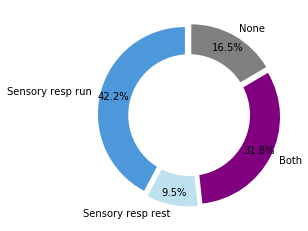

In [1059]:
labels = ["Sensory resp run", "Sensory resp rest", "Both", "None"]
sizes = [42.23, 9.49, 31.76, 16.52]#colors
colors = ["#4D98DB", "#BEE1F0", "purple", "grey"]
#explsion
explode = (0.05,0.05,0.05,0.05)
 
plt.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
#plt.tight_layout()
plt.savefig('donut_chart_145Hz_2.svg',dpi=1200,bbox_inches='tight')

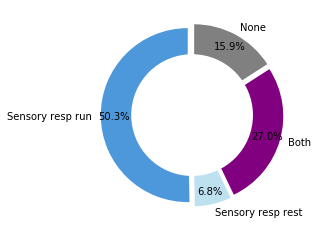

In [1060]:
labels = ["Sensory resp run", "Sensory resp rest", "Both", "None"]
sizes = [50.32, 6.78, 27.01, 15.89]#colors
colors = ["#4D98DB", "#BEE1F0", "purple", "grey"]
#explsion
explode = (0.05,0.05,0.05,0.05)
 
plt.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
#plt.tight_layout()
plt.savefig('donut_chart_10Hz_2.svg',dpi=1200,bbox_inches='tight')

## Bar plots

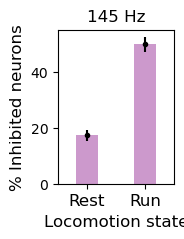

In [110]:
fig, ax = plt.subplots(figsize= (1.5, 2.0))
x=[0,0.4]
y=[17.3,50]
# Calculate this 
c=[1.95,2.6]
plt.bar(x,y,width=0.15,color ='purple',alpha=0.4)
plt.xlabel("Locomotion state",fontsize=12)
plt.ylabel("% Inhibited neurons",fontsize=12)
plt.title("145 Hz")
plt.xticks([0,0.4],labels=['Rest','Run'],fontsize=12)
plt.xlim([-0.2,0.6])
plt.errorbar(x, y, yerr=c, fmt='.k')
plt.savefig('percent_inhibited_mr_neurons_145Hz.svg',dpi=1200,bbox_inches='tight')

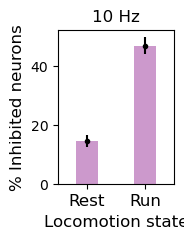

In [111]:
fig, ax = plt.subplots(figsize= (1.5, 2.0))
x=[0,0.4]
y=[14.4,47]
# Calculate this 
c=[2.04,2.94]
plt.bar(x,y,width=0.15,color ='purple',alpha=0.4)
plt.xlabel("Locomotion state",fontsize=12)
plt.ylabel("% Inhibited neurons",fontsize=12)
plt.title("10 Hz")
plt.xticks([0,0.4],labels=['Rest','Run'],fontsize=12)
plt.xlim([-0.2,0.6])
plt.errorbar(x, y, yerr=c, fmt='.k')
plt.savefig('percent_inhibited_mr_neurons_10Hz.svg',dpi=1200,bbox_inches='tight')

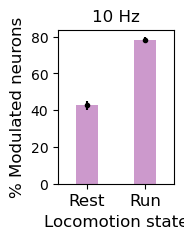

In [112]:
fig, ax = plt.subplots(figsize= (1.5, 2))
x=[0,0.4]
y=[42.6,78.4]
# Calculate this 
c=[2.3,1.4]
plt.bar(x,y,width=0.15,color ='purple',alpha=0.4)
plt.xlabel("Locomotion state",fontsize=12)
plt.ylabel("% Modulated neurons",fontsize=12)
plt.title("10 Hz")
plt.xticks([0,0.4],labels=['Rest','Run'],fontsize=12)
plt.xlim([-0.2,0.6])
plt.errorbar(x, y, yerr=c, fmt='.k')
plt.savefig('percent_modulated_all_neurons_10Hz.svg',dpi=1200,bbox_inches='tight')

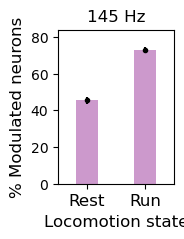

In [118]:
fig, ax = plt.subplots(figsize= (1.5, 2.0))
x=[0,0.4]
y=[45.5,73.1]
# Calculate this 
c=[2.04,1.67]
plt.bar(x,y,width=0.15,color ='purple',alpha=0.4)
plt.xlabel("Locomotion state",fontsize=12)
plt.ylabel("% Modulated neurons",fontsize=12)
plt.title("145 Hz")
plt.xticks([0,0.4],labels=['Rest','Run'],fontsize=12)
plt.xlim([-0.2,0.6])
plt.ylim([0,84])
plt.errorbar(x, y, yerr=c, fmt='.k')
plt.savefig('percent_modulated_all_neurons_145Hz.svg',dpi=1200,bbox_inches='tight')

## Fig 7 -Correlation analysis 

In [291]:
## All periods 
def all_corr(sess_name):
    traces= binary_traces_df[sess_name].T
    speed_df=np.array(traces)
    corr_matrix=np.corrcoef(speed_df)
    corr_list=upper_tri_masking(corr_matrix)
    mean_corr=np.nanmean(corr_list)
    median_corr=np.nanmedian(corr_list)
    return mean_corr,median_corr

In [297]:
## Add motion resp to above
def all_motion_resp_corr(sess_name):
    traces= binary_traces_df[sess_name].T
    common_indices=remove_nan_motion_frames(sess_name)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    f.close()
    speed_df=np.array(traces.loc[np.squeeze(resp_cells),:])
    
    corr_matrix=np.corrcoef(speed_df)
    corr_list=upper_tri_masking(corr_matrix)
    mean_corr=np.nanmean(corr_list)
    median_corr=np.nanmedian(corr_list)
    return mean_corr,median_corr

    

In [298]:
def baseline_corr(sess_name):
    traces= binary_traces_df[sess_name].T
    common_indices=remove_nan_motion_frames(sess_name)
    speed_df=np.array(traces.loc[:,common_indices])
    corr_matrix=np.corrcoef(speed_df)
    corr_list=upper_tri_masking(corr_matrix)
    mean_corr=np.nanmean(corr_list)
    median_corr=np.nanmedian(corr_list)
    return mean_corr,median_corr

In [299]:
def corr_before_first_stim(sess_name):
    traces= binary_traces_df[sess_name].T
    Ncells=traces.shape[0]
    common_indices=remove_nan_motion_frames(sess_name)
    stim_on_inds=stim_onsets_df.loc[sess_name,:]
    indices=np.arange(common_indices[0],stim_on_inds[0]+1,1)
    speed_index = indices
    speed_df=np.array(traces.loc[:,indices])
    corr_matrix=np.corrcoef(speed_df)
    obs_corr_list=upper_tri_masking(corr_matrix)
    mean_corr=np.nanmean(obs_corr_list)
    median_corr=np.nanmedian(obs_corr_list)
    return mean_corr,median_corr

In [300]:
## Add motion resp to above
def corr_before_first_stim_motion_resp(sess_name):
    traces= binary_traces_df[sess_name].T
    Ncells=traces.shape[0]
    common_indices=remove_nan_motion_frames(sess_name)
    stim_on_inds=stim_onsets_df.loc[sess_name,:]
    indices=np.arange(common_indices[0],stim_on_inds[0]+1,1)
    speed_index = indices
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    f.close()
    speed_df=np.array(traces.loc[np.squeeze(resp_cells),indices])
    #speed_df=np.array(traces.loc[:,indices])
    corr_matrix=np.corrcoef(speed_df)
    obs_corr_list=upper_tri_masking(corr_matrix)
    mean_corr=np.nanmean(obs_corr_list)
    median_corr=np.nanmedian(obs_corr_list)
    return mean_corr,median_corr

In [301]:
def baseline_corr_motion_resp(sess_name):
    traces= binary_traces_df[sess_name].T
    common_indices=remove_nan_motion_frames(sess_name)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    f.close()
    speed_df=np.array(traces.loc[np.squeeze(resp_cells),common_indices])
    corr_matrix=np.corrcoef(speed_df)
    corr_list=upper_tri_masking(corr_matrix)
    mean_corr=np.nanmean(corr_list)
    median_corr=np.nanmedian(corr_list)
    return mean_corr,median_corr

In [385]:
sess_list=[]
for mouse, cell_df in binary_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)
print(sess_list)
os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Trace_analysis/Final_codes')
f1 = h5py.File("all_mean_corr_10Hz_final.h5", 'w')
label=np.zeros(len(sess_list))
mean_corr=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    sess_name=sess_list[i]
    mean_corr[i],_=all_corr(sess_name)
    if sess_list[i].find('608448') != -1 or sess_list[i].find('608450') != -1 or sess_list[i].find('608452') != -1 or sess_list[i].find('612535') != -1 or sess_list[i].find('615883') != -1: 
        label[i]=1
    if sess_list[i].find('602101') != -1 or sess_list[i].find('608451') != -1 or sess_list[i].find('611311') != -1 or sess_list[i].find('611111') != -1: 
        label[i]=2
    dset1 = f1.create_dataset(sess_list[i], data=mean_corr[i])
dset3=f1.create_dataset('GCamp_version', data=label)
f1.close()

['602101_03092020', '602101_07082020', '608448_01062020', '608448_01172020', '608450_03092020', '608451_01062020', '608451_07082020', '608452_01062020', '608452_07082020', '611111_07082020', '611311_03092020', '612535_07082020', '615883_02052021', '615883_03122021']


/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


In [244]:
sess_list=[]
for mouse, cell_df in binary_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)
print(sess_list)
os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Trace_analysis/Final_codes')
f1 = h5py.File("Baseline_median_corr_10Hz_before_first_stim_final_mr.h5", 'w')
label=np.zeros(len(sess_list))
mean_corr=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    sess_name=sess_list[i]
    _,mean_corr[i]=corr_before_first_stim_motion_resp(sess_name)
    if sess_list[i].find('608448') != -1 or sess_list[i].find('608450') != -1 or sess_list[i].find('608452') != -1 or sess_list[i].find('612535') != -1 or sess_list[i].find('615883') != -1: 
        label[i]=1
    if sess_list[i].find('602101') != -1 or sess_list[i].find('608451') != -1 or sess_list[i].find('611311') != -1 or sess_list[i].find('611111') != -1: 
        label[i]=2
    dset1 = f1.create_dataset(sess_list[i], data=mean_corr[i])
dset3=f1.create_dataset('GCamp_version', data=label)
f1.close()

['602101_03092020', '602101_07082020', '608448_01062020', '608448_01172020', '608450_03092020', '608451_01062020', '608451_07082020', '608452_01062020', '608452_07082020', '611111_07082020', '611311_03092020', '612535_07082020', '615883_02052021', '615883_03122021']


In [113]:
## Store in .h5 files 
sess_list=[]
for mouse, cell_df in binary_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)
print(sess_list)
f1 = h5py.File("Baseline_median_corr_motion_resp_10Hz_final.h5", 'w')
label=np.zeros(len(sess_list))
median_corr=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    sess_name=sess_list[i]
    _,median_corr[i]=baseline_corr_motion_resp(sess_name)
    
    if sess_list[i].find('608448') != -1 or sess_list[i].find('608450') != -1 or sess_list[i].find('608452') != -1 or sess_list[i].find('612535') != -1 or sess_list[i].find('615883') != -1: 
        label[i]=1
    if sess_list[i].find('602101') != -1 or sess_list[i].find('608451') != -1 or sess_list[i].find('611311') != -1 or sess_list[i].find('611111') != -1: 
        label[i]=2
    dset1 = f1.create_dataset(sess_list[i], data=median_corr[i])
dset3=f1.create_dataset('GCamp_version', data=label)
f1.close()

['602101_03092020', '602101_07082020', '608448_01062020', '608448_01172020', '608450_03092020', '608451_01062020', '608451_07082020', '608452_01062020', '608452_07082020', '611111_07082020', '611311_03092020', '612535_07082020', '615883_02052021', '615883_03122021']


## Combine 10 Hz and 145 Hz 

In [308]:
# Label 1- GCamp7
# Label 2- soma GCamp7
#f = h5py.File("Event_rate_10Hz.h5", 'r')
f= h5py.File("Baseline_median_corr_10Hz_before_first_stim_final.h5", 'r')
#f = h5py.File("Baseline_median_corr_motion_resp_10Hz_final.h5", 'r')
#f=h5py.File("all_mean_corr_10Hz_final.h5",'r')
labels=np.array(f['GCamp_version'])
idx=(np.squeeze(np.argwhere(labels==1)))
idx2=(np.squeeze(np.argwhere(labels==2)))
l=list(f.keys())
bs_corr=[]
for i in np.arange(0,len(l)-1,1):
    bs_corr.append(np.array(f[l[i]]))
bs_corr=np.array(bs_corr)
GCamp7_arr_10Hz=bs_corr[idx]
soma_GCamp7_arr_10Hz=bs_corr[idx2]
soma_GCamp7_arr_10Hz = [x for x in soma_GCamp7_arr_10Hz if np.isnan(x) == False]
GCamp7_arr_10Hz = [x for x in GCamp7_arr_10Hz if np.isnan(x) == False]
f.close()

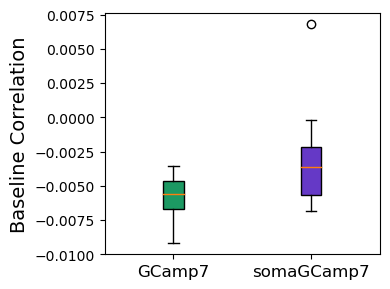

In [313]:
# Label 1- GCamp7
# Label 2- soma GCamp7
#f = h5py.File("Event_rate_10Hz.h5", 'r')
f = h5py.File("Baseline_median_corr_145Hz_before_first_stim_final.h5", 'r')
#f=h5py.File("Baseline_median_corr_motion_resp_145Hz_final.h5", 'r')
#f=h5py.File("all_mean_corr_145Hz_final.h5",'r')
#f = h5py.File("Baseline_median_corr_145Hz_final.h5", 'r')
labels=np.array(f['GCamp_version'])
idx=(np.squeeze(np.argwhere(labels==1)))
idx2=(np.squeeze(np.argwhere(labels==2)))
l=list(f.keys())
bs_corr=[]
for i in np.arange(0,len(l)-1,1):
    if l[i].find('602101_03112020') != -1 or l[i].find('611311_03112020') != -1: #or l[i].find('611111_03112020') != -1:
        bs_corr.append(np.NaN)
    else:
        bs_corr.append(np.array(f[l[i]]))
bs_corr=np.array(bs_corr)
GCamp7_arr_145Hz=bs_corr[idx]
soma_GCamp7_arr_145Hz=bs_corr[idx2]
f.close()
soma_GCamp7_arr_145Hz = [x for x in soma_GCamp7_arr_145Hz if np.isnan(x) == False]
GCamp7_arr_145Hz = [x for x in GCamp7_arr_145Hz if np.isnan(x) == False]
GCamp_corr=np.concatenate((GCamp7_arr_10Hz,GCamp7_arr_145Hz))
soma_GCamp_corr=np.concatenate((soma_GCamp7_arr_10Hz,soma_GCamp7_arr_145Hz))
x=[GCamp_corr,soma_GCamp_corr]
fig, ax = plt.subplots(1, 1, figsize=(4,3))
box=plt.boxplot(x,labels=['GCamp7','somaGCamp7'],patch_artist=True)
plt.xticks([1,2],labels=['GCamp7','somaGCamp7'],fontsize=12)
colors = [ '#1C9963', '#6539C6']
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)
plt.ylabel('Baseline Correlation',fontsize=14)
plt.tight_layout()
plt.savefig('bs_corr_gcamp7_soma_before_first_stim_median.svg',dpi=1200,bbox_inches='tight')

In [310]:
len(GCamp7_arr_10Hz),len(soma_GCamp7_arr_10Hz),len(GCamp7_arr_145Hz),len(soma_GCamp7_arr_145Hz)

(8, 6, 7, 5)

In [314]:
print(len(GCamp_corr),len(soma_GCamp_corr))

15 11


In [312]:
print(ss.ttest_ind(GCamp,soma_GCamp))
print(ss.ranksums(GCamp,soma_GCamp))
print(ss.mannwhitneyu(GCamp,soma_GCamp))
print(ss.kruskal(GCamp,soma_GCamp))

TtestResult(statistic=-2.3650430975162204, pvalue=0.026453131454621758, df=24.0)
RanksumsResult(statistic=-1.9462473604038075, pvalue=0.051625033394238504)
MannwhitneyuResult(statistic=45.0, pvalue=0.05482034516421085)
KruskalResult(statistic=3.787878787878796, pvalue=0.05162503339423816)


In [106]:
def upper_tri_masking(A):
    m = A.shape[0]
    r = np.arange(m)
    mask = r[:,None] < r
    return A[mask]

## All movement responsive pairs locomotion

In [173]:
def motion_resp_pearson_corr_all_bs(sess_name):
    traces= binary_traces_df[sess_name].T
    Ncells=traces.shape[0]
    common_indices=remove_nan_motion_frames(sess_name)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_neurons=np.squeeze(np.array(f[sess_name]))
    f.close()
    hi_speed_df=np.array(traces.loc[np.squeeze(resp_neurons),common_indices])
    hi_corr_matrix=np.corrcoef(hi_speed_df)
    hi_corr_list=upper_tri_masking(hi_corr_matrix)
    mean_corr_strength=np.nanmean(hi_corr_list)
    median_corr_strength=np.nanmedian(hi_corr_list)
    return mean_corr_strength,median_corr_strength

In [174]:
def motion_resp_pearson_corr_all_bs_non_bias(sess_name):
    traces= binary_traces_df[sess_name].T
    Ncells=traces.shape[0]
    common_indices=remove_nan_motion_frames(sess_name)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_neurons=np.squeeze(np.array(f[sess_name]))
    f.close()
    hi_speed_df=np.array(traces.loc[np.squeeze(resp_neurons),common_indices])
    hi_corr_matrix=np.corrcoef(hi_speed_df)
    hi_corr_list=upper_tri_masking(hi_corr_matrix)
    
    hi_bs_df=(traces.loc[np.squeeze(resp_neurons),common_indices])
    Ncells=resp_neurons.shape[0]
    shuffle_corr_matrix_hi=np.zeros((1000,Ncells,Ncells))
    for j in np.arange(0,1000,1):
        shifted_speed_df = pd.DataFrame().reindex_like(hi_bs_df)
        rand_shifts=np.random.randint(1,round(0.5*hi_bs_df.shape[1]),size=Ncells)
        for i in np.arange(0,Ncells,1):
            shifted_speed_df.loc[resp_neurons[i],:]=np.roll(hi_bs_df.loc[resp_neurons[i],:],rand_shifts[i])
        shuffle_out_bin=np.corrcoef(shifted_speed_df)
        shuffle_corr_matrix_hi[j,:,:]=shuffle_out_bin
    hi_values_list=upper_tri_masking(np.mean(shuffle_corr_matrix_hi,axis=0))  
        
    mean_corr_strength=np.nanmean(hi_corr_list-hi_values_list)
    median_corr_strength=np.nanmedian(hi_corr_list-hi_values_list)
    return mean_corr_strength,median_corr_strength

In [175]:
def motion_resp_pearson_event_all_bs(sess_name):
    traces= binary_traces_df[sess_name].T
    common_indices=remove_nan_motion_frames(sess_name)
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    f.close()
    Ncells=resp_cells.shape[0]
    bs_index=common_indices
    event_df=np.zeros((Ncells,Ncells))
    for i in np.arange(0,Ncells,1):
        for j in np.arange(0,Ncells,1):
            neuron_1=np.mean(traces.loc[resp_cells[i],bs_index])
            neuron_2=np.mean(traces.loc[resp_cells[j],bs_index])
            event_df[i,j]=(neuron_1+neuron_2)/2*20
    event_list=upper_tri_masking(event_df)
    mean_event=np.mean(event_list)
    median_event=np.median(event_list)
    return mean_event,median_event

In [176]:
def n_frames_low_high_speed(sess_name,condition,motion_state):
    if condition ==1:
        indices=remove_nan_motion_frames(sess_name)
    if condition ==2:
        indices=get_stim_frames_index(sess_name)
    if motion_state ==1:
        a=stationary_period_df.loc[sess_name]
        frames= np.where(a==1)[0]
    if motion_state ==2:
        a=moving_period_df.loc[sess_name]
        frames= np.where(a==1)[0]
    speed_index = np.intersect1d(indices,frames)
    n_frames_speed= len(speed_index)
    percent_frames_speed=len(speed_index)/len(indices)*100
    return n_frames_speed,percent_frames_speed

In [177]:
def speed_all_bs(sess_name):
    common_indices=remove_nan_motion_frames(sess_name)
    motion=np.array(motion_df.loc[sess_name,:])
    motion=np.squeeze(motion)
    speed_df=np.array(motion[common_indices])
    mean_speed=np.mean(speed_df)
    median_speed=np.median(speed_df)
    max_speed=np.max(speed_df)
    min_speed=np.min(speed_df)
    return mean_speed,median_speed

In [181]:
sess_list=[]
for mouse, cell_df in binary_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)
sess_list

mean_corr_strength=np.zeros((len(sess_list)))
median_corr_strength=np.zeros((len(sess_list)))
for i in np.arange(0,len(sess_list),1):
    mean_corr_strength[i],median_corr_strength[i]=motion_resp_pearson_corr_all_bs_non_bias(sess_list[i])

In [182]:
# Non-bias
median_corr_strength_145Hz=np.array([ 0.01051454,  0.01110924,  0.01190624,  0.01501038,  0.00579533,
        0.01193708,  0.01149322,  0.00693415,  0.00666249, -0.0019103 ,
        0.00529268])
mean_corr_strength_145Hz=np.array([0.02416478, 0.01778801, 0.01894618, 0.02272438, 0.01336755,
       0.01975158, 0.01868206, 0.01545623, 0.01392259, 0.00701631,
       0.01099858])
median_corr_strength_tot=np.concatenate((median_corr_strength,median_corr_strength_145Hz))
mean_corr_strength_tot=np.concatenate((mean_corr_strength,mean_corr_strength_145Hz))

In [183]:
percent_low_speed_frames =[]
for i in np.arange(0,len(sess_list),1):
    percent_low_speed_frames.append(n_frames_low_high_speed(sess_list[i],1,1)[1])
#percent_low_speed_frames=np.delete(percent_low_speed_frames,[2,11])
percent_low_speed_frames_145Hz=np.array([17.78120082, 50.53266332, 56.61897439, 71.0431956,  16.1533311,  65.11361724,
 27.89124757,  8.53953739,  3.02989677, 16.22890879, 14.53320823])
percent_low_speed_frames_tot=np.concatenate((percent_low_speed_frames,percent_low_speed_frames_145Hz))

In [184]:
percent_hi_speed_frames =[]
for i in np.arange(0,len(sess_list),1):
    percent_hi_speed_frames.append(n_frames_low_high_speed(sess_list[i],1,2)[1])
#percent_low_speed_frames=np.delete(percent_low_speed_frames,[2,11])
percent_hi_speed_frames_145Hz=np.array([65.06713994, 44.1038526 , 39.05529184, 21.97982641, 73.30431871,
       29.71890254, 57.27248376, 83.70763852, 90.21651696, 82.17771963,
       83.6907714 ])
percent_hi_speed_frames_tot=np.concatenate((percent_hi_speed_frames,percent_hi_speed_frames_145Hz))

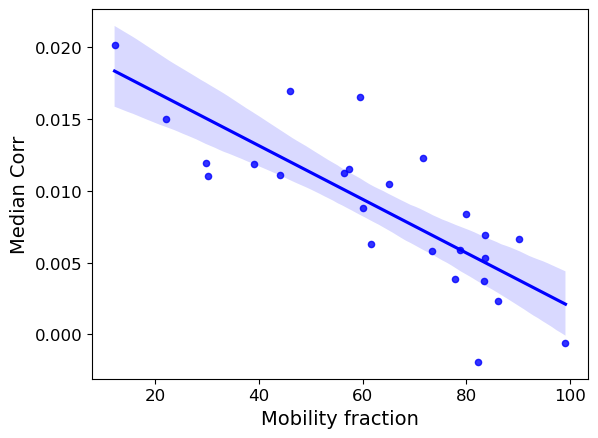

In [200]:
ax=sns.regplot(x=percent_hi_speed_frames_tot,y=median_corr_strength_tot,ci=95,color='blue',marker='o',scatter_kws={"s": 20})
ax.tick_params(axis='both', which='major', labelsize=12)
plt.ylabel('Median Corr',fontsize=14)
plt.xlabel('Mobility fraction',fontsize=14)
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_4')
plt.savefig('all_sess_bs_median_corr_vs_hi_speed_all_mr_adjusted.svg',dpi=1200,bbox_inches='tight')

In [67]:
slope, intercept, r, p, std_err = ss.linregress(np.squeeze(percent_hi_speed_frames_tot),np.squeeze(median_corr_strength_tot))
print(r**2,p)

0.6617749545901097 7.644891799027181e-07


In [69]:
percent_hi_speed_frames_tot.shape

(25,)

In [188]:
sess_list=[]
for mouse, cell_df in binary_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)
sess_list
mean_speed =[]
for i in np.arange(0,len(sess_list),1):
    mean_speed.append(speed_all_bs(sess_list[i])[0])
#mean_speed=np.delete(mean_speed,[2,11])

In [189]:
mean_speed_145Hz=np.array([ 9.69782902,  4.69612146,  6.69950445,  2.07952434, 12.50834442,  3.82604097,
  5.52860475, 10.18825342, 22.57375541, 19.49762422, 14.4278364 ])
mean_speed_tot=np.concatenate((mean_speed,mean_speed_145Hz))

Text(0.5, 0, 'Mean speed')

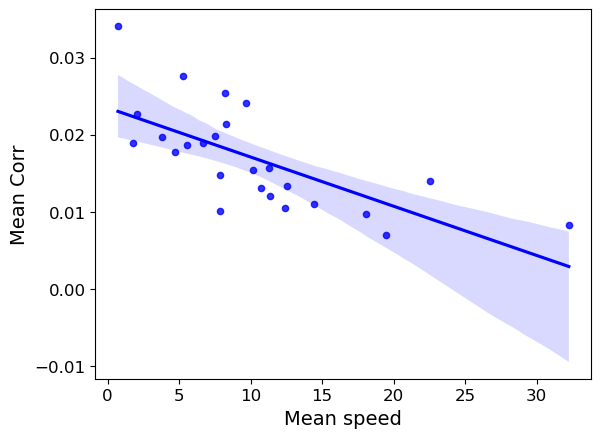

In [190]:
ax=sns.regplot(x=mean_speed_tot,y=mean_corr_strength_tot,ci=95,color='blue',marker='o',scatter_kws={"s": 20})
ax.tick_params(axis='both', which='major', labelsize=12)
plt.ylabel('Mean Corr',fontsize=14)
plt.xlabel('Mean speed',fontsize=14)
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_4')
#plt.savefig('all_sess_bs_mean_corr_vs_mean_speed_all_mr.svg',dpi=1200,bbox_inches='tight')

In [191]:
slope, intercept, r, p, std_err = ss.linregress(np.squeeze(mean_speed_tot),np.squeeze(mean_corr_strength_tot))
print(r**2,p)

0.47323756708476844 0.00014445019107451606


0.6124589200561216 3.784907648587558e-06


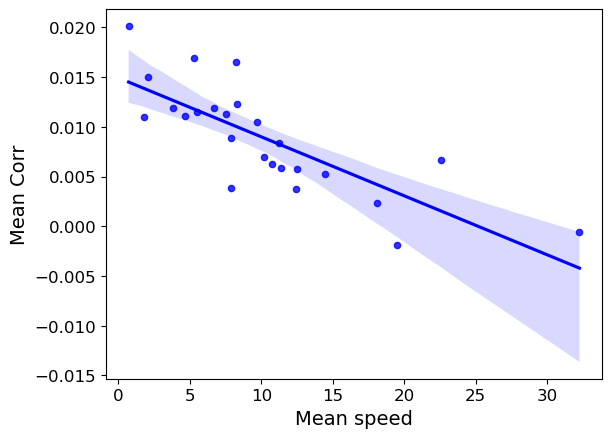

In [192]:
ax=sns.regplot(x=mean_speed_tot,y=median_corr_strength_tot,ci=95,color='blue',marker='o',scatter_kws={"s": 20})
ax.tick_params(axis='both', which='major', labelsize=12)
plt.ylabel('Mean Corr',fontsize=14)
plt.xlabel('Mean speed',fontsize=14)
#os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Figures/Fig_4')
plt.savefig('all_sess_bs_median_corr_vs_mean_speed_all_mr_adjusted.svg',dpi=1200,bbox_inches='tight')
slope, intercept, r, p, std_err = ss.linregress(np.squeeze(mean_speed_tot),np.squeeze(median_corr_strength_tot))
print(r**2,p)

In [103]:
def obs_pearson_corr_motion_resp(sess_name,condition,motion_state):
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    Ncells= resp_cells.shape[0]
    f.close()
    traces= binary_traces_df[sess_name].T
    Ncells=traces.shape[0]
    common_indices=remove_nan_motion_frames(sess_name)
    stim_indices=get_stim_frames_index(sess_name)
    if motion_state==1:
        a=stationary_period_df.loc[sess_name]
        frames= np.where(a==1)[0]
    if motion_state==2:
        a=moving_period_df.loc[sess_name]
        frames= np.where(a==1)[0]
    if condition == 1:
        speed_index = np.intersect1d(common_indices,frames)
    if condition ==2:
        speed_index = np.intersect1d(stim_indices,frames)
    if condition ==3:
        speed_index=common_indices
    if len(speed_index)<1200:
        corr_matrix=0
    else:
        speed_df=np.array(traces.loc[resp_cells,speed_index])
        corr_matrix=np.corrcoef(speed_df)
    return corr_matrix

In [104]:
def sig_corr_pairs_motion_resp(sess_name,condition,motion_state):
    os.chdir( "C:/Users/sudiksha/Documents/Codes/Shuffle_corr_files/")
    if condition == 1 and motion_state ==2:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_bs_10Hz.h5",'r')
    if condition == 2 and motion_state ==2:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_stim_10Hz.h5",'r')
    if condition == 1 and motion_state ==1:
        f1 = h5py.File("Shuffle_matrices_binary_pearson__motion_resp_low_bs_10Hz.h5",'r')
    if condition == 2 and motion_state ==1:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_low_stim_10Hz.h5",'r') 
    shuffle_matrix = np.array(f1[sess_name])
    f1.close()
    if np.all(shuffle_matrix==0)==1:
        percent_inc_sig_pairs=0
        percent_dec_sig_pairs=0
    else:
        Ncells=shuffle_matrix.shape[1]
        high_threshold=np.percentile(shuffle_matrix,97.5,axis=0)
        low_threshold=np.percentile(shuffle_matrix,2.5,axis=0)
  
    
        obs_corr_matrix=obs_pearson_corr_motion_resp(sess_name,condition,motion_state)

        # Calc corr value for every pair
        #mean_corr_strength=np.nanmean(obs_corr_list)
        obs_corr_list=upper_tri_masking(obs_corr_matrix)
        hi_thresholds=upper_tri_masking(high_threshold)
        low_thresholds=upper_tri_masking(low_threshold)
        idx= np.squeeze(np.argwhere(obs_corr_list>hi_thresholds))
        # Find sig neurons
        #a=np.array(np.triu_indices_from(obs_corr_matrix, k=1))
        #sig_pair_neurons=a[:,idx]
        #sig_neurons=np.union1d(np.unique(a[0,idx]),np.unique(a[1,idx]))
        #mean_inc_corr_strength=np.nanmean(obs_corr_list[idx])
        percent_inc_sig_pairs=np.sum(obs_corr_list>hi_thresholds)/hi_thresholds.shape[0]*100
        
        idx2= np.squeeze(np.argwhere(obs_corr_list<low_thresholds))
        #mean_dec_corr_strength=np.nanmean(obs_corr_list[idx2])
        percent_dec_sig_pairs=np.sum(obs_corr_list<low_thresholds)/low_thresholds.shape[0]*100
        not_random_idx=idx
        random_corr_strength = np.nanmean(obs_corr_list[..., [i for i in range(obs_corr_list.shape[0]) if i not in not_random_idx]])
        
    #return mean_inc_corr_strength,percent_inc_sig_pairs,mean_dec_corr_strength,percent_dec_sig_pairs,random_corr_strength
    return percent_inc_sig_pairs,percent_dec_sig_pairs

In [101]:
def sig_corr_pairs_neuron_identity(sess_name,condition,motion_state):
    os.chdir( "C:/Users/sudiksha/Documents/Codes/Shuffle_corr_files/")
    if condition == 1 and motion_state ==2:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_bs_10Hz.h5",'r')
    if condition == 2 and motion_state ==2:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_stim_10Hz.h5",'r')
    if condition == 1 and motion_state ==1:
        f1 = h5py.File("Shuffle_matrices_binary_pearson__motion_resp_low_bs_10Hz.h5",'r')
    if condition == 2 and motion_state ==1:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_low_stim_10Hz.h5",'r') 
    shuffle_matrix = np.array(f1[sess_name])
    f1.close()
    if np.all(shuffle_matrix==0)==1:
        percent_inc_sig_pairs=0
        percent_dec_sig_pairs=0
    else:
        Ncells=shuffle_matrix.shape[1]
        high_threshold=np.percentile(shuffle_matrix,97.5,axis=0)
        low_threshold=np.percentile(shuffle_matrix,2.5,axis=0)
  
    
        obs_corr_matrix=obs_pearson_corr_motion_resp(sess_name,condition,motion_state)

        obs_corr_list=upper_tri_masking(obs_corr_matrix)
        hi_thresholds=upper_tri_masking(high_threshold)
        low_thresholds=upper_tri_masking(low_threshold)
        idx= np.squeeze(np.argwhere(obs_corr_list>hi_thresholds))
        # Find sig neurons
        a=np.array(np.triu_indices_from(obs_corr_matrix, k=1))
        sig_pair_neurons=a[:,idx]
        sig_neurons=np.union1d(np.unique(a[0,idx]),np.unique(a[1,idx]))
        #mean_inc_corr_strength=np.nanmean(obs_corr_list[idx])
        
    
    return sig_neurons

In [195]:
def sig_corr_pair_value_motion_resp(sess_name,condition,motion_state):
    os.chdir( "C:/Users/sudiksha/Documents/Codes/Shuffle_corr_files/")
    if condition == 1 and motion_state ==2:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_bs_10Hz.h5",'r')
    if condition == 2 and motion_state ==2:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_stim_10Hz.h5",'r')
    if condition == 1 and motion_state ==1:
        f1 = h5py.File("Shuffle_matrices_binary_pearson__motion_resp_low_bs_10Hz.h5",'r')
    if condition == 2 and motion_state ==1:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_low_stim_10Hz.h5",'r') 
    shuffle_matrix = np.array(f1[sess_name])
    f1.close()
    if np.all(shuffle_matrix==0)==1:
        mean_corr=0
        median_corr=0
    else:
        Ncells=shuffle_matrix.shape[1]
        high_threshold=np.percentile(shuffle_matrix,97.5,axis=0)
        low_threshold=np.percentile(shuffle_matrix,2.5,axis=0)
  
    
        obs_corr_matrix=obs_pearson_corr_motion_resp(sess_name,condition,motion_state)

        # Calc corr value for every pair
        #mean_corr_strength=np.nanmean(obs_corr_list)
        obs_corr_list=upper_tri_masking(obs_corr_matrix)
        hi_thresholds=upper_tri_masking(high_threshold)
        low_thresholds=upper_tri_masking(low_threshold)
        idx= np.squeeze(np.argwhere(obs_corr_list>hi_thresholds))
        mean_corr=np.nanmean(obs_corr_list[idx])
        median_corr=np.nanmedian(obs_corr_list[idx])
        # Find sig neurons
        #a=np.array(np.triu_indices_from(obs_corr_matrix, k=1))
        #sig_pair_neurons=a[:,idx]
        #sig_neurons=np.union1d(np.unique(a[0,idx]),np.unique(a[1,idx]))
        #mean_inc_corr_strength=np.nanmean(obs_corr_list[idx])
        percent_inc_sig_pairs=np.sum(obs_corr_list>hi_thresholds)/hi_thresholds.shape[0]*100
        
        idx2= np.squeeze(np.argwhere(obs_corr_list<low_thresholds))
        #mean_dec_corr_strength=np.nanmean(obs_corr_list[idx2])
        percent_dec_sig_pairs=np.sum(obs_corr_list<low_thresholds)/low_thresholds.shape[0]*100
        #not_random_idx=np.union1d(idx,idx2)
        #random_corr_strength = np.nanmean(obs_corr_list[..., [i for i in range(obs_corr_list.shape[0]) if i not in not_random_idx]])
        
    #return mean_inc_corr_strength,percent_inc_sig_pairs,mean_dec_corr_strength,percent_dec_sig_pairs,random_corr_strength
    return mean_corr,median_corr,obs_corr_list

In [196]:
def speed_df(sess_name,condition,motion_state):
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    Ncells= resp_cells.shape[0]
    f.close()
    traces= binary_traces_df[sess_name].T
    Ncells=traces.shape[0]
    common_indices=remove_nan_motion_frames(sess_name)
    stim_indices=get_stim_frames_index(sess_name)
    if motion_state==1:
        a=stationary_period_df.loc[sess_name]
        frames= np.where(a==1)[0]
    if motion_state==2:
        a=moving_period_df.loc[sess_name]
        frames= np.where(a==1)[0]
    if condition == 1:
        speed_index = np.intersect1d(common_indices,frames)
    if condition ==2:
        speed_index = np.intersect1d(stim_indices,frames)
    if condition ==3:
        speed_index=common_indices
    if len(speed_index)<1200:
        speed_df=0
    else:
        speed_df=(traces.loc[resp_cells,speed_index])
    return speed_df

In [197]:
def sig_corr_pair_value_motion_resp_non_bias(sess_name,condition,motion_state):
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    os.chdir( "C:/Users/sudiksha/Documents/Codes/Shuffle_corr_files/")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    if condition == 1 and motion_state ==2:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_bs_10Hz.h5",'r')
    if condition == 2 and motion_state ==2:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_stim_10Hz.h5",'r')
    if condition == 1 and motion_state ==1:
        f1 = h5py.File("Shuffle_matrices_binary_pearson__motion_resp_low_bs_10Hz.h5",'r')
    if condition == 2 and motion_state ==1:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_low_stim_10Hz.h5",'r') 
    shuffle_matrix = np.array(f1[sess_name])
    f1.close()
    if np.all(shuffle_matrix==0)==1:
        mean_corr=0
        median_corr=0
        adjusted_corr_list=0
    else:
        Ncells=shuffle_matrix.shape[1]
        high_threshold=np.percentile(shuffle_matrix,97.5,axis=0)
        low_threshold=np.percentile(shuffle_matrix,2.5,axis=0)
  
    
        obs_corr_matrix=obs_pearson_corr_motion_resp(sess_name,condition,motion_state)

        # Calc corr value for every pair
        #mean_corr_strength=np.nanmean(obs_corr_list)
        obs_corr_list=upper_tri_masking(obs_corr_matrix)
        hi_thresholds=upper_tri_masking(high_threshold)
        low_thresholds=upper_tri_masking(low_threshold)
        idx= np.squeeze(np.argwhere(obs_corr_list>hi_thresholds))
        obs_corr_list=obs_corr_list[idx]
        # shuffle mean values for every neuron pair...    
        bs_df=speed_df(sess_name,condition,motion_state)
        Ncells=bs_df.shape[0]
        shuffle_corr_matrix=np.zeros((1000,Ncells,Ncells))
        for j in np.arange(0,1000,1):
            shifted_speed_df = pd.DataFrame().reindex_like(bs_df)
            rand_shifts=np.random.randint(1,round(0.5*bs_df.shape[1]),size=Ncells)
            for i in np.arange(0,Ncells,1):
                shifted_speed_df.loc[resp_cells[i],:]=np.roll(bs_df.loc[resp_cells[i],:],rand_shifts[i])
            shuffle_out_bin=np.corrcoef(shifted_speed_df)
            shuffle_corr_matrix[j,:,:]=shuffle_out_bin
            
        shuffle_values_list=upper_tri_masking(np.median(shuffle_corr_matrix,axis=0))
        shuffle_values_list=shuffle_values_list[idx]
        
        mean_corr=np.nanmean(obs_corr_list-shuffle_values_list)
        median_corr=np.nanmedian(obs_corr_list-shuffle_values_list)
        adjusted_corr_list=obs_corr_list-shuffle_values_list
        
    return mean_corr,median_corr,adjusted_corr_list

In [198]:
def rand_corr_pair_value_motion_resp_non_bias(sess_name,condition,motion_state):
    os.chdir( "C:/Users/sudiksha/Documents/Codes/")
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    os.chdir( "C:/Users/sudiksha/Documents/Codes/Shuffle_corr_files/")
    if condition == 1 and motion_state ==2:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_bs_10Hz.h5",'r')
    if condition == 2 and motion_state ==2:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_stim_10Hz.h5",'r')
    if condition == 1 and motion_state ==1:
        f1 = h5py.File("Shuffle_matrices_binary_pearson__motion_resp_low_bs_10Hz.h5",'r')
    if condition == 2 and motion_state ==1:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_low_stim_10Hz.h5",'r') 
    shuffle_matrix = np.array(f1[sess_name])
    f1.close()
    if np.all(shuffle_matrix==0)==1:
        mean_corr=0
        median_corr=0
        adjusted_corr_list=0
    else:
        Ncells=shuffle_matrix.shape[1]
        high_threshold=np.percentile(shuffle_matrix,97.5,axis=0)
        low_threshold=np.percentile(shuffle_matrix,2.5,axis=0)
  
    
        obs_corr_matrix=obs_pearson_corr_motion_resp(sess_name,condition,motion_state)

        # Calc corr value for every pair
        #mean_corr_strength=np.nanmean(obs_corr_list)
        obs_corr_list=upper_tri_masking(obs_corr_matrix)
        hi_thresholds=upper_tri_masking(high_threshold)
        low_thresholds=upper_tri_masking(low_threshold)
        idx= np.squeeze(np.argwhere(obs_corr_list>hi_thresholds))
        not_random_idx=idx
        obs_corr_list = obs_corr_list[..., [i for i in range(obs_corr_list.shape[0]) if i not in not_random_idx]]
        

        # shuffle mean values for every neuron pair...    
        bs_df=speed_df(sess_name,condition,motion_state)
        Ncells=bs_df.shape[0]
        shuffle_corr_matrix=np.zeros((1000,Ncells,Ncells))
        for j in np.arange(0,1000,1):
            shifted_speed_df = pd.DataFrame().reindex_like(bs_df)
            rand_shifts=np.random.randint(1,round(0.5*bs_df.shape[1]),size=Ncells)
            for i in np.arange(0,Ncells,1):
                shifted_speed_df.loc[resp_cells[i],:]=np.roll(bs_df.loc[resp_cells[i],:],rand_shifts[i])
            shuffle_out_bin=np.corrcoef(shifted_speed_df)
            shuffle_corr_matrix[j,:,:]=shuffle_out_bin
            
        shuffle_values_list=upper_tri_masking(np.median(shuffle_corr_matrix,axis=0))
        shuffle_values_list = shuffle_values_list[..., [i for i in range(shuffle_values_list.shape[0]) if i not in not_random_idx]]
        
        
        mean_corr=np.nanmean(obs_corr_list-shuffle_values_list)
        median_corr=np.nanmedian(obs_corr_list-shuffle_values_list)
        adjusted_corr_list=obs_corr_list-shuffle_values_list
        
    return mean_corr,median_corr,adjusted_corr_list

In [192]:
def sig_corr_event_rate_motion_resp(sess_name,condition,motion_state):
    os.chdir( "C:/Users/sudiksha/Documents/Codes/Shuffle_corr_files/")
    if condition == 1 and motion_state ==2:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_bs_10Hz.h5",'r')
    if condition == 2 and motion_state ==2:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_stim_10Hz.h5",'r')
    if condition == 1 and motion_state ==1:
        f1 = h5py.File("Shuffle_matrices_binary_pearson__motion_resp_low_bs_10Hz.h5",'r')
    if condition == 2 and motion_state ==1:
        f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_low_stim_10Hz.h5",'r') 
    shuffle_matrix = np.array(f1[sess_name])
    f1.close()
    if np.all(shuffle_matrix==0)==1:
        mean_event=0
        median_event=0
    else:
        Ncells=shuffle_matrix.shape[1]
        high_threshold=np.percentile(shuffle_matrix,97.5,axis=0)
        low_threshold=np.percentile(shuffle_matrix,2.5,axis=0)
  
    
        obs_corr_matrix=obs_pearson_corr_motion_resp(sess_name,condition,motion_state)

        # Calc corr value for every pair
        #mean_corr_strength=np.nanmean(obs_corr_list)
        obs_corr_list=upper_tri_masking(obs_corr_matrix)
        hi_thresholds=upper_tri_masking(high_threshold)
        low_thresholds=upper_tri_masking(low_threshold)
        idx= np.squeeze(np.argwhere(obs_corr_list>hi_thresholds))
        f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
        resp_cells=np.squeeze(np.array(f[sess_name]))
        f.close()
        Ncells=resp_cells.shape[0]
        traces= onset_binary_traces_df[sess_name].T
        common_indices=remove_nan_motion_frames(sess_name)
        stim_indices=get_stim_frames_index(sess_name)
        if motion_state==1:
            a=stationary_period_df.loc[sess_name]
            frames= np.where(a==1)[0]
        if motion_state==2:
            a=moving_period_df.loc[sess_name]
            frames= np.where(a==1)[0]
        if condition == 1:
            speed_index = np.intersect1d(common_indices,frames)
        if condition ==2:
            speed_index = np.intersect1d(stim_indices,frames)
            
        event_df=np.zeros((Ncells,Ncells))
        for i in np.arange(0,Ncells,1):
            for j in np.arange(0,Ncells,1):
                neuron_1=np.mean(traces.loc[resp_cells[i],speed_index])
                neuron_2=np.mean(traces.loc[resp_cells[j],speed_index])
                event_df[i,j]=(neuron_1+neuron_2)/2*20*60
        event_list=upper_tri_masking(event_df)
        mean_event=np.mean(event_list[idx])
        median_event=np.median(event_list[idx])
        
    #return mean_inc_corr_strength,percent_inc_sig_pairs,mean_dec_corr_strength,percent_dec_sig_pairs,random_corr_strength
    return mean_event,median_event

In [111]:
sig_corr_pairs_neuron_identity(sess_list[5],1,2)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [110]:
binary_traces_df[sess_list[4]].shape

(42000, 528)

In [144]:
sess_name=sess_list[5]
condition=1
motion_state=1
os.chdir( "C:/Users/sudiksha/Documents/Codes/Shuffle_corr_files/")
if condition == 1 and motion_state ==2:
    f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_bs_10Hz.h5",'r')
if condition == 2 and motion_state ==2:
    f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_hi_stim_10Hz.h5",'r')
if condition == 1 and motion_state ==1:
    f1 = h5py.File("Shuffle_matrices_binary_pearson__motion_resp_low_bs_10Hz.h5",'r')
if condition == 2 and motion_state ==1:
    f1 = h5py.File("Shuffle_matrices_binary_pearson_motion_resp_low_stim_10Hz.h5",'r') 
shuffle_matrix = np.array(f1[sess_name])
f1.close()
if np.all(shuffle_matrix==0)==1:
    sig_pairs=0
else:
    Ncells=shuffle_matrix.shape[1]
    high_threshold=np.percentile(shuffle_matrix,97.5,axis=0)
    low_threshold=np.percentile(shuffle_matrix,2.5,axis=0)
  
    
    obs_corr_matrix=obs_pearson_corr_motion_resp(sess_name,condition,motion_state)

    obs_corr_list=upper_tri_masking(obs_corr_matrix)
    hi_thresholds=upper_tri_masking(high_threshold)
    low_thresholds=upper_tri_masking(low_threshold)
    idx= np.squeeze(np.argwhere(obs_corr_list>hi_thresholds))
    # Find sig neurons
    a=np.array(np.triu_indices_from(obs_corr_matrix, k=1))
    sig_pair_neurons=a[:,idx]
    sig_neurons=np.union1d(np.unique(a[0,idx]),np.unique(a[1,idx]))
        #mean_inc_corr_strength=np.nanmean(obs_corr_list[idx])
        

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [145]:
np.size(sig_neurons),Ncells

(221, 343)

In [121]:
inc_pairs_hi_bs=np.zeros(len(sess_list))
inc_pairs_low_bs=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    inc_pairs_hi_bs[i],_=sig_corr_pairs_motion_resp(sess_list[i],1,2)
    inc_pairs_low_bs[i],_=sig_corr_pairs_motion_resp(sess_list[i],1,1)

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

KeyboardInterrupt: 

In [249]:
inc_pairs_low_bs_145Hz=np.array([0.        , 4.2042042 , 5.89448865, 7.71111152, 9.78174986,
       0.92953523, 6.75311203, 2.30862133, 0.        , 0.38201587,
       0.        , 0.        , 1.50987224, 2.03442879])
inc_pairs_hi_bs_145Hz=np.array([ 0.        , 18.16816817, 10.49513705,  8.97166937,  8.09790529,
       12.44377811,  7.30982019, 11.12040134,  0.        , 14.78107552,
        0.        , 13.52040816,  6.03948897,  9.3114241 ])
inc_pairs_low_bs_145Hz=np.delete(inc_pairs_low_bs_145Hz,[0,10])
inc_pairs_hi_bs_145Hz=np.delete(inc_pairs_hi_bs_145Hz,[0,10])
inc_pairs_low_bs_tot=np.concatenate((inc_pairs_low_bs,inc_pairs_low_bs_145Hz))
inc_pairs_hi_bs_tot=np.concatenate((inc_pairs_hi_bs,inc_pairs_hi_bs_145Hz))

In [250]:
inc_pairs_hi_bs_tot.shape

(26,)

In [251]:
def plot_box_plot2_no_line(a,b,ylabel_str,sig_bar,space):
    data={'Low': a,'High': b}
    idx=np.squeeze(np.argwhere(a==0))
    df=pd.DataFrame(data)
    idx2=np.squeeze(np.argwhere(b==0))
    if np.size(idx2)>1:
        idx=np.union1d(idx,idx2)
    if np.size(idx)==0:
        df=df
    if np.size(idx)==1:
        df=df.drop([idx])
    if np.size(idx)>1:
        df=df.drop(idx)
    print(df)
    plt.figure(figsize=(2.5, 2.5))
    # To change colors - https://paletton.com/#uid=b4S3r071kgcMAbXJNj6zcv6qRyWf1kkuGAbXJNj6zcv6qRyWf1kdKfnbXJNj6zcv6qRyWf1 
    my_pal = {"Low": "#BEE1F0", "High": "#4D98DB"}
    #my_pal = {"Baseline": "#0C9FC3", "Stim": "#C70017"}
    # C70039, C70017
    ax=sns.boxplot(data=df,palette=my_pal,width=0.25)
    #print(df.describe())
    
    ax.set_ylabel(ylabel_str,fontsize=14)
    ax.set_xticks([0,1])
    ax.set_xticklabels(['Low','High'],fontsize=12)
    print(ss.wilcoxon(df['Low'],df['High']))
    y_max=max(max(df['Low']),max(df['High']))
    y_min=min(min(df['Low']),min(df['High']))
    # Add significance bar ,bbox tight 
    if ss.wilcoxon(df['Low'],df['High'])[1]<0.05:
        ax.plot([0,1],[y_max+sig_bar,y_max+sig_bar], 'k')
        if ss.wilcoxon(df['Low'],df['High'])[1]>0.01:
            ax.text(0.5,y_max+sig_bar, '*', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(df['Low'],df['High'])[1]<0.01 and ss.wilcoxon(df['Low'],df['High'])[1]>0.001:
            ax.text(0.5,y_max+sig_bar, '**', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(df['Low'],df['High'])[1]<0.001:
            ax.text(0.5,y_max+sig_bar, '***', horizontalalignment='center', fontsize=14)
    ax.set_xticklabels(labels=ax.get_xticklabels(), fontsize=12)  
    ax.set_ylim([y_min-space[0],y_max+space[1]])

          Low       High
0   10.255657  11.107846
1    2.104033  17.942724
2    1.487562  10.149254
3    2.206406  14.783935
4    8.631076   9.717928
5    2.008422  11.919254
6    0.512737  19.629750
7    4.767639   8.772580
8    1.255933  12.844104
9   11.854762  17.734724
10   0.826595   9.092543
12   0.803213  10.154905
13   2.020202   8.888889
14   4.204204  18.168168
15   5.894489  10.495137
16   7.711112   8.971669
17   9.781750   8.097905
18   0.929535  12.443778
19   6.753112   7.309820
20   2.308621  11.120401
22   0.382016  14.781076
24   1.509872   6.039489
25   2.034429   9.311424
WilcoxonResult(statistic=5.0, pvalue=2.384185791015625e-06)


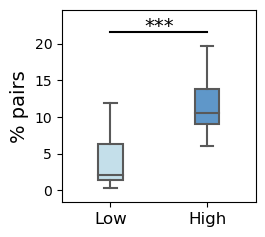

In [252]:
plot_box_plot2_no_line(inc_pairs_low_bs_tot,inc_pairs_hi_bs_tot,'% pairs',2,[2,5])
plt.savefig('percent_pairs_low_vs_hi_speed_bs_motion_resp_all_sess.svg',dpi=1200,bbox_inches='tight')

In [94]:
mean_event_hi_bs=np.zeros(len(sess_list))
mean_event_low_bs=np.zeros(len(sess_list))
median_event_hi_bs=np.zeros(len(sess_list))
median_event_low_bs=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    mean_event_hi_bs[i],median_event_hi_bs[i]=sig_corr_event_rate_motion_resp(sess_list[i],1,2)
    mean_event_low_bs[i],median_event_hi_bs[i]=sig_corr_event_rate_motion_resp(sess_list[i],1,1)

/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in greater


In [97]:
mean_event_hi_bs_145Hz=np.array([4.78897357, 4.57994886, 4.6764169 , 5.33261413, 4.90863711,
       6.20743579, 5.81239274, 3.43403472, 6.14131071, 2.24288325,
       3.79216191])
median_event_hi_bs_145Hz=np.array([0.84745763, 0.87509944, 0.6022318 , 0.67924528, 0.87046632,
       1.05469962, 0.86434574, 0.47244094, 0.        , 0.49607276,
       0.55337791])
median_event_low_bs_145Hz=np.array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
mean_event_low_bs_145Hz=np.array([0.79903148, 1.07623422, 0.73052904, 0.81169344, 0.96072205,
       1.24220495, 1.04586996, 0.61780739, 0.        , 0.44837345,
       0.66511768])

In [99]:
mean_event_hi_bs_tot=np.concatenate((mean_event_hi_bs,mean_event_hi_bs_145Hz))
median_event_hi_bs_tot=np.concatenate((median_event_hi_bs,mean_event_hi_bs_145Hz))
mean_event_low_bs_tot=np.concatenate((mean_event_low_bs,mean_event_low_bs_145Hz))
median_event_low_bs_tot=np.concatenate((median_event_low_bs,median_event_low_bs_145Hz))

WilcoxonResult(statistic=0.0, pvalue=2.7015948487105512e-05)


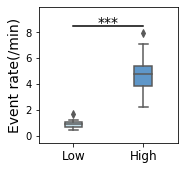

In [112]:
plot_box_plot2_no_line(mean_event_low_bs_tot,mean_event_hi_bs_tot,'Event rate(/min)',0.5,[1,2.0])
plt.savefig('hi_low_separate_corr_pairs_all_sess_event_rate.svg',dpi=1200,bbox_inches='tight')

## Adjusted correlation coefficient

In [206]:
mean_corr_hi=np.zeros(len(sess_list))
median_corr_hi=np.zeros(len(sess_list))
mean_corr_low=np.zeros(len(sess_list))
median_corr_low=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    mean_corr_hi[i],median_corr_hi[i],_=sig_corr_pair_value_motion_resp_non_bias(sess_list[i],1,2)
    mean_corr_low[i],median_corr_low[i],_=sig_corr_pair_value_motion_resp_non_bias(sess_list[i],1,1)

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

In [210]:
mean_corr_hi_145Hz=np.array([0.09933196, 0.08805876, 0.08813892, 0.11197574, 0.07103361,
       0.10305079, 0.07987731, 0.15209698, 0.07648033, 0.07583109,
       0.07848657, 0.07562767])
mean_corr_low_145Hz=np.array([0.24413085, 0.11281747, 0.10878477, 0.09318455, 0.22923166,
       0.09196452, 0.13956255, 0.29844062, 0.43317257, 0.        ,
       0.11785977, 0.37101894])
median_corr_hi_145Hz=np.array([0.06692737, 0.0758294 , 0.07599827, 0.10214754, 0.05513515,
       0.08814068, 0.06073625, 0.11345605, 0.05423057, 0.05092776,
       0.06458213, 0.05142819])
median_corr_low_145Hz=np.array([2.43096636e-01, 9.10077455e-02, 8.53743740e-02, 7.51530258e-02,
       1.87335731e-01, 6.84449350e-02, 9.53676777e-02, 2.74681277e-01,
       4.08650513e-01, 0.00000000e+00, 1.08420217e-17, 2.76022176e-01])
mean_corr_hi_tot=np.concatenate((mean_corr_hi,mean_corr_hi_145Hz))
median_corr_hi_tot=np.concatenate((median_corr_hi,median_corr_hi_145Hz))
mean_corr_low_tot=np.concatenate((mean_corr_low,mean_corr_low_145Hz))
median_corr_low_tot=np.concatenate((median_corr_low,median_corr_low_145Hz))

In [232]:
def plot_box_plot2_no_line_stim(a,b,ylabel_str,sig_bar,space):
    data={'Baseline': a,'Stim': b}
    idx=np.squeeze(np.argwhere(a==0))
    df=pd.DataFrame(data)
    idx2=np.squeeze(np.argwhere(b==0))
    if np.size(idx2)>1:
        idx=np.union1d(idx,idx2)
    if np.size(idx)==0:
        df=df
    if np.size(idx)==1:
        df=df.drop([idx])
    if np.size(idx)>1:
        df=df.drop(idx)
    print(df)
    plt.figure(figsize=(2.5, 2.5))
    # To change colors - https://paletton.com/#uid=b4S3r071kgcMAbXJNj6zcv6qRyWf1kkuGAbXJNj6zcv6qRyWf1kdKfnbXJNj6zcv6qRyWf1 
    my_pal = {"Baseline": "#0C9FC3", "Stim": "#C50632"}
    #my_pal = {"Baseline": "#0C9FC3", "Stim": "#C70017"}
    # C70039, C70017
    ax=sns.boxplot(data=df,palette=my_pal,width=0.25)
    #print(df.describe())
    
    ax.set_ylabel(ylabel_str,fontsize=14)
    ax.set_xticks([0,1])
    ax.set_xticklabels(['Baseline','Stimulation'],fontsize=12)
    print(ss.wilcoxon(df['Baseline'],df['Stim']))
    y_max=max(max(df['Baseline']),max(df['Stim']))
    y_min=min(min(df['Baseline']),min(df['Stim']))
    # Add significance bar ,bbox tight 
    if ss.wilcoxon(df['Baseline'],df['Stim'])[1]<0.05:
        ax.plot([0,1],[y_max+sig_bar,y_max+sig_bar], 'k')
        if ss.wilcoxon(df['Baseline'],df['Stim'])[1]>0.01:
            ax.text(0.5,y_max+sig_bar, '*', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(df['Baseline'],df['Stim'])[1]<0.01 and ss.wilcoxon(df['Baseline'],df['Stim'])[1]>0.001:
            ax.text(0.5,y_max+sig_bar, '**', horizontalalignment='center', fontsize=14)
        if ss.wilcoxon(df['Baseline'],df['Stim'])[1]<0.001:
            ax.text(0.5,y_max+sig_bar, '***', horizontalalignment='center', fontsize=14)
    ax.set_xticklabels(labels=ax.get_xticklabels(), fontsize=12)  
    ax.set_ylim([y_min-space[0],y_max+space[1]])

             Low      High
0   7.443037e-02  0.151886
1   1.584921e-01  0.071450
2   1.675267e-01  0.057648
3   1.027311e-01  0.070858
4   7.931133e-02  0.088730
5   1.086813e-01  0.057363
6   2.111925e-01  0.061717
7   1.056257e-01  0.059189
8   1.989166e-01  0.050693
9   1.464543e-01  0.066785
10  1.843865e-01  0.055957
12  2.413111e-01  0.054129
13  1.964676e-01  0.052088
14  2.430966e-01  0.066927
15  9.100775e-02  0.075829
16  8.537437e-02  0.075998
17  7.515303e-02  0.102148
18  1.873357e-01  0.055135
19  6.844493e-02  0.088141
20  9.536768e-02  0.060736
21  2.746813e-01  0.113456
22  4.086505e-01  0.054231
24  1.084202e-17  0.064582
25  2.760222e-01  0.051428
WilcoxonResult(statistic=32.0, pvalue=0.0003223419189453125)


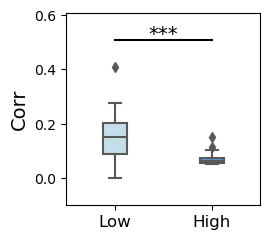

In [254]:
plot_box_plot2_no_line(median_corr_low_tot,median_corr_hi_tot,'Corr',0.1,[0.1,0.2])
plt.savefig('median_corr_sig_pairs_low_vs_hi_speed_bs_separate_motion_resp_all_sess_adjusted.svg',dpi=1200,bbox_inches='tight')

In [260]:
ss.wilcoxon(inc_pairs_hi_bs_tot,inc_pairs_low_bs_tot)

WilcoxonResult(statistic=5.0, pvalue=2.256819062805369e-05)

In [255]:
f=h5py.File('corr_hi_bs_vs_low_bs.h5',"w")
dset1 = f.create_dataset('hi_bs_percent', data=inc_pairs_hi_bs_tot)
dset1 = f.create_dataset('low_bs_percent', data=inc_pairs_low_bs_tot)
dset1 = f.create_dataset('low_bs_corr', data=median_corr_low_tot)
dset1 = f.create_dataset('hi_bs_corr', data=median_corr_hi_tot)
f.close()

         Low      High
0   0.095820  0.173051
1   0.202297  0.088084
2   0.201937  0.072577
3   0.132595  0.080461
4   0.098189  0.106195
5   0.133437  0.065905
6   0.270093  0.073681
7   0.135848  0.078423
8   0.234154  0.076169
9   0.188554  0.083525
10  0.213629  0.068509
12  0.238534  0.076848
13  0.251656  0.087900
14  0.244131  0.099332
15  0.112817  0.088059
16  0.108785  0.088139
17  0.093185  0.111976
18  0.229232  0.071034
19  0.091965  0.103051
20  0.139563  0.079877
21  0.298441  0.152097
22  0.433173  0.076480
24  0.117860  0.078487
25  0.371019  0.075628
WilcoxonResult(statistic=17.0, pvalue=2.467632293701172e-05)


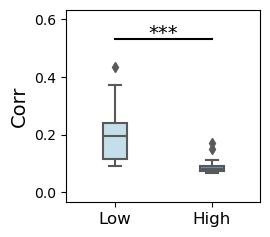

In [213]:
plot_box_plot2_no_line(mean_corr_low_tot,mean_corr_hi_tot,'Corr',0.1,[0.1,0.2])
plt.savefig('mean_corr_sig_pairs_low_vs_hi_speed_bs_separate_motion_resp_all_sess_adjusted.svg',dpi=1200,bbox_inches='tight')

In [114]:
def bs_periods_motion_resp_event_rate_corr(sess_name):
    os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Trace_analysis/Final_codes/')
    f1 = h5py.File("Shuffle_matrices_binary_motion_resp_all_bs_periods_10Hz_final.h5",'r') 
    shuffle_matrix = np.array(f1[sess_name])
    f1.close()
    
    Ncells=shuffle_matrix.shape[1]
    high_threshold=np.percentile(shuffle_matrix,97.5,axis=0)
    hi_thresholds=upper_tri_masking(high_threshold)

    middle_threshold=np.percentile(shuffle_matrix,50,axis=0)
    median_shuffle_corr=upper_tri_masking(middle_threshold)
    
    mean_shuffle_corr=np.mean(shuffle_matrix,axis=0)
    mean_shuffle_corr=upper_tri_masking(mean_shuffle_corr)
    
    
    obs_corr_matrix=obs_pearson_corr_all_bs_periods_motion_resp(sess_name)
    # Calc corr value for every pair
    obs_corr_list=upper_tri_masking(obs_corr_matrix)
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    f.close()

    traces= binary_traces_df[sess_name].T
    common_indices=remove_nan_motion_frames(sess_name)
    bs_index = common_indices
    onset_traces= onset_binary_traces_df[sess_name].T
    

    if len(bs_index)<1200:
        event_list=0
        hi_thresholds=0
        mean_shuffle_corr=0
        median_shuffle_corr=0
    else:
        bs_df=np.array(traces.loc[resp_cells,bs_index])
        bs_corr_matrix=np.corrcoef(bs_df)
        Ncells=bs_corr_matrix.shape[0]
        event_df=np.zeros((Ncells,Ncells))
        for i in np.arange(0,Ncells,1):
            for j in np.arange(0,Ncells,1):
                neuron_1=np.mean(onset_traces.loc[resp_cells[i],bs_index])
                neuron_2=np.mean(onset_traces.loc[resp_cells[j],bs_index])
                event_df[i,j]=(neuron_1+neuron_2)/2*20*60
        event_list=upper_tri_masking(event_df)
        
    return event_list,hi_thresholds,mean_shuffle_corr,median_shuffle_corr

In [247]:
def obs_pearson_corr_all_bs_periods_motion_resp(sess_name):
    traces= binary_traces_df[sess_name].T
    common_indices=remove_nan_motion_frames(sess_name)
    Ncells=traces.shape[0]
    os.chdir( '/home/hanlabadmins/Codes_git/Stimulation-Project/Trace_analysis/Final_codes/')
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    Ncells= resp_cells.shape[0]
    f.close()
    speed_df=(traces.loc[resp_cells,common_indices])
    corr_matrix=np.corrcoef(speed_df)
    return corr_matrix

In [117]:
event_list,high_threshold,mean_shuffle_corr,median_shuffle_corr=bs_periods_motion_resp_event_rate_corr(sess_list[0])
for i in np.arange(1,len(sess_list),1):
    print(i)
    a,b,c,d=bs_periods_motion_resp_event_rate_corr(sess_list[i])
    event_list=np.append(event_list,a)
    high_threshold=np.append(high_threshold,b)
    mean_shuffle_corr=np.append(mean_shuffle_corr,c)
    median_shuffle_corr=np.append(median_shuffle_corr,d)

1
2
3
4
5
6
7
8
9
10
11
12
13


In [119]:
f=h5py.File('shuffles_corr_vs_event_rate_10Hz_final.h5',"w")
dset1 = f.create_dataset('event', data=event_list)
dset1 = f.create_dataset('threshold', data=high_threshold)
dset1 = f.create_dataset('median_shuffles', data=median_shuffle_corr)
dset1 = f.create_dataset('mean_shuffles', data=mean_shuffle_corr)
f.close()

In [120]:
idx=np.argsort(event_list)
sort_event_list=np.sort(event_list)
sort_high_threshold=high_threshold[idx]
median_shuffle_corr=median_shuffle_corr[idx]
mean_shuffle_corr=mean_shuffle_corr[idx]

In [121]:
split_event_part = np.array_split(sort_event_list, 5)
split_hi_thresh_part = np.array_split(sort_high_threshold, 5)
median_shuffle_corr_split_part = np.array_split(median_shuffle_corr, 5)
mean_shuffle_corr_split_part = np.array_split(mean_shuffle_corr, 5)

In [122]:
min_event=np.zeros((5,1))
max_event=np.zeros((5,1))

for i in np.arange(0,5,1):
    min_event[i]=min(split_event_part[i])
    max_event[i]=max(split_event_part[i])
print(min_event)
print(max_event)
label_lst = []
 
for i in np.arange(0,5,1):
    label_lst.append(str(np.round(min_event[i],2))+'-'+str(np.round(max_event[i],2)))
label_lst    

[[0.08036701]
 [1.74798245]
 [2.29045977]
 [2.83293708]
 [3.57633192]]
[[ 1.74798245]
 [ 2.29045977]
 [ 2.83293708]
 [ 3.57633192]
 [10.04789497]]


['[0.08]-[1.75]',
 '[1.75]-[2.29]',
 '[2.29]-[2.83]',
 '[2.83]-[3.58]',
 '[3.58]-[10.05]']

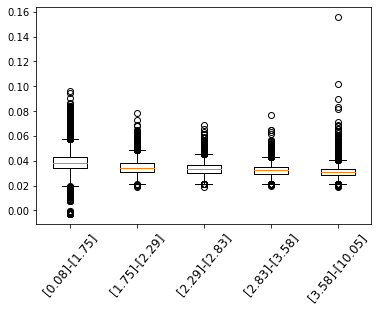

In [123]:
plt.boxplot(split_hi_thresh_part)
plt.xticks(np.arange(1,6,1), label_lst, rotation=50,fontsize=12)
plt.savefig('Threshold_event_list_10Hz.svg',dpi=1200,bbox_inches='tight')

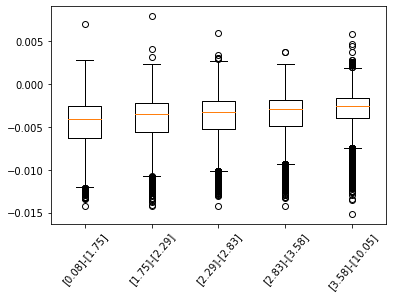

In [124]:
plt.boxplot(median_shuffle_corr_split_part)
plt.xticks(np.arange(1,6,1), label_lst, rotation=50)
plt.savefig('Median_shuffle_event_list_10Hz.svg',dpi=1200,bbox_inches='tight')

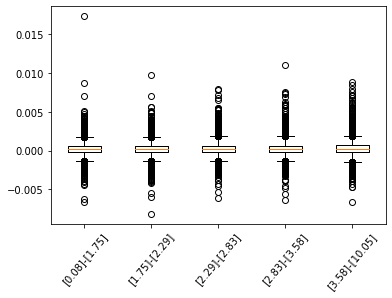

In [125]:
plt.boxplot(mean_shuffle_corr_split_part)
plt.xticks(np.arange(1,6,1), label_lst, rotation=50)
plt.savefig('Mean_shuffle_event_list_10Hz.svg',dpi=1200,bbox_inches='tight')

In [126]:
def bs_periods_motion_resp_event_rate_true_corr(sess_name):
    
    obs_corr_matrix=obs_pearson_corr_all_bs_periods_motion_resp(sess_name)
    # Calc corr value for every pair
    Ncells=obs_corr_matrix.shape[0]
    obs_corr_list=upper_tri_masking(obs_corr_matrix)
    f=h5py.File('Motion_resp_cells_sustained_10Hz_final.h5',"r")
    resp_cells=np.squeeze(np.array(f[sess_name]))
    f.close()
    traces= binary_traces_df[sess_name].T
    common_indices=remove_nan_motion_frames(sess_name)
    bs_index = common_indices
    onset_traces= onset_binary_traces_df[sess_name].T
    
    if len(bs_index)<1200:
        event_list=0
        obs_corr_list=0
    else:
        event_df=np.zeros((Ncells,Ncells))
        for i in np.arange(0,Ncells,1):
            for j in np.arange(0,Ncells,1):
                neuron_1=np.mean(onset_traces.loc[resp_cells[i],bs_index])
                neuron_2=np.mean(onset_traces.loc[resp_cells[j],bs_index])
                event_df[i,j]=(neuron_1+neuron_2)/2*20*60
        event_list=upper_tri_masking(event_df)
        
    return event_list,obs_corr_list

In [127]:
event_list2,corr_list=bs_periods_motion_resp_event_rate_true_corr(sess_list[0])
for i in np.arange(1,len(sess_list),1):
    print(i)
    a,b=bs_periods_motion_resp_event_rate_true_corr(sess_list[i])
    event_list2=np.append(event_list2,a)
    corr_list=np.append(corr_list,b)

1
2
3
4
5
6
7
8
9
10
11
12
13


In [128]:
f=h5py.File('true_corr_vs_event_rate_10Hz_final.h5',"w")
dset1 = f.create_dataset('event', data=event_list2)
dset1 = f.create_dataset('corr', data=corr_list)
f.close()

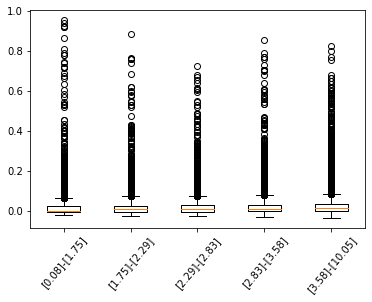

In [129]:
idx=np.argsort(event_list2)
sort_event_list2=np.sort(event_list2)
sort_corr_list=corr_list[idx]
split_event_part = np.array_split(sort_event_list2, 5)
split_corr_part=np.array_split(sort_corr_list,5)
min_event=np.zeros((5,1))
max_event=np.zeros((5,1))
median_corr=np.zeros((5,1))
mean_corr=np.zeros((5,1))
for i in np.arange(0,5,1):
    min_event[i]=min(split_event_part[i])
    max_event[i]=max(split_event_part[i])
    mean_corr[i]=np.mean(split_corr_part[i])
    median_corr[i]=np.median(split_corr_part[i])
label_lst = []
 
for i in np.arange(0,5,1):
    label_lst.append(str(np.round(min_event[i],2))+'-'+str(np.round(max_event[i],2)))
label_lst    

plt.boxplot(split_corr_part)
plt.xticks(np.arange(1,6,1), label_lst, rotation=50)
plt.savefig('True_corr_event_list_10Hz.svg',dpi=1200,bbox_inches='tight')

## Baseline vs stim

In [229]:
inc_pairs_hi_bs=np.zeros(len(sess_list))
inc_pairs_hi_stim=np.zeros(len(sess_list))
dec_pairs_hi_bs=np.zeros(len(sess_list))
dec_pairs_hi_stim=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    inc_pairs_hi_bs[i],dec_pairs_hi_bs[i]=sig_corr_pairs_motion_resp(sess_list[i],1,2)
    inc_pairs_hi_stim[i],dec_pairs_hi_stim[i]=sig_corr_pairs_motion_resp(sess_list[i],2,2)

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

     Baseline      Stim
0   11.107846  8.874522
1   17.942724  6.312098
2   10.149254  4.865672
3   14.783935  5.477885
4    9.717928  5.756175
5   11.919254  5.755886
6   19.629750  4.776554
7    8.772580  4.705882
8   12.844104  6.396495
9   17.734724  5.392223
10   9.092543  6.163522
11  11.396011  3.988604
12  10.154905  5.507745
13   8.888889  6.464646
WilcoxonResult(statistic=0.0, pvalue=0.0001220703125)


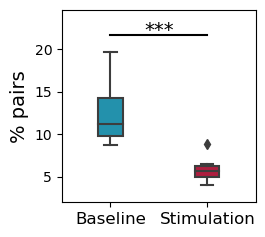

In [234]:
plot_box_plot2_no_line_stim(inc_pairs_hi_bs,inc_pairs_hi_stim,'% pairs',2,[2,5])
plt.savefig('percent_pairs_hi_speed_stim_vs_bs_motion_resp.svg',dpi=1200,bbox_inches='tight')

In [227]:
inc_pairs_low_bs=np.zeros(len(sess_list))
inc_pairs_low_stim=np.zeros(len(sess_list))
dec_pairs_low_bs=np.zeros(len(sess_list))
dec_pairs_low_stim=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    inc_pairs_low_bs[i],dec_pairs_low_bs[i]=sig_corr_pairs_motion_resp(sess_list[i],1,1)
    inc_pairs_low_stim[i],dec_pairs_low_stim[i]=sig_corr_pairs_motion_resp(sess_list[i],2,1)

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

    Baseline      Stim
0  10.255657  4.378490
1   2.104033  0.876680
2   1.487562  1.412935
3   2.206406  0.460092
4   8.631076  2.011155
6   0.512737  0.232081
9  11.854762  2.370952
WilcoxonResult(statistic=0.0, pvalue=0.015625)


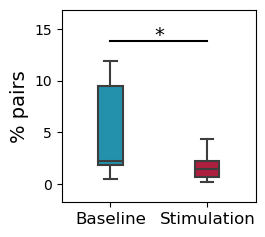

In [233]:
plot_box_plot2_no_line_stim(inc_pairs_low_bs,inc_pairs_low_stim,'% pairs',2,[2,5])
plt.savefig('percent_pairs_low_speed_stim_vs_bs_motion_resp.svg',dpi=1200,bbox_inches='tight')

In [237]:
idx=np.squeeze(np.argwhere(inc_pairs_low_bs==0))
idx2=np.squeeze(np.argwhere(inc_pairs_low_stim==0))
idx_final=np.union1d(idx,idx2)
inc_pairs_low_bs=np.delete(inc_pairs_low_bs,idx_final)
inc_pairs_low_stim=np.delete(inc_pairs_low_stim,idx_final)

In [238]:
f=h5py.File('percent_corr_pairs_10Hz.h5',"w")
dset1 = f.create_dataset('hi_bs', data=inc_pairs_hi_bs)
dset1 = f.create_dataset('hi_stim', data=inc_pairs_hi_stim)
dset1 = f.create_dataset('low_bs', data=inc_pairs_low_bs)
dset1 = f.create_dataset('low_stim', data=inc_pairs_low_stim)
f.close()

In [218]:
mean_corr_hi_bs=np.zeros(len(sess_list))
median_corr_hi_bs=np.zeros(len(sess_list))
mean_corr_hi_stim=np.zeros(len(sess_list))
median_corr_hi_stim=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    mean_corr_hi_bs[i],median_corr_hi_bs[i],_=sig_corr_pair_value_motion_resp_non_bias(sess_list[i],1,2)
    mean_corr_hi_stim[i],median_corr_hi_stim[i],_=sig_corr_pair_value_motion_resp_non_bias(sess_list[i],2,2)

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[N

C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\sudiksha\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


WilcoxonResult(statistic=1.0, pvalue=0.000244140625)


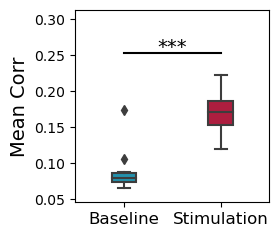

In [220]:
plot_box_plot2_no_line_stim(mean_corr_hi_bs,mean_corr_hi_stim,'Mean Corr',0.03,[0.02,0.09])
plt.savefig('mean_corr_hi_speed_stim_vs_bs_motion_resp_adjusted.svg',dpi=1200,bbox_inches='tight')

    Baseline      Stim
0   0.153689  0.134115
1   0.071670  0.164525
2   0.057356  0.168681
3   0.070817  0.156588
4   0.088702  0.128822
5   0.057348  0.108112
6   0.061586  0.154960
7   0.059166  0.117108
8   0.050807  0.132613
9   0.066659  0.188567
10  0.055699  0.125054
11  0.070092  0.162429
12  0.054340  0.131796
13  0.052893  0.132290
WilcoxonResult(statistic=1.0, pvalue=0.000244140625)


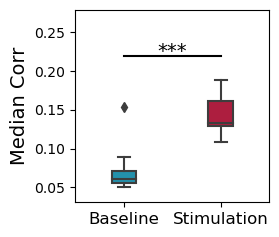

In [240]:
plot_box_plot2_no_line_stim(median_corr_hi_bs,median_corr_hi_stim,'Median Corr',0.03,[0.02,0.09])
plt.savefig('median_corr_hi_speed_stim_vs_bs_motion_resp_adjusted.svg',dpi=1200,bbox_inches='tight')

In [151]:
mean_event_hi_bs=np.zeros(len(sess_list))
mean_event_hi_stim=np.zeros(len(sess_list))
median_event_hi_bs=np.zeros(len(sess_list))
median_event_hi_stim=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    mean_event_hi_bs[i],median_event_hi_bs[i]=sig_corr_event_rate_motion_resp(sess_list[i],1,2)
    mean_event_hi_stim[i],median_event_hi_stim[i]=sig_corr_event_rate_motion_resp(sess_list[i],2,2)

/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in greater


WilcoxonResult(statistic=29.0, pvalue=0.1401460614684125)


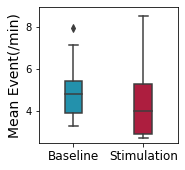

In [152]:
plot_box_plot2_no_line_stim(mean_event_hi_bs,mean_event_hi_stim,'Mean Event(/min)',0.1,[0.25,0.45])
plt.savefig('mean_event_hi_speed_stim_vs_bs_motion_resp_adjusted.svg',dpi=1200,bbox_inches='tight')

WilcoxonResult(statistic=29.0, pvalue=0.1401460614684125)


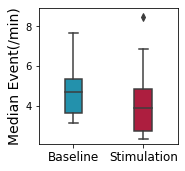

In [153]:
plot_box_plot2_no_line_stim(median_event_hi_bs,median_event_hi_stim,'Median Event(/min)',0.1,[0.25,0.45])
plt.savefig('median_event_hi_speed_stim_vs_bs_motion_resp_adjusted.svg',dpi=1200,bbox_inches='tight')

In [244]:
f=h5py.File('corr_strength_bs_vs_stim_10Hz.h5',"w")
dset1 = f.create_dataset('hi_bs', data=median_corr_hi_bs)
dset1 = f.create_dataset('hi_stim', data=median_corr_hi_stim)
dset1 = f.create_dataset('low_bs', data=median_corr_low_bs)
dset1 = f.create_dataset('low_stim', data=median_corr_low_stim)
f.close()

WilcoxonResult(statistic=0.0, pvalue=0.015625)


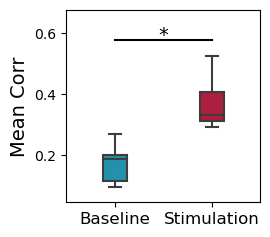

In [225]:
plot_box_plot2_no_line_stim(mean_corr_low_bs,mean_corr_low_stim,'Mean Corr',0.05,[0.05,0.15])
plt.savefig('mean_corr_low_speed_stim_vs_bs_motion_resp_adjusted.svg',dpi=1200,bbox_inches='tight')

   Baseline      Stim
0  0.074430  0.311340
1  0.158492  0.343106
2  0.167527  0.310102
3  0.102731  0.287240
4  0.079367  0.318067
5  0.211193  0.578660
6  0.146454  0.240468
WilcoxonResult(statistic=0.0, pvalue=0.015625)


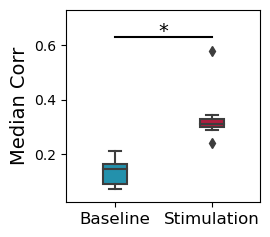

In [245]:
plot_box_plot2_no_line_stim(median_corr_low_bs,median_corr_low_stim,'Median Corr',0.05,[0.05,0.15])
plt.savefig('median_corr_low_speed_stim_vs_bs_motion_resp_adjusted.svg',dpi=1200,bbox_inches='tight')

In [216]:
f1 = h5py.File("Corr_list_hi_low_bs_stim_sig_pairs_10Hz_final2.h5", 'w')
dset1 = f1.create_dataset('hi_bs', data=hi_bs_corr_list)
dset1 = f1.create_dataset('low_bs', data=low_bs_corr_list)
dset1 = f1.create_dataset('hi_stim', data=hi_stim_corr_list)
dset1 = f1.create_dataset('low_stim', data=low_stim_corr_list)
f1.close()

In [112]:
# Add event rates

In [154]:
mean_event_low_bs=np.zeros(len(sess_list))
mean_event_low_stim=np.zeros(len(sess_list))
median_event_low_bs=np.zeros(len(sess_list))
median_event_low_stim=np.zeros(len(sess_list))
for i in np.arange(0,len(sess_list),1):
    mean_event_low_bs[i],median_event_low_bs[i]=sig_corr_event_rate_motion_resp(sess_list[i],1,1)
    mean_event_low_stim[i],median_event_low_stim[i]=sig_corr_event_rate_motion_resp(sess_list[i],2,1)

/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in greater


WilcoxonResult(statistic=0.0, pvalue=0.017960477526078766)


/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/scipy/stats/morestats.py:2879: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")
/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/scipy/stats/morestats.py:2879: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


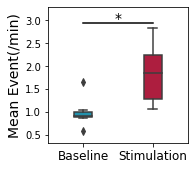

In [155]:
plot_box_plot2_no_line_stim(mean_event_low_bs,mean_event_low_stim,'Mean Event(/min)',0.1,[0.25,0.45])
plt.savefig('mean_event_low_speed_stim_vs_bs_motion_resp_10Hz.svg',dpi=1200,bbox_inches='tight')

WilcoxonResult(statistic=0.0, pvalue=0.017960477526078766)


/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/scipy/stats/morestats.py:2879: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")
/home/hanlabadmins/anaconda3/lib/python3.7/site-packages/scipy/stats/morestats.py:2879: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


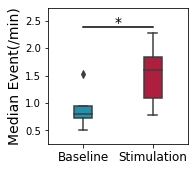

In [156]:
plot_box_plot2_no_line_stim(median_event_low_bs,median_event_low_stim,'Median Event(/min)',0.1,[0.25,0.45])
plt.savefig('median_event_low_speed_stim_vs_bs_motion_resp_10Hz.svg',dpi=1200,bbox_inches='tight')

## Fisher's exact test

In [201]:
# 10 Hz 
table =[(772,2474),(1813-772,3155-2474)]
print(table)

[(772, 2474), (1041, 681)]


In [207]:
ss.fisher_exact(table)

(0.20413336160041376, 1.1750857949087062e-142)

In [209]:
# 145 Hz
table =[(1044,2003),(2292-1044,2739-2003)]
print(table)
print(ss.fisher_exact(table))

[(1044, 2003), (1248, 736)]
(0.30738507623180616, 5.239223112723324e-89)


## Inhibited vs non-inhibited 

In [210]:
# 10 Hz 
table =[(360,1214),(1813-360,3155-1214)]
print(table)
print(ss.fisher_exact(table))

[(360, 1214), (1453, 1941)]
(0.39613547384211045, 1.0635106359620386e-43)


In [211]:
# 145 Hz 
table =[(482,1094),(2292-482,2739-1094)]
print(table)
print(ss.fisher_exact(table))

[(482, 1094), (1810, 1645)]
(0.40042118234064256, 5.90957442230872e-48)


In [ ]:
### 10 Hz vs 145 Hz 

In [212]:
table =[(772,1044),(1813-482,2292-1094)]
print(table)
print(ss.fisher_exact(table))

[(772, 1044), (1331, 1198)]
(0.6655727983741663, 5.352627576611427e-11)


### Calcualting standard error - Fisher's exact test

In [275]:
1.96*np.sqrt((0.43*(1-0.43))/(712+1041))

0.023175908572548972

In [276]:
1.96*np.sqrt((0.78*(1-0.78))/(2474+681))

0.014454897995825864

In [277]:
1.96*np.sqrt((0.45*(1-0.45))/(1044+1248))

0.020367436282777082

In [278]:
1.96*np.sqrt((0.45*(1-0.45))/(1044+1248))

0.020367436282777082

In [279]:
1.96*np.sqrt((0.73*(1-0.73))/(2003+736))

0.01662659688531771

In [287]:
1.96*np.sqrt((0.17*(1-0.17))/(1423))

0.019517182728160668

In [ ]:
## Check if asymmetric is ok over time series 

## Movement spectral Power 

In [133]:
sess_list=[]
for mouse, cell_df in binary_traces_df.groupby(level='mouse', axis=1):
    sess_list.append(mouse)

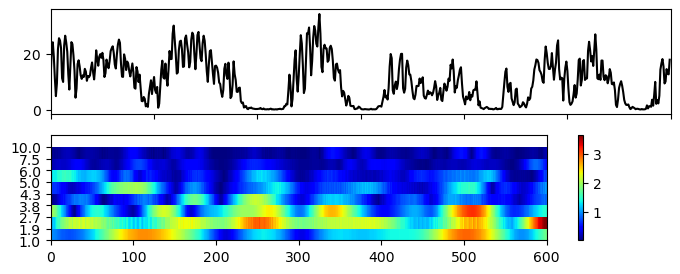

In [220]:
sess_name=sess_list[1]
stim_on_inds=stim_onsets_df.loc[sess_name,:]
stim_off_inds=stim_offsets_df.loc[sess_name,:]
processed_motion=raw_motion_df.loc[sess_name,:]
motion=np.array(processed_motion)
f, (ax1, ax2) = plt.subplots(2, 1,figsize=(8,3),sharex=True,gridspec_kw={'height_ratios':[1,1]})

ax1.plot(motion[stim_on_inds[0]:stim_off_inds[0]-597],color='k')
#ax1.set_xticks(np.arange(5000,6500,1000))
#ax1.set_xticklabels(np.arange(0,250,50))
minS=3
maxS=100
N = motion.shape[0]
a= np.arange(0,N,1)
waveletName = 'cmor14.0-1.5'
f = np.empty((maxS-minS,1))
dt=0.05

for j in range(minS,maxS):
    f[j-minS]=pywt.scale2frequency(waveletName , j)*(1/dt)
[intF,inds] = np.unique(np.floor(f),return_index=True)
scales = inds+minS
[coefficients, frequencies] = pywt.cwt(motion, scales, waveletName, dt)
coefficients=abs(coefficients)
coefficients= coefficients.T
coefficients=abs(coefficients)
#df=pd.DataFrame(coefficients)
#ax2=sns.heatmap(coefficients[4000:6001,:].T,cmap='jet')
pc=ax2.pcolormesh(coefficients[stim_on_inds[0]:stim_off_inds[0]-597,:].T,cmap='jet')
#ax2.invert_yaxis()
fig.colorbar(pc)
ax2.set_yticks(np.arange(1,frequencies.shape[0]+1,1))
ax2.set_yticklabels(np.round(frequencies,1))
ax2.set_ylim([1,10])
ax2.set_xticks(np.arange(0,700,100))
#ax2.set_xticklabels(np.arange(0,70,10))
#ax1.set_xticks(np.arange(,6500,1000))
#ax1.set_xticklabels(np.arange(0,250,50))
plt.savefig('spect_with_motion_stim_'+sess_name +'_.svg',dpi=1200)

In [157]:
np.size(motion[stim_on_inds[0]:stim_off_inds[0]-597])

600

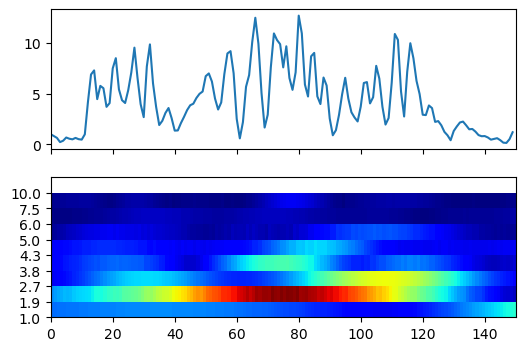

In [148]:
sess_name=sess_list[4]
stim_on_inds=stim_onsets_df.loc[sess_name,:]
stim_off_inds=stim_offsets_df.loc[sess_name,:]
processed_motion=raw_motion_df.loc[sess_name,:]
motion=np.array(processed_motion)
f, (ax1, ax2) = plt.subplots(2, 1,figsize=(6,4),sharex=True,gridspec_kw={'height_ratios':[1,1]})

ax1.plot(motion[stim_on_inds[0]+30:stim_on_inds[0]+180])
#ax1.set_xticks(np.arange(5000,6500,1000))
#ax1.set_xticklabels(np.arange(0,250,50))
minS=3
maxS=100
N = motion.shape[0]
a= np.arange(0,N,1)
waveletName = 'cmor14.0-1.5'
f = np.empty((maxS-minS,1))
dt=0.05

for j in range(minS,maxS):
    f[j-minS]=pywt.scale2frequency(waveletName , j)*(1/dt)
[intF,inds] = np.unique(np.floor(f),return_index=True)
scales = inds+minS
[coefficients, frequencies] = pywt.cwt(motion, scales, waveletName, dt)
coefficients=abs(coefficients)
coefficients= coefficients.T
coefficients=abs(coefficients)
#df=pd.DataFrame(coefficients)
#ax2=sns.heatmap(coefficients[4000:6001,:].T,cmap='jet')
ax2.pcolormesh(coefficients[stim_on_inds[0]+30:stim_on_inds[0]+180,:].T,cmap='jet')
#ax2.invert_yaxis()
ax2.set_yticks(np.arange(1,frequencies.shape[0]+1,1))
ax2.set_yticklabels(np.round(frequencies,1))
ax2.set_ylim([1,10])
#ax2.set_xticks(np.arange(stim_on_inds[0],stim_off_inds[0]+2,200))
#ax2.set_xticklabels(np.arange(0,70,10))
#ax1.set_xticks(np.arange(,6500,1000))
#ax1.set_xticklabels(np.arange(0,250,50))
plt.savefig('spect_with_motion_stim_'+sess_name +'_zoom2.png',dpi=1200)

(1.0, 10.0)

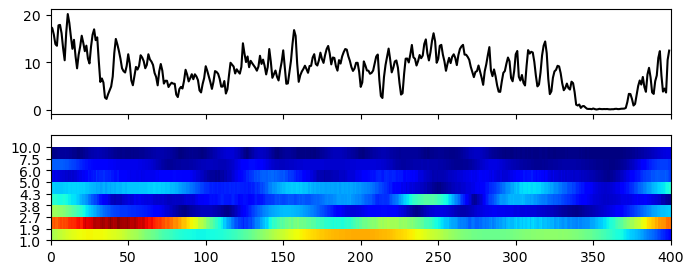

In [226]:
sess_name=sess_list[0]
stim_on_inds=stim_onsets_df.loc[sess_name,:]
stim_off_inds=stim_offsets_df.loc[sess_name,:]
processed_motion=raw_motion_df.loc[sess_name,:]
motion=np.array(processed_motion)
f, (ax1, ax2) = plt.subplots(2, 1,figsize=(8,3),sharex=True,gridspec_kw={'height_ratios':[1,1]})

ax1.plot(motion[stim_off_inds[0]-400:stim_off_inds[0]],color='k')
#ax1.set_xticks(np.arange(5000,6500,1000))
#ax1.set_xticklabels(np.arange(0,250,50))
minS=3
maxS=100
N = motion.shape[0]
a= np.arange(0,N,1)
waveletName = 'cmor14.0-1.5'
f = np.empty((maxS-minS,1))
dt=0.05

for j in range(minS,maxS):
    f[j-minS]=pywt.scale2frequency(waveletName , j)*(1/dt)
[intF,inds] = np.unique(np.floor(f),return_index=True)
scales = inds+minS
[coefficients, frequencies] = pywt.cwt(motion, scales, waveletName, dt)
coefficients=abs(coefficients)
coefficients= coefficients.T
coefficients=abs(coefficients)
#df=pd.DataFrame(coefficients)
#ax2=sns.heatmap(coefficients[4000:6001,:].T,cmap='jet')
ax2.pcolormesh(coefficients[stim_off_inds[0]-400:stim_off_inds[0],:].T,cmap='jet')
#ax2.invert_yaxis()
ax2.set_yticks(np.arange(1,frequencies.shape[0]+1,1))
ax2.set_yticklabels(np.round(frequencies,1))
#ax2.set_xticks(np.arange(stim_on_inds[0],stim_off_inds[0]+2,200))
#ax2.set_xticklabels(np.arange(0,70,10))
#ax1.set_xticks(np.arange(,6500,1000))
#ax1.set_xticklabels(np.arange(0,250,50))
ax2.set_ylim([1,10])
#plt.savefig('spect_with_motion_stim_'+sess_name +'_zoom3_option1.svg',dpi=1200)

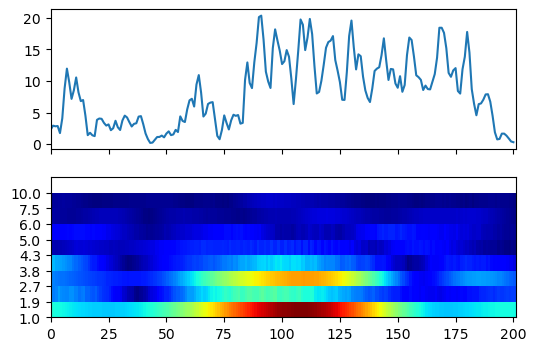

In [42]:
sess_name=sess_list[4]
stim_on_inds=stim_onsets_df.loc[sess_name,:]
stim_off_inds=stim_offsets_df.loc[sess_name,:]
processed_motion=raw_motion_df.loc[sess_name,:]
motion=np.array(processed_motion)
f, (ax1, ax2) = plt.subplots(2, 1,figsize=(6,4),sharex=True,gridspec_kw={'height_ratios':[1,1]})

ax1.plot(motion[stim_off_inds[0]-200:stim_off_inds[0]+1])
#ax1.set_xticks(np.arange(5000,6500,1000))
#ax1.set_xticklabels(np.arange(0,250,50))
minS=3
maxS=100
N = motion.shape[0]
a= np.arange(0,N,1)
waveletName = 'cmor14.0-1.5'
f = np.empty((maxS-minS,1))
dt=0.05

for j in range(minS,maxS):
    f[j-minS]=pywt.scale2frequency(waveletName , j)*(1/dt)
[intF,inds] = np.unique(np.floor(f),return_index=True)
scales = inds+minS
[coefficients, frequencies] = pywt.cwt(motion, scales, waveletName, dt)
coefficients=abs(coefficients)
coefficients= coefficients.T
coefficients=abs(coefficients)
#df=pd.DataFrame(coefficients)
#ax2=sns.heatmap(coefficients[4000:6001,:].T,cmap='jet')
ax2.pcolormesh(coefficients[stim_off_inds[0]-200:stim_off_inds[0]+1,:].T,cmap='jet')
#ax2.invert_yaxis()
ax2.set_yticks(np.arange(1,frequencies.shape[0]+1,1))
ax2.set_yticklabels(np.round(frequencies,1))
ax2.set_ylim([1,10])
#ax2.set_xticks(np.arange(stim_on_inds[0],stim_off_inds[0]+2,200))
#ax2.set_xticklabels(np.arange(0,70,10))
#ax1.set_xticks(np.arange(,6500,1000))
#ax1.set_xticklabels(np.arange(0,250,50))
plt.savefig('spect_with_motion_stim_'+sess_name +'_zoom.png',dpi=1200)

## Event rate across sessions 

In [71]:
def baseline_firing_rate_cell_wise(traces_df,sess_no):
    onset_binary_traces=traces_df[sess_no]
    onset_binary_traces=onset_binary_traces.T
    baseline_indices=remove_nan_motion_frames(sess_no)
    temp_df=onset_binary_traces.loc[:,baseline_indices]
    Ncells = temp_df.shape[0]
    out= np.zeros((Ncells,1))
    for cell in np.arange(0,Ncells,1):
        #out[cell]=out[cell]+np.array(np.where(temp_df.loc[cell,:]==1)).size
        out[cell]=out[cell]+np.sum(temp_df.loc[cell,:])
    tot_frames=(baseline_indices.shape[0])
    p=out/tot_frames*20
    
    return p,np.mean(p)

In [72]:
p,_=baseline_firing_rate_cell_wise(binary_traces_df,sess_list[0])
for i in np.arange(1,len(sess_list),1):
    z,_=baseline_firing_rate_cell_wise(binary_traces_df,sess_list[i])
    p=np.concatenate((p,z))

In [73]:
np.mean(p)

0.25078930710694314

In [74]:
f=h5py.File('bs_activity_rate_145Hz.h5',"r")
p_2=np.array(f['event_rate'])
f.close()

In [75]:
np.size(p),np.size(p_2)

(3324, 3085)

In [76]:
p=np.concatenate((p,p_2))
np.size(p)

6409

In [77]:
np.mean(p),np.std(p)

(0.23589954254386683, 0.14755124640439626)

In [177]:
for i in np.arange(0,len(sess_list),1):
    sess_no=sess_list[i]
    onset_binary_traces=onset_binary_traces_df[sess_no]
    onset_binary_traces=onset_binary_traces.T
    baseline_indices=remove_nan_motion_frames(sess_no)
    a=moving_period_df.loc[sess_no]
    moving_frames= np.where(a==1)[0]
    high_speed_index = np.intersect1d(baseline_indices,moving_frames)
    temp_df=onset_binary_traces.loc[:,high_speed_index]
    Ncells = temp_df.shape[0]
    out= np.zeros((Ncells,1))
    for cell in np.arange(0,Ncells,1):
        #out[cell]=out[cell]+np.array(np.where(temp_df.loc[cell,:]==1)).size
        out[cell]=out[cell]+np.sum(temp_df.loc[cell,:])
    tot_frames=(baseline_indices.shape[0])
    p=out/tot_frames*1200
    print(np.max(p))
    #print(np.argwhere(p==np.max(p)))

2.2118703709909853
7.266401257903717
7.2961805905472135
6.831195794126511
4.138069570457665
5.944570893024502
6.984445559458103
7.51356057054845
8.955523576854858
7.187311784782173
7.403929984575146
12.097665539069565
7.513309003247731
5.993363054335803
